# 0. Introduction (Mehmet)

NBA Shot Data Quality Assessment Report for Python and Advanced Data Science Project

Project Overview
Objective: Predict whether a given NBA shot will be made (`Shot_Made`) using contextual factors such as team momentum, player performance, shot characteristics, and game state.
Dataset: NBA 2024 regular-season shot-level data (Source: [GitHub - DomSamangy](https://github.com/DomSamangy/NBA_Shots_04_24))
Key Domain Assumptions:
- Full Court: 94 × 50 feet
- Basket Location: (0, 5.25) feet from baseline
- 3-Point Line: 23.75 ft at arc, 22 ft in corners
- Rim Height: 10 feet
- Shot distance is measured from basket center (0, 5.25)
- Distance zones: <8 ft, 8-16 ft, 16-24 ft, 24+ ft, Backcourt (40+ ft)

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import urllib.request
import zipfile
import io
import os
warnings.filterwarnings('ignore')

In [2]:
dataset_url = 'https://raw.githubusercontent.com/DomSamangy/NBA_Shots_04_24/main/NBA_2024_Shots.csv.zip'

try:
    # Download the zip file
    with urllib.request.urlopen(dataset_url) as response:
        zip_data = response.read()

    # Extract CSV from zip file
    with zipfile.ZipFile(io.BytesIO(zip_data)) as zip_file:
        # Get the CSV filename from the zip (should be NBA_2024_Shots.csv)
        csv_filename = [f for f in zip_file.namelist() if f.endswith('.csv') and not f.startswith('__MACOSX')][0]
        # Read the CSV directly from the zip
        with zip_file.open(csv_filename) as csv_file:
            df_original = pd.read_csv(csv_file)

    print(f"  ✓ Dataset downloaded and loaded successfully from GitHub")
except Exception as e:
    print(f"  ⚠️  Error downloading from URL: {e}")
    print(f"  Attempting to load from local file: ../Data/NBA_2024_Shots.csv")
    # Fallback to local file if URL download fails
    if os.path.exists('../Data/NBA_2024_Shots.csv'):
        df_original = pd.read_csv('../Data/NBA_2024_Shots.csv')
        print(f"  ✓ Loaded from local file")
    else:
        raise FileNotFoundError("Could not load dataset from URL or local file. Please check your internet connection or ensure the file exists.")

df_original.head(10)
df = df_original.copy()

  ✓ Dataset downloaded and loaded successfully from GitHub


In [3]:
df_original.columns

Index(['SEASON_1', 'SEASON_2', 'TEAM_ID', 'TEAM_NAME', 'PLAYER_ID',
       'PLAYER_NAME', 'POSITION_GROUP', 'POSITION', 'GAME_DATE', 'GAME_ID',
       'HOME_TEAM', 'AWAY_TEAM', 'EVENT_TYPE', 'SHOT_MADE', 'ACTION_TYPE',
       'SHOT_TYPE', 'BASIC_ZONE', 'ZONE_NAME', 'ZONE_ABB', 'ZONE_RANGE',
       'LOC_X', 'LOC_Y', 'SHOT_DISTANCE', 'QUARTER', 'MINS_LEFT', 'SECS_LEFT'],
      dtype='object')

In [4]:
df_original.dtypes

SEASON_1            int64
SEASON_2           object
TEAM_ID             int64
TEAM_NAME          object
PLAYER_ID           int64
PLAYER_NAME        object
POSITION_GROUP     object
POSITION           object
GAME_DATE          object
GAME_ID             int64
HOME_TEAM          object
AWAY_TEAM          object
EVENT_TYPE         object
SHOT_MADE            bool
ACTION_TYPE        object
SHOT_TYPE          object
BASIC_ZONE         object
ZONE_NAME          object
ZONE_ABB           object
ZONE_RANGE         object
LOC_X             float64
LOC_Y             float64
SHOT_DISTANCE       int64
QUARTER             int64
MINS_LEFT           int64
SECS_LEFT           int64
dtype: object

In [5]:
# Create a working copy for modifications
df = df_original.copy()

In [6]:
# Store original shape
original_shape = df.shape

# 1. INITIAL INSPECTION (Mehmet)

## 1.1 Data Types:

The initial data type inspection ensures that each column is stored in an appropriate format for subsequent analysis and modeling. String columns like TEAM_NAME, PLAYER_NAME, POSITION, and shot-related labels are explicitly converted to the string dtype for consistent handling. Numeric columns such as LOC_X, LOC_Y, SHOT_DISTANCE, QUARTER, and time-related fields are validated to be numeric types. The GAME_DATE column is converted to datetime format using the MM-DD-YYYY pattern to enable temporal analysis. The SHOT_DISTANCE column is explicitly cast to float64 to ensure precision in distance calculations. This standardization prevents type-related errors during validation and feature engineering phase. 

Team names are converted from full names (e.g., "Los Angeles Lakers") to standard 3-letter abbreviations (e.g., "LAL") to ensure consistency with `HOME_TEAM` and `AWAY_TEAM` columns. This conversion uses a comprehensive mapping dictionary containing all 30 NBA teams. The decision to use abbreviations reduces storage overhead and simplifies cross-column comparisons during semantic validation. Any unmapped team names are flagged for manual review, ensuring no data is silently lost. This standardization is essential for downstream join operations and feature engineering involving team-based aggregations.

In [7]:
print(df.dtypes)

SEASON_1            int64
SEASON_2           object
TEAM_ID             int64
TEAM_NAME          object
PLAYER_ID           int64
PLAYER_NAME        object
POSITION_GROUP     object
POSITION           object
GAME_DATE          object
GAME_ID             int64
HOME_TEAM          object
AWAY_TEAM          object
EVENT_TYPE         object
SHOT_MADE            bool
ACTION_TYPE        object
SHOT_TYPE          object
BASIC_ZONE         object
ZONE_NAME          object
ZONE_ABB           object
ZONE_RANGE         object
LOC_X             float64
LOC_Y             float64
SHOT_DISTANCE       int64
QUARTER             int64
MINS_LEFT           int64
SECS_LEFT           int64
dtype: object


In [8]:
string_columns = [
    'TEAM_NAME', 'PLAYER_NAME', 'POSITION_GROUP', 'POSITION',
    'HOME_TEAM', 'AWAY_TEAM', 'EVENT_TYPE', 'ACTION_TYPE',
    'SHOT_TYPE', 'BASIC_ZONE', 'ZONE_NAME', 'ZONE_ABB', 'ZONE_RANGE'
]
numeric_columns = ['SEASON_1', 'TEAM_ID', 'PLAYER_ID', 'GAME_ID', 'LOC_X', 'LOC_Y',
                    'SHOT_DISTANCE', 'QUARTER', 'MINS_LEFT', 'SECS_LEFT']

### 1.1.1 Fixing Data Types

In [9]:
# Convert columns to their correct data types
for col in string_columns:
    if col in df.columns:
        df[col] = df[col].astype('string')
        print(f"  ✓ {col}: Converted to string")

# Convert GAME_DATE to datetime
if 'GAME_DATE' in df.columns:
    try:
        df['GAME_DATE'] = pd.to_datetime(df['GAME_DATE'], format='%m-%d-%Y', errors='coerce')
        print(f"  ✓ GAME_DATE: Converted to datetime")
    except Exception as e:
        print(f"  ⚠️  GAME_DATE: Error converting to datetime - {e}")

# Convert SHOT_DISTANCE to float64
if 'SHOT_DISTANCE' in df.columns:
    df['SHOT_DISTANCE'] = df['SHOT_DISTANCE'].astype('float64')
    print(f"  ✓ SHOT_DISTANCE: Converted to float64")

  ✓ TEAM_NAME: Converted to string
  ✓ PLAYER_NAME: Converted to string
  ✓ POSITION_GROUP: Converted to string
  ✓ POSITION: Converted to string
  ✓ HOME_TEAM: Converted to string
  ✓ AWAY_TEAM: Converted to string
  ✓ EVENT_TYPE: Converted to string
  ✓ ACTION_TYPE: Converted to string
  ✓ SHOT_TYPE: Converted to string
  ✓ BASIC_ZONE: Converted to string
  ✓ ZONE_NAME: Converted to string
  ✓ ZONE_ABB: Converted to string
  ✓ ZONE_RANGE: Converted to string
  ✓ GAME_DATE: Converted to datetime
  ✓ SHOT_DISTANCE: Converted to float64


In [10]:
NBA_TEAMS = {
    'Atlanta Hawks': 'ATL',
    'Boston Celtics': 'BOS',
    'Brooklyn Nets': 'BKN',
    'Charlotte Hornets': 'CHA',
    'Chicago Bulls': 'CHI',
    'Cleveland Cavaliers': 'CLE',
    'Dallas Mavericks': 'DAL',
    'Denver Nuggets': 'DEN',
    'Detroit Pistons': 'DET',
    'Golden State Warriors': 'GSW',
    'Houston Rockets': 'HOU',
    'Indiana Pacers': 'IND',
    'LA Clippers': 'LAC',
    'Los Angeles Lakers': 'LAL',
    'Memphis Grizzlies': 'MEM',
    'Miami Heat': 'MIA',
    'Milwaukee Bucks': 'MIL',
    'Minnesota Timberwolves': 'MIN',
    'New Orleans Pelicans': 'NOP',
    'New York Knicks': 'NYK',
    'Oklahoma City Thunder': 'OKC',
    'Orlando Magic': 'ORL',
    'Philadelphia 76ers': 'PHI',
    'Phoenix Suns': 'PHX',
    'Portland Trail Blazers': 'POR',
    'Sacramento Kings': 'SAC',
    'San Antonio Spurs': 'SAS',
    'Toronto Raptors': 'TOR',
    'Utah Jazz': 'UTA',
    'Washington Wizards': 'WAS',
}

### 1.1.2 Converting TEAM_NAME to Abbreviations

In [11]:
# Convert TEAM_NAME to abbreviations
if 'TEAM_NAME' in df.columns:
    # Map team names to abbreviations
    original_team_names = df['TEAM_NAME'].copy()
    df['TEAM_NAME'] = df['TEAM_NAME'].map(NBA_TEAMS)
    unmapped_count = df['TEAM_NAME'].isnull().sum()

    if unmapped_count > 0:
        print(f"  ⚠️  {unmapped_count} TEAM_NAME values could not be mapped to abbreviations")
        unmapped_teams = original_team_names[df['TEAM_NAME'].isnull()].unique()
        if len(unmapped_teams) > 0:
            print(f"      Unmapped team names: {list(unmapped_teams[:5])}")
    else:
        print(f"  ✓ TEAM_NAME: All team names converted to abbreviations")

  ✓ TEAM_NAME: All team names converted to abbreviations


In [12]:
df.head(10)

,SEASON_1,SEASON_2,TEAM_ID,TEAM_NAME,PLAYER_ID,PLAYER_NAME,POSITION_GROUP,POSITION,GAME_DATE,GAME_ID,...,BASIC_ZONE,ZONE_NAME,ZONE_ABB,ZONE_RANGE,LOC_X,LOC_Y,SHOT_DISTANCE,QUARTER,MINS_LEFT,SECS_LEFT
0,2024,2023-24,1610612764,WAS,1629673,Jordan Poole,G,SG,2023-11-03,22300003,...,In The Paint (Non-RA),Center,C,8-16 ft.,-0.4,17.45,12.0,1,11,1
1,2024,2023-24,1610612764,WAS,1630166,Deni Avdija,F,SF,2023-11-03,22300003,...,Above the Break 3,Center,C,24+ ft.,1.5,30.55,25.0,1,10,26
2,2024,2023-24,1610612764,WAS,1626145,Tyus Jones,G,PG,2023-11-03,22300003,...,Restricted Area,Center,C,Less Than 8 ft.,-3.3,6.55,3.0,1,9,46
3,2024,2023-24,1610612764,WAS,1629673,Jordan Poole,G,SG,2023-11-03,22300003,...,Restricted Area,Center,C,Less Than 8 ft.,-1.0,5.85,1.0,1,8,30
4,2024,2023-24,1610612764,WAS,1626145,Tyus Jones,G,PG,2023-11-03,22300003,...,Restricted Area,Center,C,Less Than 8 ft.,-0.0,6.25,1.0,1,8,8
5,2024,2023-24,1610612764,WAS,1628398,Kyle Kuzma,F,PF,2023-11-03,22300003,...,Above the Break 3,Left Side Center,LC,24+ ft.,21.2,17.45,24.0,1,7,40
6,2024,2023-24,1610612764,WAS,1626145,Tyus Jones,G,PG,2023-11-03,22300003,...,Above the Break 3,Right Side Center,RC,24+ ft.,-22.2,17.25,25.0,1,7,8
7,2024,2023-24,1610612764,WAS,1629673,Jordan Poole,G,SG,2023-11-03,22300003,...,Above the Break 3,Left Side Center,LC,24+ ft.,19.0,20.75,24.0,1,6,38
8,2024,2023-24,1610612764,WAS,1630166,Deni Avdija,F,SF,2023-11-03,22300003,...,Restricted Area,Center,C,Less Than 8 ft.,-2.0,7.25,2.0,1,6,1
9,2024,2023-24,1610612764,WAS,1630166,Deni Avdija,F,SF,2023-11-03,22300003,...,Mid-Range,Center,C,16-24 ft.,-1.5,27.65,22.0,1,5,36


## 1.2 Missing Values

Missing value analysis identifies columns and rows with null entries to assess data completeness. The code calculates both the count and percentage of missing values for each column, filtering to display only columns with actual missing data. For rows containing missing values, the analysis extracts unique player/team combinations to identify patterns (e.g., specific players or teams with incomplete records). This approach helps determine whether missingness is random or systematic, informing the appropriate imputation or removal strategy. The analysis revealed that `POSITION_GROUP` and `POSITION` columns contained null values for specific players, which were addressed through manual mapping.
Players with missing position data are manually mapped using a predefined dictionary based on their `PLAYER_ID`. This mapping covers 9 specific players identified during the missing value analysis, assigning them appropriate position groups (G, F, C) and detailed positions (PG, SG, SF, PF, C). The decision to use manual mapping rather than imputation ensures accuracy, as player positions are factual and can be verified from official NBA rosters. This approach preserves data integrity and enables complete position-based analysis without introducing estimation errors. The code validates that all mappings were successful and reports any remaining null values.

In [13]:
missing_values = df.isnull().sum()
missing_pct = (missing_values / len(df)) * 100
missing_df = pd.DataFrame({
    'Missing Count': missing_values,
    'Missing Percentage': missing_pct
})
missing_df = missing_df[missing_df['Missing Count'] > 0]
if len(missing_df) > 0:
    print(missing_df)

    # Identify rows with missing values and get unique player/team information
    rows_with_missing = df[df.isnull().any(axis=1)]
    if len(rows_with_missing) > 0:
        # Get unique combinations of player and team info for rows with missing values
        player_columns = ['PLAYER_ID', 'PLAYER_NAME', 'TEAM_ID', 'TEAM_NAME']
        available_player_cols = [col for col in player_columns if col in df.columns]

        if len(available_player_cols) > 0:
            unique_players_missing = rows_with_missing[available_player_cols].drop_duplicates()
            print(f"\n  Unique players/teams with missing values ({len(unique_players_missing)} unique combinations):")
            print(unique_players_missing.to_string(index=False))
        else:
            print("\n  Note: Player/Team columns not available for missing value analysis")
else:
    print("No missing values found!")

                Missing Count  Missing Percentage
POSITION_GROUP           1264            0.577958
POSITION                 1264            0.577958

  Unique players/teams with missing values (10 unique combinations):
 PLAYER_ID          PLAYER_NAME    TEAM_ID TEAM_NAME
   1630288      Jeff Dowtin Jr. 1610612755       PHI
   1629718    Charlie Brown Jr. 1610612752       NYK
   1631260             AJ Green 1610612749       MIL
   1630214       Xavier Tillman 1610612763       MEM
   1641713           GG Jackson 1610612763       MEM
   1630562            Matt Hurt 1610612763       MEM
    203493   Reggie Bullock Jr. 1610612745       HOU
   1631466        Nate Williams 1610612745       HOU
   1631257 Jermaine Samuels Jr. 1610612745       HOU
   1630214       Xavier Tillman 1610612738       BOS


In [14]:
position_mapping_for_players = {
    1630288: ('G', 'SG'),      # Jeff Dowtin Jr. - Guard
    1629718: ('G', 'SG'),      # Charlie Brown Jr. - Guard
    1631260: ('G', 'SG'),      # AJ Green - Guard
    1630214: ('F', 'PF'),      # Xavier Tillman - Forward (appears for multiple teams)
    1641713: ('F', 'SF'),      # GG Jackson - Forward
    1630562: ('F', 'PF'),      # Matt Hurt - Forward
    203493: ('F', 'SF'),       # Reggie Bullock Jr. - Guard-Forward (typically plays as SF)
    1631466: ('G', 'SG'),      # Nate Williams - Guard
    1631257: ('F', 'SF'),     # Jermaine Samuels Jr. - Forward
}

### 1.2.1 Mapping Null POSITION and POSITION_GROUP Values

In [15]:
if 'POSITION_GROUP' in df.columns and 'POSITION' in df.columns and 'PLAYER_ID' in df.columns:
    null_position_group = df['POSITION_GROUP'].isnull()
    null_position = df['POSITION'].isnull()
    null_either = null_position_group | null_position

    if null_either.sum() > 0:
        print(f"  Found {null_either.sum()} rows with null POSITION_GROUP or POSITION")

        # Count how many we can map
        mappable_rows = df[null_either]['PLAYER_ID'].isin(position_mapping_for_players.keys())
        mappable_count = mappable_rows.sum()

        if mappable_count > 0:
            print(f"  Mapping {mappable_count} rows based on player ID mapping...")

            # Apply mapping
            for player_id, (pos_group, position) in position_mapping_for_players.items():
                mask = (df['PLAYER_ID'] == player_id) & null_either

                # Fill POSITION_GROUP if null
                if null_position_group.any():
                    df.loc[mask & null_position_group, 'POSITION_GROUP'] = pos_group

                # Fill POSITION if null
                if null_position.any():
                    df.loc[mask & null_position, 'POSITION'] = position

            # Show which players were mapped
            mapped_players = df[df['PLAYER_ID'].isin(position_mapping_for_players.keys()) & null_either]
            if len(mapped_players) > 0:
                unique_mapped = mapped_players[['PLAYER_ID', 'PLAYER_NAME', 'POSITION_GROUP', 'POSITION']].drop_duplicates()
                print(f"  Mapped players:")
                print(unique_mapped.to_string(index=False))

            # Check remaining nulls
            remaining_nulls = df[['POSITION_GROUP', 'POSITION']].isnull().any(axis=1).sum()
            if remaining_nulls > 0:
                print(f"  ⚠️  {remaining_nulls} rows still have null POSITION_GROUP or POSITION (not in mapping)")
        else:
            print(f"  ⚠️  No rows with null values match the provided player IDs in mapping")
    else:
        print(f"  ✓ No null values in POSITION_GROUP or POSITION")
else:
    print(f"  ⚠️  Required columns (POSITION_GROUP, POSITION, PLAYER_ID) not found for mapping")

  Found 1264 rows with null POSITION_GROUP or POSITION
  Mapping 1264 rows based on player ID mapping...
  Mapped players:
 PLAYER_ID          PLAYER_NAME POSITION_GROUP POSITION
   1630288      Jeff Dowtin Jr.              G       SG
   1629718    Charlie Brown Jr.              G       SG
   1631260             AJ Green              G       SG
   1630214       Xavier Tillman              F       PF
   1641713           GG Jackson              F       SF
   1630562            Matt Hurt              F       PF
    203493   Reggie Bullock Jr.              F       SF
   1631466        Nate Williams              G       SG
   1631257 Jermaine Samuels Jr.              F       SF


## 1.3 Normalizing String Columns

String normalization ensures consistency across all categorical columns by applying uppercase conversion and removing whitespace and non-printing characters. All 13 string columns undergo this transformation using regex-based cleaning. Converting to uppercase prevents case-sensitivity issues during comparisons (e.g., "MADESHOT" vs "MadeShot"). Removing whitespace eliminates hidden formatting issues that could cause false mismatches in validation checks. Removing non-printing ASCII characters addresses potential encoding issues from the data source. This standardization is crucial for accurate duplicate detection and cross-column validation in subsequent phases.

In [16]:
import re

string_columns_to_normalize = [
    'TEAM_NAME', 'PLAYER_NAME', 'POSITION_GROUP', 'POSITION',
    'HOME_TEAM', 'AWAY_TEAM', 'EVENT_TYPE', 'ACTION_TYPE',
    'SHOT_TYPE', 'BASIC_ZONE', 'ZONE_NAME', 'ZONE_ABB', 'ZONE_RANGE'
]

for col in string_columns_to_normalize:
    if col in df.columns:
        # Convert to uppercase
        df[col] = df[col].astype(str).str.upper()
        # Remove spaces and non-printing characters
        df[col] = df[col].str.replace(r'\s+', '', regex=True)  # Remove all whitespace
        df[col] = df[col].str.replace(r'[^\x20-\x7E]', '', regex=True)  # Remove non-printing characters (keep printable ASCII)
        print(f"  ✓ {col}: Normalized (uppercase, spaces and non-printing chars removed)")

  ✓ TEAM_NAME: Normalized (uppercase, spaces and non-printing chars removed)
  ✓ PLAYER_NAME: Normalized (uppercase, spaces and non-printing chars removed)
  ✓ POSITION_GROUP: Normalized (uppercase, spaces and non-printing chars removed)
  ✓ POSITION: Normalized (uppercase, spaces and non-printing chars removed)
  ✓ HOME_TEAM: Normalized (uppercase, spaces and non-printing chars removed)
  ✓ AWAY_TEAM: Normalized (uppercase, spaces and non-printing chars removed)
  ✓ EVENT_TYPE: Normalized (uppercase, spaces and non-printing chars removed)
  ✓ ACTION_TYPE: Normalized (uppercase, spaces and non-printing chars removed)
  ✓ SHOT_TYPE: Normalized (uppercase, spaces and non-printing chars removed)
  ✓ BASIC_ZONE: Normalized (uppercase, spaces and non-printing chars removed)
  ✓ ZONE_NAME: Normalized (uppercase, spaces and non-printing chars removed)
  ✓ ZONE_ABB: Normalized (uppercase, spaces and non-printing chars removed)
  ✓ ZONE_RANGE: Normalized (uppercase, spaces and non-printing char

## 1.4 Basic Statistics (Numeric Columns)

Descriptive statistics provide a foundational understanding of the numeric data distribution before validation. The `describe()` function generates count, mean, standard deviation, min, max, and quartile values for all numeric columns. This summary reveals potential outliers (e.g., extreme `SHOT_DISTANCE` values), validates expected ranges (e.g., `QUARTER` should be 1-10), and confirms data completeness (count should match row count). The statistics inform the threshold values used in range validation checks. Additionally, this section initializes the `issues` dictionary to track syntactic, semantic, and duplicate issues throughout the assessment, and the `corrections` dictionary to store values that will be applied in the correction phase.

In [17]:
numeric_cols = df.select_dtypes(include=[np.number]).columns
basic_statistics = df[numeric_cols].describe()
print(basic_statistics)

# Initialize issues tracking
issues = {
    'syntactic': [],
    'semantic': [],
    'duplicates': []
}

# Initialize corrections tracking
corrections = {
    'shot_distance': None,  # Will store calculated distances
    'shot_type': None,      # Will store indices and correct shot types
    'zone_range': None,     # Will store indices and correct zone ranges
    'duplicates': {
        'exact_duplicates_mask': None,      # Mask for exact duplicates (all occurrences)
        'player_time_duplicates_mask': None,# Mask for player-time duplicates (all occurrences)
        'multiple_players_mask': None       # Mask for multiple players same time (all occurrences)
    }
}

       SEASON_1       TEAM_ID     PLAYER_ID       GAME_ID          LOC_X  \
count  218701.0  2.187010e+05  2.187010e+05  2.187010e+05  218701.000000   
mean     2024.0  1.610613e+09  1.289201e+06  2.230061e+07       0.169477   
std         0.0  8.674663e+00  6.104898e+05  3.550262e+02      11.429150   
min      2024.0  1.610613e+09  2.544000e+03  2.230000e+07     -25.000000   
25%      2024.0  1.610613e+09  1.626157e+06  2.230031e+07      -4.500000   
50%      2024.0  1.610613e+09  1.629001e+06  2.230061e+07       0.000000   
75%      2024.0  1.610613e+09  1.630245e+06  2.230092e+07       4.800000   
max      2024.0  1.610613e+09  1.642013e+06  2.230123e+07      25.000000   

               LOC_Y  SHOT_DISTANCE        QUARTER     MINS_LEFT  \
count  218701.000000  218701.000000  218701.000000  218701.00000   
mean       14.668395      13.534607       2.482686       5.37667   
std         9.454978      10.582937       1.130489       3.45106   
min         0.150000       0.000000       1

# 2. SYNTACTIC ACCURACY CHECKS (Mehmet)

## 2.1 Data Type Validation

Data type validation systematically verifies that each column contains values of the expected type after the initial conversion phase. Numeric columns are checked using `pd.api.types.is_numeric_dtype()` to confirm proper numeric representation. The `SHOT_MADE` column receives special attention as it should be boolean but may contain string representations ("TRUE"/"FALSE"). Any type mismatches are logged with the column name, expected type, actual type, and affected row count. This validation catches conversion failures or corrupted values that could cause downstream processing errors. The results populate the `issues['syntactic']` list for the final summary report.

In [18]:
# Check numeric columns
for col in numeric_columns:
    if col in df.columns:
        if not pd.api.types.is_numeric_dtype(df[col]):
            issues['syntactic'].append({
                'type': 'Data Type Mismatch',
                'column': col,
                'issue': f'Expected numeric type, got {df[col].dtype}',
                'count': len(df)
            })
            print(f"  ⚠️  {col}: Expected numeric, got {df[col].dtype}")
        else:
            print(f"  ✓ {col}: Correct numeric type")

  ✓ SEASON_1: Correct numeric type
  ✓ TEAM_ID: Correct numeric type
  ✓ PLAYER_ID: Correct numeric type
  ✓ GAME_ID: Correct numeric type
  ✓ LOC_X: Correct numeric type
  ✓ LOC_Y: Correct numeric type
  ✓ SHOT_DISTANCE: Correct numeric type
  ✓ QUARTER: Correct numeric type
  ✓ MINS_LEFT: Correct numeric type
  ✓ SECS_LEFT: Correct numeric type


In [19]:
# Check SHOT_MADE - should be boolean
if 'SHOT_MADE' in df.columns:
    if df['SHOT_MADE'].dtype != 'bool':
        # Check if it's string boolean
        unique_vals = df['SHOT_MADE'].unique()
        if set(unique_vals).issubset({'TRUE', 'FALSE', True, False, 'True', 'False'}):
            print(f"  ⚠️  SHOT_MADE: String boolean (TRUE/FALSE), should be boolean type")
            issues['syntactic'].append({
                'type': 'Format Issue',
                'column': 'SHOT_MADE',
                'issue': 'String boolean instead of boolean type',
                'count': len(df)
            })
        else:
            print(f"  ⚠️  SHOT_MADE: Unexpected values: {unique_vals}")
            issues['syntactic'].append({
                'type': 'Data Type Mismatch',
                'column': 'SHOT_MADE',
                'issue': f'Unexpected values: {unique_vals}',
                'count': len(df[~df['SHOT_MADE'].isin(['TRUE', 'FALSE', True, False])])
            })
    else:
        print(f"  ✓ SHOT_MADE: Correct boolean type")

  ✓ SHOT_MADE: Correct boolean type


## 2.2 Format Validation

Format validation ensures that values conform to expected patterns beyond just data types. `GAME_DATE` is validated against the `DD-MM-YYYY` format using `pd.to_datetime()` with error coercion to identify malformed dates. `SEASON_2` is validated against the `YYYY-YY` pattern (e.g., "2023-24") using regex matching. Team abbreviation columns (`HOME_TEAM`, `AWAY_TEAM`) are verified to be exactly 3 characters long. Invalid formats are counted, logged with example values, and added to the syntactic issues list. This validation ensures temporal and categorical data can be reliably parsed and compared throughout the analysis pipeline.

In [20]:
# GAME_DATE format validation
if 'GAME_DATE' in df.columns:
    try:
        # Try to parse dates
        date_parsed = pd.to_datetime(df['GAME_DATE'], format='%d-%m-%Y', errors='coerce')
        invalid_dates = date_parsed.isnull().sum()
        if invalid_dates > 0:
            print(f"  ⚠️  GAME_DATE: {invalid_dates} invalid date formats")
            issues['syntactic'].append({
                'type': 'Format Issue',
                'column': 'GAME_DATE',
                'issue': f'{invalid_dates} rows with invalid date format',
                'count': invalid_dates,
                'examples': df[date_parsed.isnull()]['GAME_DATE'].head(3).tolist()
            })
        else:
            print(f"  ✓ GAME_DATE: All dates in valid format (DD-MM-YYYY)")
    except Exception as e:
        print(f"  ⚠️  GAME_DATE: Error validating format - {e}")

  ✓ GAME_DATE: All dates in valid format (DD-MM-YYYY)


In [21]:
# SEASON_2 format validation
if 'SEASON_2' in df.columns:
    season_pattern = r'^\d{4}-\d{2}$'
    invalid_seasons = ~df['SEASON_2'].astype(str).str.match(season_pattern, na=False)
    invalid_count = invalid_seasons.sum()
    if invalid_count > 0:
        print(f"  ⚠️  SEASON_2: {invalid_count} invalid season formats")
        issues['syntactic'].append({
            'type': 'Format Issue',
            'column': 'SEASON_2',
            'issue': f'{invalid_count} rows with invalid season format',
            'count': invalid_count,
            'examples': df[invalid_seasons]['SEASON_2'].unique()[:3].tolist()
        })
    else:
        print(f"  ✓ SEASON_2: All seasons in valid format (YYYY-YY)")

  ✓ SEASON_2: All seasons in valid format (YYYY-YY)


In [22]:
# Team abbreviations (HOME_TEAM, AWAY_TEAM) - should be 3 letters
for col in ['HOME_TEAM', 'AWAY_TEAM']:
    if col in df.columns:
        invalid_teams = df[col].astype(str).str.len() != 3
        invalid_count = invalid_teams.sum()
        if invalid_count > 0:
            print(f"  ⚠️  {col}: {invalid_count} rows with invalid team abbreviation length")
            issues['syntactic'].append({
                'type': 'Format Issue',
                'column': col,
                'issue': f'{invalid_count} rows with invalid team abbreviation',
                'count': invalid_count,
                'examples': df[invalid_teams][col].unique()[:3].tolist()
            })
        else:
            print(f"  ✓ {col}: All team abbreviations are 3 letters")

  ✓ HOME_TEAM: All team abbreviations are 3 letters
  ✓ AWAY_TEAM: All team abbreviations are 3 letters


## 2.3 Range Validation

Range validation checks that numeric values fall within physically meaningful bounds based on NBA court dimensions and game rules. `LOC_X` is validated against ±27 feet (court width 50ft with tolerance), and `LOC_Y` against 0-95 feet (court length 94ft with tolerance). `SHOT_DISTANCE` must be non-negative, while `QUARTER` should be 1-10 (allowing for multiple overtimes). `MINS_LEFT` validation is quarter-aware: 0-11 minutes for regulation quarters, 0-4 minutes for overtime periods. `SECS_LEFT` must be within 0-59. `SEASON_1` should equal 2024 for this dataset. Violations are logged with min/max values and example entries, providing context for understanding the data quality issues.

In [23]:
# LOC_X - Court width is 50 feet, so from center: -25 to 25 feet
if 'LOC_X' in df.columns:
    # Allow some tolerance for shots near sidelines
    out_of_bounds_x = (df['LOC_X'] < -27) | (df['LOC_X'] > 27)
    out_count_x = out_of_bounds_x.sum()
    if out_count_x > 0:
        print(f"  ⚠️  LOC_X: {out_count_x} values outside court width bounds (-27 to 27 feet, court width: 50ft)")
        issues['syntactic'].append({
            'type': 'Range Violation',
            'column': 'LOC_X',
            'issue': f'{out_count_x} values outside court width bounds (NBA court width: 50ft, so ±25ft from center)',
            'count': out_count_x,
            'min': df['LOC_X'].min(),
            'max': df['LOC_X'].max(),
            'examples': df[out_of_bounds_x]['LOC_X'].head(3).tolist()
        })
    else:
        print(f"  ✓ LOC_X: All values within court width bounds (min: {df['LOC_X'].min():.2f}, max: {df['LOC_X'].max():.2f}, court width: 50ft)")

  ✓ LOC_X: All values within court width bounds (min: -25.00, max: 25.00, court width: 50ft)


In [24]:
# LOC_Y - Court length is 94 feet, range of values from one side to other is between 0 and 94 feet.
if 'LOC_Y' in df.columns:
    # Using 0 to 95 feet as bounds to allow for court length of 94ft with some tolerance
    out_of_bounds_y = (df['LOC_Y'] < 0) | (df['LOC_Y'] > 95)
    out_count_y = out_of_bounds_y.sum()
    if out_count_y > 0:
        print(f"  ⚠️  LOC_Y: {out_count_y} values outside court length bounds (0 to 95 feet, court length: 94ft)")
        issues['syntactic'].append({
            'type': 'Range Violation',
            'column': 'LOC_Y',
            'issue': f'{out_count_y} values outside court length bounds (NBA court length: 94ft, LOC_Y range: 0-90ft)',
            'count': out_count_y,
            'min': df['LOC_Y'].min(),
            'max': df['LOC_Y'].max(),
            'examples': df[out_of_bounds_y]['LOC_Y'].head(3).tolist()
        })
    else:
        print(f"  ✓ LOC_Y: All values within court length bounds (min: {df['LOC_Y'].min():.2f}, max: {df['LOC_Y'].max():.2f}, court length: 94ft)")

  ✓ LOC_Y: All values within court length bounds (min: 0.15, max: 89.45, court length: 94ft)


In [25]:
# SHOT_DISTANCE - should be non-negative
if 'SHOT_DISTANCE' in df.columns:
    negative_dist = df['SHOT_DISTANCE'] < 0
    neg_count = negative_dist.sum()
    if neg_count > 0:
        print(f"  ⚠️  SHOT_DISTANCE: {neg_count} negative values")
        issues['syntactic'].append({
            'type': 'Range Violation',
            'column': 'SHOT_DISTANCE',
            'issue': f'{neg_count} negative distance values',
            'count': neg_count
        })
    else:
        print(f"  ✓ SHOT_DISTANCE: All values are non-negative (min: {df['SHOT_DISTANCE'].min():.2f}ft, max: {df['SHOT_DISTANCE'].max():.2f}ft)")


  ✓ SHOT_DISTANCE: All values are non-negative (min: 0.00ft, max: 84.00ft)


In [26]:
# QUARTER - should be 1-4 (possibly 5+ for overtime)
if 'QUARTER' in df.columns:
    invalid_quarters = (df['QUARTER'] < 1) | (df['QUARTER'] > 10)
    invalid_count = invalid_quarters.sum()
    if invalid_count > 0:
        print(f"  ⚠️  QUARTER: {invalid_count} invalid quarter values")
        issues['syntactic'].append({
            'type': 'Range Violation',
            'column': 'QUARTER',
            'issue': f'{invalid_count} invalid quarter values',
            'count': invalid_count,
            'unique_values': df['QUARTER'].unique().tolist()
        })
    else:
        print(f"  ✓ QUARTER: All values valid (range: {df['QUARTER'].min()} to {df['QUARTER'].max()})")

  ✓ QUARTER: All values valid (range: 1 to 6)


In [27]:
# MINS_LEFT - should be 0-12 (or 0-5 for overtime)
if 'MINS_LEFT' in df.columns:
    # Check if QUARTER column exists to determine overtime
    if 'QUARTER' in df.columns:
        # Quarters 1-4: 0-12 minutes, Quarters 5+: 0-5 minutes (overtime)
        invalid_mins_q1_4 = (df['QUARTER'].between(1, 4)) & ((df['MINS_LEFT'] < 0) | (df['MINS_LEFT'] > 11))
        invalid_mins_ot = (df['QUARTER'] >= 5) & ((df['MINS_LEFT'] < 0) | (df['MINS_LEFT'] > 4))
        invalid_mins = invalid_mins_q1_4 | invalid_mins_ot
    else:
        # If QUARTER not available, use default 0-12 range
        invalid_mins = (df['MINS_LEFT'] < 0) | (df['MINS_LEFT'] > 12)

    invalid_count = invalid_mins.sum()
    if invalid_count > 0:
        print(f"  ⚠️  MINS_LEFT: {invalid_count} values outside valid range")
        if 'QUARTER' in df.columns:
            q1_4_count = invalid_mins_q1_4.sum()
            ot_count = invalid_mins_ot.sum()
            print(f"      - Quarters 1-4: {q1_4_count} values outside 0-12 range")
            print(f"      - Quarters 5+: {ot_count} values outside 0-5 range (overtime)")
        issues['syntactic'].append({
            'type': 'Range Violation',
            'column': 'MINS_LEFT',
            'issue': f'{invalid_count} values outside valid range (0-12 for Q1-4, 0-5 for OT)',
            'count': invalid_count,
            'min': df['MINS_LEFT'].min(),
            'max': df['MINS_LEFT'].max()
        })
    else:
        if 'QUARTER' in df.columns:
            print(f"  ✓ MINS_LEFT: All values in valid range (0-12 for Q1-4, 0-5 for OT)")
        else:
            print(f"  ✓ MINS_LEFT: All values in valid range (0-12)")

  ✓ MINS_LEFT: All values in valid range (0-12 for Q1-4, 0-5 for OT)


In [28]:
# SECS_LEFT - should be 0-59
if 'SECS_LEFT' in df.columns:
    invalid_secs = (df['SECS_LEFT'] < 0) | (df['SECS_LEFT'] > 59)
    invalid_count = invalid_secs.sum()
    if invalid_count > 0:
        print(f"  ⚠️  SECS_LEFT: {invalid_count} values outside 0-59 range")
        issues['syntactic'].append({
            'type': 'Range Violation',
            'column': 'SECS_LEFT',
            'issue': f'{invalid_count} values outside 0-59 range',
            'count': invalid_count,
            'min': df['SECS_LEFT'].min(),
            'max': df['SECS_LEFT'].max()
        })
    else:
        print(f"  ✓ SECS_LEFT: All values in valid range (0-59)")

  ✓ SECS_LEFT: All values in valid range (0-59)


In [29]:
# SEASON_1 - should be 2024
if 'SEASON_1' in df.columns:
    invalid_season = df['SEASON_1'] != 2024
    invalid_count = invalid_season.sum()
    if invalid_count > 0:
        print(f"  ⚠️  SEASON_1: {invalid_count} values not equal to 2024")
        issues['syntactic'].append({
            'type': 'Range Violation',
            'column': 'SEASON_1',
            'issue': f'{invalid_count} values not equal to 2024',
            'count': invalid_count,
            'unique_values': df['SEASON_1'].unique().tolist()
        })
    else:
        print(f"  ✓ SEASON_1: All values are 2024")

  ✓ SEASON_1: All values are 2024


# 3. SEMANTIC ACCURACY CHECKS (Mehmet)

Semantic validation goes beyond format to verify that related columns contain logically consistent values based on real-world NBA rules and physics. This section performs multiple cross-column validations to identify records that are syntactically correct but semantically impossible or inconsistent.

## 3.1 Logical Consistency Checks

This check verifies that the recorded `SHOT_DISTANCE` matches the Euclidean distance calculated from shot coordinates (`LOC_X`, `LOC_Y`) to the basket position at (0, 5.25) feet. The formula `√((LOC_X - 0)² + (LOC_Y - 5.25)²)` computes the true geometric distance. A tolerance of 0.5 feet is allowed to account for rounding in the source data. Mismatches indicate either coordinate errors or incorrect distance recording. The calculated distances are stored in the `corrections` dictionary for later application, ensuring spatial accuracy for zone-based analysis and 3-point line validation. Statistics including mean, min, max differences are reported to quantify the discrepancy magnitude.

In [30]:
# Create a comprehensive distance and shot type comparison dataframe
# This will be populated throughout the checks
distance_comparison = None

# SHOT_DISTANCE vs LOC_X/LOC_Y - verify calculated distance matches
# Using basket location (0.0, 5.25) for all shots
if all(col in df.columns for col in ['LOC_X', 'LOC_Y', 'SHOT_DISTANCE']):
    # Basket coordinates
    basket1_x, basket1_y = 0.0, 5.25

    # Calculate distance from basket for all shots
    # distance = sqrt((LOC_X - 0)² + (LOC_Y - 5.25)²)
    calculated_distance = np.sqrt(
        (df['LOC_X'] - basket1_x)**2 +
        (df['LOC_Y'] - basket1_y)**2
    )

    # Calculate difference between calculated and original SHOT_DISTANCE
    distance_diff = calculated_distance - df['SHOT_DISTANCE']
    abs_distance_diff = np.abs(distance_diff)

    # Create initial comparison dataframe (SHOT_TYPE_Calculated will be added later)
    # Ensure index matches df for proper alignment
    distance_comparison = pd.DataFrame({
        'LOC_X': df['LOC_X'],
        'LOC_Y': df['LOC_Y'],
        'SHOT_DISTANCE_Original': df['SHOT_DISTANCE'],
        'SHOT_DISTANCE_Calculated': calculated_distance,
        'Difference': distance_diff,
        'Abs_Difference': abs_distance_diff,
        'SHOT_TYPE_Original': df['SHOT_TYPE'] if 'SHOT_TYPE' in df.columns else None
    }, index=df.index)

    print(f"\n  Distance Calculation Comparison (Basket at ({basket1_x}, {basket1_y})):")
    print(f"      Total shots: {len(distance_comparison):,}")
    print(f"      Calculated distance - Statistics:")
    print(f"        Mean: {calculated_distance.mean():.2f}ft")
    print(f"        Min: {calculated_distance.min():.2f}ft")
    print(f"        Max: {calculated_distance.max():.2f}ft")
    print(f"      Original SHOT_DISTANCE - Statistics:")
    print(f"        Mean: {df['SHOT_DISTANCE'].mean():.2f}ft")
    print(f"        Min: {df['SHOT_DISTANCE'].min():.2f}ft")
    print(f"        Max: {df['SHOT_DISTANCE'].max():.2f}ft")
    print(f"      Difference Statistics (Calculated - Original):")
    print(f"        Mean: {distance_diff.mean():.2f}ft")
    print(f"        Min: {distance_diff.min():.2f}ft")
    print(f"        Max: {distance_diff.max():.2f}ft")
    print(f"        Mean Absolute: {abs_distance_diff.mean():.2f}ft")
    print(f"        Max Absolute: {abs_distance_diff.max():.2f}ft")

    # Allow small tolerance (0.5 feet) for rounding differences
    distance_mismatch = abs_distance_diff > 0.5
    mismatch_count = distance_mismatch.sum()

    # Store calculated distances for later correction
    corrections['shot_distance'] = calculated_distance

    if mismatch_count > 0:
        print(f"\n  ⚠️  SHOT_DISTANCE: {mismatch_count} rows with distance mismatch (>0.5ft tolerance)")
        print(f"      Percentage matching: {((len(df) - mismatch_count) / len(df) * 100):.2f}%")

        issues['semantic'].append({
            'type': 'Logical Inconsistency',
            'issue': f'SHOT_DISTANCE does not match calculated distance from LOC_X/LOC_Y (basket at ({basket1_x}, {basket1_y}))',
            'count': mismatch_count,
            'max_diff': abs_distance_diff.max(),
            'avg_diff': abs_distance_diff.mean(),
            'percentage_matching': ((len(df) - mismatch_count) / len(df) * 100)
        })
    else:
        print(f"\n  ✓ SHOT_DISTANCE: All distances match (within 0.5ft tolerance)")


  Distance Calculation Comparison (Basket at (0.0, 5.25)):
      Total shots: 218,701
      Calculated distance - Statistics:
        Mean: 14.01ft
        Min: 0.00ft
        Max: 84.62ft
      Original SHOT_DISTANCE - Statistics:
        Mean: 13.53ft
        Min: 0.00ft
        Max: 84.00ft
      Difference Statistics (Calculated - Original):
        Mean: 0.48ft
        Min: -0.00ft
        Max: 1.00ft
        Mean Absolute: 0.48ft
        Max Absolute: 1.00ft

  ⚠️  SHOT_DISTANCE: 105097 rows with distance mismatch (>0.5ft tolerance)
      Percentage matching: 51.94%


This validation ensures shot classification (2PT vs 3PT) aligns with the shot's physical location relative to the 3-point line. The NBA 3-point line has complex geometry: at the top of the arc (y > 14ft), shots beyond 23.75 feet are 3-pointers; in the corners (y ≤ 14ft), shots with |x| > 22 feet are 3-pointers. The code implements this dual-condition logic using the calculated distance from coordinates. Misclassifications are categorized into two types: 2PT shots taken from 3PT range and 3PT shots taken from 2PT range. Both indices are stored for correction, and the total count informs the data quality assessment. This validation is critical because shot type directly affects point value and shooting percentage calculations.

In [31]:
# SHOT_TYPE vs SHOT_DISTANCE
# NBA 3-point line: 23.75 feet at top of arc, 22 feet in corners
# Use distance_comparison dataframe to avoid recalculating distance
if all(col in df.columns for col in ['SHOT_TYPE', 'SHOT_DISTANCE', 'LOC_X', 'LOC_Y']) and distance_comparison is not None:
    # For each shot, determine if it should be classified as 3PT based on location
    # Updated logic:
    # - If y > 14 feet: Check if SHOT_DISTANCE_Calculated > 23.75 feet → 3PT
    # - Else (y ≤ 14 feet): Check if |x| > 22 feet → 3PT
    calculated_point_type = []

    for i in range(len(distance_comparison)):
        x = distance_comparison.iloc[i]['LOC_X']
        y = distance_comparison.iloc[i]['LOC_Y']

        if y > 14.0:
            # For y > 14 feet: Use calculated distance from distance_comparison
            calc_dist = distance_comparison.iloc[i]['SHOT_DISTANCE_Calculated']
            if calc_dist > 23.75:
                calculated_point_type.append('3PTFIELDGOAL')
            else:
                calculated_point_type.append('2PTFIELDGOAL')
        else:
            # For y ≤ 14 feet: Check if |x| > 22 feet
            if abs(x) > 22.0:
                calculated_point_type.append('3PTFIELDGOAL')
            else:
                calculated_point_type.append('2PTFIELDGOAL')

    # Add calculated shot type to distance_comparison dataframe
    distance_comparison['SHOT_TYPE_Calculated'] = calculated_point_type
    # Add column to check if original and calculated shot types match
    distance_comparison['SHOT_TYPE_Match'] = distance_comparison['SHOT_TYPE_Original'] == distance_comparison['SHOT_TYPE_Calculated']

    # Now check for inconsistencies using distance_comparison dataframe
    # 2PT shots should be inside the 3-point line
    # 3PT shots should be at or beyond the 3-point line

    two_pt_beyond_line = (distance_comparison['SHOT_TYPE_Original'] == '2PTFIELDGOAL') & (distance_comparison['SHOT_TYPE_Calculated'] == '3PTFIELDGOAL')
    three_pt_inside_line = (distance_comparison['SHOT_TYPE_Original'] == '3PTFIELDGOAL') & (distance_comparison['SHOT_TYPE_Calculated'] == '2PTFIELDGOAL')

    two_pt_count = two_pt_beyond_line.sum()
    three_pt_count = three_pt_inside_line.sum()

    # Store corrections for later application
    if two_pt_count > 0 or three_pt_count > 0:
        total_corrections = two_pt_count + three_pt_count
        print(f"  ⚠️  SHOT_TYPE vs SHOT_DISTANCE: {total_corrections} shots with incorrect shot type")
        print(f"      - {two_pt_count} 2PT shots taken from beyond the 3-point line")
        print(f"      - {three_pt_count} 3PT shots taken from inside the 3-point line")
        print(f"      (If y > 14ft: sqrt(x² + (y-5.25)²) > 23.75ft → 3PT, Else: |x| > 22ft → 3PT)")

        # Store indices and correct values for later correction
        corrections['shot_type'] = {
            'two_pt_indices': distance_comparison[two_pt_beyond_line].index,
            'three_pt_indices': distance_comparison[three_pt_inside_line].index,
            'two_pt_count': two_pt_count,
            'three_pt_count': three_pt_count
        }

        issues['semantic'].append({
            'type': 'Logical Inconsistency',
            'issue': 'SHOT_TYPE incorrect based on shot location',
            'count': total_corrections,
            'two_pt_incorrect': two_pt_count,
            'three_pt_incorrect': three_pt_count
        })
    else:
        print(f"  ✓ SHOT_TYPE vs SHOT_DISTANCE: All shots match 3-point line location")
        print(f"      (If y > 14ft: sqrt(x² + (y-5.25)²) > 23.75ft → 3PT, Else: |x| > 22ft → 3PT)")

  ⚠️  SHOT_TYPE vs SHOT_DISTANCE: 22 shots with incorrect shot type
      - 10 2PT shots taken from beyond the 3-point line
      - 12 3PT shots taken from inside the 3-point line
      (If y > 14ft: sqrt(x² + (y-5.25)²) > 23.75ft → 3PT, Else: |x| > 22ft → 3PT)


Zone range validation ensures the categorical distance zone (`ZONE_RANGE`) matches the numeric `SHOT_DISTANCE` value according to defined thresholds. The five zones are: "Less Than 8 ft." (<8), "8-16 ft." (8-16), "16-24 ft." (16-24), "24+ ft." (24-40), and "Back Court Shot" (40+). Each zone is validated against its distance boundaries, and mismatches are counted per zone to identify systematic labeling errors. A correction function `get_correct_zone_range()` is defined to compute the proper zone from distance, enabling automated fixes. Inconsistencies here affect shot chart visualizations and distance-based analysis accuracy.

In [32]:
# ZONE_RANGE vs SHOT_DISTANCE
if all(col in df.columns for col in ['ZONE_RANGE', 'SHOT_DISTANCE']):
    # Function to check if ZONE_RANGE matches a given distance
    def check_zone_range_match(zone_range, distance):
        """Check if zone range is correct for the given distance"""
        if pd.isna(zone_range) or pd.isna(distance):
            return None

        if zone_range == 'LESSTHAN8FT.':
            return distance < 8
        elif zone_range == '8-16FT.':
            return 8 <= distance < 16
        elif zone_range == '16-24FT.':
            return 16 <= distance < 24
        elif zone_range == '24+FT.':
            return distance >= 24
        elif zone_range == 'BACKCOURTSHOT':
            return distance >= 40
        else:
            return None  # Unknown zone range

    # Function to calculate correct zone range based on distance
    def get_correct_zone_range(distance):
        """Get correct zone range for a given distance"""
        if pd.isna(distance):
            return None
        if distance < 8:
            return 'LESSTHAN8FT.'
        elif distance < 16:
            return '8-16FT.'
        elif distance < 24:
            return '16-24FT.'
        elif distance < 40:
            return '24+FT.'
        else:
            return 'BACKCOURTSHOT'

    # Add ZONE_RANGE and validation columns to distance_comparison
    if distance_comparison is not None:
        distance_comparison['ZONE_RANGE'] = df['ZONE_RANGE']

        # Check if ZONE_RANGE is correct with original SHOT_DISTANCE
        distance_comparison['ZONE_RANGE_Match_Original'] = [
            check_zone_range_match(zone, dist)
            for zone, dist in zip(df['ZONE_RANGE'], df['SHOT_DISTANCE'])
        ]

        # Check if ZONE_RANGE is correct with calculated SHOT_DISTANCE
        if 'SHOT_DISTANCE_Calculated' in distance_comparison.columns:
            distance_comparison['ZONE_RANGE_Match_Calculated'] = [
                check_zone_range_match(zone, dist)
                for zone, dist in zip(df['ZONE_RANGE'], distance_comparison['SHOT_DISTANCE_Calculated'])
            ]

    # Count issues for current SHOT_DISTANCE (not yet corrected)
    zone_range_issues = []

    # Check "Less Than 8 ft." should have distance < 8
    less_than_8 = df['ZONE_RANGE'] == 'LESSTHAN8FT.'
    if less_than_8.any():
        invalid = less_than_8 & (df['SHOT_DISTANCE'] >= 8)
        if invalid.sum() > 0:
            zone_range_issues.append(('Less Than 8 ft.', invalid.sum()))

    # Check "8-16 ft." should have distance between 8 and 16
    range_8_16 = df['ZONE_RANGE'] == '8-16FT.'
    if range_8_16.any():
        invalid = range_8_16 & ((df['SHOT_DISTANCE'] < 8) | (df['SHOT_DISTANCE'] >= 16))
        if invalid.sum() > 0:
            zone_range_issues.append(('8-16 ft.', invalid.sum()))

    # Check "16-24 ft." should have distance between 16 and 24
    range_16_24 = df['ZONE_RANGE'] == '16-24FT.'
    if range_16_24.any():
        invalid = range_16_24 & ((df['SHOT_DISTANCE'] < 16) | (df['SHOT_DISTANCE'] >= 24))
        if invalid.sum() > 0:
            zone_range_issues.append(('16-24 ft.', invalid.sum()))

    # Check "24+ ft." should have distance >= 24 (but < 40, as 40+ is Back Court Shot)
    range_24_plus = df['ZONE_RANGE'] == '24+FT.'
    if range_24_plus.any():
        invalid = range_24_plus & ((df['SHOT_DISTANCE'] < 24) | (df['SHOT_DISTANCE'] >= 40))
        if invalid.sum() > 0:
            zone_range_issues.append(('24+ ft.', invalid.sum()))

    # Check "Back Court Shot" should have distance >= 40
    back_court = df['ZONE_RANGE'] == 'BACKCOURTSHOT'
    if back_court.any():
        invalid = back_court & (df['SHOT_DISTANCE'] < 40)
        if invalid.sum() > 0:
            zone_range_issues.append(('Back Court Shot', invalid.sum()))

    if zone_range_issues:
        total_issues = sum(count for _, count in zone_range_issues)
        print(f"  ⚠️  ZONE_RANGE vs SHOT_DISTANCE: {total_issues} rows with inconsistent zone ranges")
        for zone, count in zone_range_issues:
            print(f"      - {zone}: {count} inconsistencies")

        # Store corrections for later application (using calculated distance)
        zone_range_incorrect_mask = pd.Series([False] * len(df), index=df.index)
        for zone, count in zone_range_issues:
            if zone == 'Less Than 8 ft.':
                mask = (df['ZONE_RANGE'] == 'LESSTHAN8FT.') & (df['SHOT_DISTANCE'] >= 8)
            elif zone == '8-16 ft.':
                mask = (df['ZONE_RANGE'] == '8-16FT.') & ((df['SHOT_DISTANCE'] < 8) | (df['SHOT_DISTANCE'] >= 16))
            elif zone == '16-24 ft.':
                mask = (df['ZONE_RANGE'] == '16-24FT.') & ((df['SHOT_DISTANCE'] < 16) | (df['SHOT_DISTANCE'] >= 24))
            elif zone == '24+ ft.':
                mask = (df['ZONE_RANGE'] == '24+FT.') & ((df['SHOT_DISTANCE'] < 24) | (df['SHOT_DISTANCE'] >= 40))
            elif zone == 'Back Court Shot':
                mask = (df['ZONE_RANGE'] == 'BACKCOURTSHOT') & (df['SHOT_DISTANCE'] < 40)
            else:
                mask = pd.Series([False] * len(df), index=df.index)
            zone_range_incorrect_mask = zone_range_incorrect_mask | mask

        # Store for later correction (will use calculated distances)
        if zone_range_incorrect_mask.sum() > 0:
            corrections['zone_range'] = {
                'incorrect_mask': zone_range_incorrect_mask,
                'get_correct_zone_range': get_correct_zone_range
            }

        issues['semantic'].append({
            'type': 'Logical Inconsistency',
            'issue': 'ZONE_RANGE does not match SHOT_DISTANCE',
            'count': total_issues,
            'details': zone_range_issues
        })
    else:
        print(f"  ✓ ZONE_RANGE vs SHOT_DISTANCE: All zone ranges match distances")

  ⚠️  ZONE_RANGE vs SHOT_DISTANCE: 19073 rows with inconsistent zone ranges
      - Less Than 8 ft.: 21 inconsistencies
      - 8-16 ft.: 3 inconsistencies
      - 24+ ft.: 19047 inconsistencies
      - Back Court Shot: 2 inconsistencies


Verification for that "MADESHOT" entries have `SHOT_MADE=TRUE` and "MISSEDSHOT" entries have `SHOT_MADE=FALSE`.

In [33]:
# EVENT_TYPE vs SHOT_MADE
if all(col in df.columns for col in ['EVENT_TYPE', 'SHOT_MADE']):
    # Convert SHOT_MADE to boolean if needed
    shot_made_bool = df['SHOT_MADE'].replace({'TRUE': True, 'FALSE': False, True: True, False: False})

    made_shot_mismatch = (df['EVENT_TYPE'] == 'MADESHOT') & (shot_made_bool != True)
    missed_shot_mismatch = (df['EVENT_TYPE'] == 'MISSEDSHOT') & (shot_made_bool != False)

    made_count = made_shot_mismatch.sum()
    missed_count = missed_shot_mismatch.sum()

    if made_count > 0 or missed_count > 0:
        print(f"  ⚠️  EVENT_TYPE vs SHOT_MADE: {made_count + missed_count} rows with mismatch")
        if made_count > 0:
            print(f"      - {made_count} 'Made Shot' with SHOT_MADE != TRUE")
        if missed_count > 0:
            print(f"      - {missed_count} 'Missed Shot' with SHOT_MADE != FALSE")
        issues['semantic'].append({
            'type': 'Logical Inconsistency',
            'issue': 'EVENT_TYPE does not match SHOT_MADE',
            'count': made_count + missed_count
        })
    else:
        print(f"  ✓ EVENT_TYPE vs SHOT_MADE: All events match shot outcome")

  ✓ EVENT_TYPE vs SHOT_MADE: All events match shot outcome


HOME_TEAM and AWAY_TEAM fields are compared to confirm these are different teams (same team playing itself is impossible).

In [34]:
# HOME_TEAM vs AWAY_TEAM - should be different
if all(col in df.columns for col in ['HOME_TEAM', 'AWAY_TEAM']):
    same_teams = df['HOME_TEAM'] == df['AWAY_TEAM']
    same_count = same_teams.sum()
    if same_count > 0:
        print(f"  ⚠️  HOME_TEAM vs AWAY_TEAM: {same_count} rows with same team for home and away")
        issues['semantic'].append({
            'type': 'Logical Inconsistency',
            'issue': 'HOME_TEAM equals AWAY_TEAM',
            'count': same_count
        })
    else:
        print(f"  ✓ HOME_TEAM vs AWAY_TEAM: All games have different teams")

  ✓ HOME_TEAM vs AWAY_TEAM: All games have different teams


Whether TEAM_NAME is matched with either HOME_TEAM or AWAY_TEAM to ensure the shooting player's team matches one of the playing teams

In [35]:
# TEAM_NAME vs HOME_TEAM/AWAY_TEAM
# Since TEAM_NAME is already converted to abbreviations, directly compare with HOME_TEAM and AWAY_TEAM
if all(col in df.columns for col in ['TEAM_NAME', 'HOME_TEAM', 'AWAY_TEAM']):
    # Check if TEAM_NAME matches one of the teams playing (HOME_TEAM or AWAY_TEAM)
    # All are now abbreviations, so direct comparison
    team_mismatch = (df['TEAM_NAME'] != df['HOME_TEAM']) & (df['TEAM_NAME'] != df['AWAY_TEAM'])
    team_mismatch_count = team_mismatch.sum()

    if team_mismatch_count > 0:
        print(f"  ⚠️  TEAM_NAME vs HOME_TEAM/AWAY_TEAM: {team_mismatch_count} rows where TEAM_NAME doesn't match playing teams")
        # Show some examples
        print(f"      Examples:")
        mismatch_examples = df[team_mismatch][['TEAM_NAME', 'HOME_TEAM', 'AWAY_TEAM']].head(3)
        for idx, row in mismatch_examples.iterrows():
            print(f"        Row {idx}: TEAM_NAME='{row['TEAM_NAME']}', HOME={row['HOME_TEAM']}, AWAY={row['AWAY_TEAM']}")

        issues['semantic'].append({
            'type': 'Logical Inconsistency',
            'issue': 'TEAM_NAME does not match HOME_TEAM or AWAY_TEAM',
            'count': team_mismatch_count
        })
    else:
        print(f"  ✓ TEAM_NAME vs HOME_TEAM/AWAY_TEAM: All team names match playing teams")

  ✓ TEAM_NAME vs HOME_TEAM/AWAY_TEAM: All team names match playing teams


Validation for that 3PT shots aren't in paint zones and 2PT shots aren't in 3-point zones.

In [36]:
# SHOT_TYPE vs BASIC_ZONE
if all(col in df.columns for col in ['SHOT_TYPE', 'BASIC_ZONE']):
    # 3PT shots should not be in "Restricted Area" or "In The Paint"
    three_pt_paint = (df['SHOT_TYPE'] == '3PTFIELDGOAL') & (
        (df['BASIC_ZONE'] == 'RESTRICTEDAREA') |
        (df['BASIC_ZONE'] == 'INTHEPAINT(NON-RA)')
    )
    # 2PT shots should not be in "Above the Break 3" or corner 3 zones
    two_pt_three = (df['SHOT_TYPE'] == '2PTFIELDGOAL') & (
        (df['BASIC_ZONE'] == 'ABOVETHEBREAK3') |
        (df['BASIC_ZONE'].str.contains('CORNER3', na=False))
    )

    three_pt_count = three_pt_paint.sum()
    two_pt_count = two_pt_three.sum()

    if three_pt_count > 0 or two_pt_count > 0:
        total = three_pt_count + two_pt_count
        print(f"  ⚠️  SHOT_TYPE vs BASIC_ZONE: {total} rows with inconsistent shot type and zone")
        if three_pt_count > 0:
            print(f"      - {three_pt_count} 3PT shots in paint zones")
        if two_pt_count > 0:
            print(f"      - {two_pt_count} 2PT shots in 3-point zones")
        issues['semantic'].append({
            'type': 'Logical Inconsistency',
            'issue': 'SHOT_TYPE does not match BASIC_ZONE',
            'count': total
        })
    else:
        print(f"  ✓ SHOT_TYPE vs BASIC_ZONE: All shot types match zones")

  ⚠️  SHOT_TYPE vs BASIC_ZONE: 10 rows with inconsistent shot type and zone
      - 10 2PT shots in 3-point zones


Layups and dunks cannot be 3-pointers. Whether they are classified as 2PT is checked. 

In [37]:
# ACTION_TYPE vs SHOT_TYPE
if all(col in df.columns for col in ['ACTION_TYPE', 'SHOT_TYPE']):
    # Layups should be 2PT, dunks should be 2PT
    layup_three = df['ACTION_TYPE'].str.contains('LAYUP|DUNK', case=False, na=False) & (df['SHOT_TYPE'] == '3PTFIELDGOAL')
    layup_count = layup_three.sum()

    if layup_count > 0:
        print(f"  ⚠️  ACTION_TYPE vs SHOT_TYPE: {layup_count} layups/dunks marked as 3PT")
        issues['semantic'].append({
            'type': 'Logical Inconsistency',
            'issue': 'Layup/Dunk actions marked as 3PT Field Goal',
            'count': layup_count
        })
    else:
        print(f"  ✓ ACTION_TYPE vs SHOT_TYPE: All action types match shot types")

  ✓ ACTION_TYPE vs SHOT_TYPE: All action types match shot types


Player position consistency check is done to ensure G maps to PG/SG, F maps to SF/PF, and C maps to C.

In [38]:
# Player Position Consistency
if all(col in df.columns for col in ['POSITION_GROUP', 'POSITION']):
    # G should map to PG/SG, F should map to SF/PF, C should map to C
    position_mapping = {
        'G': ['PG', 'SG'],
        'F': ['SF', 'PF'],
        'C': ['C']
    }

    position_issues = []
    for group, positions in position_mapping.items():
        group_rows = df['POSITION_GROUP'] == group
        if group_rows.any():
            # Check if position starts with any of the expected positions
            invalid = group_rows & ~df['POSITION'].str[:2].isin([p[:2] for p in positions])
            # Also check for hyphenated positions like "PF-SF" which are valid
            invalid = invalid & ~df['POSITION'].str.contains('|'.join(positions), na=False)
            if invalid.sum() > 0:
                position_issues.append((group, invalid.sum()))

    if position_issues:
        total_issues = sum(count for _, count in position_issues)
        print(f"  ⚠️  POSITION_GROUP vs POSITION: {total_issues} rows with inconsistent positions")
        issues['semantic'].append({
            'type': 'Real-World Validity',
            'issue': 'POSITION_GROUP does not match POSITION',
            'count': total_issues
        })
    else:
        print(f"  ✓ POSITION_GROUP vs POSITION: All positions are consistent")

  ✓ POSITION_GROUP vs POSITION: All positions are consistent


# 4. DUPLICATE DETECTION (Mehmet)

## 4.1 Exact Duplicate Detection - All Attributes Same

Exact duplicate detection identifies rows where all column values are identical, indicating duplicate record entries. The `duplicated(keep='first')` method marks all occurrences except the first as duplicates for removal. A separate query with `keep=False` retrieves all duplicate rows for review. Exact duplicates typically arise from data import errors or processing pipeline issues. The mask is stored for removal in the correction phase, keeping only the first occurrence of each duplicate set. The count and percentage of duplicates are logged to assess overall data quality.

In [39]:
exact_duplicates_df = None  # Variable to store exact duplicate rows (all columns identical)

exact_duplicates_mask = df.duplicated(keep='first')  # Keep first occurrence, mark rest as duplicates
exact_dup_count = exact_duplicates_mask.sum()

if exact_dup_count > 0:
    exact_duplicates_df = df[df.duplicated(keep=False)].copy()  # Show all duplicates for review
    print(f"  ⚠️  Found {exact_dup_count} exact duplicate rows (all columns identical)")
    print(f"      Will remove {exact_dup_count} duplicate rows, keeping first occurrence")

    # Store mask for removal in Phase 5
    corrections['duplicates']['exact_duplicates_mask'] = exact_duplicates_mask

    issues['duplicates'].append({
        'type': 'Exact Duplicates (All Attributes)',
        'count': exact_dup_count,
        'percentage': (exact_dup_count / len(df)) * 100
    })
else:
    print(f"  ✓ No exact duplicates found (all attributes same)")

  ⚠️  Found 14 exact duplicate rows (all columns identical)
      Will remove 14 duplicate rows, keeping first occurrence


## 4.2 Duplicate Detection - Same Player, Same Game, Same Time

This check identifies records where the same player has multiple shots at the exact same game time (same `GAME_ID`, `QUARTER`, `MINS_LEFT`, `SECS_LEFT`). While not exact duplicates (other columns may differ), this scenario is physically impossible—a player cannot take two shots at the same moment. The grouping approach identifies unique duplicate sets, and unlike exact duplicates, ALL occurrences are marked for removal because we cannot determine which record is correct. This conservative approach prevents potentially corrupted data from affecting analysis. The issue details including unique set count and affected row percentage are logged.

In [40]:
player_time_duplicates_df = None  # Variable to store duplicate rows

if all(col in df.columns for col in ['PLAYER_ID', 'GAME_ID', 'QUARTER', 'MINS_LEFT', 'SECS_LEFT']):
    # Check for duplicates: same PLAYER_ID, GAME_ID, QUARTER, MINS_LEFT, SECS_LEFT
    # This means the same player took a shot at the exact same time (duplicate record)
    player_time_cols = ['PLAYER_ID', 'GAME_ID', 'QUARTER', 'MINS_LEFT', 'SECS_LEFT']
    player_time_duplicates_mask = df.duplicated(subset=player_time_cols, keep=False)  # Mark ALL duplicates
    player_time_dup_count = player_time_duplicates_mask.sum()

    if player_time_dup_count > 0:
        player_time_duplicates_df = df[player_time_duplicates_mask].copy()
        # Count unique duplicate sets
        unique_dup_sets = df[player_time_duplicates_mask].groupby(player_time_cols).size()
        num_dup_sets = len(unique_dup_sets[unique_dup_sets > 1])
        print(f"  ⚠️  Found {player_time_dup_count} duplicate rows (same player, game, and time)")
        print(f"      ({num_dup_sets} unique duplicate sets)")
        print(f"      Will remove ALL {player_time_dup_count} duplicate rows (cannot determine which is correct)")

        # Store mask for removal in Phase 5
        corrections['duplicates']['player_time_duplicates_mask'] = player_time_duplicates_mask

        issues['duplicates'].append({
            'type': 'Player-Time Duplicates',
            'count': player_time_dup_count,
            'unique_sets': num_dup_sets,
            'percentage': (player_time_dup_count / len(df)) * 100,
            'action': 'Remove all occurrences'
        })
    else:
        print(f"  ✓ No duplicates found (same player, game, and time)")

  ⚠️  Found 332 duplicate rows (same player, game, and time)
      (164 unique duplicate sets)
      Will remove ALL 332 duplicate rows (cannot determine which is correct)


## 4.3 Multiple Players at Same Game Time - Detection and Removal

This validation identifies game-time instances where multiple different players have recorded shots. Since only one shot can occur at any precise game moment, this indicates data quality issues such as timestamp errors or incorrect player attribution. The code groups by game time columns and counts unique `PLAYER_ID` values, flagging groups with more than one player. All rows in these conflict groups are marked for removal, as the correct attribution cannot be determined programmatically. The total number of conflicts and affected rows are reported, highlighting potential systematic timestamp recording issues in the source data.

In [41]:
multiple_players_same_time_df = None  # Variable to store problematic rows
multiple_players_mask = None  # Mask for all rows with this issue

if all(col in df.columns for col in ['GAME_ID', 'QUARTER', 'MINS_LEFT', 'SECS_LEFT']):
    # Check for cases where multiple players have shots at the same game time
    # This is impossible in reality - remove all such rows
    game_time_cols = ['GAME_ID', 'QUARTER', 'MINS_LEFT', 'SECS_LEFT']

    # Group by game time and count unique players
    grouped = df.groupby(game_time_cols)['PLAYER_ID'].nunique()
    multiple_players = grouped[grouped > 1]

    if len(multiple_players) > 0:
        total_conflicts = len(multiple_players)

        # Create mask for all rows with this issue
        conflict_indices = []
        for game_time in multiple_players.index:
            mask = ((df[game_time_cols[0]] == game_time[0]) &
                   (df[game_time_cols[1]] == game_time[1]) &
                   (df[game_time_cols[2]] == game_time[2]) &
                   (df[game_time_cols[3]] == game_time[3]))
            conflict_indices.extend(df[mask].index.tolist())

        # Create boolean mask for all conflicting rows
        multiple_players_mask = pd.Series(False, index=df.index)
        multiple_players_mask[conflict_indices] = True

        total_rows = len(conflict_indices)

        if conflict_indices:
            multiple_players_same_time_df = df.loc[conflict_indices].copy()

        print(f"  ⚠️  Found {total_conflicts} game time instances with multiple players")
        print(f"      Total rows affected: {total_rows}")
        print(f"      (This is impossible in reality - likely data quality issue)")
        print(f"      Will remove ALL {total_rows} rows (cannot determine which shot is correct)")

        # Store mask for removal in Phase 5
        corrections['duplicates']['multiple_players_mask'] = multiple_players_mask

        issues['duplicates'].append({
            'type': 'Multiple Players Same Time',
            'count': total_conflicts,
            'issue': 'Multiple players shooting at the same game time (impossible)',
            'total_rows': total_rows,
            'action': 'Remove all occurrences'
        })
    else:
        print(f"  ✓ No multiple players found at same game time")

  ⚠️  Found 382 game time instances with multiple players
      Total rows affected: 774
      (This is impossible in reality - likely data quality issue)
      Will remove ALL 774 rows (cannot determine which shot is correct)


# 5. APPLYING DATA CORRECTIONS & DUPLICATE REMOVAL (Mehmet)

## 5.1 Applying SHOT_DISTANCE Corrections

The calculated Euclidean distances stored during validation are now applied to replace the original `SHOT_DISTANCE` values. This ensures all distance-based analysis uses geometrically accurate values derived from shot coordinates. The correction overwrites the entire column rather than selective updates, as the calculated values are more reliable than source values. Post-correction statistics (mean, min, max) are printed to confirm the update. This correction must be applied before `ZONE_RANGE` corrections, as zone assignment depends on accurate distance values.

In [42]:
if corrections['shot_distance'] is not None:
    df['SHOT_DISTANCE'] = corrections['shot_distance']
    print(f"  ✓ SHOT_DISTANCE: Updated with calculated distance from coordinates")
    print(f"      Mean: {df['SHOT_DISTANCE'].mean():.2f}ft")
    print(f"      Min: {df['SHOT_DISTANCE'].min():.2f}ft")
    print(f"      Max: {df['SHOT_DISTANCE'].max():.2f}ft")
else:
    print(f"  ℹ️  No SHOT_DISTANCE corrections needed")

  ✓ SHOT_DISTANCE: Updated with calculated distance from coordinates
      Mean: 14.01ft
      Min: 0.00ft
      Max: 84.62ft


## 5.2 Applying SHOT_TYPE Corrections

Shot type corrections reclassify shots based on 3-point line geometry validation. Shots originally labeled 2PT but located beyond the 3-point line are changed to "3PTFIELDGOAL". Conversely, shots labeled 3PT but inside the 2-point zone are changed to "2PTFIELDGOAL". The correction uses stored indices from validation to target only misclassified records. Counts of each correction type are printed for transparency. This correction is critical for accurate shooting percentage calculations, expected points analysis, and shot selection studies.

In [43]:
if corrections['shot_type'] is not None:
    two_pt_indices = corrections['shot_type']['two_pt_indices']
    three_pt_indices = corrections['shot_type']['three_pt_indices']
    two_pt_count = corrections['shot_type']['two_pt_count']
    three_pt_count = corrections['shot_type']['three_pt_count']

    df.loc[two_pt_indices, 'SHOT_TYPE'] = '3PTFIELDGOAL'
    df.loc[three_pt_indices, 'SHOT_TYPE'] = '2PTFIELDGOAL'

    total_corrected = two_pt_count + three_pt_count
    print(f"  ✓ SHOT_TYPE: Corrected {total_corrected} values based on calculated shot type")
    print(f"      - {two_pt_count} changed from 2PT to 3PT (beyond 3-point line)")
    print(f"      - {three_pt_count} changed from 3PT to 2PT (inside 3-point line)")
else:
    print(f"  ℹ️  No SHOT_TYPE corrections needed")

  ✓ SHOT_TYPE: Corrected 22 values based on calculated shot type
      - 10 changed from 2PT to 3PT (beyond 3-point line)
      - 12 changed from 3PT to 2PT (inside 3-point line)


## 5.3 Applying ZONE_RANGE Corrections

Zone range corrections update categorical zone labels to match the corrected `SHOT_DISTANCE` values. The stored `get_correct_zone_range()` function maps each distance to its appropriate zone category. Only rows flagged as inconsistent during validation receive updates, preserving correct values. The correction uses the now-accurate `SHOT_DISTANCE` column (post-5.1 correction) for zone determination. A breakdown of corrected zones is printed, showing the distribution across distance categories. This ensures zone-based visualizations and aggregations reflect accurate shot locations.

In [44]:
if corrections['zone_range'] is not None:
    incorrect_mask = corrections['zone_range']['incorrect_mask']
    get_correct_zone_range = corrections['zone_range']['get_correct_zone_range']

    # Use corrected SHOT_DISTANCE (now in df['SHOT_DISTANCE'])
    correct_zones = df.loc[incorrect_mask, 'SHOT_DISTANCE'].apply(get_correct_zone_range)
    df.loc[incorrect_mask, 'ZONE_RANGE'] = correct_zones.values

    corrected_count = incorrect_mask.sum()
    print(f"  ✓ ZONE_RANGE: Corrected {corrected_count} values based on calculated SHOT_DISTANCE")

    # Show breakdown of corrected zones
    corrected_zones = df.loc[incorrect_mask, 'ZONE_RANGE'].value_counts()
    print(f"      Distribution of corrected zones:")
    for zone, count in corrected_zones.items():
        print(f"        - {zone}: {count}")
else:
    print(f"  ℹ️  No ZONE_RANGE corrections needed")

  ✓ ZONE_RANGE: Corrected 19073 values based on calculated SHOT_DISTANCE
      Distribution of corrected zones:
        - 16-24FT.: 19014
        - BACKCOURTSHOT: 36
        - 8-16FT.: 21
        - 24+FT.: 2


## 5.4 Removing Duplicate Rows

All identified duplicate and conflict rows are removed in a single consolidated operation. Three masks are combined using logical OR: exact duplicates (keeping first), player-time duplicates (all occurrences), and multiple-player conflicts (all occurrences). The combined mask enables efficient single-pass removal using boolean indexing. Before/after row counts and removal percentage are reported to quantify the cleaning impact. A copy of the cleaned dataframe is created to prevent unintended modifications. This step produces the final analysis-ready dataset stored in `df`, while `df_original` remains unchanged for reference.
Removal Summary:
- Exact duplicates: Keep first occurrence
- Player-time duplicates: Remove all occurrences
- Multiple-player conflicts: Remove all occurrences

In [45]:
rows_before_removal = len(df)
total_duplicates_removed = 0

In [46]:
# Combine all duplicate masks
all_duplicates_mask = pd.Series(False, index=df.index)

In [47]:
# Add exact duplicates (keep='first' - only duplicates, not the first occurrence)
if corrections['duplicates']['exact_duplicates_mask'] is not None:
    exact_dup_count = corrections['duplicates']['exact_duplicates_mask'].sum()
    all_duplicates_mask = all_duplicates_mask | corrections['duplicates']['exact_duplicates_mask']
    print(f"  • Marking {exact_dup_count} exact duplicate rows for removal (keeping first occurrence)")

  • Marking 14 exact duplicate rows for removal (keeping first occurrence)


In [48]:
# Add player-time duplicates (ALL occurrences - cannot determine which is correct)
if corrections['duplicates']['player_time_duplicates_mask'] is not None:
    player_time_dup_count = corrections['duplicates']['player_time_duplicates_mask'].sum()
    all_duplicates_mask = all_duplicates_mask | corrections['duplicates']['player_time_duplicates_mask']
    print(f"  • Marking {player_time_dup_count} player-time duplicate rows for removal (all occurrences)")

  • Marking 332 player-time duplicate rows for removal (all occurrences)


In [49]:
# Add multiple players at same time (ALL occurrences - cannot determine which is correct)
if corrections['duplicates']['multiple_players_mask'] is not None:
    multiple_players_count = corrections['duplicates']['multiple_players_mask'].sum()
    all_duplicates_mask = all_duplicates_mask | corrections['duplicates']['multiple_players_mask']
    print(f"  • Marking {multiple_players_count} multiple-players-same-time rows for removal (all occurrences)")

  • Marking 774 multiple-players-same-time rows for removal (all occurrences)


In [50]:
# Remove all marked duplicates at once
if all_duplicates_mask.sum() > 0:
    total_duplicates_removed = all_duplicates_mask.sum()
    df = df[~all_duplicates_mask].copy()

    rows_after_removal = len(df)
    print(f"\n  ✓ Removed {total_duplicates_removed} duplicate rows total")
    print(f"\n  📊 Duplicate Removal Summary:")
    print(f"      Rows before: {rows_before_removal:,}")
    print(f"      Rows after: {rows_after_removal:,}")
    print(f"      Total removed: {total_duplicates_removed:,}")
    print(f"      Percentage removed: {(total_duplicates_removed / rows_before_removal * 100):.2f}%")
else:
    print(f"  ℹ️  No duplicates to remove")


  ✓ Removed 1094 duplicate rows total

  📊 Duplicate Removal Summary:
      Rows before: 218,701
      Rows after: 217,607
      Total removed: 1,094
      Percentage removed: 0.50%


# 6. SUMMARY REPORT (Mehmet)

The summary report consolidates all findings from the data quality assessment into a comprehensive overview. Key metrics include original vs. final row counts, total rows removed, and counts of each issue category (syntactic, semantic, duplicates). This high-level view allows stakeholders to quickly assess data quality and understand the scope of corrections applied. The original shape is preserved for comparison, demonstrating the transformation from raw to analysis-ready data.

In [51]:
total_syntactic = len(issues['syntactic'])
total_semantic = len(issues['semantic'])
total_duplicates = len(issues['duplicates'])

In [52]:
print(f"\n📊 OVERALL SUMMARY")
print(f"  Original Rows: {original_shape[0]:,}")
print(f"  Original Columns: {original_shape[1]}")
print(f"  Final Rows: {len(df):,}")
print(f"  Rows Removed: {original_shape[0] - len(df):,}")
print(f"  Syntactic Issues Found: {total_syntactic}")
print(f"  Semantic Issues Found: {total_semantic}")
print(f"  Duplicate Issues Found: {total_duplicates}")


📊 OVERALL SUMMARY
  Original Rows: 218,701
  Original Columns: 26
  Final Rows: 217,607
  Rows Removed: 1,094
  Syntactic Issues Found: 0
  Semantic Issues Found: 4
  Duplicate Issues Found: 3


Each issue category receives detailed reporting with specific findings. Syntactic issues list type mismatches, format violations, and range errors with affected columns and counts. Semantic issues enumerate logical inconsistencies with their business rule violations. Duplicate issues report exact duplicates, player-time conflicts, and multi-player anomalies with their resolution actions. Example values are included where relevant to aid debugging and source data investigation. This detailed breakdown supports both technical troubleshooting and data governance documentation.

In [53]:
if total_syntactic > 0:
    print(f"\n🔍 SYNTACTIC ACCURACY ISSUES ({total_syntactic} types):")
    for i, issue in enumerate(issues['syntactic'], 1):
        print(f"  {i}. {issue['type']} - {issue.get('column', 'N/A')}")
        print(f"     Issue: {issue['issue']}")
        print(f"     Count: {issue.get('count', 'N/A')}")
        if 'examples' in issue:
            print(f"     Examples: {issue['examples']}")
        print()

In [54]:
if total_semantic > 0:
    print(f"\n🔍 SEMANTIC ACCURACY ISSUES ({total_semantic} types):")
    for i, issue in enumerate(issues['semantic'], 1):
        print(f"  {i}. {issue['type']} - {issue['issue']}")
        print(f"     Count: {issue.get('count', 'N/A')}")
        if 'details' in issue:
            print(f"     Details: {issue['details']}")
        print()


🔍 SEMANTIC ACCURACY ISSUES (4 types):
  1. Logical Inconsistency - SHOT_DISTANCE does not match calculated distance from LOC_X/LOC_Y (basket at (0.0, 5.25))
     Count: 105097

  2. Logical Inconsistency - SHOT_TYPE incorrect based on shot location
     Count: 22

  3. Logical Inconsistency - ZONE_RANGE does not match SHOT_DISTANCE
     Count: 19073
     Details: [('Less Than 8 ft.', np.int64(21)), ('8-16 ft.', np.int64(3)), ('24+ ft.', np.int64(19047)), ('Back Court Shot', np.int64(2))]

  4. Logical Inconsistency - SHOT_TYPE does not match BASIC_ZONE
     Count: 10



In [55]:
if total_duplicates > 0:
    print(f"\n🔍 DUPLICATE ISSUES ({total_duplicates} types):")
    for i, issue in enumerate(issues['duplicates'], 1):
        print(f"  {i}. {issue['type']}")
        print(f"     Count: {issue.get('count', 'N/A')}")
        if 'percentage' in issue:
            print(f"     Percentage: {issue['percentage']:.2f}%")
        if 'unique_sets' in issue:
            print(f"     Unique Sets: {issue['unique_sets']}")
        if 'action' in issue:
            print(f"     Action: {issue['action']}")
        if 'total_rows' in issue:
            print(f"     Total Rows: {issue['total_rows']}")
        print()


🔍 DUPLICATE ISSUES (3 types):
  1. Exact Duplicates (All Attributes)
     Count: 14
     Percentage: 0.01%

  2. Player-Time Duplicates
     Count: 332
     Percentage: 0.15%
     Unique Sets: 164
     Action: Remove all occurrences

  3. Multiple Players Same Time
     Count: 382
     Action: Remove all occurrences
     Total Rows: 774



The final summary section lists all corrections that were actually applied to the dataset, distinguishing between identified issues and resolved ones. Each correction is confirmed with specific counts (e.g., "SHOT_TYPE: Corrected 245 values"). This creates an audit trail showing exactly how the data was modified from its original state. The section also reminds users that `df_original` contains the unchanged data while `df` contains the corrected version, enabling comparison or rollback if needed.

In [56]:
corrections_applied = []

In [57]:
if corrections['shot_distance'] is not None:
    corrections_applied.append("  ✓ SHOT_DISTANCE: Updated with calculated distance from coordinates")

if corrections['shot_type'] is not None:
    total = corrections['shot_type']['two_pt_count'] + corrections['shot_type']['three_pt_count']
    corrections_applied.append(f"  ✓ SHOT_TYPE: Corrected {total} values based on 3-point line location")

if corrections['zone_range'] is not None:
    count = corrections['zone_range']['incorrect_mask'].sum()
    corrections_applied.append(f"  ✓ ZONE_RANGE: Corrected {count} values based on calculated SHOT_DISTANCE")

In [58]:
# Calculate total duplicates removed
duplicates_removed = 0
if corrections['duplicates']['exact_duplicates_mask'] is not None:
    duplicates_removed += corrections['duplicates']['exact_duplicates_mask'].sum()
if corrections['duplicates']['player_time_duplicates_mask'] is not None:
    duplicates_removed += corrections['duplicates']['player_time_duplicates_mask'].sum()
if corrections['duplicates']['multiple_players_mask'] is not None:
    duplicates_removed += corrections['duplicates']['multiple_players_mask'].sum()

if duplicates_removed > 0:
    corrections_applied.append(f"  ✓ DUPLICATES: Removed {duplicates_removed} duplicate rows (all occurrences for problematic cases)")

if corrections_applied:
    for correction in corrections_applied:
        print(correction)
else:
    print("  No corrections were needed")

  ✓ SHOT_DISTANCE: Updated with calculated distance from coordinates
  ✓ SHOT_TYPE: Corrected 22 values based on 3-point line location
  ✓ ZONE_RANGE: Corrected 19073 values based on calculated SHOT_DISTANCE
  ✓ DUPLICATES: Removed 1120 duplicate rows (all occurrences for problematic cases)


In [59]:
print(f"\n  Original dataframe: 'df_original' (unchanged)")
print(f"  Modified dataframe: 'df' (with corrections applied)")


  Original dataframe: 'df_original' (unchanged)
  Modified dataframe: 'df' (with corrections applied)


In [60]:
# Prepare a consistent boolean for shot outcome
shot_made_bool = df['SHOT_MADE'].replace({'TRUE': True, 'FALSE': False, 'True': True, 'False': False})
shot_made_bool = shot_made_bool.astype(bool)

# 7. EXPLORATORY DATA ANALYSIS (EDA) (Batuhan & Hamide)

## 7.0 Project Styling & Environment Configuration

Before starting the exploratory data analysis, we configure the Python environment and visualization settings. This step ensures consistent, readable, and comparable plots throughout the analysis.

Standard data science libraries are imported for data manipulation, numerical operations, and visualization. In addition, custom plotting parameters such as figure size, font size, and visual style are defined to improve interpretability and presentation quality of the EDA outputs.

In [61]:
# Core visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Numerical and data handling libraries
import numpy as np
import pandas as pd

# Additional matplotlib utilities for advanced plotting and styling
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as patches
import matplotlib.ticker as mtick
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

# Set a consistent visual style for all plots
# Whitegrid improves readability of charts in EDA
sns.set_style("whitegrid")

# Global figure size configuration for matplotlib
# Ensures consistent sizing across all visualizations
plt.rcParams['figure.figsize'] = (12, 6)

# Global font size setting for better readability
plt.rcParams['font.size'] = 12


## 7.1 Target Variable & Data Distributions

### 7.1.1 Class Balance: Shot Made (True) vs. Missed (False)

In this section, we analyze the distribution of the target variable `SHOT_MADE`, which indicates whether a shot was successfully made or missed. Understanding class balance is crucial for evaluating potential class imbalance issues that may affect model training and performance. The target variable is first standardized into a boolean format to ensure consistency. A count plot is then used to visualize the relative frequency of made and missed shots, with percentage annotations added for clarity.


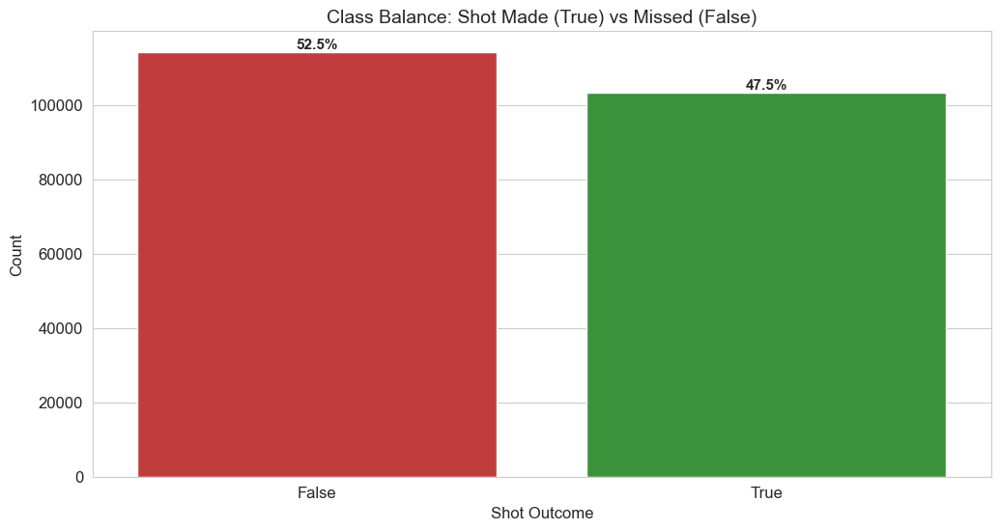

In [62]:
# Standardize the target variable into boolean format
# This ensures consistent representation of made (True) and missed (False) shots
df['SHOT_MADE'] = df['SHOT_MADE'].replace({'TRUE': True, 'FALSE': False, 'True': True, 'False': False}).astype(bool)

# Define a custom color palette for better visual distinction
custom_palette = {
    True: '#2CA02C', False: '#D62728', # Green for made shots
    'True': '#2CA02C', 'False': '#D62728' # Red for missed shots
}

# Create a count plot to visualize class distribution
ax = sns.countplot(x='SHOT_MADE', data=df, palette=custom_palette, hue='SHOT_MADE', legend=False)

# Plot titles and axis labels
plt.title('Class Balance: Shot Made (True) vs Missed (False)', fontsize=14)
plt.xlabel('Shot Outcome')
plt.ylabel('Count')

# Annotate bars with percentage values
total = len(df)
for p in ax.patches:
    height = p.get_height()
    percentage = f'{100 * height / total:.1f}%'
    x = p.get_x() + p.get_width() / 2
    y = height
    ax.annotate(percentage, (x, y), ha='center', va='bottom', fontweight='bold', fontsize=11)

plt.show()

The distribution indicates a relatively balanced dataset (approximately 47% made shots and 53% missed shots), which is favorable for binary classification tasks and reduces the risk of severe class imbalance during model training.

## 7.2 Shot Selection & Scoring Logic

### 7.2.1 Analysis of Shot Efficiency by Distance

This section examines how shot outcomes vary as a function of shot distance. Shot distance is a key contextual feature in basketball, as scoring probability is known to decrease with increasing distance from the basket. A histogram with kernel density estimation (KDE) is used to compare the distance distributions of made and missed shots, allowing for a visual assessment of how shot selection and efficiency differ across distance ranges.


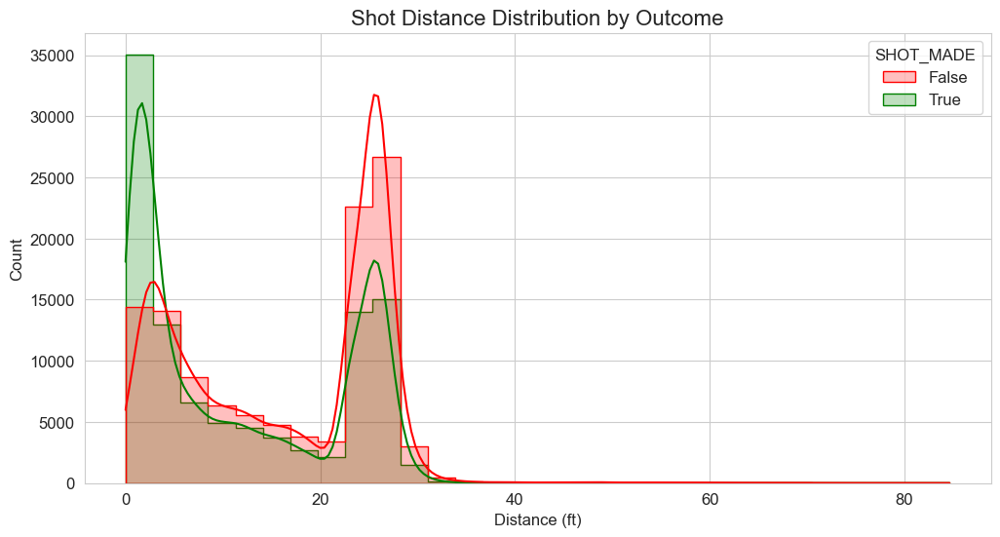

In [63]:
# Plot histogram of shot distance separated by shot outcome
# KDE is enabled to better visualize the underlying distribution
sns.histplot(
    data=df,
    x='SHOT_DISTANCE',
    hue='SHOT_MADE',
    element="step",
    bins=30,
    kde=True,
    palette={0: 'red', 1: 'green'}
)

# Plot title and axis labels
plt.title('Shot Distance Distribution by Outcome', fontsize=16)
plt.xlabel('Distance (ft)')

plt.show()


The distribution exhibits a clear bimodal pattern, with high shot volume near the rim (0–4 ft) and around the three-point line (~24 ft), while the mid-range area (approximately 8–22 ft) shows noticeably fewer attempts. Shots taken close to the basket display a substantially higher proportion of makes compared to misses, whereas perimeter shots show a lower success ratio. This pattern is consistent with contemporary shot selection tendencies and highlights the strong association between shot distance and shooting efficiency.

### 7.2.2 Analysis of Shooting Accuracy by Shot Type (2PT vs 3PT)

This section compares shooting accuracy between two-point and three-point field goal attempts. By averaging the binary shot outcome (`SHOT_MADE`) across shot types, the bar plot provides an estimate of shooting efficiency for each category, allowing for a direct comparison of success rates between 2PT and 3PT shots.


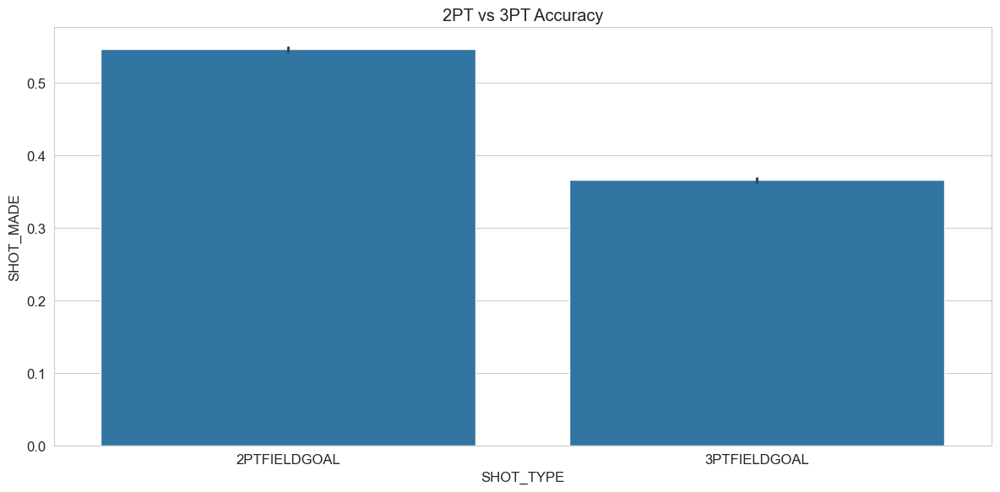

In [64]:
# Compare shooting accuracy between 2-point and 3-point field goals
sns.barplot(
    x='SHOT_TYPE',
    y='SHOT_MADE',
    data=df
)

# Plot title
plt.title('2PT vs 3PT Accuracy')

plt.tight_layout()
plt.show()


The results show that two-point field goal attempts have a substantially higher shooting accuracy than three-point attempts. This difference reflects the increased difficulty associated with longer-range shots and highlights shot type as a key factor influencing scoring efficiency.

### 7.2.3 Analysis of Shot Frequency vs. Efficiency by Distance

This section jointly analyzes shot selection (frequency) and shooting efficiency as a function of distance. Shot distances are binned in 1-foot intervals (up to 35 ft) and aggregated to compute both the number of attempts and field goal percentage (FG%). The visualization overlays shot volume (bars) with efficiency (line) using a secondary axis, and low-volume bins are filtered out to reduce noise and improve interpretability.


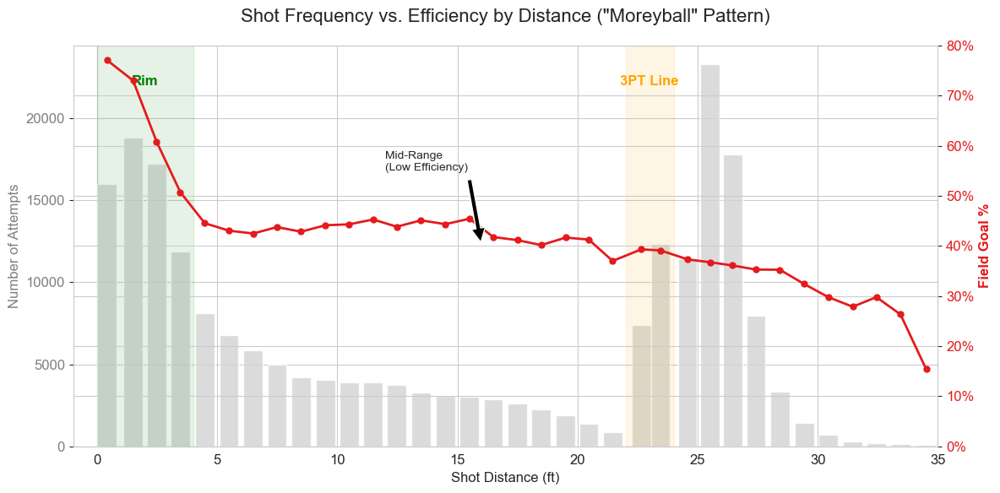

In [65]:
import matplotlib.ticker as mtick

# --- Data Preparation ---
# Bin shot distances up to 35ft (captures deep threes)
max_dist = 35
bin_width = 1

# Filter to remove extreme tails/outliers beyond the analysis range
df_filtered = df[df['SHOT_DISTANCE'] <= max_dist].copy()

# Create 1-ft distance bins
df_filtered['DIST_BIN'] = pd.cut(
    df_filtered['SHOT_DISTANCE'],
    bins=np.arange(0, max_dist + bin_width, bin_width),
    include_lowest=True
)

# Ensure a numeric make indicator (1=make, 0=miss)
df_filtered['is_make_num'] = (
    df_filtered['SHOT_MADE']
    .replace({True: 1, False: 0, 'TRUE': 1, 'FALSE': 0, 'True': 1, 'False': 0})
    .astype(int)
)

# Aggregate by distance bin
dist_stats = (
    df_filtered.groupby('DIST_BIN', observed=True)
    .agg(
        shots=('is_make_num', 'size'),
        makes=('is_make_num', 'sum'),
        avg_dist=('SHOT_DISTANCE', 'mean')  # average distance per bin for x-axis
    )
)

dist_stats['FG_PCT'] = dist_stats['makes'] / dist_stats['shots']

# Remove low-sample bins to reduce noise
dist_stats = dist_stats[dist_stats['shots'] > 50]

# --- Plotting ---
fig, ax1 = plt.subplots(figsize=(12, 6))

# Layer 1: Shot volume (bars)
ax1.bar(
    dist_stats['avg_dist'],
    dist_stats['shots'],
    width=bin_width * 0.8,
    color='lightgrey',
    alpha=0.8,
    label='Shot Volume'
)
ax1.set_xlabel('Shot Distance (ft)', fontsize=12)
ax1.set_ylabel('Number of Attempts', color='grey', fontsize=12)
ax1.tick_params(axis='y', labelcolor='grey')
ax1.set_xlim(-1, max_dist)

# Layer 2: Efficiency (line) on secondary axis
ax2 = ax1.twinx()
ax2.plot(
    dist_stats['avg_dist'],
    dist_stats['FG_PCT'],
    color='#E41A1C',
    marker='o',
    linewidth=2,
    markersize=5,
    label='FG%'
)
ax2.set_ylabel('Field Goal %', color='#E41A1C', fontsize=12, fontweight='bold')
ax2.tick_params(axis='y', labelcolor='#E41A1C')
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax2.set_ylim(0, 0.8)

# Context markers
ax1.axvspan(0, 4, color='green', alpha=0.1)
ax1.text(2, ax1.get_ylim()[1] * 0.9, "Rim", ha='center', color='green', fontweight='bold')

ax1.axvspan(22, 24, color='orange', alpha=0.1)
ax1.text(23, ax1.get_ylim()[1] * 0.9, "3PT Line", ha='center', color='orange', fontweight='bold')

ax2.annotate(
    'Mid-Range\n(Low Efficiency)',
    xy=(16, 0.40),
    xytext=(12, 0.55),
    arrowprops=dict(facecolor='black', shrink=0.05),
    fontsize=10
)

plt.title('Shot Frequency vs. Efficiency by Distance ("Moreyball" Pattern)', fontsize=16, pad=20)
plt.grid(True, axis='x', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()

The plot shows a clear bimodal shot selection pattern, with high attempt volume near the rim (0–4 ft) and around the three-point line (~22–24 ft), and a relative “valley” in the mid-range. Efficiency is highest at close range and declines as distance increases; around the three-point region, the field goal percentage is lower than at the rim but remains supported by high shot volume. Overall, the combined frequency–efficiency view highlights why distance is a strong driver of shooting outcomes and why mid-range areas tend to be less attractive from a raw efficiency perspective.

### 7.2.4 Shot Probability Decay over Distance
This section examines how the empirical probability of making a shot changes as a function of shot distance. Shot distances are rounded to integer values and aggregated to compute the average shot success rate at each distance. A regression plot with a non-linear fit is used to visualize the overall decay pattern and highlight how shooting probability evolves across increasing distances.


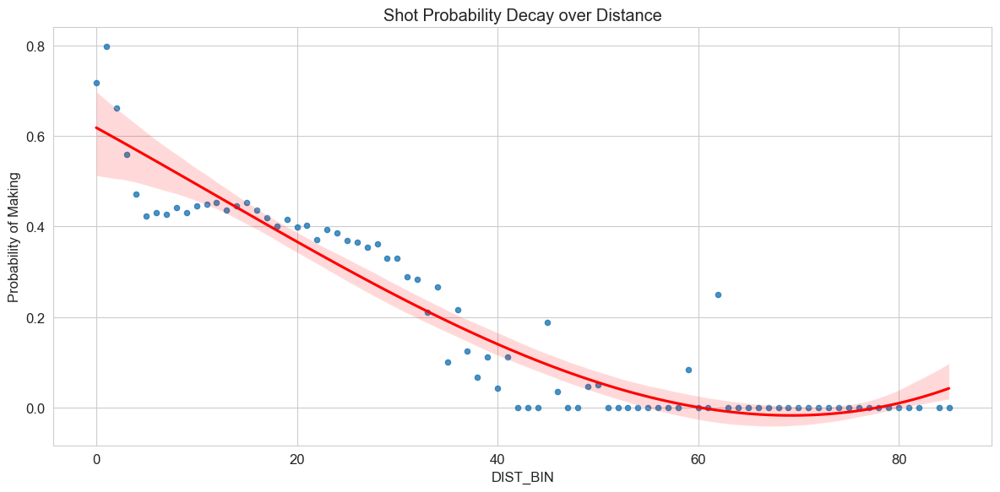

In [66]:
# --- Data Preparation ---
# Round shot distance to create integer distance bins
dist_bins = df.copy()
dist_bins['DIST_BIN'] = dist_bins['SHOT_DISTANCE'].round()

# Compute empirical shot probability by distance
prob_by_dist = (
    dist_bins
    .groupby('DIST_BIN')['SHOT_MADE']
    .mean()
    .reset_index()
)

# --- Visualization ---
# Regression plot showing decay of shot probability with distance
sns.regplot(
    x='DIST_BIN',
    y='SHOT_MADE',
    data=prob_by_dist,
    scatter_kws={'s': 20},
    order=3,              # cubic fit to capture non-linearity
    line_kws={'color': 'red'}
)

plt.title("Shot Probability Decay over Distance")
plt.ylabel("Probability of Making")
plt.tight_layout()
plt.show()

The plot shows a clear negative relationship between shot distance and shot success probability. Shots taken close to the basket exhibit the highest likelihood of being made, while shooting probability declines steadily as distance increases. The non-linear trend suggests that the rate of decay is not constant, with sharper drops at shorter distances and a flatter tail at long range, where shot success becomes increasingly rare.

*This analysis is descriptive and intended to reveal empirical patterns rather than establish causal relationships.

### 7.2.5 Efficiency Curve: Accuracy vs Distance by Shot Type
This section analyzes how shooting efficiency evolves with distance separately for two-point and three-point attempts. Shot attempts are aggregated into distance bins, and field goal percentage is computed for each bin while shot volume is encoded through bubble size. By plotting efficiency curves for 2PT and 3PT shots, the visualization highlights differences in how accuracy decays with distance across shot types and provides a joint view of efficiency and shot selection behavior.

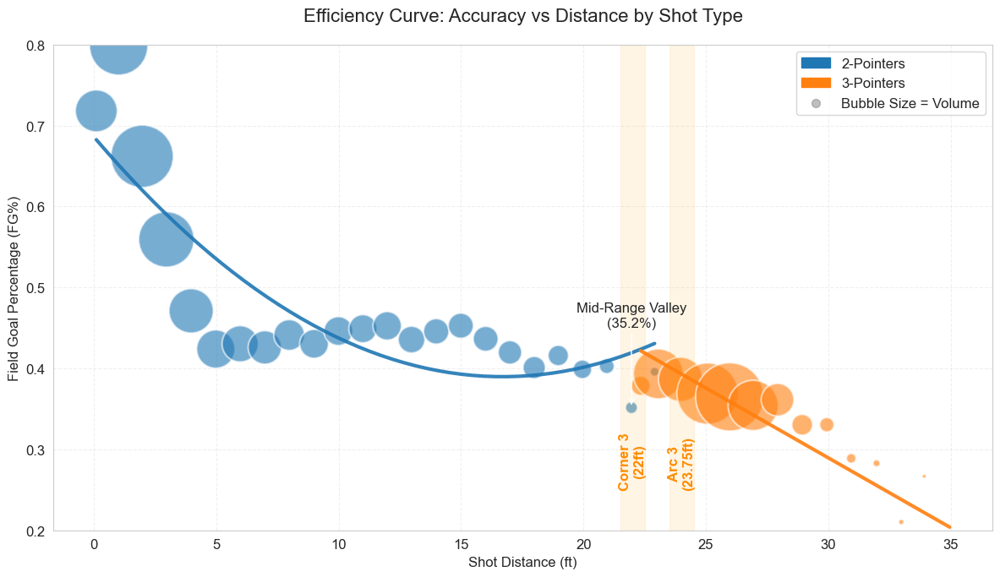

In [67]:
# --- Data Preparation ---
# 0) Setup: Ensure Boolean & Numeric consistency
df_plot = df.copy()
df_plot['SHOT_MADE_BOOL'] = df_plot['SHOT_MADE'].replace(
    {'TRUE': True, 'FALSE': False, 'True': True, 'False': False, 1: True, 0: False}
).astype(bool)
df_plot['is_make_int'] = df_plot['SHOT_MADE_BOOL'].astype(int)

# 1) Use Real Shot Types (Fixing the Corner 3 Logic)
# If SHOT_TYPE exists, use it. If not, use your distance logic BUT fix the corner threshold.
if 'SHOT_TYPE' in df_plot.columns:
    # Clean string format just in case
    df_plot['shot_label'] = df_plot['SHOT_TYPE'].apply(lambda x: '3PT' if '3' in str(x) else '2PT')
else:
    # Fallback: Corner 3 is 22ft, Break is 23.75ft.
    # This is a simplification; true logic needs X/Y coordinates.
    # We will assume your previous threshold for fallback only.
    df_plot['shot_label'] = np.where(df_plot['SHOT_DISTANCE'] >= 23.75, '3PT', '2PT')

# 2) Round Distances for cleaner binning (Integer buckets)
df_plot['dist_round'] = df_plot['SHOT_DISTANCE'].round(0)

# 3) Aggregate
agg = (
    df_plot.groupby(['shot_label', 'dist_round'])
    .agg(
        avg_dist=('SHOT_DISTANCE', 'mean'),
        fg_pct=('is_make_int', 'mean'),
        volume=('is_make_int', 'size')
    )
    .reset_index()
)

# 4) Filter Noise
# Remove bins with < 50 shots to prevent visual clutter
agg = agg[agg['volume'] >= 50].copy()

# Limit x-axis to 35ft (ignore full court heaves)
agg = agg[agg['dist_round'] <= 35]

# --- Plotting ---
fig, ax = plt.subplots(figsize=(12, 7))

# Colors: 2PT = Cool Blue, 3PT = Hot Orange
colors = {'2PT': '#1f77b4', '3PT': '#ff7f0e'}
labels = {'2PT': '2-Point Attempt', '3PT': '3-Point Attempt'}

# Loop through types to plot Bubbles + Trendlines
for shot_type in ['2PT', '3PT']:
    subset = agg[agg['shot_label'] == shot_type]

    if len(subset) == 0: continue

    # A. The Bubbles
    # Sizing: Scale volume for visibility
    bubble_size = subset['volume'] * 0.15

    scatter = ax.scatter(
        subset['avg_dist'],
        subset['fg_pct'],
        s=bubble_size,
        color=colors[shot_type],
        alpha=0.6,
        edgecolors='white',
        linewidth=1.5,
        label=labels[shot_type]
    )

    # B. The Trendlines (Polynomial Regression)
    # 2PTs decay (Order 2 or 3), 3PTs are flat (Order 1 or 2)
    if len(subset) > 3:
        z = np.polyfit(subset['avg_dist'], subset['fg_pct'], 2 if shot_type == '2PT' else 1)
        p = np.poly1d(z)

        # Create smooth x line for plotting curve
        x_trend = np.linspace(subset['avg_dist'].min(), subset['avg_dist'].max(), 50)
        ax.plot(x_trend, p(x_trend), color=colors[shot_type], linewidth=3, linestyle='-', alpha=0.9)


# 1. The Mid-Range Valley
# Find the lowest point for 2PTs (usually around 14-18ft)
mid_range = agg[(agg['shot_label']=='2PT') & (agg['avg_dist'] > 10)]
if not mid_range.empty:
    min_row = mid_range.loc[mid_range['fg_pct'].idxmin()]
    ax.annotate(f"Mid-Range Valley\n({min_row['fg_pct']:.1%})",
                xy=(min_row['avg_dist'], min_row['fg_pct']),
                xytext=(min_row['avg_dist'], min_row['fg_pct'] + 0.1),
                arrowprops=dict(facecolor='black', arrowstyle='->'), ha='center')

# 2. Corner 3 vs Above Break
# Corner 3s are at 22ft. Above Break at 23.75ft.
ax.axvspan(21.5, 22.5, color='orange', alpha=0.1)
ax.text(22, 0.25, "Corner 3\n(22ft)", rotation=90, va='bottom', ha='center', color='darkorange', fontweight='bold')

ax.axvspan(23.5, 24.5, color='orange', alpha=0.1)
ax.text(24, 0.25, "Arc 3\n(23.75ft)", rotation=90, va='bottom', ha='center', color='darkorange', fontweight='bold')


# Formatting
ax.set_xlabel('Shot Distance (ft)', fontsize=12)
ax.set_ylabel('Field Goal Percentage (FG%)', fontsize=12)
ax.set_title('Efficiency Curve: Accuracy vs Distance by Shot Type', fontsize=16, pad=20)
ax.set_ylim(0.2, 0.8) # Focus on realistic range
ax.grid(True, linestyle='--', alpha=0.3)

# Custom Legend to explain Bubble Size
# Add a dummy scatter for "Volume" legend
l1 = mpatches.Patch(color=colors['2PT'], label='2-Pointers')
l2 = mpatches.Patch(color=colors['3PT'], label='3-Pointers')
l3 = ax.scatter([], [], s=100*0.5, c='gray', alpha=0.5, label='Bubble Size = Volume')
ax.legend(handles=[l1, l2, l3], loc='upper right')

plt.tight_layout()
plt.show()

The plot shows a clear contrast between two-point and three-point shooting patterns. Two-point attempts exhibit a steep decline in efficiency as distance increases, with the lowest accuracy observed in the mid-range area. In contrast, three-point shooting efficiency appears relatively more stable across distances beyond the three-point line, although it remains consistently lower than close-range two-point attempts. The larger bubble sizes around the three-point line indicate high shot volume, suggesting that teams accept lower raw efficiency in exchange for higher scoring value per attempt.

### 7.2.6 Shot Value: Points Per Shot (PPS) by Distance
This section evaluates shot “value” by computing points per shot (PPS) across distance bins. For each attempt, points are calculated as 2 or 3 for made shots depending on shot type (and 0 for misses), and PPS is then aggregated by rounded distance bins. The resulting curve provides a direct view of how expected scoring output per attempt varies with distance, combining both accuracy and point value into a single metric.


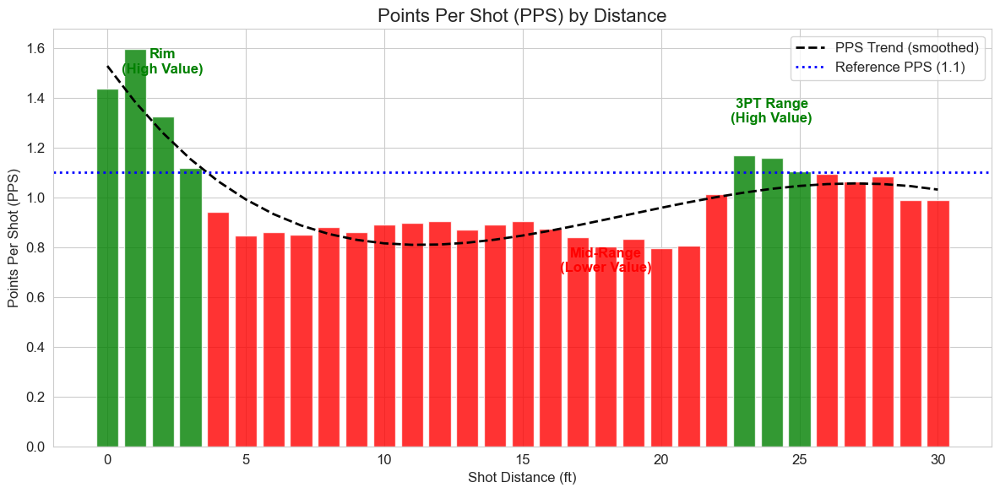

In [68]:
# --- Data Prep ---
df_plot = df.copy()

# Ensure numeric make indicator (1=make, 0=miss) for reliable computations
df_plot['is_make_int'] = (
    df_plot['SHOT_MADE']
    .replace({True: 1, False: 0, 'TRUE': 1, 'FALSE': 0, 'True': 1, 'False': 0, 1: 1, 0: 0})
    .astype(int)
)

# Shot value: 3 points for 3PT shots, otherwise 2 points
if 'SHOT_TYPE' in df_plot.columns:
    df_plot['SHOT_VAL'] = df_plot['SHOT_TYPE'].apply(lambda x: 3 if '3' in str(x) else 2)
else:
    # Fallback distance-based approximation (true logic depends on X/Y for corner threes)
    df_plot['SHOT_VAL'] = np.where(df_plot['SHOT_DISTANCE'] > 23.75, 3, 2)

# Points scored on each attempt (0 if missed, 2 or 3 if made)
df_plot['POINTS'] = df_plot['is_make_int'] * df_plot['SHOT_VAL']

# Bin distances (rounded to integer feet)
df_plot['DIST_BIN'] = df_plot['SHOT_DISTANCE'].round(0)

# Aggregate Points Per Shot (PPS) by distance bin
pps_stats = (
    df_plot.groupby('DIST_BIN')
    .agg(
        total_shots=('POINTS', 'size'),
        PPS=('POINTS', 'mean')   # mean points per attempt in that bin
    )
)

# Filter low-volume bins to reduce noise and focus range
pps_stats = pps_stats[pps_stats['total_shots'] > 50]
pps_stats = pps_stats[pps_stats.index <= 30]

# --- Plotting ---
plt.figure(figsize=(12, 6))

# Reference threshold for highlighting higher-value zones (kept as a visual guide)
pps_ref = 1.1
colors = ['red' if x < pps_ref else 'green' for x in pps_stats['PPS']]

plt.bar(pps_stats.index, pps_stats['PPS'], color=colors, alpha=0.8)

# Smooth trendline (visual guide only)
z = np.polyfit(pps_stats.index, pps_stats['PPS'], 4)
p = np.poly1d(z)
plt.plot(pps_stats.index, p(pps_stats.index), "k--", linewidth=2, label='PPS Trend (smoothed)')

# Reference line
plt.axhline(pps_ref, color='blue', linestyle=':', linewidth=2, label=f'Reference PPS ({pps_ref:.1f})')

# Annotations (optional, descriptive)
plt.text(2, 1.5, "Rim\n(High Value)", ha='center', color='green', fontweight='bold')
plt.text(18, 0.7, "Mid-Range\n(Lower Value)", ha='center', color='red', fontweight='bold')
plt.text(24, 1.3, "3PT Range\n(High Value)", ha='center', color='green', fontweight='bold')

plt.title('Points Per Shot (PPS) by Distance', fontsize=16)
plt.xlabel('Shot Distance (ft)')
plt.ylabel('Points Per Shot (PPS)')
plt.legend()
plt.tight_layout()
plt.show()

The PPS curve highlights that shot value is not determined by field goal percentage alone, but also by the point value of the attempt. Close-range shots tend to produce the highest PPS due to high make probability, while mid-range distances generally show lower PPS. Around the three-point region, PPS increases relative to mid-range because the additional point can compensate for the lower shooting percentage. Overall, this visualization illustrates why distance-based shot selection often prioritizes attempts at the rim and from three-point range over mid-range shots.

### 7.2.7 Shot Range Distributions by Action Type
This section examines how shot distance varies across different offensive action types. Focusing on the most frequently occurring action types, boxplots are used to summarize the distribution, central tendency, and spread of shot distances for each action. This visualization helps identify systematic differences in shot range as well as the presence of extreme values within specific action categories.

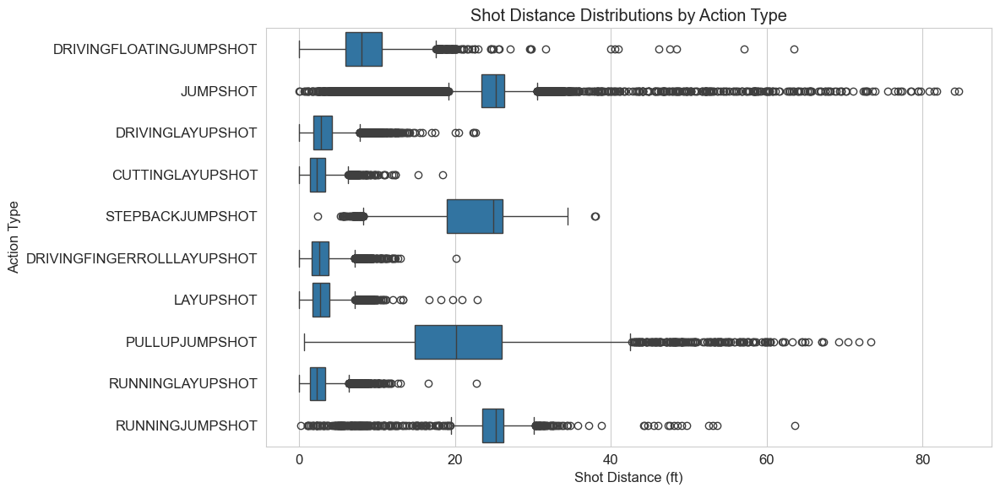

In [69]:
# Identify the most frequent shot action types
top_actions = df['ACTION_TYPE'].value_counts().nlargest(10).index

# Boxplot of shot distance distributions by action type
sns.boxplot(
    x='SHOT_DISTANCE',
    y='ACTION_TYPE',
    data=df[df['ACTION_TYPE'].isin(top_actions)]
)

plt.title("Shot Distance Distributions by Action Type")
plt.xlabel("Shot Distance (ft)")
plt.ylabel("Action Type")

plt.tight_layout()
plt.show()

The distributions reveal clear differences in shot range across action types. Layup- and drive-related actions are concentrated at very short distances, while jump shot variants exhibit wider distributions centered farther from the basket. Several action types show long right tails, indicating the presence of occasional long-distance or atypical attempts. These outliers are expected given game context (e.g., late-clock or heave situations) and do not necessarily indicate data quality issues.

### 7.2.8 Shot Distance Under Time Pressure (The "Panic Meter")
This analysis examines how shot distance evolves as the shot clock winds down. By focusing on the final 24 seconds of a possession, the visualization captures the relationship between time pressure, shot selection, and shot outcome. Average shot distance is plotted against remaining shot-clock time, separately for made and missed shots.


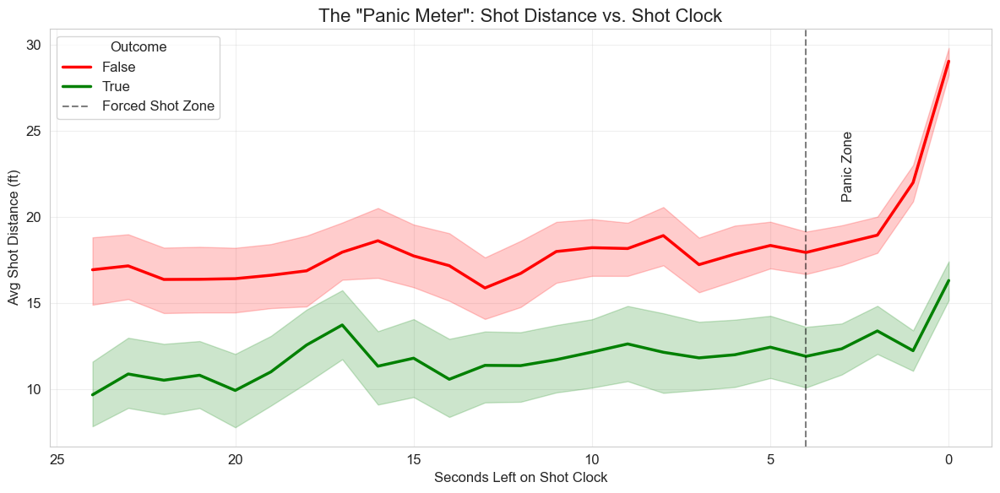

In [70]:
if "SHOT_MADE_BOOL" not in df_plot.columns:
    if "SHOT_MADE" in df_plot.columns:
        df_plot["SHOT_MADE_BOOL"] = df_plot["SHOT_MADE"].replace(
            {'TRUE': True, 'FALSE': False, 'True': True, 'False': False}
        ).astype(bool)
    elif "Shot_Made" in df_plot.columns:
        df_plot["SHOT_MADE_BOOL"] = df_plot["Shot_Made"].astype(bool)
    else:
        raise KeyError("SHOT_MADE_BOOL üretmek için SHOT_MADE veya Shot_Made yok.")


# --- Data Prep ---
df_plot['TIME_REMAINING'] = df_plot['MINS_LEFT'] * 60 + df_plot['SECS_LEFT']

# Filter to last 24 seconds (standard possession)
possession_df = df_plot[df_plot['TIME_REMAINING'] <= 24].copy()

# Bin time into 2-second chunks
possession_df['TIME_BIN'] = pd.cut(possession_df['TIME_REMAINING'], bins=np.arange(0, 25, 2))

# --- Plotting ---
plt.figure(figsize=(12, 6))

sns.lineplot(
    data=possession_df,
    x='TIME_REMAINING',
    y='SHOT_DISTANCE',
    hue='SHOT_MADE_BOOL',
    palette={True: 'green', False: 'red'},
    errorbar='ci', # Show confidence interval (the shaded area)
    linewidth=2.5
)

plt.gca().invert_xaxis() # Time counts DOWN from 24 to 0
plt.axvline(4, color='black', linestyle='--', alpha=0.5, label='Forced Shot Zone')
plt.text(3, 25, "Panic Zone", rotation=90, va='top')

plt.title('The "Panic Meter": Shot Distance vs. Shot Clock', fontsize=16)
plt.xlabel('Seconds Left on Shot Clock')
plt.ylabel('Avg Shot Distance (ft)')
plt.legend(title='Outcome')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

The plot reveals a clear effect of time pressure on shot selection. As the shot clock approaches zero, average shot distance increases sharply, especially for missed shots. This pattern becomes most pronounced in the final 4 seconds, highlighted as the “panic zone,” where offenses are often forced into low-quality, long-distance attempts. In contrast, made shots consistently originate from shorter distances, even under time pressure, suggesting that successful possessions are more likely to generate closer, more controlled attempts before the clock expires. This finding supports the inclusion of shot-clock-related features as predictors of shot quality in subsequent modeling stages.

## 7.3 Spatial Analysis & Zone Performance

### 7.3.1 Analysis of Zone Performance: Efficiency vs Volume
This section compares shooting efficiency across spatial shot zones using the `BASIC_ZONE` categorization. For each zone, field goal percentage (FG%) is computed alongside shot volume, allowing a joint interpretation of “how efficient” a zone is and “how often” it is used. A league-average reference line is included to contextualize which zones perform above or below the overall baseline.

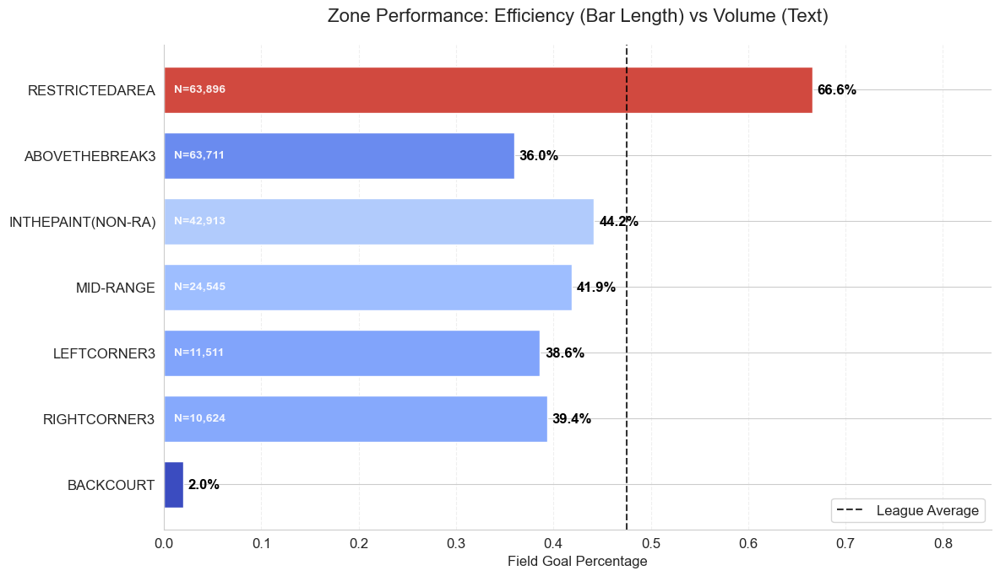

In [71]:
# --- Data Preparation ---
if ('BASIC_ZONE' in df.columns) and ('SHOT_MADE' in df.columns):

    # Make indicator (1=make, 0=miss) for consistent aggregation
    df['is_make_int'] = (
        df['SHOT_MADE']
        .replace({True: 1, False: 0, 'TRUE': 1, 'FALSE': 0, 'True': 1, 'False': 0, 1: 1, 0: 0})
        .astype(int)
    )

    # Aggregate by zone
    zone_stats = (
        df.groupby('BASIC_ZONE')
        .agg(
            shots=('is_make_int', 'size'),
            makes=('is_make_int', 'sum')
        )
    )
    zone_stats['FG_PCT'] = zone_stats['makes'] / zone_stats['shots']

    # Remove very low-volume zones (noise)
    zone_stats = zone_stats[zone_stats['shots'] > 50].copy()

    # Sort by volume (ascending for horizontal bars)
    zone_stats = zone_stats.sort_values('shots', ascending=True)

    # --- Plotting ---
    fig, ax = plt.subplots(figsize=(12, 7))

    # Color mapping by FG%
    norm = mcolors.Normalize(vmin=0.3, vmax=0.7)
    cmap = cm.get_cmap('coolwarm')
    colors = [cmap(norm(val)) for val in zone_stats['FG_PCT']]

    bars = ax.barh(zone_stats.index, zone_stats['FG_PCT'], color=colors, height=0.7)

    # Annotations: FG% (right) + Volume (inside)
    for bar, shots, pct in zip(bars, zone_stats['shots'], zone_stats['FG_PCT']):
        width = bar.get_width()

        ax.text(
            width + 0.005,
            bar.get_y() + bar.get_height() / 2,
            f"{pct:.1%}",
            va='center',
            fontweight='bold',
            fontsize=12,
            color='black'
        )

        if width > 0.1:
            ax.text(
                0.01,
                bar.get_y() + bar.get_height() / 2,
                f"N={shots:,}",
                va='center',
                ha='left',
                fontsize=10,
                color='white',
                fontweight='bold',
                alpha=0.9
            )

    # League average reference line
    league_avg = df['is_make_int'].mean()
    ax.axvline(league_avg, color='black', linestyle='--', alpha=0.8, label='League Average')
    ax.legend(loc='lower right', frameon=True)

    # Formatting
    ax.set_xlabel("Field Goal Percentage", fontsize=12)
    ax.set_title("Zone Performance: Efficiency (Bar Length) vs Volume (Text)", fontsize=16, pad=20)
    ax.set_xlim(0, 0.85)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.grid(axis='x', linestyle='--', alpha=0.3)

    plt.tight_layout()
    plt.show()


The results show strong zone-level differences in both efficiency and usage. The Restricted Area stands out as the highest-efficiency zone with very high volume, reflecting the value of rim attempts. Three-point zones (especially above-the-break threes) appear in very high volume but with lower FG%, which is consistent with the broader shot-selection trade-off between accuracy and scoring value. Mid-range and non-restricted paint areas sit closer to (or below) the league-average baseline, indicating comparatively lower efficiency relative to the most valued zones. Backcourt attempts show extremely low efficiency and should be interpreted as rare heaves rather than normal offensive possessions.

### 7.3.2 Spatial Efficiency Heatmap (Zone Range vs Alignment)
This heatmap breaks down FG% by distance range (ZONE_RANGE) and horizontal alignment (ZONE_ABB).  
It provides a compact view of where efficiency concentrates across the court, highlighting the strong rim advantage and the lower success rates at longer ranges.


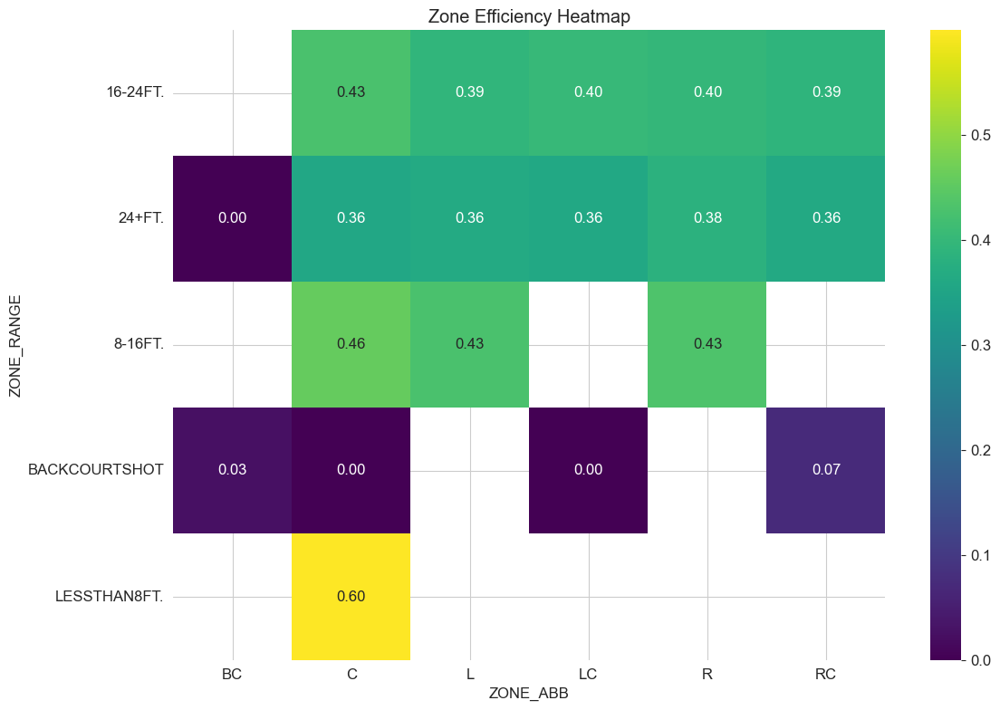

In [72]:
# --- Data Prep ---
df_hm = df[['ZONE_RANGE', 'ZONE_ABB', 'SHOT_MADE']].copy()

df_hm['SHOT_MADE_NUM'] = df_hm['SHOT_MADE'].replace(
    {True: 1, False: 0, 'TRUE': 1, 'FALSE': 0, 'True': 1, 'False': 0}
).astype(float)

zone_pivot = df_hm.pivot_table(
    index='ZONE_RANGE',
    columns='ZONE_ABB',
    values='SHOT_MADE_NUM',
    aggfunc='mean'
)

plt.figure(figsize=(12, 8))
sns.heatmap(
    zone_pivot,
    annot=True,
    cmap='viridis',
    fmt=".2f"
)
plt.title("Zone Efficiency Heatmap")
plt.tight_layout()
plt.show()


The highest efficiencies are concentrated in the closest range (LESS THAN 8 FT), reinforcing that rim attempts dominate in accuracy.  
As distance increases (16–24 FT and 24+ FT), FG% declines across almost all alignments, with three-point areas clustering around the mid-0.30s.  
Very low or zero values in backcourt-related cells likely reflect extremely low-volume heaves; these should not be over-interpreted as stable shooting skill signals.


### 7.3.3 Spatial Shooting Efficiency (FG%)

This section examines spatial variation in shooting efficiency across the offensive half-court.
Shot outcomes are aggregated using a hexagonal binning approach, where each cell represents the mean field goal percentage (FG%) of shots taken from that location.
To reduce noise and improve interpretability, only spatial bins with a minimum number of attempts are retained, and backcourt shots are excluded.


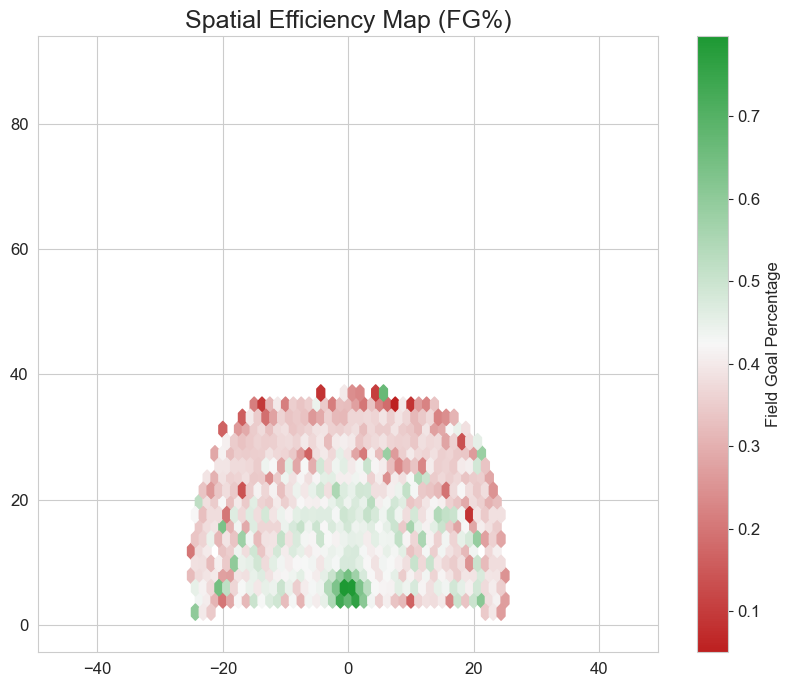

In [73]:
# Create a custom colormap to represent spatial shooting efficiency
# Low FG% values are mapped to red tones, average values to light colors,
# and high FG% values to green tones
cmap = LinearSegmentedColormap.from_list(
    'shot_map',
    ['#BD2020', '#F7F7F7', '#1D9933']
)

# Initialize the figure
plt.figure(figsize=(10, 8))

# Exclude backcourt shots to focus on offensive half-court shot selection
court_df = df[df['LOC_Y'] < 400]

# Hexbin visualization:
# Each hexagon aggregates shots within a spatial area and computes
# the mean of SHOT_MADE, which corresponds to field goal percentage (FG%)
hb = plt.hexbin(
    x=court_df['LOC_X'],
    y=court_df['LOC_Y'],
    C=court_df['SHOT_MADE'],      # Value aggregated within each hexagon
    gridsize=40,                  # Controls spatial resolution of the grid
    cmap=cmap,
    mincnt=10,                    # Suppress low-volume bins to reduce noise
    reduce_C_function=np.mean     # Compute FG% as the mean shot outcome
)

# Add colorbar to indicate field goal percentage scale
cb = plt.colorbar(hb, label='Field Goal Percentage')

# Plot title and aspect ratio
plt.title('Spatial Efficiency Map (FG%)', fontsize=18)
plt.axis('equal')                # Preserve court proportions

plt.show()


The resulting efficiency map reveals a strong spatial gradient in shooting success.
Field goal percentage is highest in close proximity to the basket and declines as shot distance increases, particularly beyond the three-point arc.
This pattern is consistent with established findings in basketball analytics, where shot location is a primary determinant of shooting efficiency.
At the same time, localized variations within similar distance ranges suggest that spatial context captures additional information beyond distance alone.


#### 7.3.4 Spatial Success vs. Failure Zones (Hexbin Maps)

This section contrasts the spatial distribution of made vs. missed shots using two half-court hexbin maps.  
Each hexagon aggregates shot attempts in a local area of the court, highlighting where outcomes concentrate spatially.  
To keep the visualization comparable and interpretable, we restrict the view to half-court locations (LOC_Y < 50), which reduces distortion from rare full-court heaves.


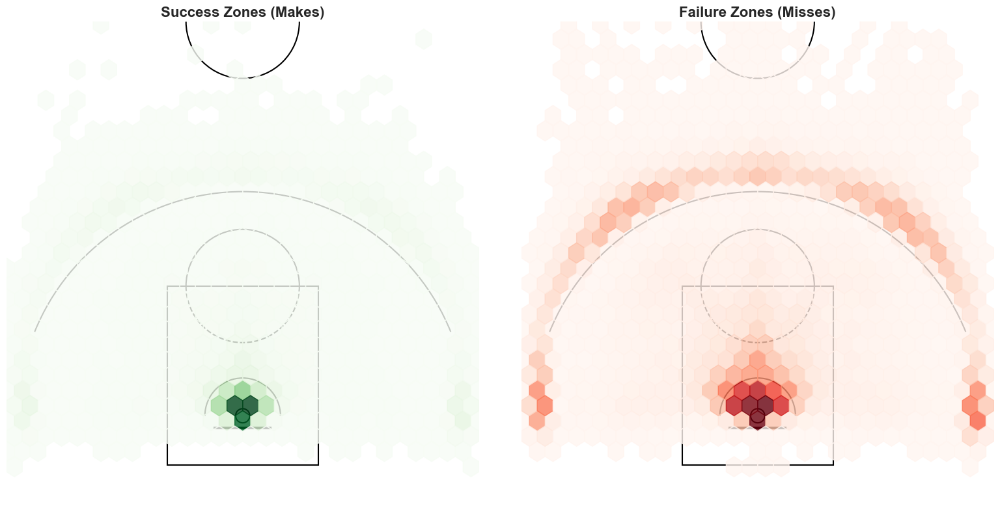

In [74]:
# --- 1) Helper: Draw half-court reference lines ---
# This function overlays simplified NBA half-court markings onto a matplotlib axis.
# The court geometry is consistent with the project assumptions:
# - Full court: 94 x 50 ft, basket center at (0, 5.25)
def draw_court(ax=None, color='black', lw=2, outer_lines=False):
    if ax is None:
        ax = plt.gca()

    # Basket (rim) is centered at (0, 5.25) in standard shot location coordinates
    hoop = patches.Circle((0, 5.25), radius=0.75, linewidth=lw, color=color, fill=False)

    # Backboard (approximate)
    backboard = patches.Rectangle((-3, 4), 6, -0.1, linewidth=lw, color=color)

    # Paint / Key (16 ft wide, simplified half-court depiction)
    paint = patches.Rectangle((-8, 0), 16, 19, linewidth=lw, color=color, fill=False)

    # Restricted area arc (4 ft radius -> 8 ft diameter)
    restricted = patches.Arc((0, 5.25), 8, 8, theta1=0, theta2=180, linewidth=lw, color=color)

    # Free-throw circle (12 ft diameter)
    top_free_throw = patches.Arc((0, 19), 12, 12, theta1=0, theta2=180, linewidth=lw, color=color)
    bottom_free_throw = patches.Arc((0, 19), 12, 12, theta1=180, theta2=0, linewidth=lw, color=color, linestyle='dashed')

    # Three-point arc (approx. 23.75 ft from basket, drawn as diameter here for visualization)
    # Note: This is a visual reference; exact three-point geometry depends on location (corner vs. arc).
    three_arc = patches.Arc((0, 5.25), 47.5, 47.5, theta1=22, theta2=158, linewidth=lw, color=color)

    # Optional center arc (not critical for half-court, kept for mild context)
    center_outer_arc = patches.Arc((0, 47), 12, 12, theta1=180, theta2=0, linewidth=lw, color=color)

    court_elements = [
        hoop, backboard, paint, restricted,
        top_free_throw, bottom_free_throw,
        three_arc, center_outer_arc
    ]

    for element in court_elements:
        ax.add_patch(element)

    return ax


# --- 2) Data preparation: ensure consistent boolean target for masking ---
# We use boolean masks to split locations into "makes" and "misses" for separate density plots.
shot_made_bool = df['SHOT_MADE'].replace(
    {'TRUE': True, 'FALSE': False, 'True': True, 'False': False}
).astype(bool)


# --- 3) Visualization: two-panel hexbin maps (makes vs misses) ---
# Requirement: LOC_X and LOC_Y are used as spatial coordinates (in feet).
if all(col in df.columns for col in ['LOC_X', 'LOC_Y', 'SHOT_MADE']):

    # Side-by-side comparison with shared axes ensures consistent scale across panels
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharex=True, sharey=True)

    # Standard half-court extent (approximate):
    # X in [-25, 25] captures court width; Y in [-5, 50] focuses on offensive half-court
    extent = [-25, 25, -5, 50]

    # Filter out full-court heaves to avoid compressing the color scale
    halfcourt_mask = df['LOC_Y'] < 50

    made_mask = shot_made_bool & halfcourt_mask
    miss_mask = (~shot_made_bool) & halfcourt_mask

    # --- Panel A: Makes ---
    draw_court(axes[0], color='black', lw=1.5)
    hb1 = axes[0].hexbin(
        df.loc[made_mask, 'LOC_X'],
        df.loc[made_mask, 'LOC_Y'],
        gridsize=30,
        extent=extent,
        cmap='Greens',
        mincnt=1,
        alpha=0.8
    )
    axes[0].set_title("Success Zones (Makes)", fontsize=16, fontweight='bold')
    axes[0].set_facecolor('white')

    # --- Panel B: Misses ---
    draw_court(axes[1], color='black', lw=1.5)
    hb2 = axes[1].hexbin(
        df.loc[miss_mask, 'LOC_X'],
        df.loc[miss_mask, 'LOC_Y'],
        gridsize=30,
        extent=extent,
        cmap='Reds',
        mincnt=1,
        alpha=0.8
    )
    axes[1].set_title("Failure Zones (Misses)", fontsize=16, fontweight='bold')
    axes[1].set_facecolor('white')

    # --- Formatting for clean comparison ---
    for ax in axes:
        ax.set_xlim(-25, 25)
        ax.set_ylim(-5, 47)          # half-court focus
        ax.set_aspect('equal')       # preserve court proportions
        ax.axis('off')               # remove axis ticks/labels for a cleaner "shot chart" style

        # Add a light border around each panel (optional)
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_color('black')

    plt.tight_layout()
    plt.show()

else:
    print("⚠️ Missing required columns (LOC_X, LOC_Y, SHOT_MADE).")


This comparison of spatial success and failure zones highlights clear outcome-dependent clustering patterns across the half court. Made shots are strongly concentrated around the restricted area, reflecting the inherently higher efficiency of close-range attempts. In contrast, missed shots are more spatially dispersed, with visible density extending toward mid-range and perimeter areas, where shot difficulty increases and efficiency typically declines. The side-by-side hexbin representation allows for a qualitative validation of modern shot selection dynamics, suggesting that the dataset captures expected spatial tendencies in offensive decision-making rather than random or uniformly distributed outcomes.

### 7.3.5 Analysis of Spatial Distribution: Shot Depth vs. Width

This analysis examines whether successful shots differ systematically from missed shots in terms of their **spatial location** on the court. Two complementary spatial dimensions are considered. The first is **shot depth**, defined as the distance from the basket, which directly reflects shot difficulty. The second is **shot width**, measured as the absolute horizontal distance from the court’s center line, capturing the effect of shooting angle and lateral positioning.

By comparing the full distributions of these two metrics for made and missed shots, this step serves both as an exploratory analysis and as a data quality check. If the data reflects realistic basketball behavior, made shots should appear closer to the basket and more centrally aligned than missed shots.


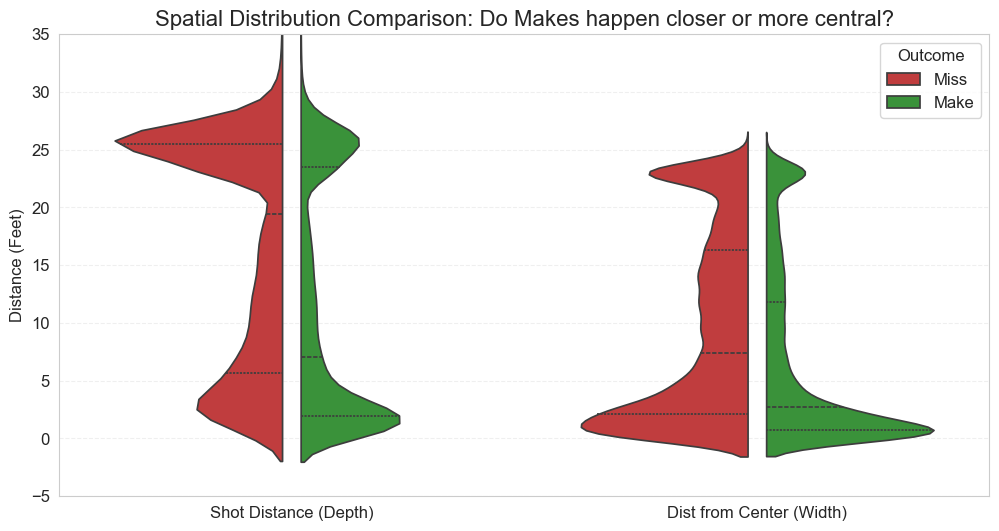

In [75]:
# --- Data Preparation ---
df_plot = df.copy()

# Ensure the shot outcome variable is consistently boolean
# This prevents grouping and plotting issues caused by mixed encodings
df_plot['SHOT_MADE_BOOL'] = (
    df_plot['SHOT_MADE']
    .replace({'TRUE': True, 'FALSE': False, 1: True, 0: False})
    .astype(bool)
)

# Create a readable outcome label for visualization
df_plot['Outcome'] = df_plot['SHOT_MADE_BOOL'].apply(
    lambda x: 'Make' if x else 'Miss'
)

# Compute absolute horizontal distance from the court center line
# This assumes left/right symmetry of the court
df_plot['ABS_LOC_X'] = df_plot['LOC_X'].abs()

# --- Reshape Data to Long Format ---
# This allows depth and width to be plotted side-by-side
df_melted = df_plot.melt(
    id_vars=['Outcome'],
    value_vars=['SHOT_DISTANCE', 'ABS_LOC_X'],
    var_name='Metric',
    value_name='Feet'
)

# Rename metrics for clearer plot labels
df_melted['Metric'] = df_melted['Metric'].replace({
    'SHOT_DISTANCE': 'Shot Distance (Depth)',
    'ABS_LOC_X': 'Dist from Center (Width)'
})

# --- Plotting ---
plt.figure(figsize=(12, 6))

sns.violinplot(
    data=df_melted,
    x='Metric',
    y='Feet',
    hue='Outcome',
    split=True,          # Direct Make vs Miss comparison
    inner='quartile',    # Show median and quartiles
    palette={'Make': '#2ca02c', 'Miss': '#d62728'},
    gap=0.1
)

plt.title(
    'Spatial Distribution Comparison: Do Makes happen closer or more central?',
    fontsize=16
)
plt.ylabel('Distance (Feet)')
plt.xlabel('')
plt.grid(axis='y', linestyle='--', alpha=0.3)

# Limit the y-axis to the active court region
plt.ylim(-5, 35)

plt.show()


The distribution of shot depth reveals a clear separation between made and missed shots. Made shots are strongly concentrated near the basket, with a lower median distance and a dense lower tail close to 0–5 feet. In contrast, missed shots display a broader distribution with a heavier upper tail around long-range distances, indicating that deeper shots are associated with lower shooting success. This pattern is consistent with expected basketball dynamics and suggests that shot distance is a key determinant of shot outcomes.

A similar distinction is observed for shot width. Made shots tend to be more centrally aligned, with a narrower distribution around the court’s center line, whereas missed shots show greater lateral dispersion toward wider angles. This indicates that off-center shooting positions are associated with reduced accuracy, likely due to more difficult shooting geometry and increased defensive pressure. Overall, these findings confirm that both depth and width contain meaningful spatial information and justify their inclusion as predictive features in subsequent modeling stages.


### 7.3.6 Shot Centrality and Lateral Distribution

After comparing depth and width distributions, this step focuses specifically on **shot centrality** by analyzing how far shots occur from the court’s center line. We use the absolute horizontal coordinate (**ABS_LOC_X**) to treat left and right sides symmetrically and compare made vs. missed shots on the same scale.

To provide court context, two reference lines are included. The first marks the **paint edge** at approximately **8 ft from the center line** (given a 16-ft wide lane). The second marks the approximate **corner three lateral boundary** at **22 ft**, which represents the maximum width where corner threes occur. This visualization helps assess whether made shots tend to be taken from more central positions than missed shots.


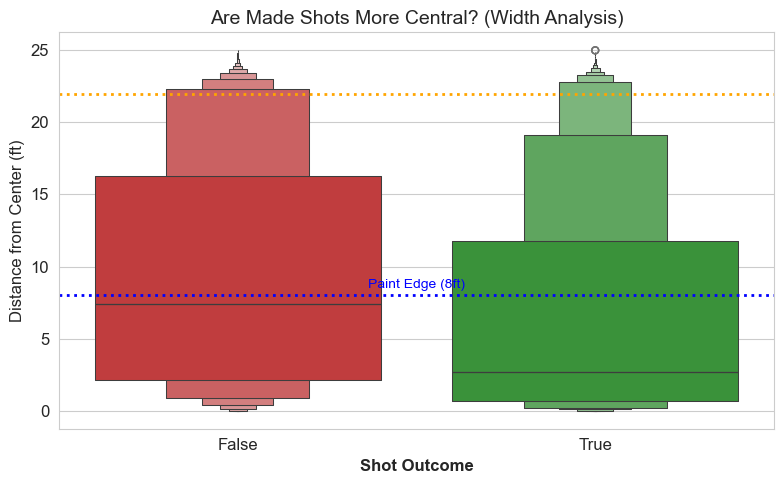

In [76]:
# --- Data Preparation ---
# Use absolute X to treat left/right symmetry consistently
if 'ABS_LOC_X' not in df_plot.columns:
    df_plot['ABS_LOC_X'] = df_plot['LOC_X'].abs()

plt.figure(figsize=(8, 5))

# Boxen plot is better suited for large datasets than a standard boxplot
# It shows more distribution detail (multiple quantile bands)
sns.boxenplot(
    data=df_plot,
    x='SHOT_MADE_BOOL',
    y='ABS_LOC_X',
    hue='SHOT_MADE_BOOL',
    palette={False: '#D62728', True: '#2CA02C'},
    dodge=False
)

# Context line: Paint edge (lane is 16 ft wide -> 8 ft from center line)
plt.axhline(8, color='blue', linestyle=':', linewidth=2)
plt.text(0.5, 8.5, "Paint Edge (8ft)", color='blue', fontsize=10, ha='center')

# Context line: Approximate corner three lateral boundary (22 ft)
plt.axhline(22, color='orange', linestyle=':', linewidth=2)

plt.xlabel('Shot Outcome', fontsize=12, fontweight='bold')
plt.ylabel('Distance from Center (ft)', fontsize=12)
plt.title('Are Made Shots More Central? (Width Analysis)', fontsize=14)

# Hide legend because hue duplicates the x-axis categories
plt.legend([], [], frameon=False)

plt.tight_layout()
plt.show()


The width distributions indicate that made shots are generally taken from more central positions compared to missed shots. The median and lower quantiles for made shots are closer to the center line, suggesting that central alignment is associated with higher accuracy. Missed shots show a broader lateral spread, with heavier mass at larger ABS_LOC_X values, indicating that attempts from wider angles are more likely to result in misses.

The reference lines provide additional context for court geometry. A substantial portion of attempts for both outcomes fall below the paint edge (8 ft), but the make distribution is more concentrated in this region, consistent with higher-efficiency shots taken near central driving lanes. As ABS_LOC_X approaches the corner-three boundary (~22 ft), the miss distribution becomes more prominent, which aligns with the increased difficulty of side/corner-angle shots. Overall, this plot supports the conclusion that **shot centrality (lower lateral distance from center)** is a meaningful spatial correlate of shot success and should remain as an important feature for downstream models.


### 7.3.7 Shooting Proficiency by Court Angle

Beyond distance and lateral position, the **shooting angle relative to the basket** provides additional insight into spatial shot efficiency. Even at similar distances, shots taken from different angles can vary in difficulty due to shooting mechanics, court geometry, and defensive positioning.

In this section, shots are analyzed using a **polar (angular) representation**, where the basket is treated as the origin. Angles are computed relative to the hoop such that **0° corresponds to the right corner**, **90° to the top of the key**, and **180° to the left corner**. Field goal percentage is then aggregated across angular bins to identify directional shooting strengths and weaknesses.


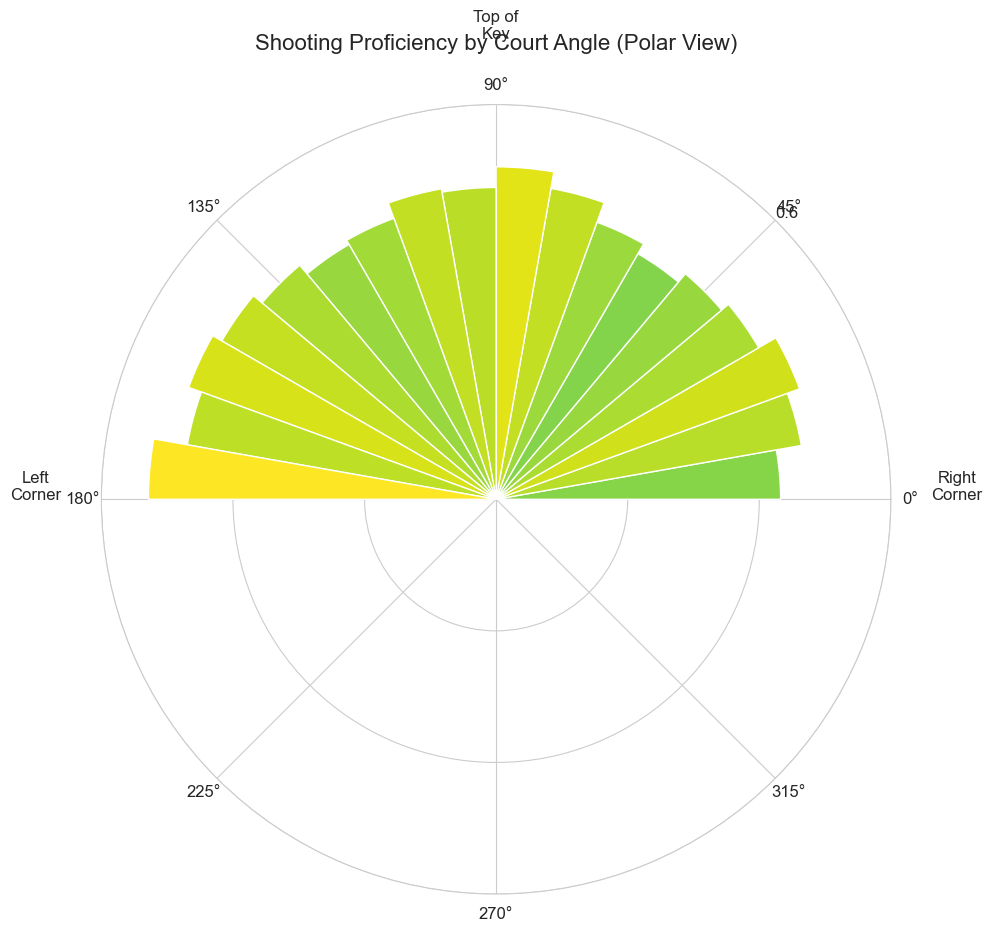

In [77]:
# --- Data Preparation ---
# Compute shot angle relative to the basket located at (0, 5.25)

rel_x = df_plot['LOC_X']
rel_y = df_plot['LOC_Y'] - 5.25  # Shift Y-coordinate relative to hoop

# arctan2 returns angles in degrees:
# 0° = right, 90° = top of key, 180° = left
df_plot['ANGLE'] = np.degrees(np.arctan2(rel_y, rel_x))

# Bin angles into 10-degree slices for aggregation
df_plot['ANGLE_BIN'] = pd.cut(
    df_plot['ANGLE'],
    bins=np.arange(0, 181, 10)
)

# Aggregate shooting efficiency by angle bin
angle_stats = df_plot.groupby('ANGLE_BIN').agg(
    fg_pct=('SHOT_MADE', 'mean'),
    shots=('SHOT_MADE', 'size')
)

# Remove bins with very few attempts to avoid noisy estimates
angle_stats = angle_stats[angle_stats['shots'] > 50]

# --- Plotting: Polar Chart ---
plt.figure(figsize=(10, 10))
ax = plt.subplot(111, polar=True)

# Convert angular bins to radians (use bin midpoints)
theta = [np.radians(bin.mid) for bin in angle_stats.index]
radii = angle_stats['fg_pct'].values
width = np.radians(10)  # 10-degree slices

# Color bars by relative efficiency
bars = ax.bar(
    theta,
    radii,
    width=width,
    bottom=0.0,
    color=plt.cm.viridis(radii / radii.max())
)

# Polar axis formatting
ax.set_theta_zero_location("E")   # 0° at right corner
ax.set_theta_direction(1)         # Counter-clockwise
ax.set_rticks([0.2, 0.4, 0.6])    # Efficiency reference rings
ax.set_rlabel_position(45)

ax.set_title(
    "Shooting Proficiency by Court Angle (Polar View)",
    fontsize=16,
    pad=20
)

# Court reference labels
ax.text(np.radians(0), 0.7, "Right\nCorner", ha='center')
ax.text(np.radians(90), 0.7, "Top of\nKey", ha='center')
ax.text(np.radians(180), 0.7, "Left\nCorner", ha='center')

plt.tight_layout()
plt.show()


The polar visualization reveals meaningful variation in shooting efficiency across court angles. Field goal percentages tend to be higher around central angles near the top of the key, where shooting mechanics are more balanced and sightlines to the basket are clearer. In contrast, efficiency declines toward wider angles, particularly near the corner regions, reflecting the increased difficulty associated with extreme shooting angles and limited space.

Uneven bar heights across the angular spectrum indicate the presence of directional “hot” and “cold” zones rather than uniform shooting performance around the basket. This asymmetry suggests that angle-specific factors capture information beyond simple distance or lateral position. Consequently, angular features provide complementary spatial information and can enhance predictive models by accounting for directional shooting tendencies that are not fully explained by depth or width alone.


### 7.3.8 Analysis of Spatial Density by Shot Action and Outcome

While previous sections focused on aggregate spatial patterns, this analysis examines **how spatial shot density varies by shot action type and outcome**. Different shot actions (e.g., jump shots, pull-ups, driving attempts) are associated with distinct movement patterns, shooting mechanics, and spatial constraints, which may influence both shot location and success rates.

To capture these differences, we visualize the spatial density of the **five most frequent shot actions** separately for made and missed shots using half-court hexbin maps. Presenting these distributions as small multiples allows for direct, action-specific comparisons between makes and misses, helping identify systematic spatial tendencies linked to both shot selection and efficiency.


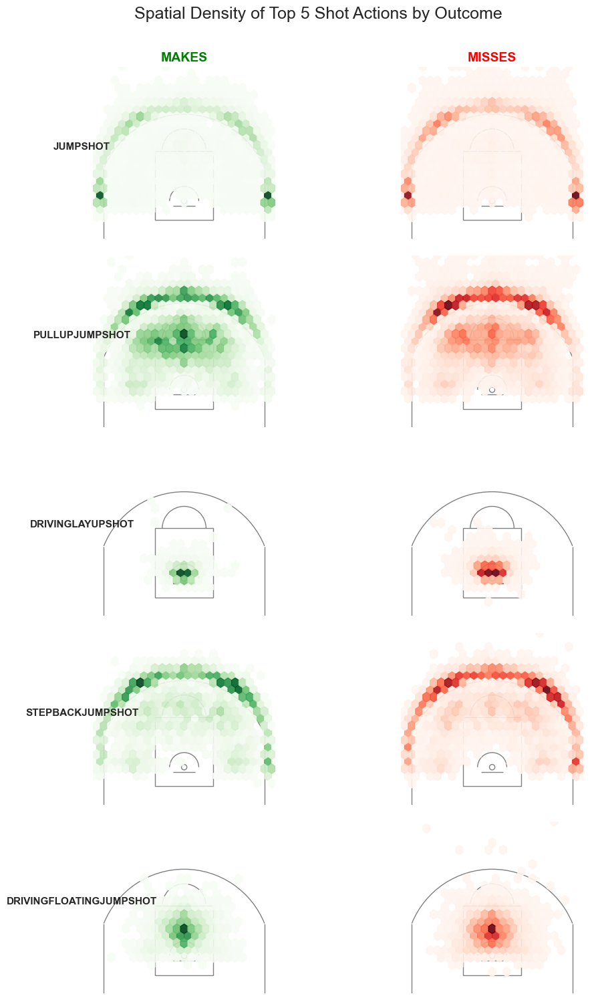

In [78]:
# --- 1. Data Preparation ---
df_plot = df.copy()

# Ensure shot outcome is consistently boolean
df_plot['SHOT_MADE_BOOL'] = (
    df_plot['SHOT_MADE']
    .replace({'TRUE': True, 'FALSE': False, 1: True, 0: False})
    .astype(bool)
)

# Filter to half-court and reasonable coordinate bounds
# Hoop is at Y = 5.25; this range captures active offensive space
df_plot = df_plot[
    df_plot['LOC_X'].between(-25, 25) &
    df_plot['LOC_Y'].between(-5, 47)
].copy()

# Select the top 5 most frequent shot actions for clarity
TOP_N = 5
top_actions = df_plot['ACTION_TYPE'].value_counts().head(TOP_N).index
df_plot = df_plot[df_plot['ACTION_TYPE'].isin(top_actions)]

# --- 2. Court Drawing Utility ---
def draw_court(ax=None, color='black', lw=1.5):
    if ax is None:
        ax = plt.gca()

    # Hoop and backboard
    ax.add_patch(patches.Circle((0, 5.25), 0.75, fill=False, lw=lw, color=color))
    ax.add_patch(patches.Rectangle((-3, 4), 6, -0.1, lw=lw, color=color))

    # Paint (lane)
    ax.add_patch(patches.Rectangle((-8, -47.5), 16, 19, fill=False, lw=lw, color=color))
    ax.add_patch(patches.Rectangle((-8, 0), 16, 19, fill=False, lw=lw, color=color))

    # Free-throw and restricted arcs
    ax.add_patch(patches.Arc((0, 19), 12, 12, theta1=0, theta2=180, lw=lw, color=color))
    ax.add_patch(patches.Arc((0, 5.25), 8, 8, theta1=0, theta2=180, lw=lw, color=color))

    # Three-point line
    ax.add_patch(patches.Rectangle((-22, -47.5), 0, 61.5, lw=lw, color=color))
    ax.add_patch(patches.Rectangle((22, -47.5), 0, 61.5, lw=lw, color=color))
    ax.add_patch(patches.Arc((0, 5.25), 47.5, 47.5, theta1=22, theta2=158, lw=lw, color=color))

    ax.set_xlim(-25, 25)
    ax.set_ylim(-5, 42)
    ax.set_aspect('equal')
    ax.axis('off')

# --- 3. Small Multiples: Action × Outcome ---
fig, axes = plt.subplots(
    nrows=TOP_N,
    ncols=2,
    figsize=(12, 18),
    sharex=True,
    sharey=True
)

outcomes = [
    {'label': 'MAKES', 'bool': True, 'cmap': 'Greens', 'title_col': 'g'},
    {'label': 'MISSES', 'bool': False, 'cmap': 'Reds', 'title_col': 'r'}
]

for row_idx, action in enumerate(top_actions):
    for col_idx, outcome in enumerate(outcomes):
        ax = axes[row_idx, col_idx]

        # Subset data for this action-outcome combination
        subset = df_plot[
            (df_plot['ACTION_TYPE'] == action) &
            (df_plot['SHOT_MADE_BOOL'] == outcome['bool'])
        ]

        # Draw court context
        draw_court(ax, color='gray', lw=1)

        # Hexbin density plot (efficient for large datasets)
        if not subset.empty:
            ax.hexbin(
                subset['LOC_X'],
                subset['LOC_Y'],
                gridsize=25,
                cmap=outcome['cmap'],
                mincnt=1,
                extent=[-25, 25, -5, 50],
                alpha=0.9
            )

        # Column titles
        if row_idx == 0:
            ax.set_title(
                outcome['label'],
                fontsize=14,
                fontweight='bold',
                color=outcome['title_col']
            )

        # Row labels (shot actions)
        if col_idx == 0:
            ax.text(
                -28, 20,
                action.replace(' ', '\n'),
                va='center',
                ha='center',
                fontsize=11,
                fontweight='bold'
            )

plt.suptitle(
    "Spatial Density of Top 5 Shot Actions by Outcome",
    y=0.93,
    fontsize=18
)
plt.subplots_adjust(wspace=0.05, hspace=0.1, left=0.15)
plt.show()


The spatial density maps reveal clear and action-specific differences between made and missed shots. For perimeter-oriented actions such as jump shots, pull-up jump shots, and step-back jump shots, made attempts tend to cluster in more controlled regions along the three-point arc and near the top of the key. Missed shots for these actions display a broader and more dispersed spatial pattern, particularly toward deeper or wider perimeter locations, suggesting increased difficulty and lower shot quality.

For interior-oriented actions such as driving layups and driving floating jump shots, made shots are tightly concentrated around the rim and central paint area, reflecting high-efficiency scoring zones. Missed attempts, while still centered near the basket, exhibit greater spread and appear more frequently at slightly offset angles or farther from the optimal finishing area. Overall, these patterns indicate that shot success is not only influenced by distance and angle but also by the **interaction between shot action type and spatial context**, supporting the inclusion of action-aware spatial features in subsequent modeling stages.


## 7.4 Temporal Dynamics (Game Flow & Fatigue)

### 7.4.1 Shooting Accuracy by Shot Clock Remaining

To examine the relationship between shot timing and accuracy, shots are grouped into short time intervals based on the number of seconds remaining on the shot clock. Field goal percentage is then computed for each interval to reveal how shooting efficiency evolves as the possession progresses.


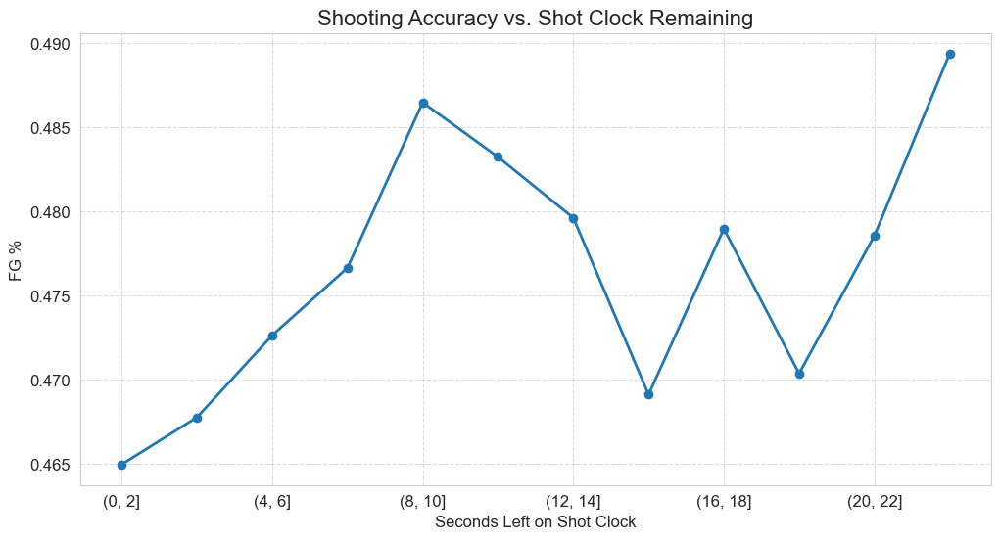

In [79]:
# --- Data Preparation ---
# Bin shot clock remaining time into 2-second intervals
df['SECONDS_BIN'] = pd.cut(
    df['SECS_LEFT'],
    bins=range(0, 25, 2)
)

# Compute average shooting accuracy (FG%) per time bin
time_stats = (
    df.groupby('SECONDS_BIN')['SHOT_MADE']
    .mean()
)

# --- Plotting ---
plt.figure(figsize=(12, 6))

time_stats.plot(
    kind='line',
    marker='o',
    linewidth=2
)

plt.title(
    'Shooting Accuracy vs. Shot Clock Remaining',
    fontsize=16
)
plt.xlabel('Seconds Left on Shot Clock')
plt.ylabel('FG %')
plt.grid(True, linestyle='--', alpha=0.7)

plt.show()


The results indicate a clear relationship between shot clock timing and shooting accuracy. Shots taken very early in the possession tend to have slightly lower efficiency, likely reflecting quick or less structured attempts before the offense fully develops. Shooting accuracy increases during the mid-range of the shot clock, suggesting that these attempts benefit from better shot selection and offensive organization.

As the shot clock approaches its final seconds, efficiency becomes more volatile and generally declines, consistent with increased defensive pressure and rushed decision-making. Although some late-clock shots are successfully converted, the overall pattern supports the notion that **time pressure negatively affects shot quality**. These findings highlight shot clock remaining as a meaningful temporal feature that captures elements of game flow and cognitive pressure, making it a valuable input for predictive modeling.


### 7.4.2 Shooting Performance by Quarter: Volume vs. Efficiency

In addition to shot clock timing, broader **game phases** may influence shooting performance through factors such as fatigue, defensive intensity, and strategic adjustments. One natural way to capture these effects is by comparing shooting behavior across **quarters and overtime periods**.

This analysis jointly examines **shot volume** and **shooting efficiency (FG%)** by quarter. Visualizing these two dimensions together allows us to distinguish between changes driven by opportunity (number of attempts) and changes driven by performance (conversion rate), while also highlighting the higher variability typically observed in overtime periods.


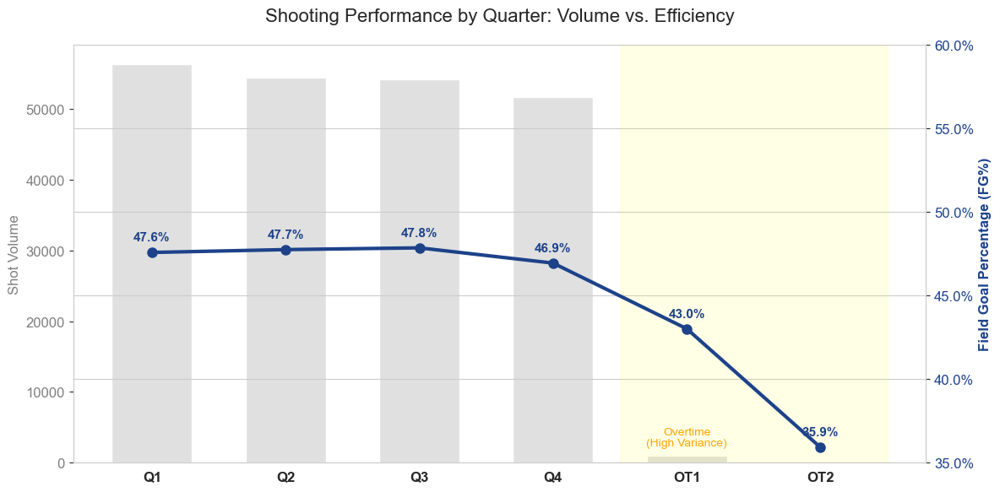

In [80]:
# --- Data Preparation ---
if 'QUARTER' in df.columns and 'SHOT_MADE' in df.columns:

    # Ensure SHOT_MADE is numeric (0/1) for aggregation
    df['is_make'] = (
        df['SHOT_MADE']
        .replace({True: 1, False: 0, 'TRUE': 1, 'FALSE': 0, 'True': 1, 'False': 0})
        .astype(int)
    )

    # Aggregate shot volume and makes by quarter
    quarter_stats = df.groupby('QUARTER').agg(
        shots=('is_make', 'size'),
        makes=('is_make', 'sum')
    )
    quarter_stats['FG_PCT'] = quarter_stats['makes'] / quarter_stats['shots']

    # --- Plot Setup ---
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # Map numeric quarters to readable labels (Q1–Q4, OT1, OT2, ...)
    quarter_labels = [
        f"Q{x}" if x <= 4 else f"OT{x-4}"
        for x in quarter_stats.index
    ]

    # --- Layer 1: Shot Volume (Background Context) ---
    ax1.bar(
        quarter_stats.index,
        quarter_stats['shots'],
        color='#e0e0e0',
        width=0.6,
        zorder=1
    )
    ax1.set_ylabel("Shot Volume", color='gray', fontsize=12)
    ax1.tick_params(axis='y', labelcolor='gray')
    ax1.grid(False)

    # --- Layer 2: Shooting Efficiency (FG%) ---
    ax2 = ax1.twinx()
    ax2.plot(
        quarter_stats.index,
        quarter_stats['FG_PCT'],
        color='#1d428a',
        marker='o',
        linewidth=3,
        markersize=8,
        zorder=2
    )

    ax2.set_ylabel(
        "Field Goal Percentage (FG%)",
        color='#1d428a',
        fontsize=12,
        fontweight='bold'
    )
    ax2.tick_params(axis='y', labelcolor='#1d428a')
    ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    ax2.set_ylim(0.35, 0.6)

    # Annotate exact FG% values
    for i, fg in enumerate(quarter_stats['FG_PCT']):
        ax2.annotate(
            f"{fg:.1%}",
            (quarter_stats.index[i], fg),
            textcoords="offset points",
            xytext=(0, 10),
            ha='center',
            fontsize=11,
            fontweight='bold',
            color='#1d428a'
        )

    # --- Formatting ---
    ax1.set_xticks(quarter_stats.index)
    ax1.set_xticklabels(quarter_labels, fontsize=12, fontweight='bold')
    ax1.set_title(
        "Shooting Performance by Quarter: Volume vs. Efficiency",
        fontsize=16,
        pad=20
    )

    # Highlight overtime periods if present
    if len(quarter_stats) > 4:
        plt.axvspan(
            4.5,
            quarter_stats.index.max() + 0.5,
            color='yellow',
            alpha=0.1
        )
        plt.text(
            5,
            ax2.get_ylim()[0] + 0.01,
            "Overtime\n(High Variance)",
            fontsize=10,
            color='orange',
            ha='center'
        )

    fig.tight_layout()
    plt.show()

Across the four regulation quarters, shooting efficiency remains relatively stable, with only modest variation from Q1 through Q3 and a slight decline in Q4. This pattern suggests that while fatigue and defensive intensity may increase as the game progresses, overall shot quality is largely maintained during regulation play. Shot volume is also relatively consistent across quarters, indicating stable offensive opportunity throughout the game.

In contrast, overtime periods exhibit a sharp decline in shooting efficiency alongside substantially lower shot volume. The reduced number of attempts makes field goal percentages in overtime highly volatile, amplifying the impact of individual makes or misses. This behavior is consistent with heightened pressure, fatigue, and selective shot-taking during overtime possessions. Overall, the results indicate that **quarter-level game phases capture meaningful temporal structure**, while overtime should be treated cautiously in modeling due to its low volume and high variance.


### 7.4.3 Shooting Accuracy Drift by Quarter (Fatigue Check)

While previous analyses examined shot volume and efficiency separately, this section focuses on the **relative composition of makes and misses** across game quarters. By expressing shooting outcomes as proportions rather than absolute values, we can directly assess whether shot success deteriorates as the game progresses.

This proportional view provides a simple but effective **fatigue and pressure check**, revealing whether later game phases are associated with a systematic shift toward missed shots, independent of overall shot volume.


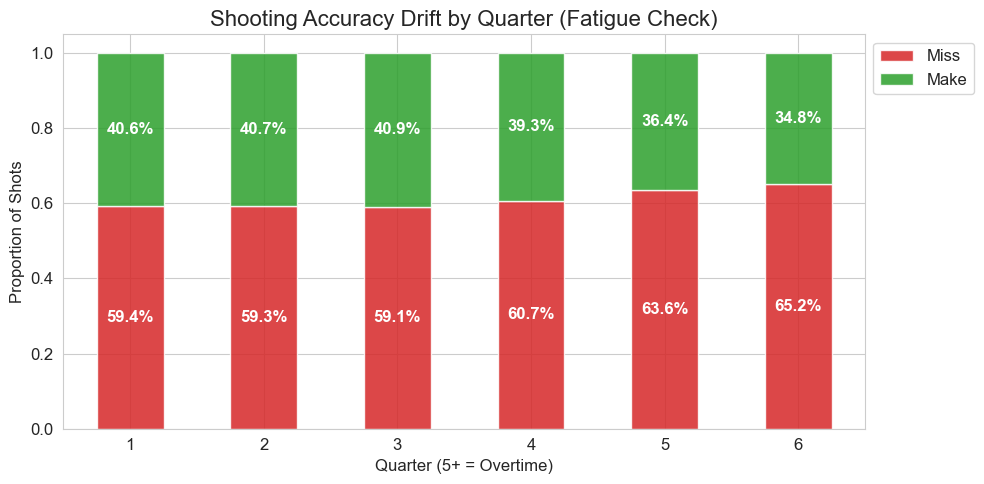

In [81]:
# --- Data Preparation ---
# Compute proportional distribution of makes vs misses by quarter
q_stats = (
    df_plot
    .groupby('QUARTER')['SHOT_MADE_BOOL']
    .value_counts(normalize=True)
    .unstack()
)

# --- Plotting ---
fig, ax = plt.subplots(figsize=(10, 5))

# Stacked bar chart showing proportion of misses and makes
q_stats.plot(
    kind='bar',
    stacked=True,
    color=['#d62728', '#2ca02c'],
    alpha=0.85,
    ax=ax
)

# Add percentage annotations inside each bar segment
for container in ax.containers:
    labels = [
        f'{bar.get_height():.1%}' if bar.get_height() > 0.1 else ''
        for bar in container
    ]
    ax.bar_label(
        container,
        labels=labels,
        label_type='center',
        color='white',
        fontweight='bold',
        fontsize=12
    )

# Formatting
ax.set_title(
    'Shooting Accuracy Drift by Quarter (Fatigue Check)',
    fontsize=16
)
ax.set_ylabel('Proportion of Shots')
ax.set_xlabel('Quarter (5+ = Overtime)')
ax.legend(['Miss', 'Make'], loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()


The proportional breakdown of makes and misses shows a gradual decline in shooting success as the game progresses. During the first three quarters, the share of made shots remains relatively stable, indicating consistent shooting performance during regulation play. However, starting in the fourth quarter, the proportion of misses increases noticeably, suggesting the combined effects of fatigue, defensive tightening, and higher-pressure shot selection.

This trend becomes even more pronounced in overtime periods, where the make proportion drops sharply. Although overtime contains fewer total shots, the relative shift toward missed attempts highlights increased volatility and reduced efficiency under extreme game conditions. Overall, the results support the presence of a **late-game accuracy drift**, reinforcing quarter-based indicators as meaningful temporal features while underscoring the need to treat overtime observations cautiously in predictive modeling.


### 7.4.4 Analysis of Time Pressure on Shooting Accuracy

While previous sections relied on discrete groupings of shot clock time, this analysis adopts a **continuous perspective** to examine how shooting accuracy evolves as time pressure changes. Rather than comparing predefined bins or quarters, we model the relationship between shot clock remaining and shot success directly.

A regression-based visualization is used to capture potential **non-linear effects**, such as whether accuracy peaks during mid-possession and declines under extreme time pressure. This approach provides a smoother and more generalizable view of how decision time influences shooting outcomes.


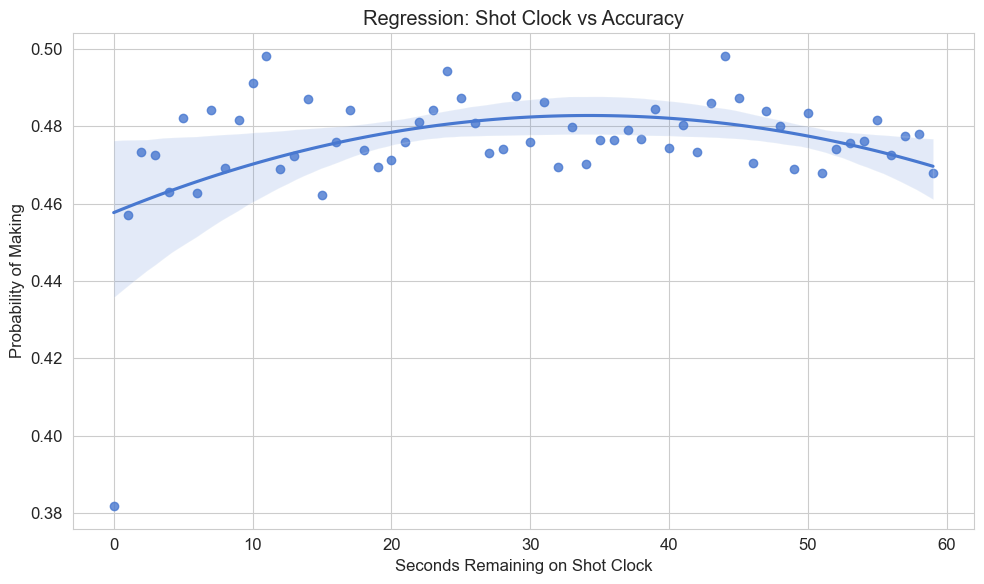

In [82]:
# --- Setup ---
plt.rcParams['figure.figsize'] = (10, 6)
sns.set_palette("muted")

# --- Data Preparation ---
time_bins = df.copy()

# Round shot clock remaining to whole seconds for stability
time_bins['SEC_BIN'] = time_bins['SECS_LEFT'].round()

# Compute probability of making a shot at each second
prob_by_time = (
    time_bins
    .groupby('SEC_BIN')['SHOT_MADE']
    .mean()
    .reset_index()
)

# --- Plotting ---
plt.figure()

# Quadratic regression captures potential non-linear time-pressure effects
sns.regplot(
    x='SEC_BIN',
    y='SHOT_MADE',
    data=prob_by_time,
    order=2
)

plt.title("Regression: Shot Clock vs Accuracy")
plt.ylabel("Probability of Making")
plt.xlabel("Seconds Remaining on Shot Clock")
plt.tight_layout()
plt.show()


The regression results reveal a clear non-linear relationship between shot clock remaining and shooting accuracy. Accuracy tends to be lower at very early possession times, increases as the offense settles into structured play, and then gradually declines as the shot clock approaches zero. This inverted U-shaped pattern suggests that both insufficient setup time and extreme time pressure are associated with reduced shot quality.

The widening confidence intervals at the edges of the shot clock indicate higher uncertainty, reflecting fewer observations and greater variability in these situations. Overall, the analysis confirms that **time pressure affects shooting accuracy in a continuous and non-linear manner**, reinforcing the value of shot-clock-related features in predictive models. In particular, treating shot clock as a continuous variable—or modeling non-linear effects explicitly—may provide additional explanatory power beyond simple early/late possession indicators.


### 7.4.5 Shot Timing vs. Outcome (Quarter Management)

Beyond shot clock pressure, teams also manage possessions across the **entire quarter**, balancing early-shot opportunities against late, often higher-pressure attempts. This section examines **when shots are taken within a quarter** and how timing differs by both **shot type (2PT vs. 3PT)** and **shot outcome**.

By combining minutes and seconds remaining into a single time measure, we analyze whether made and missed shots tend to occur at systematically different points in the quarter. This provides insight into **quarter-level time management**, particularly in late-quarter and last-possession scenarios.


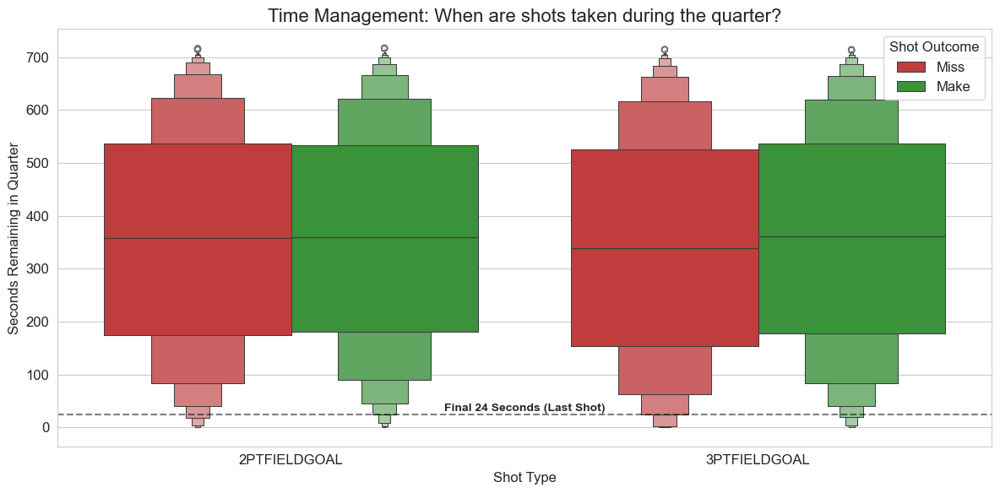

In [83]:
# --- Data Preparation ---
df_plot = df.copy()

# Map shot outcome to readable labels
df_plot['outcome'] = df_plot['SHOT_MADE'].map({
    True: 'Make',
    False: 'Miss'
})

# Combine minutes and seconds into total seconds remaining in the quarter
df_plot['TOTAL_SECONDS'] = (
    df_plot['MINS_LEFT'] * 60 +
    df_plot['SECS_LEFT']
)

# --- Plotting ---
plt.figure(figsize=(12, 6))

# Boxenplot captures full distribution and is robust for large samples
sns.boxenplot(
    data=df_plot,
    x='SHOT_TYPE',
    y='TOTAL_SECONDS',
    hue='outcome',
    palette={'Make': '#2ca02c', 'Miss': '#d62728'}
)

plt.title(
    'Time Management: When are shots taken during the quarter?',
    fontsize=16
)
plt.ylabel('Seconds Remaining in Quarter')
plt.xlabel('Shot Type')
plt.legend(title='Shot Outcome')

# Reference line for end-of-quarter / last-shot situations
plt.axhline(
    24,
    color='black',
    linestyle='--',
    alpha=0.5
)
plt.text(
    0.5,
    30,
    'Final 24 Seconds (Last Shot)',
    ha='center',
    fontsize=10,
    fontweight='bold'
)

plt.tight_layout()
plt.show()


The distribution of shot timing within the quarter reveals clear differences by shot type and outcome. For both two-point and three-point attempts, made shots tend to occur slightly earlier in the quarter compared to missed shots, suggesting that better-organized possessions and lower time pressure are associated with higher efficiency. Missed shots exhibit a heavier concentration closer to the end of the quarter, where decision-making is more constrained and defensive pressure intensifies.

The contrast is particularly pronounced for three-point shots, which show a wider spread and a stronger clustering near the final seconds of the quarter. This pattern is consistent with end-of-quarter situations where teams rely more heavily on perimeter attempts, often under tight timing constraints. Overall, the results indicate that **quarter-level time management interacts with shot selection and efficiency**, reinforcing temporal features that capture both possession-level and quarter-level pressure dynamics in predictive modeling.


### 7.4.6 Shot Timing Responsibilities by Position (The “Bail Out” Factor)

Beyond team-level timing patterns, **shot timing responsibilities are often distributed by player position**. In late-possession or end-of-quarter situations, certain positions are more likely to take difficult, low-time-remaining shots, often referred to as “bail out” attempts, while others primarily operate earlier in the offensive sequence.

This section analyzes **when shots are taken within the quarter across positions**, using total seconds remaining as a proxy for time pressure. By sorting positions based on their typical shot timing, we can identify which roles tend to absorb late-clock responsibility versus those that function as early or mid-possession finishers.


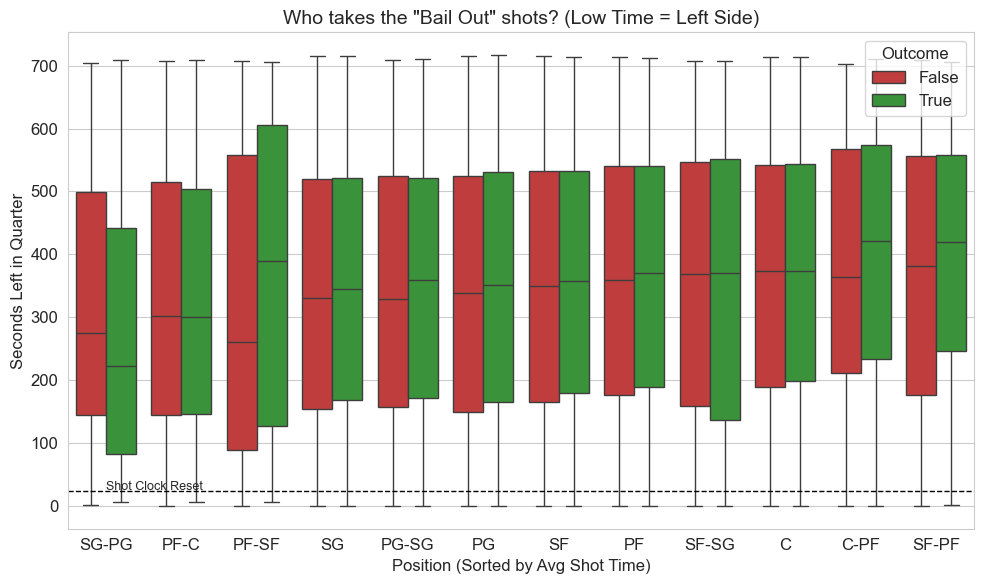

In [84]:
# --- Safety Check: Ensure SHOT_MADE_BOOL exists ---
if "SHOT_MADE_BOOL" not in df_plot.columns:
    if "SHOT_MADE" in df_plot.columns:
        df_plot["SHOT_MADE_BOOL"] = (
            df_plot["SHOT_MADE"]
            .replace({'TRUE': True, 'FALSE': False, 'True': True, 'False': False})
            .astype(bool)
        )
    elif "Shot_Made" in df_plot.columns:
        df_plot["SHOT_MADE_BOOL"] = df_plot["Shot_Made"].astype(bool)
    else:
        raise KeyError("Cannot construct SHOT_MADE_BOOL: missing source column.")

# --- Position Ordering ---
# Sort positions by median time left in the quarter
# Positions on the left take shots later (higher time pressure)
order = (
    df_plot
    .groupby('POSITION')['TOTAL_SECONDS']
    .median()
    .sort_values(ascending=True)
    .index
)

# --- Plotting ---
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=df_plot,
    x='POSITION',
    y='TOTAL_SECONDS',
    hue='SHOT_MADE_BOOL',
    order=order,  # Critical: enforces timing-based ordering
    palette={False: '#D62728', True: '#2CA02C'}
)

plt.xlabel('Position (Sorted by Avg Shot Time)', fontsize=12)
plt.ylabel('Seconds Left in Quarter', fontsize=12)
plt.title(
    'Who takes the "Bail Out" shots? (Low Time = Left Side)',
    fontsize=14
)
plt.legend(title='Outcome', loc='upper right')

# Shot clock reset reference
plt.axhline(24, color='black', linestyle='--', linewidth=1)
plt.text(0, 26, "Shot Clock Reset", fontsize=9)

plt.tight_layout()
plt.show()


The position-level distributions reveal a clear stratification of shot timing responsibilities. Positions located on the left side of the plot, primarily guard and guard-forward combinations, tend to take shots with fewer seconds remaining in the quarter. This indicates a greater exposure to late-clock and high-pressure situations, consistent with ball-handling and isolation-heavy roles that often absorb stalled possessions.

In contrast, positions on the right side of the plot, most notably centers and forward-center roles, tend to shoot earlier within the quarter. These players are more likely to function as finishers within structured offensive actions, benefiting from lower time pressure and higher shot quality. Overall, the results highlight a pronounced **“bail out” effect by position**, suggesting that temporal pressure is not evenly distributed across roles and should be modeled in interaction with player position rather than as a uniform team-level factor.


## 7.5 Player, Position & Team Segmentation

### 7.5.1 Conversion Probability by Specific Shot Action

This analysis examines how shot efficiency varies across different shot action types. Since shot actions capture the mechanical and contextual difficulty of an attempt (e.g., dunks versus off-the-dribble jump shots), they provide an intuitive baseline for understanding shot quality before moving to predictive modeling.

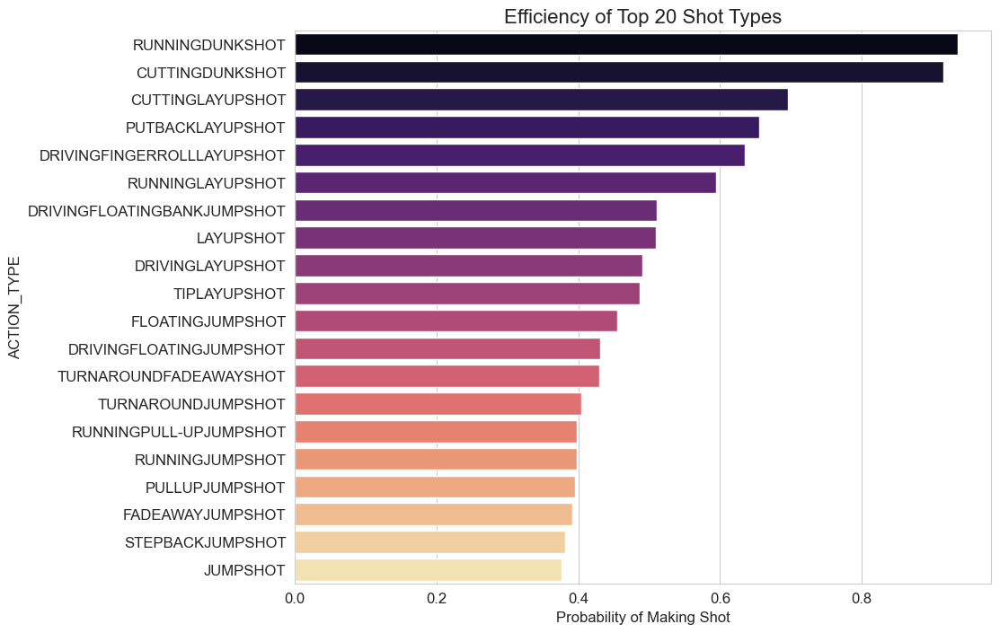

In [85]:
# Select the top 20 most frequent shot action types to ensure statistical stability
top_actions = df['ACTION_TYPE'].value_counts().nlargest(20).index
action_df = df[df['ACTION_TYPE'].isin(top_actions)]

# Compute conversion probability (mean of SHOT_MADE) for each action type
action_stats = action_df.groupby('ACTION_TYPE')['SHOT_MADE'].mean().sort_values(ascending=False).reset_index()

# Plot efficiency ranking
plt.figure(figsize=(10, 8))
sns.barplot(x='SHOT_MADE', y='ACTION_TYPE', data=action_stats, palette='magma')
plt.title('Efficiency of Top 20 Shot Types', fontsize=16)
plt.xlabel('Probability of Making Shot')
plt.show()

The horizontal bar chart reveals a clear hierarchy of shot efficiency driven by action type. Explosive, at-the-rim actions such as Running Dunks and Cutting Dunks dominate the top of the ranking, exhibiting conversion probabilities above 90% and effectively functioning as near-certain scoring opportunities. As shot actions transition toward layups and driving finishes, efficiency decreases into the 60–70% range, reflecting increased defensive pressure and execution complexity. The lowest efficiencies are observed for self-created perimeter shots such as Fadeaway and Stepback Jump Shots, which cluster around the 40% range. This pattern confirms that shot quality is strongly action-dependent and provides empirical justification for including shot action type as a key explanatory feature in subsequent predictive models.

### 7.5.2 Team Efficiency

This section explores whether shooting efficiency varies systematically across teams when playing at home. While individual shots are driven by player- and action-level factors, team-level aggregation can reveal structural differences related to offensive systems, roster composition, and potential home-court effects.

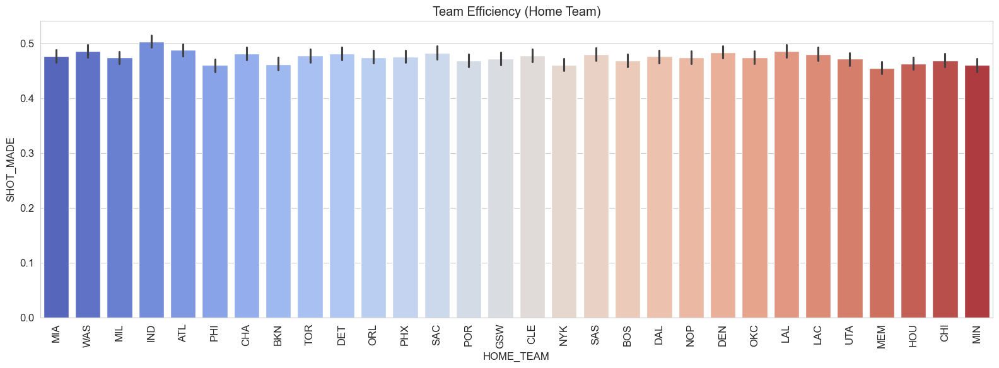

In [86]:
# Visualize average shooting efficiency by home team
# SHOT_MADE is treated as a binary variable, so the mean corresponds to FG%
fig, ax = plt.subplots(figsize=(16, 6))

sns.barplot(
    x='HOME_TEAM',
    y='SHOT_MADE',
    data=df,
    ax=ax,
    palette='coolwarm'
)

ax.set_title("Team Efficiency (Home Team)")
ax.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()


The bar chart shows moderate but consistent variation in shooting efficiency across home teams, with most teams clustering tightly around the league-wide average of approximately 47–49%. While a few teams appear marginally more efficient at home and others slightly below average, the overall spread is relatively narrow, suggesting that team identity alone is not a dominant driver of shot success at the individual attempt level. This indicates that team effects are likely secondary to more granular factors such as shot location, action type, and time pressure, and supports the modeling choice to prioritize contextual and spatial features over raw team identifiers.

### 7.5.3 Shot Distance Distribution by Player Position

Shot selection in basketball is strongly shaped by player role and on-court responsibilities. Guards, Forwards, and Centers are expected to operate in distinct spatial zones, which directly influences both the distance and difficulty of their shot attempts. To examine how shot distance varies across positions—and how this variation relates to shot success—this analysis compares the distribution of shot distances for broad position groups using a split violin visualization, allowing made and missed shots to be evaluated simultaneously within each role.

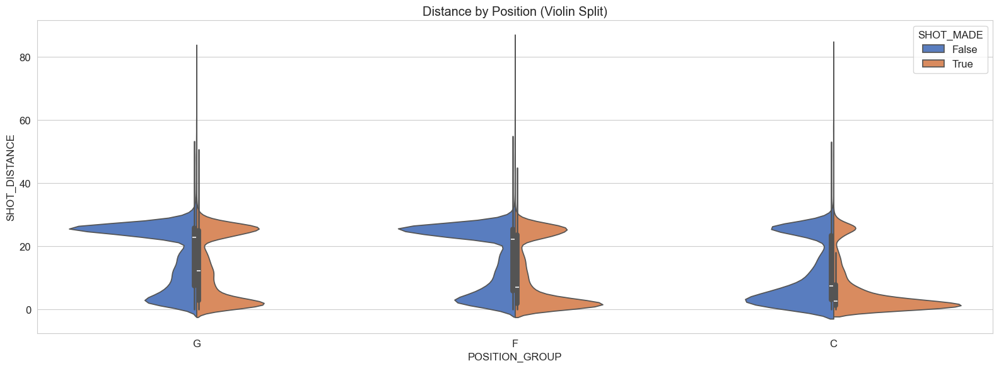

In [87]:
# Compare shot distance distributions across broad position groups
# G = Guards, F = Forwards, C = Centers
# Split violins allow direct comparison of makes vs misses within each position group

fig, ax = plt.subplots(figsize=(16, 6))

sns.violinplot(
    x='POSITION_GROUP',
    y='SHOT_DISTANCE',
    hue='SHOT_MADE',
    data=df,
    split=True,             # Split by shot outcome (Make vs Miss)
    ax=ax
)

ax.set_title("Distance by Position (Violin Split)")

plt.tight_layout()
plt.show()

This split violin plot highlights clear positional differences in shot selection and efficiency. Centers show a strongly bottom-heavy distribution, with both attempted and made shots concentrated very close to the basket, confirming their primary role as interior finishers. Guards display a distinctly bimodal pattern, combining rim attempts with a pronounced peak around the three-point line (~25 ft), reflecting their responsibility for perimeter shot creation. Forwards occupy an intermediate role, blending interior scoring with substantial mid-range and three-point activity. Overall, the figure demonstrates that shot distance is systematically structured by player position, reinforcing the importance of positional context when modeling shot success probabilities.

### 7.5.4 Shooting Efficiency by Player Position

While shot distance and action type explain a large portion of shooting success, player position provides an additional structural layer that captures role-based differences in shot difficulty and spatial responsibility. Guards, forwards, and centers operate in systematically different areas of the court and are exposed to different defensive pressures, which should be reflected in their field goal efficiency. To quantify these differences, this analysis compares shooting efficiency across detailed position labels, incorporating statistical uncertainty through error bars to distinguish high-volume, reliable estimates from small-sample outcomes.

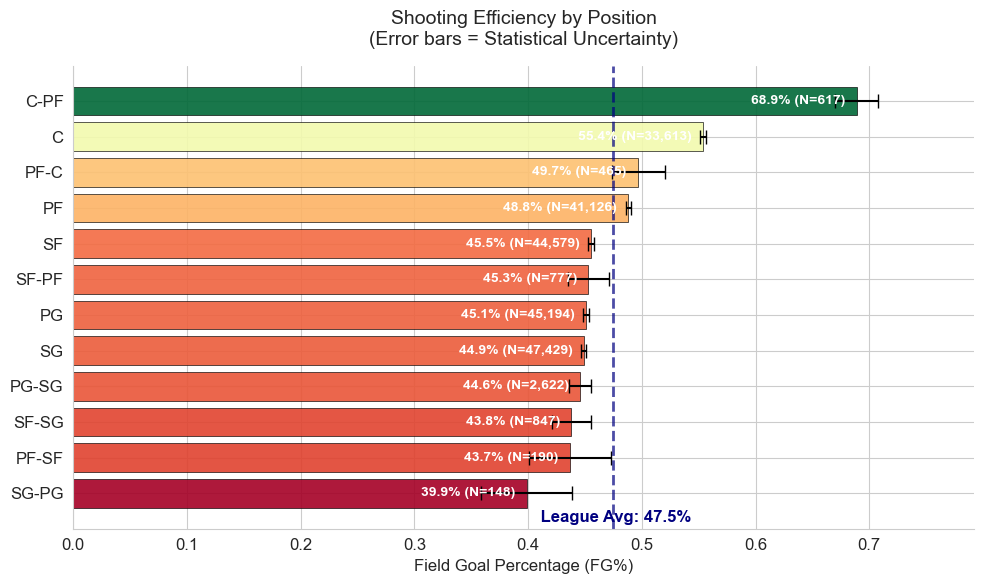

Interpretation: 
1. The black lines (whiskers) are Error Bars. Short lines = High Consistency (High Volume). Long lines = Unreliable data (Low Volume). 
2. Positions like 'Center' usually lead in FG% because they take easier shots (dunks/layups).


In [88]:
# Convert SHOT_MADE into a numeric target for aggregation (1 = make, 0 = miss)
# This allows direct computation of FG%, sample size (N), and standard error
if 'POSITION' in df.columns and 'SHOT_MADE' in df.columns:

    df['is_make_num'] = df['SHOT_MADE'].replace({True: 1, False: 0, 'TRUE': 1, 'FALSE': 0}).astype(int)

    # Aggregate by position: mean = FG%, count = volume, sem = statistical uncertainty
    position_stats = df.groupby('POSITION')['is_make_num'].agg(['mean', 'count', 'sem'])

    # Remove positions with very small sample sizes to avoid noisy estimates
    position_stats = position_stats[position_stats['count'] > 10]

    # Sort by shooting efficiency
    position_stats = position_stats.sort_values('mean', ascending=True)

    # --- Plotting ---
    fig, ax = plt.subplots(figsize=(10, 6))

    # Color scale: red (low efficiency) → green (high efficiency)
    norm = plt.Normalize(position_stats['mean'].min(), position_stats['mean'].max())
    colors = plt.cm.RdYlGn(norm(position_stats['mean'].values))

    # Horizontal bar chart with error bars (SEM)
    bars = ax.barh(position_stats.index, position_stats['mean'],
                   xerr=position_stats['sem'], capsize=5,
                   color=colors, alpha=0.9, edgecolor='black', linewidth=0.5)

    # Annotate bars with FG% and sample size
    for bar, count, pct in zip(bars, position_stats['count'], position_stats['mean']):
        width = bar.get_width()
        label_text = f"{pct:.1%} (N={count:,})"

        if width < 0.1:
            x_pos = width + 0.01
            color = 'black'
            align = 'left'
        else:
            x_pos = width - 0.01
            color = 'white'
            align = 'right'

        ax.text(x_pos, bar.get_y() + bar.get_height()/2, label_text,
                va='center', ha=align, color=color, fontweight='bold', fontsize=10)

    # League-average reference line
    league_avg = df['is_make_num'].mean()
    ax.axvline(league_avg, color='navy', linestyle='--', linewidth=2, alpha=0.7)
    ax.text(league_avg, -0.8, f" League Avg: {league_avg:.1%}", color='navy', fontweight='bold', ha='center')

    # Formatting
    ax.set_xlabel("Field Goal Percentage (FG%)", fontsize=12)
    ax.set_title("Shooting Efficiency by Position\n(Error bars = Statistical Uncertainty)", fontsize=14, pad=15)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_xlim(0, position_stats['mean'].max() * 1.15)

    plt.tight_layout()
    plt.show()

    print("Interpretation: \n1. The black lines (whiskers) are Error Bars. Short lines = High Consistency (High Volume). Long lines = Unreliable data (Low Volume). \n2. Positions like 'Center' usually lead in FG% because they take easier shots (dunks/layups).")
else:
    print("⚠️ Skipping: Missing necessary columns")

The results reveal a clear positional efficiency gradient aligned with shot difficulty and court location. Center-dominant roles (C, C–PF, PF–C) lead the league in field goal percentage, benefiting from high-frequency rim attempts such as dunks and layups. Guard-heavy positions cluster below the league average, reflecting the greater reliance on perimeter and self-created shots. Error bars further highlight the importance of sample size: narrow whiskers for high-volume positions indicate stable estimates, while wider bars for hybrid roles signal higher uncertainty. Overall, the analysis confirms that player position is a meaningful structural determinant of shooting efficiency and a valuable contextual feature for downstream modeling.

### 7.5.5 Analysis of Player Efficiency Distribution (The Talent Curve)

Beyond team- and position-level patterns, shooting efficiency ultimately reflects individual player skill and shot selection. However, raw player-level percentages can be misleading due to small sample sizes and extreme shot profiles. To capture the underlying distribution of shooting talent across the league, this analysis examines field goal percentages at the player level while restricting attention to players with a sufficient number of attempts. By visualizing the distribution using a histogram and kernel density estimate, the goal is to identify the typical efficiency range, assess skewness in the talent curve, and isolate high-efficiency outliers driven by specialized offensive roles.

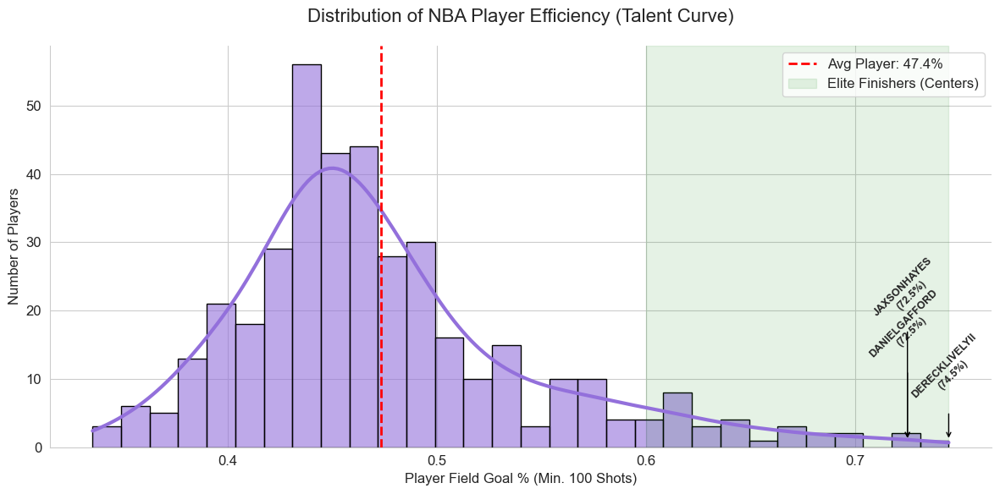

Interpretation: 
1. Notice the 'Right Skew': The curve has a long tail to the right. These are Centers (like Gafford, Gobert) who only take high-percentage dunks.
2. The 'Peak' (Mode) is usually around 43-45%, which represents the typical Guard/Wing efficiency.


In [89]:
# Aggregate shot outcomes at the player level and compute FG%
# Restrict to players with a minimum number of shots to reduce noise
if 'PLAYER_NAME' in df.columns and 'SHOT_MADE' in df.columns:

    df['is_make_num'] = df['SHOT_MADE'].replace({True: 1, False: 0, 'TRUE': 1, 'FALSE': 0}).astype(int)
    
    # Aggregate by player
    player_stats = df.groupby('PLAYER_NAME').agg(
        shots=('is_make_num', 'size'),
        makes=('is_make_num', 'sum')
    )
    player_stats['FG_PCT'] = player_stats['makes'] / player_stats['shots']
    
    # Filter for qualified players (minimum shot threshold)
    qualified_players = player_stats[player_stats['shots'] >= 100].copy()

    # --- Plotting ---
    fig, ax = plt.subplots(figsize=(12, 6))

    # Histogram with KDE to show the talent distribution
    sns.histplot(
        qualified_players['FG_PCT'],
        bins=30,
        kde=True,
        color='mediumpurple',
        edgecolor='black',
        alpha=0.6,
        line_kws={'linewidth': 3, 'color': 'indigo'} # Thicker KDE line
    )

    # League average reference
    mean_fg = qualified_players['FG_PCT'].mean()
    median_fg = qualified_players['FG_PCT'].median()

    ax.axvline(mean_fg, color='red', linestyle='--', linewidth=2, label=f'Avg Player: {mean_fg:.1%}')

    # Annotate top efficiency outliers
    top_players = qualified_players.sort_values('FG_PCT', ascending=False).head(3)

    y_offsets = [6, 12, 18]

    for (player, row), y_off in zip(top_players.iterrows(), y_offsets):
        ax.annotate(
            f"{player}\n({row['FG_PCT']:.1%})",
            xy=(row['FG_PCT'], 1),
            xytext=(row['FG_PCT'], y_off),
            arrowprops=dict(arrowstyle='->', linewidth=1, color='black'),
            ha='center',
            fontsize=9,
            fontweight='bold',
            rotation=45
        )

    # Formatting
    ax.set_xlabel('Player Field Goal % (Min. 100 Shots)', fontsize=12)
    ax.set_ylabel('Number of Players', fontsize=12)
    ax.set_title('Distribution of NBA Player Efficiency (Talent Curve)', fontsize=16, pad=20)
    ax.axvspan(0.60, qualified_players['FG_PCT'].max(), color='green', alpha=0.1, label='Elite Finishers (Centers)')
    plt.legend(loc='upper right')
    sns.despine()

    plt.tight_layout()
    plt.show()

    print("Interpretation: \n1. Notice the 'Right Skew': The curve has a long tail to the right. These are Centers (like Gafford, Gobert) who only take high-percentage dunks.\n2. The 'Peak' (Mode) is usually around 43-45%, which represents the typical Guard/Wing efficiency.")

else:
    print("⚠️ Skipping: PLAYER_NAME not found.")

The resulting distribution reveals a pronounced right-skewed talent curve. Most qualified players cluster around a modal efficiency of approximately 43–45%, representing the typical guard and wing shot profile. The league average is pulled upward by a long right tail consisting of highly efficient specialists, primarily centers whose offensive roles emphasize dunks and close-range finishes. The highlighted elite zone above 60% illustrates how shot diet—not just shooting skill—can dramatically inflate efficiency metrics. This pattern underscores the importance of contextual features, such as shot distance and action type, when modeling shot success at the individual level.

### 7.5.6 Volume vs. Efficiency (The "MVP Matrix")

While raw shooting percentages capture efficiency, they fail to account for offensive responsibility. High-efficiency players may operate in narrowly defined roles with limited shot volume, whereas primary scorers must sustain efficiency under heavy usage. To reconcile this trade-off, this analysis introduces the “MVP Matrix,” which jointly examines shot volume and scoring efficiency at the player level. By mapping total shot attempts against points per shot, the visualization distinguishes true high-impact offensive stars from low-volume specialists and inefficient high-usage scorers.

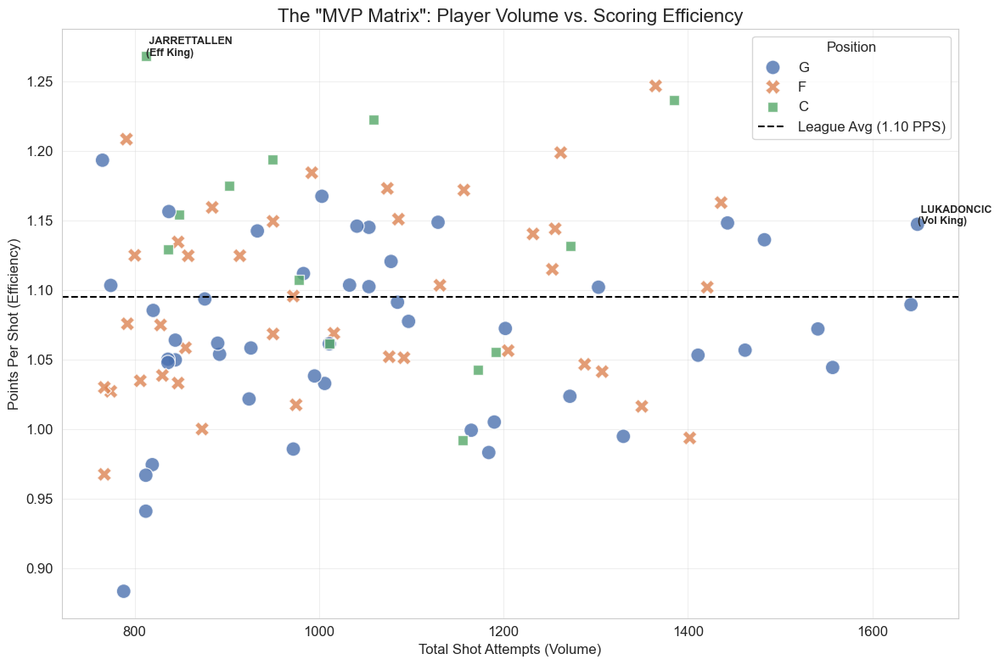

Insight: Players in the Top-Right are your true stars. Players in the Bottom-Right are taking shots away from better teammates.


In [90]:
# Calculate Points Per Shot (PPS) for each player
df_mvp = df.copy()

# Assign points: 3 for made 3PT shots, 2 for made 2PT shots
df_mvp['POINTS'] = df_mvp.apply(lambda x: 3 if '3' in str(x['SHOT_TYPE']) and x['SHOT_MADE'] else (2 if x['SHOT_MADE'] else 0), axis=1)

# Aggregate at player-position level
player_stats = df_mvp.groupby(['PLAYER_NAME', 'POSITION_GROUP']).agg(
    attempts=('SHOT_MADE', 'size'),
    total_points=('POINTS', 'sum')
)

player_stats['PPS'] = player_stats['total_points'] / player_stats['attempts']

# Focus on high-usage players (Top 100 by volume)
top_volume = player_stats.sort_values('attempts', ascending=False).head(100)

# --- Plotting ---
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=top_volume,
    x='attempts',
    y='PPS',
    hue='POSITION_GROUP',
    style='POSITION_GROUP',
    s=150,
    palette='deep',
    alpha=0.8
)

# Identify extreme cases
top_player = top_volume.sort_values('PPS', ascending=False).iloc[0]
most_shots = top_volume.sort_values('attempts', ascending=False).iloc[0]

# Annotate key players
plt.text(top_player['attempts'], top_player['PPS'], f" {top_player.name[0]}\n(Eff King)", fontsize=9, fontweight='bold')
plt.text(most_shots['attempts'], most_shots['PPS'], f" {most_shots.name[0]}\n(Vol King)", fontsize=9, fontweight='bold')

# League average reference line
league_avg_pps = df_mvp['POINTS'].sum() / len(df_mvp)
plt.axhline(league_avg_pps, color='black', linestyle='--', label=f'League Avg ({league_avg_pps:.2f} PPS)')

plt.title('The "MVP Matrix": Player Volume vs. Scoring Efficiency', fontsize=16)
plt.xlabel('Total Shot Attempts (Volume)', fontsize=12)
plt.ylabel('Points Per Shot (Efficiency)', fontsize=12)
plt.legend(title='Position')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("Insight: Players in the Top-Right are your true stars. Players in the Bottom-Right are taking shots away from better teammates.")

The MVP Matrix highlights the fundamental trade-off between usage and efficiency in offensive basketball. Players in the top-right quadrant combine elite efficiency with high shot volume, representing true franchise-level offensive engines, exemplified by Luka Dončić as the league’s primary “Volume King.” In contrast, the top-left quadrant is populated by centers such as Jarrett Allen, whose exceptional efficiency stems from narrowly defined, high-percentage finishing roles rather than offensive creation. The dashed league-average line (~1.10 PPS) acts as a performance threshold, revealing that high-volume players below this line are statistically inefficient and likely reduce overall team scoring efficiency. Together, these patterns reinforce the importance of contextualizing efficiency metrics within offensive responsibility.

### 7.5.7 Team Tactical Landscape: Shot Selection Strategy

This scatter plot maps every NBA team's offensive philosophy by contrasting their frequency of 3-point shots (x-axis) against rim attempts (y-axis). The Analytics Zone (green quadrant) represents the theoretical ideal of modern efficiency—maximizing both dunks and threes—though most teams settle into distinct clusters. Boston (BOS) operates as a singular outlier on the far right, committing to extreme 3-point volume (~47%) at the expense of rim pressure. Conversely, the Mid-Range Zone (red quadrant) highlights teams like Phoenix (PHX) and Chicago (CHI), whose personnel-driven strategies favor "old school" intermediate jump shots over the statistically optimized "Rim & 3" profile.

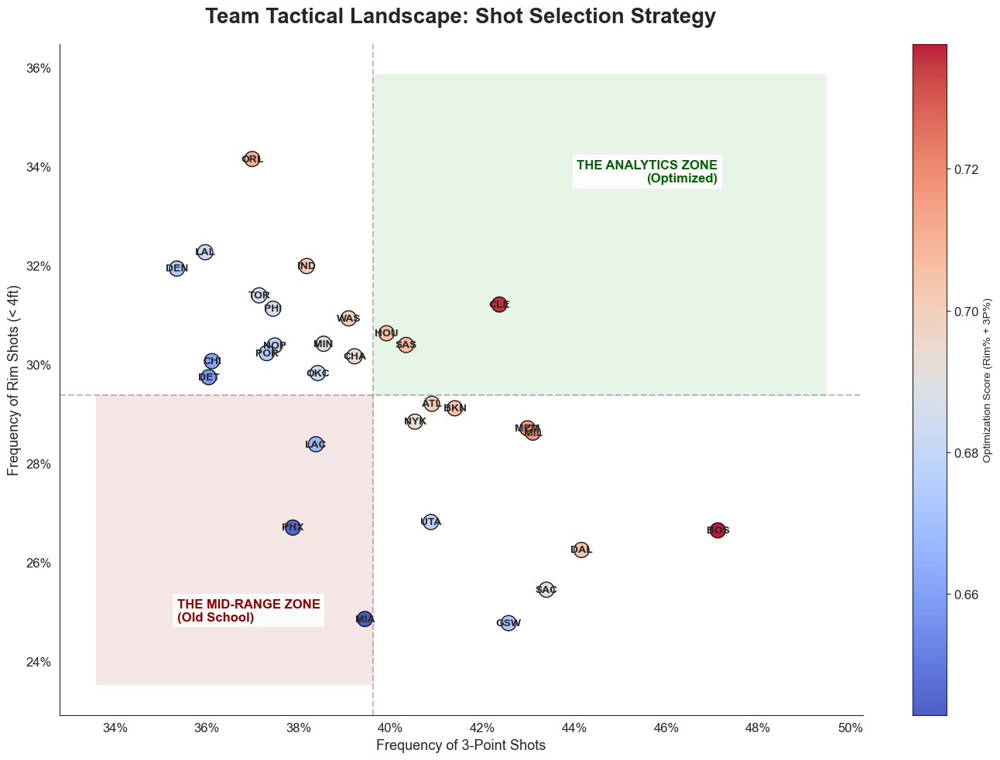

In [91]:
# --- 1. Robust Data Prep ---
df_strat = df.copy()

# Detect 3-point attempts (robust to string formatting)
df_strat['IS_3PT'] = df_strat['SHOT_TYPE'].astype(str).str.upper().str.contains('3').astype(int)

# Detect rim attempts using distance (< 4 ft)
df_strat['IS_RIM'] = (df_strat['SHOT_DISTANCE'] < 4).astype(int)

# Aggregate to team level
team_stats = df_strat.groupby('TEAM_NAME').agg(
    total_shots=('SHOT_MADE', 'size'),
    threes=('IS_3PT', 'sum'),
    rim_shots=('IS_RIM', 'sum')
)

# Rates
team_stats['3P_RATE'] = team_stats['threes'] / team_stats['total_shots']
team_stats['RIM_RATE'] = team_stats['rim_shots'] / team_stats['total_shots']

# Composite modernity score
team_stats['MODERNITY_SCORE'] = team_stats['3P_RATE'] + team_stats['RIM_RATE']

# --- 2. Visualization ---
sns.set_style("white")
plt.figure(figsize=(14, 10))
ax = plt.gca()

# League averages (quadrant boundaries)
avg_3p = team_stats['3P_RATE'].mean()
avg_rim = team_stats['RIM_RATE'].mean()

plt.fill_between([avg_3p, team_stats['3P_RATE'].max() * 1.05],
                 avg_rim, team_stats['RIM_RATE'].max() * 1.05,
                 color='#e6f5e6', zorder=0) # Light Green
plt.fill_between([team_stats['3P_RATE'].min() * 0.95, avg_3p],
                 team_stats['RIM_RATE'].min() * 0.95, avg_rim,
                 color='#f5e6e6', zorder=0) # Light Red

# Scatter Plot
scatter = plt.scatter(
    team_stats['3P_RATE'],
    team_stats['RIM_RATE'],
    c=team_stats['MODERNITY_SCORE'],
    cmap='coolwarm',
    s=200, # Bigger dots
    edgecolor='black',
    linewidth=1,
    alpha=0.9,
    zorder=3
)

# Team labels
texts = []
for team, row in team_stats.iterrows():
    label = team.split()[-1]
    if len(label) > 8: label = label[:3].upper()

    t = plt.text(
        row['3P_RATE'],
        row['RIM_RATE'],
        label,
        fontsize=10,
        fontweight='bold',
        ha='center',
        va='center',
        zorder=4
    )
    texts.append(t)

try:
    from adjustText import adjust_text
    adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))
except ImportError:
    pass

plt.text(team_stats['3P_RATE'].max(), team_stats['RIM_RATE'].max(),
         "THE ANALYTICS ZONE\n(Optimized)",
         ha='right', va='top', color='darkgreen', fontweight='bold', fontsize=12,
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='none'))

plt.text(team_stats['3P_RATE'].min(), team_stats['RIM_RATE'].min(),
         "THE MID-RANGE ZONE\n(Old School)",
         ha='left', va='bottom', color='darkred', fontweight='bold', fontsize=12,
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='none'))

# Reference lines
plt.axvline(avg_3p, color='gray', linestyle='--', alpha=0.5)
plt.axhline(avg_rim, color='gray', linestyle='--', alpha=0.5)

# Formatting
ax.xaxis.set_major_formatter(mtick.PercentFormatter(1.0, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0, decimals=0))

plt.title('Team Tactical Landscape: Shot Selection Strategy', fontsize=20, fontweight='bold', pad=20)
plt.xlabel('Frequency of 3-Point Shots', fontsize=13)
plt.ylabel('Frequency of Rim Shots (< 4ft)', fontsize=13)

# Add Colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Optimization Score (Rim% + 3P%)', fontsize=10)

sns.despine()
plt.tight_layout()
plt.show()

This tactical map reveals clear stylistic separation across NBA offenses. Teams in the top-right “Analytics Zone” approximate the modern efficiency ideal by combining frequent rim pressure with high three-point volume, while teams in the bottom-left “Mid-Range Zone” rely more heavily on intermediate jump shots. Boston emerges as a notable outlier, emphasizing extreme three-point volume at the expense of rim attempts, whereas teams like Phoenix and Chicago cluster closer to the mid-range-heavy profile. Overall, the dispersion confirms that shot selection strategy is not uniform across the league and reflects both roster construction and coaching philosophy rather than a single dominant equilibrium.

## 7.6 Feature Interactions & Correlations

### 7.6.1 Feature Correlation Matrix

Before moving into predictive modeling, it is important to understand how the core numerical features relate to each other and to the target variable `(SHOT_MADE)`. This correlation analysis serves two purposes: first, to identify which variables are most strongly associated with shot success, and second, to detect potential multicollinearity issues that could affect downstream models such as Logistic Regression or Random Forests. Pearson correlation is used here, as all variables are continuous or ordinal in nature.

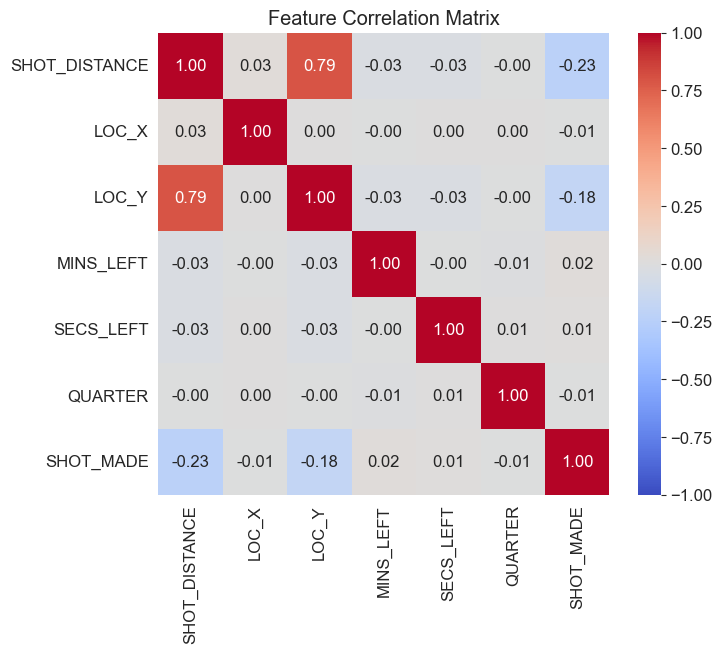

In [92]:
plt.figure(figsize=(16, 6))

# Feature Correlation Matrix
plt.subplot(1, 2, 1)

numeric_cols = ['SHOT_DISTANCE', 'LOC_X', 'LOC_Y', 'MINS_LEFT', 'SECS_LEFT', 'QUARTER', 'SHOT_MADE']
corr = df[numeric_cols].corr()

sns.heatmap(
    corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1,
    vmax=1
)

plt.title("Feature Correlation Matrix")
plt.show()


The correlation heatmap highlights shot distance as the dominant statistical driver of shooting success. The moderate negative correlation between `SHOT_DISTANCE` and `SHOT_MADE` (−0.23) confirms a fundamental basketball principle: as distance from the basket increases, the probability of making a shot declines. A similarly strong positive correlation between `SHOT_DISTANCE` and `LOC_Y` (0.79) reflects court geometry, since vertical court position naturally increases distance from the basket.

In contrast, temporal variables such as `MINS_LEFT`, `SECS_LEFT`, and `QUARTER` show near-zero correlations with `SHOT_MADE`, indicating that time pressure has little direct linear effect on shooting accuracy at the aggregate level. This suggests that game context variables may interact with performance in more complex, non-linear ways making them better suited for tree-based models rather than simple linear interpretations.

Overall, the matrix confirms that spatial features dominate raw shooting efficiency, while time-related variables contribute more subtly, reinforcing the need for multivariate and non-linear modeling approaches in later stages of the analysis.

### 7.6.2 Pairwise Feature Relationships

To complement the correlation matrix, this section explores the joint, pairwise relationships between key spatial and temporal features using a sampled subset of the data. While correlation coefficients summarize linear relationships numerically, pairwise plots provide a richer visual understanding of distribution shapes, non-linear patterns, and class separation between made and missed shots. Due to the large dataset size, a random sample is used to maintain readability without sacrificing representativeness.

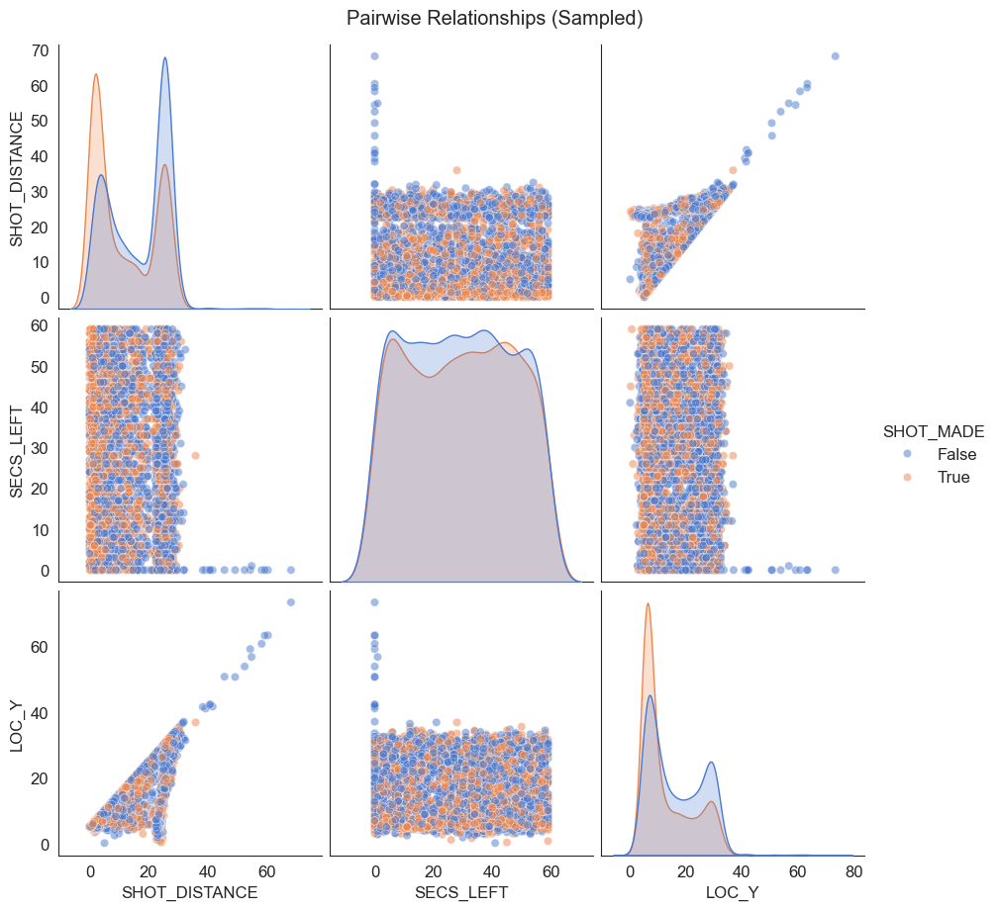

In [93]:
sample_df = df.sample(5000, random_state=42)

sns.pairplot(
    sample_df[['SHOT_DISTANCE', 'SECS_LEFT', 'LOC_Y', 'SHOT_MADE']],
    hue='SHOT_MADE',
    plot_kws={'alpha': 0.5},
    height=3,        # her subplot boyutu
    aspect=1         # oran
)

plt.suptitle("Pairwise Relationships (Sampled)", y=1.02)
plt.show()

The diagonal density plots provide the clearest signal of outcome separation. In particular, the distribution of `SHOT_DISTANCE` shows a sharp spike for made shots at very short distances, visually reinforcing that proximity to the basket is the strongest determinant of shot success. Missed shots dominate the long-distance tail, especially beyond the three-point line.

In contrast, pairwise plots involving `SECS_LEFT` display largely unstructured clouds with heavy overlap between makes and misses. This indicates that while time pressure influences shooting efficiency in aggregate analyses, it does not strongly constrain where shots are taken on the court. Players attempt both high- and low-difficulty shots throughout the shot clock, suggesting that temporal effects on accuracy operate more through decision-making and defensive pressure than spatial shot selection itself.

Overall, this visualization confirms that spatial features create meaningful class separation, whereas temporal features contribute more subtly and non-linearly—further justifying the use of tree-based models that can capture these interactions in later stages.

### 7.6.3 Feature Interactions: Separation of Makes vs. Misses

While previous sections examined individual features and pairwise correlations, this analysis focuses on feature interactions and how combinations of spatial and temporal variables jointly separate made and missed shots. By visualizing multiple dimensions simultaneously and coloring observations by outcome, this plot helps identify non-linear patterns and interaction effects that are difficult to capture with single-variable summaries but are critical for tree-based models such as Random Forests.

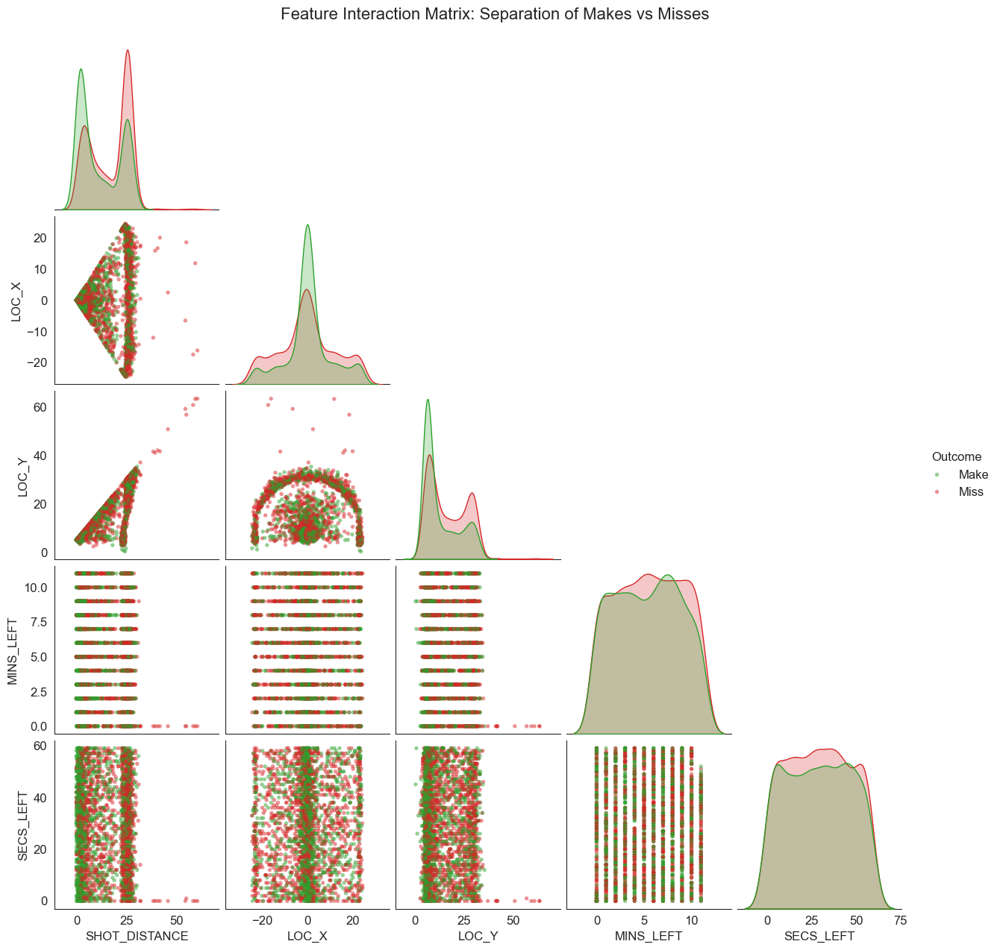

In [94]:
# --- Data Preparation ---
feature_cols = ['SHOT_DISTANCE', 'LOC_X', 'LOC_Y', 'MINS_LEFT', 'SECS_LEFT']
existing_cols = [c for c in feature_cols if c in df.columns]

if len(existing_cols) >= 2 and 'SHOT_MADE' in df.columns:

    plot_df = df[existing_cols + ['SHOT_MADE']].sample(n=min(3000, len(df)), random_state=42).copy()

    plot_df['Outcome'] = plot_df['SHOT_MADE'].apply(lambda x: 'Make' if x else 'Miss')


    g = sns.pairplot(
        plot_df,
        vars=existing_cols, 
        hue='Outcome', 
        palette={'Make': '#2ca02c', 'Miss': '#d62728'}, 
        diag_kind='kde',    
        corner=True,          
        plot_kws={'alpha': 0.5, 's': 15, 'edgecolor': 'none'}, 
        height=2.5  
    )

    # 4. Polish
    g.fig.suptitle("Feature Interaction Matrix: Separation of Makes vs Misses", y=1.02, fontsize=16)

    plt.show()

else:
    print("⚠️ Skipping: Not enough numeric columns or missing target.")

The diagonal density plots provide the strongest separation signal. In particular, SHOT_DISTANCE exhibits a clear distributional shift, with made shots (green) heavily concentrated at very short distances, while missed shots (red) dominate longer ranges. This visual separation confirms that distance is not only linearly correlated with shot success but also interacts strongly with other variables.

The off-diagonal scatter plots reveal how spatial coordinates (LOC_X, LOC_Y) reconstruct the court geometry, showing dense green clusters around the rim and corners. In contrast, missed shots appear more dispersed across the mid-range and above-the-break areas. Temporal features (MINS_LEFT, SECS_LEFT) show substantial overlap between outcomes, indicating weak standalone separation but suggesting that their influence emerges through interactions, such as late-clock shots combined with longer distances. Overall, this interaction analysis motivates the use of non-linear, interaction-aware models in the subsequent modeling stage.

# 8. ML DATASET PREPARATION (Mehmet, Batuhan & Hamide)

## 8.1 Sorting Data for Feature Engineering (Mehmet)

The ML dataset preparation begins by creating a working copy of the cleaned data and establishing a proper temporal ordering essential for feature engineering. A new column TOTAL_SECONDS_LEFT is calculated by converting minutes and seconds to a single numeric value, enabling proper chronological sorting. The data is sorted by GAME_ID, GAME_DATE, QUARTER, and TOTAL_SECONDS_LEFT (descending) to ensure shots within each game are ordered from the first shot to the last. This temporal ordering is critical because many features depend on "what happened before this shot" calculations—such as running scores, player streaks, and team performance metrics. Without proper sorting, rolling window and cumulative sum operations would produce incorrect values, leading to data leakage or nonsensical features.

In [95]:
# Create ML dataset from cleaned data
df_ml = df.copy()
print(f"\nStarting with {len(df_ml):,} rows for ML dataset preparation")

# Sort by game, team, and time to ensure proper calculation order
# Convert time to total seconds for proper sorting
df_ml['TOTAL_SECONDS_LEFT'] = df_ml['MINS_LEFT'] * 60 + df_ml['SECS_LEFT']
# Sort by game, quarter, and time (descending time = chronological order)
df_ml = df_ml.sort_values(['GAME_ID', 'GAME_DATE', 'QUARTER', 'TOTAL_SECONDS_LEFT'],
                           ascending=[True, True, True, False])
df_ml = df_ml.reset_index(drop=True)
print(f"  ✓ Data sorted by game, quarter, and time")


Starting with 217,607 rows for ML dataset preparation
  ✓ Data sorted by game, quarter, and time


## 8.2 Create Home Team indicator (Mehmet)

The HOME_TEAM_FLAG is a binary feature indicating whether the shooting player's team is playing at home (1) or away (0). This feature is created by comparing TEAM_NAME to HOME_TEAM, leveraging the earlier normalization to abbreviations.

In [96]:
df_ml['HOME_TEAM_FLAG'] = (df_ml['TEAM_NAME'] == df_ml['HOME_TEAM']).astype(int)
home_count = df_ml['HOME_TEAM_FLAG'].sum()
away_count = len(df_ml) - home_count
print(f"  ✓ Home Team Flag created")
print(f"      Home shots: {home_count:,} ({home_count/len(df_ml)*100:.1f}%)")
print(f"      Away shots: {away_count:,} ({away_count/len(df_ml)*100:.1f}%)")

  ✓ Home Team Flag created
      Home shots: 108,750 (50.0%)
      Away shots: 108,857 (50.0%)


## 8.3 Calculate Time Left in Seconds (Mehmet)

The TIME_LEFT_SECONDS feature represents the total time remaining in regulation at the moment of each shot, calculated using NBA timing rules. For quarters 1-4, the function adds the current quarter's remaining time to all future regulation quarters (12 minutes each). For overtime periods (quarter 5+), only the current period's time is counted since overtime games continue until a winner is determined. This feature captures game urgency—shots taken with little time remaining may face increased pressure or rushed execution, while early-game shots occur in lower-stakes contexts. The implementation accounts for the NBA's unique timing structure where regulation quarters differ from overtime periods.NBA Timing Rules Applied:
• Regulation Quarters (Q1-Q4): 12 minutes each
• Overtime Periods (Q5+): 5 minutes each

In [97]:
# NBA regulation: 12 minutes per quarter (Q1-Q4), 5 minutes per overtime (Q5+)
# Time left = time remaining in current quarter + time in future quarters
def calculate_total_time_left(row):
    current_quarter_seconds = row['MINS_LEFT'] * 60 + row['SECS_LEFT']
    quarter = row['QUARTER']

    if quarter <= 4:
        # Regulation quarters
        future_quarters = 4 - quarter
        future_seconds = future_quarters * 12 * 60
    else:
        # Already in overtime
        future_seconds = 0

    return current_quarter_seconds + future_seconds

df_ml['TIME_LEFT_SECONDS'] = df_ml.apply(calculate_total_time_left, axis=1)
print(f"  ✓ Time Left in Seconds calculated")
print(f"      Mean: {df_ml['TIME_LEFT_SECONDS'].mean():.0f} seconds")
print(f"      Min: {df_ml['TIME_LEFT_SECONDS'].min():.0f} seconds")
print(f"      Max: {df_ml['TIME_LEFT_SECONDS'].max():.0f} seconds")

  ✓ Time Left in Seconds calculated
      Mean: 1450 seconds
      Min: 0 seconds
      Max: 2877 seconds


## 8.4 Calculate Running Points for Teams in Each Game (Mehmet)

This section computes the cumulative score for both teams at the moment each shot is taken. The calculation first assigns point values (2 or 3) to made shots based on shot type, then iterates through each game to compute running totals. These features enable score differential calculations and capture game momentum dynamics that may influence shooting performance.

In [98]:
# Points per shot: 2 for 2PT, 3 for 3PT (only if made)
df_ml['POINTS_SCORED'] = 0
made_mask = df_ml['SHOT_MADE'].isin([True, 'TRUE', 'True'])
two_pt_mask = df_ml['SHOT_TYPE'] == '2PTFIELDGOAL'
three_pt_mask = df_ml['SHOT_TYPE'] == '3PTFIELDGOAL'

df_ml.loc[made_mask & two_pt_mask, 'POINTS_SCORED'] = 2
df_ml.loc[made_mask & three_pt_mask, 'POINTS_SCORED'] = 3

# Calculate cumulative points for each team in each game
# For each shot, we want the score BEFORE this shot was taken
df_ml['TEAM_SCORE_BEFORE_SHOT'] = 0
df_ml['OPPONENT_SCORE_BEFORE_SHOT'] = 0

for game_id in df_ml['GAME_ID'].unique():
    game_mask = df_ml['GAME_ID'] == game_id
    game_data = df_ml[game_mask].copy()

    # Get the two teams in this game
    home_team = game_data['HOME_TEAM'].iloc[0]
    away_team = game_data['AWAY_TEAM'].iloc[0]

    # Calculate cumulative score for each team
    home_team_mask = game_data['TEAM_NAME'] == home_team
    away_team_mask = game_data['TEAM_NAME'] == away_team

    # Running sum of points (cumulative before each shot)
    home_cumsum = game_data.loc[home_team_mask, 'POINTS_SCORED'].cumsum().shift(1, fill_value=0)
    away_cumsum = game_data.loc[away_team_mask, 'POINTS_SCORED'].cumsum().shift(1, fill_value=0)

    # For home team shots: team score = home cumsum, opponent = away cumsum at same time
    # For away team shots: team score = away cumsum, opponent = home cumsum at same time
    for idx in game_data.index:
        shooting_team = game_data.loc[idx, 'TEAM_NAME']

        if shooting_team == home_team:
            # Home team shooting
            team_score = home_cumsum.get(idx, 0)
            # Get opponent score at this moment (all away points scored so far)
            time_left = game_data.loc[idx, 'TIME_LEFT_SECONDS']
            opponent_score = game_data.loc[away_team_mask & (game_data['TIME_LEFT_SECONDS'] > time_left), 'POINTS_SCORED'].sum()
        else:
            # Away team shooting
            team_score = away_cumsum.get(idx, 0)
            # Get opponent score at this moment (all home points scored so far)
            time_left = game_data.loc[idx, 'TIME_LEFT_SECONDS']
            opponent_score = game_data.loc[home_team_mask & (game_data['TIME_LEFT_SECONDS'] > time_left), 'POINTS_SCORED'].sum()

        df_ml.loc[idx, 'TEAM_SCORE_BEFORE_SHOT'] = team_score
        df_ml.loc[idx, 'OPPONENT_SCORE_BEFORE_SHOT'] = opponent_score

print(f"  ✓ Running scores calculated for all games")
print(f"      Mean team score at shot time: {df_ml['TEAM_SCORE_BEFORE_SHOT'].mean():.1f}")
print(f"      Mean opponent score at shot time: {df_ml['OPPONENT_SCORE_BEFORE_SHOT'].mean():.1f}")

  ✓ Running scores calculated for all games
      Mean team score at shot time: 48.3
      Mean opponent score at shot time: 48.8


## 8.5 Calculate Current Situation (Leading/Trailing/Tied) (Mehmet)

The SCORE_DIFFERENTIAL and CURRENT_SITUATION features capture the psychological context of each shot. Score differential is simply TEAM_SCORE - OPPONENT_SCORE, while the situation is categorized as "LEADING", "TRAILING", or "TIED" based on this differential. These features are crucial for modeling pressure effects—players may shoot differently when their team is behind (potentially taking riskier shots) versus when leading (possibly more conservative shot selection).

In [99]:
df_ml['SCORE_DIFFERENTIAL'] = df_ml['TEAM_SCORE_BEFORE_SHOT'] - df_ml['OPPONENT_SCORE_BEFORE_SHOT']
df_ml['CURRENT_SITUATION'] = 'TIED'
df_ml.loc[df_ml['SCORE_DIFFERENTIAL'] > 0, 'CURRENT_SITUATION'] = 'LEADING'
df_ml.loc[df_ml['SCORE_DIFFERENTIAL'] < 0, 'CURRENT_SITUATION'] = 'TRAILING'

situation_counts = df_ml['CURRENT_SITUATION'].value_counts()
print(f"  ✓ Current Situation calculated")
for situation, count in situation_counts.items():
    print(f"      {situation}: {count:,} ({count/len(df_ml)*100:.1f}%)")

  ✓ Current Situation calculated
      TRAILING: 108,088 (49.7%)
      LEADING: 97,667 (44.9%)
      TIED: 11,852 (5.4%)


## 8.6 Calculate Average Points in Last 5 Games for Each Player (Mehmet)

The AVG_LAST_5_GAMES feature represents a player's rolling average points scored over their previous 5 games, providing a measure of recent form and offensive involvement. The calculation first aggregates total points per player per game, then applies a rolling window with shift(1) to exclude the current game (preventing leakage). A minimum period of 1 allows the feature to be computed even for players with fewer than 5 games of history. Players with no prior history receive a value of 0. This feature captures whether a player is in a hot streak (high recent scoring) or cold spell, which may correlate with confidence and shot-making ability.

In [100]:
# Sort by player and game date to calculate rolling average
df_ml_sorted = df_ml.sort_values(['PLAYER_ID', 'GAME_DATE', 'QUARTER', 'TOTAL_SECONDS_LEFT'],
                                   ascending=[True, True, True, False])

# Calculate total points per player per game
player_game_points = df_ml_sorted.groupby(['PLAYER_ID', 'GAME_ID', 'GAME_DATE'])['POINTS_SCORED'].sum().reset_index()
player_game_points.columns = ['PLAYER_ID', 'GAME_ID', 'GAME_DATE', 'GAME_POINTS']

# Calculate rolling average of last 5 games for each player
player_game_points = player_game_points.sort_values(['PLAYER_ID', 'GAME_DATE'])
player_game_points['AVG_LAST_5_GAMES'] = player_game_points.groupby('PLAYER_ID')['GAME_POINTS'].transform(
    lambda x: x.shift(1).rolling(window=5, min_periods=1).mean()
)

# Merge back to main dataframe
df_ml = df_ml.merge(
    player_game_points[['PLAYER_ID', 'GAME_ID', 'AVG_LAST_5_GAMES']],
    on=['PLAYER_ID', 'GAME_ID'],
    how='left'
)

# Fill NaN (first games) with 0 or overall player average
df_ml['AVG_LAST_5_GAMES'] = df_ml['AVG_LAST_5_GAMES'].fillna(0)

print(f"  ✓ Average Last 5 Games calculated")
print(f"      Mean: {df_ml['AVG_LAST_5_GAMES'].mean():.2f} points")
print(f"      Players with history: {(df_ml['AVG_LAST_5_GAMES'] > 0).sum():,}")
print(f"      Players without history: {(df_ml['AVG_LAST_5_GAMES'] == 0).sum():,}")

  ✓ Average Last 5 Games calculated
      Mean: 12.38 points
      Players with history: 213,553
      Players without history: 4,054


## 8.7 Calculate Team Performance Features (Mehmet)

In [101]:
# Sort for proper calculations
df_ml = df_ml.sort_values(['TEAM_NAME', 'GAME_DATE', 'GAME_ID', 'QUARTER', 'TOTAL_SECONDS_LEFT'],
                           ascending=[True, True, True, True, False])

### 8.7.1 Team Shooting Performance in Last 5 Games

Three rolling averages are computed from team performance: TEAM_AVG_FG_PCT_L5 (field goal percentage), TEAM_AVG_POINTS_L5 (total points), and TEAM_AVG_SHOTS_L5 (shot attempts). These features capture a team's offensive efficiency and volume trends. A team shooting 50% over their last 5 games may have better shot selection or player health than one shooting 40%. The calculations use shift(1) to exclude the current game and rolling(window=5, min_periods=1) to handle early-season games. Missing values are filled with league average (0.45 for FG%) or zero, ensuring all rows have valid feature values.

In [102]:
# Calculate team stats per game
team_game_stats = df_ml.groupby(['TEAM_NAME', 'GAME_ID', 'GAME_DATE']).agg({
    'SHOT_MADE': lambda x: x.isin([True, 'TRUE', 'True']).sum(),  # Made shots
    'POINTS_SCORED': 'sum'  # Total points
}).reset_index()

# Add total shots count
team_total_shots = df_ml.groupby(['TEAM_NAME', 'GAME_ID', 'GAME_DATE']).size().reset_index(name='TOTAL_SHOTS')
team_game_stats = team_game_stats.merge(team_total_shots, on=['TEAM_NAME', 'GAME_ID', 'GAME_DATE'])

team_game_stats.columns = ['TEAM_NAME', 'GAME_ID', 'GAME_DATE',
                            'MADE_SHOTS', 'TOTAL_POINTS', 'TOTAL_SHOTS']
team_game_stats['FG_PCT'] = team_game_stats['MADE_SHOTS'] / team_game_stats['TOTAL_SHOTS']

# Calculate rolling averages (last 5 games, excluding current game)
team_game_stats = team_game_stats.sort_values(['TEAM_NAME', 'GAME_DATE'])

team_game_stats['TEAM_AVG_FG_PCT_L5'] = team_game_stats.groupby('TEAM_NAME')['FG_PCT'].transform(
    lambda x: x.shift(1).rolling(window=5, min_periods=1).mean()
)

team_game_stats['TEAM_AVG_POINTS_L5'] = team_game_stats.groupby('TEAM_NAME')['TOTAL_POINTS'].transform(
    lambda x: x.shift(1).rolling(window=5, min_periods=1).mean()
)

team_game_stats['TEAM_AVG_SHOTS_L5'] = team_game_stats.groupby('TEAM_NAME')['TOTAL_SHOTS'].transform(
    lambda x: x.shift(1).rolling(window=5, min_periods=1).mean()
)

# Merge back to main dataframe
df_ml = df_ml.merge(
    team_game_stats[['TEAM_NAME', 'GAME_ID', 'TEAM_AVG_FG_PCT_L5',
                     'TEAM_AVG_POINTS_L5', 'TEAM_AVG_SHOTS_L5']],
    on=['TEAM_NAME', 'GAME_ID'],
    how='left'
)

df_ml['TEAM_AVG_FG_PCT_L5'] = df_ml['TEAM_AVG_FG_PCT_L5'].fillna(0.45)  # League average
df_ml['TEAM_AVG_POINTS_L5'] = df_ml['TEAM_AVG_POINTS_L5'].fillna(0)
df_ml['TEAM_AVG_SHOTS_L5'] = df_ml['TEAM_AVG_SHOTS_L5'].fillna(0)

print(f"    ✓ Team avg FG% last 5 games: {df_ml['TEAM_AVG_FG_PCT_L5'].mean():.3f}")
print(f"    ✓ Team avg points last 5 games: {df_ml['TEAM_AVG_POINTS_L5'].mean():.1f}")

    ✓ Team avg FG% last 5 games: 0.475
    ✓ Team avg points last 5 games: 95.7


### 8.7.2 Opponent Defensive Performance

The TEAM_AVG_POINTS_ALLOWED_L5 feature measures how many points opponents have scored against this team in recent games. This defensive metric indicates whether a team is a strong defensive unit (low points allowed) or struggles defensively (high points allowed). The calculation iterates through each game, computing points allowed as the opponent's total points, then applies a rolling 5-game average with proper shifting. Playing against a poor defensive team may increase shot success probability, while elite defenses may suppress shooting accuracy.

In [103]:
# Calculate opponent's defensive stats (points allowed per game)
# For each team, calculate points they allowed (opponent scored)
team_defense_stats = []

for game_id in df_ml['GAME_ID'].unique():
    game_data = df_ml[df_ml['GAME_ID'] == game_id]
    home_team = game_data['HOME_TEAM'].iloc[0]
    away_team = game_data['AWAY_TEAM'].iloc[0]
    game_date = game_data['GAME_DATE'].iloc[0]

    # Get points scored by each team
    home_points = game_data[game_data['TEAM_NAME'] == home_team]['POINTS_SCORED'].sum()
    away_points = game_data[game_data['TEAM_NAME'] == away_team]['POINTS_SCORED'].sum()

    # Points allowed = opponent's points
    team_defense_stats.append({
        'TEAM_NAME': home_team,
        'GAME_ID': game_id,
        'GAME_DATE': game_date,
        'POINTS_ALLOWED': away_points
    })
    team_defense_stats.append({
        'TEAM_NAME': away_team,
        'GAME_ID': game_id,
        'GAME_DATE': game_date,
        'POINTS_ALLOWED': home_points
    })

team_defense_df = pd.DataFrame(team_defense_stats)
team_defense_df = team_defense_df.sort_values(['TEAM_NAME', 'GAME_DATE'])

# Rolling average of points allowed
team_defense_df['TEAM_AVG_POINTS_ALLOWED_L5'] = team_defense_df.groupby('TEAM_NAME')['POINTS_ALLOWED'].transform(
    lambda x: x.shift(1).rolling(window=5, min_periods=1).mean()
)

# Merge back
df_ml = df_ml.merge(
    team_defense_df[['TEAM_NAME', 'GAME_ID', 'TEAM_AVG_POINTS_ALLOWED_L5']],
    on=['TEAM_NAME', 'GAME_ID'],
    how='left'
)

df_ml['TEAM_AVG_POINTS_ALLOWED_L5'] = df_ml['TEAM_AVG_POINTS_ALLOWED_L5'].fillna(0)

print(f"    ✓ Team avg points allowed last 5 games: {df_ml['TEAM_AVG_POINTS_ALLOWED_L5'].mean():.1f}")

    ✓ Team avg points allowed last 5 games: 95.6


### 8.7.3 Team's Current Game Performance (before this shot)

Within-game features capture real-time team momentum: TEAM_MADE_SHOTS_IN_GAME, TEAM_TOTAL_SHOTS_IN_GAME, and TEAM_FG_PCT_IN_GAME. These are computed as cumulative sums with proper shifting to represent the state before the current shot. A team shooting 60% so far in the game may have found their rhythm, while a team at 30% may be struggling. Division by zero is handled by only computing FG% when total shots is greater than zero. These features capture in-game momentum that historical averages cannot.

In [104]:
# Calculate cumulative stats in current game up to this shot
df_ml = df_ml.sort_values(['GAME_ID', 'TEAM_NAME', 'QUARTER', 'TOTAL_SECONDS_LEFT'],
                           ascending=[True, True, True, False])

# Made shots so far in game (before current shot)
shot_made_numeric = df_ml['SHOT_MADE'].isin([True, 'TRUE', 'True']).astype(int)
df_ml['TEAM_MADE_SHOTS_IN_GAME'] = df_ml.groupby(['GAME_ID', 'TEAM_NAME']).cumcount()
df_ml['TEAM_MADE_SHOTS_IN_GAME'] = shot_made_numeric.groupby([df_ml['GAME_ID'], df_ml['TEAM_NAME']]).cumsum().shift(1, fill_value=0)

# Total shots so far in game (before current shot)
df_ml['TEAM_TOTAL_SHOTS_IN_GAME'] = df_ml.groupby(['GAME_ID', 'TEAM_NAME']).cumcount()

# Current game shooting percentage
df_ml['TEAM_FG_PCT_IN_GAME'] = 0.0
mask = df_ml['TEAM_TOTAL_SHOTS_IN_GAME'] > 0
df_ml.loc[mask, 'TEAM_FG_PCT_IN_GAME'] = (
    df_ml.loc[mask, 'TEAM_MADE_SHOTS_IN_GAME'] / df_ml.loc[mask, 'TEAM_TOTAL_SHOTS_IN_GAME']
)

print(f"    ✓ Avg shots taken in game: {df_ml['TEAM_TOTAL_SHOTS_IN_GAME'].mean():.1f}")
print(f"    ✓ Avg FG% in current game: {df_ml['TEAM_FG_PCT_IN_GAME'].mean():.3f}")

    ✓ Avg shots taken in game: 44.0
    ✓ Avg FG% in current game: 0.471


### 8.7.4 Recent Shot Streak (Hot/Cold Hand)

The TEAM_LAST_5_SHOTS_MADE feature implements the "hot hand" hypothesis at the team level, counting how many of the team's previous 5 shots were successful. Values range from 0 (all 5 missed—cold streak) to 5 (all 5 made—hot streak). While the hot hand phenomenon is debated in sports analytics, it captures recent momentum that may affect player confidence and opponent adjustments. The rolling window with shift ensures only previous shots are considered, maintaining proper temporal causality for prediction.

In [105]:
# Last 5 shots made/missed by team in current game
df_ml['TEAM_LAST_5_SHOTS_MADE'] = (
    shot_made_numeric.groupby([df_ml['GAME_ID'], df_ml['TEAM_NAME']])
    .transform(lambda x: x.shift(1).rolling(window=5, min_periods=1).sum())
)
df_ml['TEAM_LAST_5_SHOTS_MADE'] = df_ml['TEAM_LAST_5_SHOTS_MADE'].fillna(0)

print(f"    ✓ Avg made shots in last 5 attempts: {df_ml['TEAM_LAST_5_SHOTS_MADE'].mean():.2f}")

    ✓ Avg made shots in last 5 attempts: 2.30


### 8.7.5 Win/Loss Record in Last 5 Games

The TEAM_WIN_RATE_L5 feature represents a team's winning percentage over their previous 5 games, serving as a proxy for overall team quality and morale. A team on a 4-1 streak (0.8 win rate) likely has better chemistry and confidence than one at 1-4 (0.2). The calculation determines game winners by comparing total points scored by each team, then applies rolling averages. This feature captures sustained success patterns that individual game metrics might miss. Default value of 0.5 is used for season-start games.

In [106]:
# Determine game winners
game_results = []
for game_id in df_ml['GAME_ID'].unique():
    game_data = df_ml[df_ml['GAME_ID'] == game_id]
    home_team = game_data['HOME_TEAM'].iloc[0]
    away_team = game_data['AWAY_TEAM'].iloc[0]
    game_date = game_data['GAME_DATE'].iloc[0]

    home_points = game_data[game_data['TEAM_NAME'] == home_team]['POINTS_SCORED'].sum()
    away_points = game_data[game_data['TEAM_NAME'] == away_team]['POINTS_SCORED'].sum()

    game_results.append({
        'TEAM_NAME': home_team,
        'GAME_ID': game_id,
        'GAME_DATE': game_date,
        'WON': 1 if home_points > away_points else 0
    })
    game_results.append({
        'TEAM_NAME': away_team,
        'GAME_ID': game_id,
        'GAME_DATE': game_date,
        'WON': 1 if away_points > home_points else 0
    })

game_results_df = pd.DataFrame(game_results)
game_results_df = game_results_df.sort_values(['TEAM_NAME', 'GAME_DATE'])

# Calculate win rate in last 5 games
game_results_df['TEAM_WIN_RATE_L5'] = game_results_df.groupby('TEAM_NAME')['WON'].transform(
    lambda x: x.shift(1).rolling(window=5, min_periods=1).mean()
)

# Merge back
df_ml = df_ml.merge(
    game_results_df[['TEAM_NAME', 'GAME_ID', 'TEAM_WIN_RATE_L5']],
    on=['TEAM_NAME', 'GAME_ID'],
    how='left'
)

df_ml['TEAM_WIN_RATE_L5'] = df_ml['TEAM_WIN_RATE_L5'].fillna(0.5)  # Default 50%

print(f"    ✓ Avg win rate last 5 games: {df_ml['TEAM_WIN_RATE_L5'].mean():.3f}")


    ✓ Avg win rate last 5 games: 0.489


### 8.7.6 Opponent Team Performance

After identifying the opponent for each shot using OPPONENT_TEAM, the opponent's offensive metrics (OPP_AVG_FG_PCT_L5, OPP_AVG_POINTS_L5) are merged into the dataset. These features enable the model to consider matchup effects—facing a high-scoring opponent with excellent shooting may create a different game dynamic than facing a struggling team. The merge operation uses the previously calculated team stats, simply renaming columns with the "OPP_" prefix to indicate they represent the opposing team's characteristics.

In [107]:
# Get opponent team for each shot
df_ml['OPPONENT_TEAM'] = df_ml.apply(
    lambda row: row['AWAY_TEAM'] if row['TEAM_NAME'] == row['HOME_TEAM'] else row['HOME_TEAM'],
    axis=1
)

# Merge opponent's stats
df_ml = df_ml.merge(
    team_game_stats[['TEAM_NAME', 'GAME_ID', 'TEAM_AVG_FG_PCT_L5', 'TEAM_AVG_POINTS_L5']].rename(columns={
        'TEAM_NAME': 'OPPONENT_TEAM',
        'TEAM_AVG_FG_PCT_L5': 'OPP_AVG_FG_PCT_L5',
        'TEAM_AVG_POINTS_L5': 'OPP_AVG_POINTS_L5'
    }),
    on=['OPPONENT_TEAM', 'GAME_ID'],
    how='left'
)

df_ml['OPP_AVG_FG_PCT_L5'] = df_ml['OPP_AVG_FG_PCT_L5'].fillna(0.45)
df_ml['OPP_AVG_POINTS_L5'] = df_ml['OPP_AVG_POINTS_L5'].fillna(0)

print(f"    ✓ Opponent avg FG% last 5 games: {df_ml['OPP_AVG_FG_PCT_L5'].mean():.3f}")
print(f"    ✓ Opponent avg points last 5 games: {df_ml['OPP_AVG_POINTS_L5'].mean():.1f}")

    ✓ Opponent avg FG% last 5 games: 0.475
    ✓ Opponent avg points last 5 games: 95.7


### 8.7.7 Relative Team Strength

Three differential features capture relative matchup strength: TEAM_VS_OPP_FG_PCT_DIFF (shooting efficiency advantage), TEAM_VS_OPP_POINTS_DIFF (scoring output advantage), and TEAM_NET_RATING_L5 (points scored minus points allowed—offensive vs. defensive capability). These relative metrics may be more predictive than absolute values because basketball is fundamentally about matchups. A team with 45% FG% facing an opponent at 50% has different dynamics than facing one at 40%. Net rating particularly captures whether a team outscores or is outscored by opponents on average.

In [108]:
# Team performance vs opponent
df_ml['TEAM_VS_OPP_FG_PCT_DIFF'] = df_ml['TEAM_AVG_FG_PCT_L5'] - df_ml['OPP_AVG_FG_PCT_L5']
df_ml['TEAM_VS_OPP_POINTS_DIFF'] = df_ml['TEAM_AVG_POINTS_L5'] - df_ml['OPP_AVG_POINTS_L5']

# Team offensive rating (points scored) vs defensive rating (points allowed)
df_ml['TEAM_NET_RATING_L5'] = df_ml['TEAM_AVG_POINTS_L5'] - df_ml['TEAM_AVG_POINTS_ALLOWED_L5']

print(f"    ✓ Avg team net rating last 5 games: {df_ml['TEAM_NET_RATING_L5'].mean():.1f}")

print(f"\n  ✓ Team performance features created")
print(f"      Total new features: 15")

    ✓ Avg team net rating last 5 games: 0.0

  ✓ Team performance features created
      Total new features: 15


## 8.8 Calculate Player Performance Features (Mehmet)

In [109]:
# Sort for proper calculations
df_ml = df_ml.sort_values(['PLAYER_ID', 'GAME_DATE', 'GAME_ID', 'QUARTER', 'TOTAL_SECONDS_LEFT'],
                           ascending=[True, True, True, True, False])

### 8.8.1 Player shooting performance in last 5 games

Three player rolling averages mirror the team features: PLAYER_AVG_FG_PCT_L5, PLAYER_AVG_SHOTS_L5, and PLAYER_AVG_3PT_ATTEMPTS_L5. These capture a player's recent efficiency, usage rate, and 3-point shooting tendency. A player averaging 55% from the field over 5 games is likely in better form than one at 35%. The 3PT attempts feature helps identify perimeter-focused players whose shot selection patterns may differ from post players. Missing values use the overall league average for FG% to provide reasonable defaults for players with limited history.

In [110]:
# Calculate player stats per game
player_game_stats = df_ml.groupby(['PLAYER_ID', 'PLAYER_NAME', 'GAME_ID', 'GAME_DATE']).agg({
    'SHOT_MADE': lambda x: x.isin([True, 'TRUE', 'True']).sum(),
    'SHOT_TYPE': lambda x: (x == '3PTFIELDGOAL').sum(),  # Count 3PT attempts
    'POINTS_SCORED': 'sum'
}).reset_index()

# Add total shots
player_total_shots = df_ml.groupby(['PLAYER_ID', 'PLAYER_NAME', 'GAME_ID', 'GAME_DATE']).size().reset_index(name='TOTAL_SHOTS')
player_game_stats = player_game_stats.merge(player_total_shots, on=['PLAYER_ID', 'PLAYER_NAME', 'GAME_ID', 'GAME_DATE'])

player_game_stats.columns = ['PLAYER_ID', 'PLAYER_NAME', 'GAME_ID', 'GAME_DATE',
                              'MADE_SHOTS', 'THREE_PT_ATTEMPTS', 'POINTS', 'TOTAL_SHOTS']

# Calculate FG%
player_game_stats['FG_PCT'] = player_game_stats['MADE_SHOTS'] / player_game_stats['TOTAL_SHOTS']

# Sort by player and date
player_game_stats = player_game_stats.sort_values(['PLAYER_ID', 'GAME_DATE'])

# Rolling averages (last 5 games, excluding current)
player_game_stats['PLAYER_AVG_FG_PCT_L5'] = player_game_stats.groupby('PLAYER_ID')['FG_PCT'].transform(
    lambda x: x.shift(1).rolling(window=5, min_periods=1).mean()
)

player_game_stats['PLAYER_AVG_SHOTS_L5'] = player_game_stats.groupby('PLAYER_ID')['TOTAL_SHOTS'].transform(
    lambda x: x.shift(1).rolling(window=5, min_periods=1).mean()
)

player_game_stats['PLAYER_AVG_3PT_ATTEMPTS_L5'] = player_game_stats.groupby('PLAYER_ID')['THREE_PT_ATTEMPTS'].transform(
    lambda x: x.shift(1).rolling(window=5, min_periods=1).mean()
)

# Merge back to main dataframe
df_ml = df_ml.merge(
    player_game_stats[['PLAYER_ID', 'GAME_ID', 'PLAYER_AVG_FG_PCT_L5',
                       'PLAYER_AVG_SHOTS_L5', 'PLAYER_AVG_3PT_ATTEMPTS_L5']],
    on=['PLAYER_ID', 'GAME_ID'],
    how='left'
)

# Fill NaN for players with no history
df_ml['PLAYER_AVG_FG_PCT_L5'] = df_ml['PLAYER_AVG_FG_PCT_L5'].fillna(df['SHOT_MADE'].isin([True, 'TRUE', 'True']).mean())
df_ml['PLAYER_AVG_SHOTS_L5'] = df_ml['PLAYER_AVG_SHOTS_L5'].fillna(0)
df_ml['PLAYER_AVG_3PT_ATTEMPTS_L5'] = df_ml['PLAYER_AVG_3PT_ATTEMPTS_L5'].fillna(0)

print(f"    ✓ Player avg FG% last 5 games: {df_ml['PLAYER_AVG_FG_PCT_L5'].mean():.3f}")
print(f"    ✓ Player avg shots last 5 games: {df_ml['PLAYER_AVG_SHOTS_L5'].mean():.1f}")

    ✓ Player avg FG% last 5 games: 0.469
    ✓ Player avg shots last 5 games: 11.3


### 8.8.2 Player's performance in current game

Within-game player metrics include PLAYER_MADE_SHOTS_IN_GAME, PLAYER_SHOTS_IN_GAME, PLAYER_FG_PCT_IN_GAME, and PLAYER_POINTS_IN_GAME. These features capture whether a player has found their rhythm in the current contest. A player who has already made 6 of 8 shots (75%) may have confidence momentum, while one at 2 of 10 (20%) may be struggling or facing tough defense. All values represent the state before the current shot through proper cumsum shifting, maintaining prediction validity.

In [111]:
# Sort by game, player, and time
df_ml = df_ml.sort_values(['GAME_ID', 'PLAYER_ID', 'QUARTER', 'TOTAL_SECONDS_LEFT'],
                           ascending=[True, True, True, False])

# Shots made by player in current game (before this shot)
shot_made_numeric = df_ml['SHOT_MADE'].isin([True, 'TRUE', 'True']).astype(int)
df_ml['PLAYER_MADE_SHOTS_IN_GAME'] = shot_made_numeric.groupby([df_ml['GAME_ID'], df_ml['PLAYER_ID']]).cumsum().shift(1, fill_value=0)

# Total shots by player in current game (before this shot)
df_ml['PLAYER_SHOTS_IN_GAME'] = df_ml.groupby(['GAME_ID', 'PLAYER_ID']).cumcount()

# Player's FG% in current game
df_ml['PLAYER_FG_PCT_IN_GAME'] = 0.0
mask = df_ml['PLAYER_SHOTS_IN_GAME'] > 0
df_ml.loc[mask, 'PLAYER_FG_PCT_IN_GAME'] = (
    df_ml.loc[mask, 'PLAYER_MADE_SHOTS_IN_GAME'] / df_ml.loc[mask, 'PLAYER_SHOTS_IN_GAME']
)

# Points scored by player in current game
df_ml['PLAYER_POINTS_IN_GAME'] = df_ml.groupby(['GAME_ID', 'PLAYER_ID'])['POINTS_SCORED'].cumsum().shift(1, fill_value=0)

print(f"    ✓ Avg player shots in game: {df_ml['PLAYER_SHOTS_IN_GAME'].mean():.1f}")
print(f"    ✓ Avg player FG% in game: {df_ml['PLAYER_FG_PCT_IN_GAME'].mean():.3f}")

    ✓ Avg player shots in game: 5.9
    ✓ Avg player FG% in game: 0.426


### 8.8.3 Player hot/cold streak (last 5 shots)

Individual streak features include PLAYER_LAST_5_SHOTS_MADE, PLAYER_LAST_3_SHOTS_MADE, PLAYER_CONSECUTIVE_MAKES, and PLAYER_CONSECUTIVE_MISSES. The last-5 and last-3 features use rolling sums, while consecutive streaks are computed through explicit iteration tracking make/miss sequences. These features directly test the "hot hand" hypothesis—whether recent success predicts future success. The consecutive features capture extreme streaks (e.g., 5 makes in a row) that rolling averages might dilute. Both positive and negative streaks are tracked separately.

In [112]:
# Last 5 shots made by player in current game
df_ml['PLAYER_LAST_5_SHOTS_MADE'] = (
    shot_made_numeric.groupby([df_ml['GAME_ID'], df_ml['PLAYER_ID']])
    .transform(lambda x: x.shift(1).rolling(window=5, min_periods=1).sum())
)
df_ml['PLAYER_LAST_5_SHOTS_MADE'] = df_ml['PLAYER_LAST_5_SHOTS_MADE'].fillna(0)

# Last 3 shots (more recent streak)
df_ml['PLAYER_LAST_3_SHOTS_MADE'] = (
    shot_made_numeric.groupby([df_ml['GAME_ID'], df_ml['PLAYER_ID']])
    .transform(lambda x: x.shift(1).rolling(window=3, min_periods=1).sum())
)
df_ml['PLAYER_LAST_3_SHOTS_MADE'] = df_ml['PLAYER_LAST_3_SHOTS_MADE'].fillna(0)

# Consecutive makes/misses
df_ml['PLAYER_CONSECUTIVE_MAKES'] = 0
df_ml['PLAYER_CONSECUTIVE_MISSES'] = 0

for (game_id, player_id), group in df_ml.groupby(['GAME_ID', 'PLAYER_ID']):
    indices = group.index
    consecutive_makes = []
    consecutive_misses = []

    current_makes = 0
    current_misses = 0

    for idx in indices:
        # Store current streak (before this shot)
        consecutive_makes.append(current_makes)
        consecutive_misses.append(current_misses)

        # Update streak based on this shot
        made = shot_made_numeric.loc[idx]
        if made:
            current_makes += 1
            current_misses = 0
        else:
            current_misses += 1
            current_makes = 0

    df_ml.loc[indices, 'PLAYER_CONSECUTIVE_MAKES'] = consecutive_makes
    df_ml.loc[indices, 'PLAYER_CONSECUTIVE_MISSES'] = consecutive_misses

print(f"    ✓ Avg player last 5 shots made: {df_ml['PLAYER_LAST_5_SHOTS_MADE'].mean():.2f}")
print(f"    ✓ Avg consecutive makes: {df_ml['PLAYER_CONSECUTIVE_MAKES'].mean():.2f}")

    ✓ Avg player last 5 shots made: 1.67
    ✓ Avg consecutive makes: 0.74


### 8.8.4 Player Performance vs Current Opponent

The PLAYER_FG_PCT_VS_OPP and PLAYER_AVG_POINTS_VS_OPP features capture historical matchup performance. Some players perform exceptionally well against certain teams (possibly due to defensive schemes or individual matchups), while others struggle. The calculation groups by player-opponent pairs and computes statistics from all previous games against that opponent, excluding the current game. This requires iterating through each game to ensure only prior matchups are considered. Zero values indicate first-time matchups against an opponent.

In [113]:
# Calculate historical performance vs each opponent
player_vs_opponent = []

for (player_id, opponent), group in df_ml.groupby(['PLAYER_ID', 'OPPONENT_TEAM']):
    # Sort by game date
    group_sorted = group.sort_values('GAME_DATE')

    for game_id in group_sorted['GAME_ID'].unique():
        game_mask = group_sorted['GAME_ID'] == game_id

        # Get all previous games vs this opponent (before current game)
        previous_games = group_sorted[~game_mask & (group_sorted['GAME_DATE'] < group_sorted[game_mask]['GAME_DATE'].iloc[0])]

        if len(previous_games) > 0:
            # Calculate stats from previous matchups
            made_shots = previous_games['SHOT_MADE'].isin([True, 'TRUE', 'True']).sum()
            total_shots = len(previous_games)
            fg_pct = made_shots / total_shots if total_shots > 0 else 0
            avg_points = previous_games['POINTS_SCORED'].sum() / previous_games['GAME_ID'].nunique()
        else:
            fg_pct = 0
            avg_points = 0

        player_vs_opponent.append({
            'PLAYER_ID': player_id,
            'GAME_ID': game_id,
            'OPPONENT_TEAM': opponent,
            'PLAYER_FG_PCT_VS_OPP': fg_pct,
            'PLAYER_AVG_POINTS_VS_OPP': avg_points
        })

player_vs_opp_df = pd.DataFrame(player_vs_opponent)

# Merge back
df_ml = df_ml.merge(
    player_vs_opp_df[['PLAYER_ID', 'GAME_ID', 'OPPONENT_TEAM', 'PLAYER_FG_PCT_VS_OPP', 'PLAYER_AVG_POINTS_VS_OPP']],
    on=['PLAYER_ID', 'GAME_ID', 'OPPONENT_TEAM'],
    how='left'
)

df_ml['PLAYER_FG_PCT_VS_OPP'] = df_ml['PLAYER_FG_PCT_VS_OPP'].fillna(0)
df_ml['PLAYER_AVG_POINTS_VS_OPP'] = df_ml['PLAYER_AVG_POINTS_VS_OPP'].fillna(0)

print(f"    ✓ Avg player FG% vs opponent: {df_ml[df_ml['PLAYER_FG_PCT_VS_OPP'] > 0]['PLAYER_FG_PCT_VS_OPP'].mean():.3f}")

    ✓ Avg player FG% vs opponent: 0.485


### 8.8.5 Player Clutch Performance

The IS_CLUTCH flag identifies high-pressure situations: Q4 or overtime, last 5 minutes, and within 5 points. PLAYER_CLUTCH_FG_PCT then measures how well the player has performed historically in these situations. Some players are known to elevate their game in crunch time (e.g., "clutch players") while others may struggle under pressure. The feature requires at least 5 previous clutch shots to compute a meaningful percentage, otherwise defaulting to zero. This feature captures an important psychological dimension of shot-making ability. Clutch Definition:
    • Quarter ≥ 4 (4th quarter or overtime)
    • Time remaining ≤ 300 seconds (5 minutes)
    • Score differential ≤ 5 points

In [114]:
# Define clutch situations: Q4 or OT, within 5 points, last 5 minutes
df_ml['IS_CLUTCH'] = (
    (df_ml['QUARTER'] >= 4) &
    (df_ml['TIME_LEFT_SECONDS'] <= 300) &
    (abs(df_ml['SCORE_DIFFERENTIAL']) <= 5)
).astype(int)

# Calculate player's historical clutch performance
clutch_performance = []

for player_id in df_ml['PLAYER_ID'].unique():
    player_data = df_ml[df_ml['PLAYER_ID'] == player_id].sort_values('GAME_DATE')

    for game_id in player_data['GAME_ID'].unique():
        game_mask = player_data['GAME_ID'] == game_id
        game_date = player_data[game_mask]['GAME_DATE'].iloc[0]

        # Get previous clutch shots
        previous_clutch = player_data[
            (player_data['GAME_DATE'] < game_date) &
            (player_data['IS_CLUTCH'] == 1)
        ]

        if len(previous_clutch) >= 5:  # Need at least 5 clutch shots for meaningful stat
            clutch_fg_pct = previous_clutch['SHOT_MADE'].isin([True, 'TRUE', 'True']).mean()
            clutch_shots_count = len(previous_clutch)
        else:
            clutch_fg_pct = 0
            clutch_shots_count = 0

        clutch_performance.append({
            'PLAYER_ID': player_id,
            'GAME_ID': game_id,
            'PLAYER_CLUTCH_FG_PCT': clutch_fg_pct,
            'PLAYER_CLUTCH_SHOTS_COUNT': clutch_shots_count
        })

clutch_df = pd.DataFrame(clutch_performance)

# Merge back
df_ml = df_ml.merge(
    clutch_df[['PLAYER_ID', 'GAME_ID', 'PLAYER_CLUTCH_FG_PCT', 'PLAYER_CLUTCH_SHOTS_COUNT']],
    on=['PLAYER_ID', 'GAME_ID'],
    how='left'
)

df_ml['PLAYER_CLUTCH_FG_PCT'] = df_ml['PLAYER_CLUTCH_FG_PCT'].fillna(0)
df_ml['PLAYER_CLUTCH_SHOTS_COUNT'] = df_ml['PLAYER_CLUTCH_SHOTS_COUNT'].fillna(0)

print(f"    ✓ Players with clutch history: {(df_ml['PLAYER_CLUTCH_SHOTS_COUNT'] >= 5).sum():,}")

    ✓ Players with clutch history: 132,612


### 8.8.6 Player shot type performance (2PT vs 3PT)

Separate rolling averages for 2-point (PLAYER_2PT_PCT_L5) and 3-point (PLAYER_3PT_PCT_L5) shooting recognize that these are fundamentally different skills. A player might be an elite 3-point shooter (40%+) but below average on 2-pointers, or vice versa. By tracking these separately, the model can better predict success based on the current shot type. The features use the same 5-game rolling window methodology with proper shifting to avoid leakage.

In [115]:
# Calculate player's 2PT and 3PT percentages from last 5 games
player_shot_type_stats = df_ml.groupby(['PLAYER_ID', 'GAME_ID', 'GAME_DATE', 'SHOT_TYPE']).agg({
    'SHOT_MADE': lambda x: x.isin([True, 'TRUE', 'True']).sum()
}).reset_index()

player_shot_type_counts = df_ml.groupby(['PLAYER_ID', 'GAME_ID', 'GAME_DATE', 'SHOT_TYPE']).size().reset_index(name='ATTEMPTS')
player_shot_type_stats = player_shot_type_stats.merge(player_shot_type_counts, on=['PLAYER_ID', 'GAME_ID', 'GAME_DATE', 'SHOT_TYPE'])

player_shot_type_stats['FG_PCT'] = player_shot_type_stats['SHOT_MADE'] / player_shot_type_stats['ATTEMPTS']

# Separate 2PT and 3PT
two_pt_stats = player_shot_type_stats[player_shot_type_stats['SHOT_TYPE'] == '2PTFIELDGOAL'].copy()
three_pt_stats = player_shot_type_stats[player_shot_type_stats['SHOT_TYPE'] == '3PTFIELDGOAL'].copy()

# Calculate rolling averages
two_pt_stats = two_pt_stats.sort_values(['PLAYER_ID', 'GAME_DATE'])
two_pt_stats['PLAYER_2PT_PCT_L5'] = two_pt_stats.groupby('PLAYER_ID')['FG_PCT'].transform(
    lambda x: x.shift(1).rolling(window=5, min_periods=1).mean()
)

three_pt_stats = three_pt_stats.sort_values(['PLAYER_ID', 'GAME_DATE'])
three_pt_stats['PLAYER_3PT_PCT_L5'] = three_pt_stats.groupby('PLAYER_ID')['FG_PCT'].transform(
    lambda x: x.shift(1).rolling(window=5, min_periods=1).mean()
)

# Merge back
df_ml = df_ml.merge(
    two_pt_stats[['PLAYER_ID', 'GAME_ID', 'PLAYER_2PT_PCT_L5']],
    on=['PLAYER_ID', 'GAME_ID'],
    how='left'
)

df_ml = df_ml.merge(
    three_pt_stats[['PLAYER_ID', 'GAME_ID', 'PLAYER_3PT_PCT_L5']],
    on=['PLAYER_ID', 'GAME_ID'],
    how='left'
)

df_ml['PLAYER_2PT_PCT_L5'] = df_ml['PLAYER_2PT_PCT_L5'].fillna(0)
df_ml['PLAYER_3PT_PCT_L5'] = df_ml['PLAYER_3PT_PCT_L5'].fillna(0)

print(f"    ✓ Avg player 2PT% last 5 games: {df_ml[df_ml['PLAYER_2PT_PCT_L5'] > 0]['PLAYER_2PT_PCT_L5'].mean():.3f}")
print(f"    ✓ Avg player 3PT% last 5 games: {df_ml[df_ml['PLAYER_3PT_PCT_L5'] > 0]['PLAYER_3PT_PCT_L5'].mean():.3f}")


    ✓ Avg player 2PT% last 5 games: 0.539
    ✓ Avg player 3PT% last 5 games: 0.356


### 8.8.7 Player Form Indicator (Relative to Season Average)

The PLAYER_FORM_VS_AVERAGE feature compares recent performance to baseline, while PLAYER_IS_HOT and PLAYER_IS_COLD are binary flags for extreme performance states. A "hot" player has made 4+ of last 5 shots OR has 3+ consecutive makes; a "cold" player has made 1 or fewer of last 5 OR has 3+ consecutive misses. These flags simplify the streak information into actionable categories that may capture psychological momentum effects. The distribution of hot vs. cold players in the dataset is reported for verification.

In [116]:
# Compare recent performance to overall average
df_ml['PLAYER_FORM_VS_AVERAGE'] = df_ml['PLAYER_AVG_FG_PCT_L5'] - df_ml['AVG_LAST_5_GAMES'] / 10  # Rough approximation

# Hot/cold indicator
df_ml['PLAYER_IS_HOT'] = ((df_ml['PLAYER_LAST_5_SHOTS_MADE'] >= 4) |
                           (df_ml['PLAYER_CONSECUTIVE_MAKES'] >= 3)).astype(int)

df_ml['PLAYER_IS_COLD'] = ((df_ml['PLAYER_LAST_5_SHOTS_MADE'] <= 1) |
                            (df_ml['PLAYER_CONSECUTIVE_MISSES'] >= 3)).astype(int)

print(f"    ✓ Hot players (in dataset): {df_ml['PLAYER_IS_HOT'].sum():,} shots ({df_ml['PLAYER_IS_HOT'].mean()*100:.1f}%)")
print(f"    ✓ Cold players (in dataset): {df_ml['PLAYER_IS_COLD'].sum():,} shots ({df_ml['PLAYER_IS_COLD'].mean()*100:.1f}%)")

print(f"\n  ✓ Player performance features created")
print(f"      Total new features: 17")

    ✓ Hot players (in dataset): 26,029 shots (12.0%)
    ✓ Cold players (in dataset): 107,044 shots (49.2%)

  ✓ Player performance features created
      Total new features: 17


## 8.9 Trade Shock Decay (Hamide & Batuhan)

Player trades introduce short-term instability that is not captured by static performance or spatial features. Changes in teammates, offensive systems, and defensive schemes often lead to a temporary drop or fluctuation in decision quality and execution, before players gradually adapt to their new environment. To capture this dynamic adjustment process, this section introduces a Trade Shock Decay feature designed to model the short-lived impact of a trade on player behavior, rather than treating all post-trade games as homogeneous.

The feature is constructed as a single, monotonic decay variable that assigns the highest shock value to the first game after a team change and gradually reduces its influence over the next ten games. After this adaptation window, the shock fully decays to zero, reflecting a return to baseline performance. This design aligns with the intuition that trade effects are strongest immediately and diminish quickly as players acclimate.

In [117]:
import numpy as np
import pandas as pd

# Definition:
# - 0  = normal (never traded OR fully adapted 11+ games after trade)
# - 10 = 1st game after trade (max shock)
# - 9  = 2nd game after trade
# ...
# - 1  = 10th game after trade
# - 0  = 11th+ game after trade (shock decayed away)

# 1) Prepare a clean copy for player-game mapping (unique player-game rows)
player_games = df_ml[['PLAYER_ID', 'TEAM_NAME', 'GAME_DATE', 'GAME_ID']].drop_duplicates().copy()
player_games = player_games.sort_values(['PLAYER_ID', 'GAME_DATE', 'GAME_ID'])

# 2) Identify "stints" (team spells). Stint increments when TEAM_NAME changes for the same player.
player_games['TEAM_CHANGED'] = (
    player_games.groupby('PLAYER_ID')['TEAM_NAME']
    .shift(1)
    .ne(player_games['TEAM_NAME'])
    .astype(int)
)
player_games['STINT_ID'] = player_games.groupby('PLAYER_ID')['TEAM_CHANGED'].cumsum()  # 0,1,2,...

# 3) Tenure within each stint (1,2,3,...)
player_games['TENURE_IN_STINT'] = player_games.groupby(['PLAYER_ID', 'STINT_ID']).cumcount() + 1

# 4) Games since trade: only meaningful for post-trade stints (STINT_ID >= 1)
games_since_trade = np.where(player_games['STINT_ID'] >= 1, player_games['TENURE_IN_STINT'], 0)

# 5) Single feature: shock decays from 10 -> 1 over first 10 games, then 0
player_games['TRADE_SHOCK_DECAY'] = np.where(
    games_since_trade >= 1,
    np.clip(11 - games_since_trade, 0, 10),  # 1st=10 ... 10th=1 ... 11+=0
    0
).astype('int32')

# 6) Clean up existing column in df_ml to prevent merge conflicts
if 'TRADE_SHOCK_DECAY' in df_ml.columns:
    df_ml = df_ml.drop(columns=['TRADE_SHOCK_DECAY'])

# 7) Merge the feature back
df_ml = df_ml.merge(
    player_games[['PLAYER_ID', 'GAME_ID', 'TRADE_SHOCK_DECAY']],
    on=['PLAYER_ID', 'GAME_ID'],
    how='left'
)

df_ml['TRADE_SHOCK_DECAY'] = df_ml['TRADE_SHOCK_DECAY'].fillna(0).astype('int32')

# --- Verification ---
print("✓ Trade shock decay feature integrated.")
print("TRADE_SHOCK_DECAY distribution:")
print(df_ml['TRADE_SHOCK_DECAY'].value_counts().sort_index())

# Optional: sanity check examples (players with shock > 0)
example = (
    df_ml[df_ml['TRADE_SHOCK_DECAY'] > 0]
    .sort_values(['PLAYER_ID', 'GAME_DATE', 'GAME_ID'])
    [['PLAYER_NAME', 'GAME_DATE', 'TEAM_NAME', 'TRADE_SHOCK_DECAY']]
    .drop_duplicates()
    .head(10)
)
display(example)


✓ Trade shock decay feature integrated.
TRADE_SHOCK_DECAY distribution:
TRADE_SHOCK_DECAY
0     176932
1       4038
2       3991
3       4022
4       4016
5       4055
6       4079
7       4087
8       4173
9       4169
10      4045
Name: count, dtype: int64


,PLAYER_NAME,GAME_DATE,TEAM_NAME,TRADE_SHOCK_DECAY
10548,LEBRONJAMES,2023-10-24,LAL,10
13256,LEBRONJAMES,2023-10-26,LAL,9
17502,LEBRONJAMES,2023-10-29,LAL,8
19483,LEBRONJAMES,2023-10-30,LAL,7
22293,LEBRONJAMES,2023-11-01,LAL,6
23537,LEBRONJAMES,2023-11-04,LAL,5
26417,LEBRONJAMES,2023-11-06,LAL,4
28737,LEBRONJAMES,2023-11-08,LAL,3
2471,LEBRONJAMES,2023-11-10,LAL,2
4381,LEBRONJAMES,2023-11-14,LAL,1


The output confirms that the feature behaves as intended. The vast majority of observations receive a value of zero, indicating either no trade or full post-trade adaptation, while the remaining observations are evenly distributed across decay levels from 10 to 1. This balanced distribution suggests that the feature is neither sparse nor overly dominant.

The example player timeline further validates the construction logic, showing a smooth and deterministic decline in shock intensity across consecutive games following a team change. As a result, TRADE_SHOCK_DECAY provides a compact, leakage-safe representation of post-trade adaptation, enabling downstream models to learn whether short-term instability systematically affects shot selection and success probability.

## 8.10 Live Standings & Playoff Status (Hamide & Batuhan)

Team context evolves continuously over a season, and player behavior is often shaped not only by individual form but also by team-level competitive pressure. A shot taken by a player on a playoff-bound team late in the season carries a different psychological and strategic context than the same shot taken by a team that is already eliminated. To capture this evolving “state of mind,” this section introduces Live Standings and Playoff Race Status as dynamic contextual features.

Rather than using final season standings (which would introduce severe lookahead bias), the approach reconstructs daily conference rankings using only information available before each game. Wins and win percentage are calculated cumulatively, and teams are ranked within their conference on each game date. This ensures that every shot is contextualized using standings information that was realistically observable at the time it was taken.

Based on the live conference rank, each team is assigned to one of three competitive regimes: Direct Playoff, Play-In, or Eliminated. This categorical feature is designed to proxy urgency, risk tolerance, and strategic constraints that may influence shot selection and execution under pressure.

In [118]:
# 1. Map Teams to Conferences (NBA 2023–24)
EAST_CONF = ['ATL', 'BOS', 'BKN', 'CHA', 'CHI', 'CLE', 'DET', 'IND', 'MIA', 'MIL', 'NYK', 'ORL', 'PHI', 'TOR', 'WAS']
WEST_CONF = ['DAL', 'DEN', 'GSW', 'HOU', 'LAC', 'LAL', 'MEM', 'MIN', 'NOP', 'OKC', 'PHX', 'POR', 'SAC', 'SAS', 'UTA']

# 2. Base table: one row per team per game
standings_base = game_results_df[['TEAM_NAME', 'GAME_DATE', 'GAME_ID', 'WON']].copy()
standings_base = standings_base.sort_values(['TEAM_NAME', 'GAME_DATE'])

# 3. Running wins and win percentage BEFORE the game
standings_base['CUM_WINS'] = standings_base.groupby('TEAM_NAME')['WON'].transform(lambda x: x.shift(1).cumsum().fillna(0))
standings_base['GAMES_PLAYED'] = standings_base.groupby('TEAM_NAME').cumcount()
standings_base['WIN_PCT'] = np.where(standings_base['GAMES_PLAYED'] > 0,
                                     standings_base['CUM_WINS'] / standings_base['GAMES_PLAYED'],
                                     0.500) # Start season at .500 baseline

# 4. Daily conference rank
standings_base['CONF'] = np.where(standings_base['TEAM_NAME'].isin(EAST_CONF), 'East', 'West')
standings_base['Team_Conference_Rank'] = standings_base.groupby(['GAME_DATE', 'CONF'])['WIN_PCT'].rank(ascending=False, method='first')

# 5. Merge rank back into ML dataset
df_ml = df_ml.merge(
    standings_base[['TEAM_NAME', 'GAME_ID', 'Team_Conference_Rank']],
    on=['TEAM_NAME', 'GAME_ID'],
    how='left'
)

# 6. Playoff race state (categorical pressure regime)
conditions = [
    (df_ml['Team_Conference_Rank'] <= 6),
    (df_ml['Team_Conference_Rank'] > 6) & (df_ml['Team_Conference_Rank'] <= 10),
    (df_ml['Team_Conference_Rank'] > 10)
]
choices = ['DIRECT_PLAYOFF', 'PLAY_IN', 'ELIMINATED']
df_ml['Playoff_Race_Status'] = np.select(conditions, choices, default='ELIMINATED')

print(f"✓ Live Standings and Playoff Race Status integrated.")

✓ Live Standings and Playoff Race Status integrated.


The feature integrates cleanly into the modeling dataset and remains fully leakage-safe, as standings are computed strictly from pre-game information. By collapsing continuous rankings into meaningful competitive regimes, the feature avoids overfitting to small rank differences while still capturing sharp shifts in incentives around playoff cutoffs.

As a result, Playoff_Race_Status provides a high-level behavioral signal that complements individual skill and spatial features, allowing downstream models to learn whether shot quality and decision-making systematically change under playoff pressure, play-in uncertainty, or late-season disengagement.

## 8.11 Shot_Angle (Hamide & Batuhan)

Shot success in basketball is not determined by distance alone; shooting angle relative to the basket also plays a crucial geometric role. Even at identical distances, shots taken from sharp lateral angles (e.g., corner fadeaways or baseline floaters) present a smaller effective target and are mechanically more difficult than shots taken straight on. To capture this spatial asymmetry, this section introduces Shot Angle as a continuous geometric feature.

The angle is computed using the shot’s court coordinates relative to the basket. By transforming the raw (LOC_X, LOC_Y) coordinates into a polar representation, the model gains access to directional information that is otherwise lost when using distance alone. This allows the learning algorithm to distinguish, for example, a 15-foot shot taken head-on from one taken deep in the corner.

To ensure interpretability and numerical stability, the angle is expressed in degrees, bounded to the range [0°, 180°], where lower values represent more direct, central shooting lanes and higher values correspond to sharper baseline angles.

In [119]:
# Interpretation:
# - Low angle  (~0–30°): straight-on shots (easier alignment)
# - Mid angle  (~30–90°): wing shots
# - High angle (~90–180°): extreme baseline / corner geometry

import numpy as np

# Basket Y-coordinate in NBA court system
HOOP_Y = 5.25

# Relative shot coordinates (basket as origin)
rel_x = df_ml["LOC_X"]
rel_y = df_ml["LOC_Y"] - HOOP_Y

# Compute angle in degrees using arctan2
df_ml["SHOT_ANGLE"] = np.degrees(np.arctan2(rel_y, rel_x))
# Constrain to [0, 180] for symmetry and interpretability
df_ml["SHOT_ANGLE"] = df_ml["SHOT_ANGLE"].clip(0, 180).astype("float32")

This feature is fully leakage-safe, relies only on spatial information available at shot time, and complements SHOT_DISTANCE without being redundant. While distance captures how far a player is from the basket, SHOT_ANGLE captures from where—enabling models to learn non-linear interactions between geometry, player positioning, and shot difficulty.

In downstream models, SHOT_ANGLE is particularly valuable for tree-based methods (e.g., Random Forests, Gradient Boosting), which can naturally learn asymmetric efficiency patterns such as corner threes versus above-the-break shots, or baseline drives versus central lanes.

## 8.12 Select and Rename Columns for ML Dataset (Mehmet)

After completing feature engineering across shot geometry, player form, team context, standings pressure, and trade adaptation, this section consolidates all validated variables into a single, model-ready dataset. The objective is to create a clean, interpretable, and leakage-safe feature matrix suitable for both linear and non-linear classification models.

To ensure transparency and reproducibility, features are explicitly selected, renamed into human-readable labels, and copied into a final dataframe (`df_ml_final`). This step acts as the contract between feature engineering and modeling: no additional variables are introduced downstream.

**Feature Selection and Renaming Strategy**

A structured mapping (`ml_columns`) is used to:

- Select only approved features  
- Standardize column names for readability and reporting  
- Clearly separate inputs from the target variable  

Features span six conceptual layers:

1. **Game context** (score, time, quarter, home/away)  
2. **Shot geometry** (distance, location, angle, zone)  
3. **Team form & matchup context** (rolling averages, net rating, opponent strength)  
4. **Player form & momentum** (recent efficiency, streaks, clutch indicators)  
5. **Seasonal & organizational context** (conference rank, playoff race)  
6. **Exogenous shocks** (trade adaptation decay)  


In [120]:


ml_columns = {
    'TEAM_SCORE_BEFORE_SHOT': 'Team_Successful_Shot_Points',
    'OPPONENT_SCORE_BEFORE_SHOT': 'Opponent_Successful_Shot_Points',
    'TIME_LEFT_SECONDS': 'Time_Left',
    'QUARTER': 'Quarter',
    'ACTION_TYPE': 'Action_Type',
    'HOME_TEAM_FLAG': 'Home_Team',
    'AVG_LAST_5_GAMES': 'Average_Last_Five_Game_Points',
    'LOC_X': 'LOC_X',
    'LOC_Y': 'LOC_Y',
    'SHOT_DISTANCE': 'SHOT_DISTANCE',
    'CURRENT_SITUATION': 'Current_Situation',
    'SHOT_ANGLE': "SHOT_ANGLE", #new
    # Team performance features
    'TEAM_AVG_FG_PCT_L5': 'Team_Avg_FG_Pct_Last_5',
    'TEAM_AVG_POINTS_L5': 'Team_Avg_Points_Last_5',
    'TEAM_AVG_SHOTS_L5': 'Team_Avg_Shots_Last_5',
    'TEAM_AVG_POINTS_ALLOWED_L5': 'Team_Avg_Points_Allowed_Last_5',
    'TEAM_FG_PCT_IN_GAME': 'Team_FG_Pct_Current_Game',
    'TEAM_TOTAL_SHOTS_IN_GAME': 'Team_Shots_Taken_Current_Game',
    'TEAM_LAST_5_SHOTS_MADE': 'Team_Last_5_Shots_Made',
    'TEAM_WIN_RATE_L5': 'Team_Win_Rate_Last_5',
    'OPP_AVG_FG_PCT_L5': 'Opponent_Avg_FG_Pct_Last_5',
    'OPP_AVG_POINTS_L5': 'Opponent_Avg_Points_Last_5',
    'TEAM_VS_OPP_FG_PCT_DIFF': 'Team_FG_Pct_Advantage',
    'TEAM_VS_OPP_POINTS_DIFF': 'Team_Points_Advantage',
    'TEAM_NET_RATING_L5': 'Team_Net_Rating_Last_5',
    # Player performance features
    'PLAYER_AVG_FG_PCT_L5': 'Player_Avg_FG_Pct_Last_5',
    'PLAYER_AVG_SHOTS_L5': 'Player_Avg_Shots_Last_5',
    'PLAYER_AVG_3PT_ATTEMPTS_L5': 'Player_Avg_3PT_Attempts_Last_5',
    'PLAYER_FG_PCT_IN_GAME': 'Player_FG_Pct_Current_Game',
    'PLAYER_SHOTS_IN_GAME': 'Player_Shots_Current_Game',
    'PLAYER_POINTS_IN_GAME': 'Player_Points_Current_Game',
    'PLAYER_LAST_5_SHOTS_MADE': 'Player_Last_5_Shots_Made',
    'PLAYER_LAST_3_SHOTS_MADE': 'Player_Last_3_Shots_Made',
    'PLAYER_CONSECUTIVE_MAKES': 'Player_Consecutive_Makes',
    'PLAYER_CONSECUTIVE_MISSES': 'Player_Consecutive_Misses',
    'PLAYER_FG_PCT_VS_OPP': 'Player_FG_Pct_Vs_Opponent',
    'PLAYER_AVG_POINTS_VS_OPP': 'Player_Avg_Points_Vs_Opponent',
    'PLAYER_CLUTCH_FG_PCT': 'Player_Clutch_FG_Pct',
    'PLAYER_2PT_PCT_L5': 'Player_2PT_Pct_Last_5',
    'PLAYER_3PT_PCT_L5': 'Player_3PT_Pct_Last_5',
    'PLAYER_IS_HOT': 'Player_Is_Hot',
    'PLAYER_IS_COLD': 'Player_Is_Cold',
    'SHOT_MADE': 'Shot_Made',  # Target variable
    'TRADE_SHOCK_DECAY': 'TRADE_SHOCK_DECAY',
    'Team_Conference_Rank': 'Team_Conference_Rank',
    'Playoff_Race_Status': 'Playoff_Race_Status', # New Contextual Features
    'POSITION_GROUP': 'Position',
    'SHOT_TYPE': 'Shot_Type',
    'ZONE_RANGE': 'Zone_Range' # New Categorical Features Added

}

# Apply selection & renaming
df_ml_final = df_ml[list(ml_columns.keys())].copy()
df_ml_final = df_ml_final.rename(columns=ml_columns)

print(f"  ✓ Final ML dataset created")
print(f"      Rows: {len(df_ml_final):,}")
print(f"      Columns: {len(df_ml_final.columns)}")
print(f"\n  Final columns:")
for i, col in enumerate(df_ml_final.columns, 1):
    print(f"      {i:2}. {col}")


print(df_ml_final["SHOT_ANGLE"].describe())
print(df_ml_final["SHOT_ANGLE"].head())

  ✓ Final ML dataset created
      Rows: 217,607
      Columns: 49

  Final columns:
       1. Team_Successful_Shot_Points
       2. Opponent_Successful_Shot_Points
       3. Time_Left
       4. Quarter
       5. Action_Type
       6. Home_Team
       7. Average_Last_Five_Game_Points
       8. LOC_X
       9. LOC_Y
      10. SHOT_DISTANCE
      11. Current_Situation
      12. SHOT_ANGLE
      13. Team_Avg_FG_Pct_Last_5
      14. Team_Avg_Points_Last_5
      15. Team_Avg_Shots_Last_5
      16. Team_Avg_Points_Allowed_Last_5
      17. Team_FG_Pct_Current_Game
      18. Team_Shots_Taken_Current_Game
      19. Team_Last_5_Shots_Made
      20. Team_Win_Rate_Last_5
      21. Opponent_Avg_FG_Pct_Last_5
      22. Opponent_Avg_Points_Last_5
      23. Team_FG_Pct_Advantage
      24. Team_Points_Advantage
      25. Team_Net_Rating_Last_5
      26. Player_Avg_FG_Pct_Last_5
      27. Player_Avg_Shots_Last_5
      28. Player_Avg_3PT_Attempts_Last_5
      29. Player_FG_Pct_Current_Game
      30. Play

## 8.13 Data Type Optimization (Mehmet)

Before model training, the final dataset is optimized at the data type level to ensure computational efficiency, numerical stability, and compatibility with downstream machine learning pipelines. Given the large scale of the dataset (over 200k observations), improper data types can significantly increase memory usage and slow down cross-validation and hyperparameter tuning.

This step standardizes the representation of the target variable, compresses integer and floating-point features to appropriate bit-widths, and explicitly encodes categorical variables. These transformations do not alter the underlying information content of the data but substantially improve runtime performance and memory footprint.

In [121]:
# Convert target to integer (0/1)
if df_ml_final['Shot_Made'].dtype == 'object':
    df_ml_final['Shot_Made'] = df_ml_final['Shot_Made'].map({'TRUE': 1, 'FALSE': 0, True: 1, False: 0})
else:
    df_ml_final['Shot_Made'] = df_ml_final['Shot_Made'].astype(int)

# Optimize integer columns
int_columns = ['Team_Successful_Shot_Points', 'Opponent_Successful_Shot_Points', 'TRADE_SHOCK_DECAY',
               'Time_Left', 'Quarter', 'Home_Team', 'Team_Shots_Taken_Current_Game',
               'Player_Shots_Current_Game', 'Player_Points_Current_Game',
               'Player_Consecutive_Makes', 'Player_Consecutive_Misses',
               'Player_Is_Hot', 'Player_Is_Cold', 'Team_Conference_Rank']
for col in int_columns:
    df_ml_final[col] = df_ml_final[col].astype('int32')

# NEW - Optimize Categorical columns (Added Playoff Status here)
df_ml_final['Playoff_Race_Status'] = df_ml_final['Playoff_Race_Status'].astype('category')
df_ml_final['Action_Type'] = df_ml_final['Action_Type'].astype('category')
df_ml_final['Current_Situation'] = df_ml_final['Current_Situation'].astype('category')

# Optimize float columns
float_columns = ['Average_Last_Five_Game_Points', 'LOC_X', 'LOC_Y', 'SHOT_DISTANCE', 'SHOT_ANGLE',
                'Team_Avg_FG_Pct_Last_5', 'Team_Avg_Points_Last_5', 'Team_Avg_Shots_Last_5',
                'Team_Avg_Points_Allowed_Last_5', 'Team_FG_Pct_Current_Game',
                'Team_Last_5_Shots_Made', 'Team_Win_Rate_Last_5',
                'Opponent_Avg_FG_Pct_Last_5', 'Opponent_Avg_Points_Last_5',
                'Team_FG_Pct_Advantage', 'Team_Points_Advantage', 'Team_Net_Rating_Last_5',
                'Player_Avg_FG_Pct_Last_5', 'Player_Avg_Shots_Last_5', 'Player_Avg_3PT_Attempts_Last_5',
                'Player_FG_Pct_Current_Game', 'Player_Last_5_Shots_Made', 'Player_Last_3_Shots_Made',
                'Player_FG_Pct_Vs_Opponent', 'Player_Avg_Points_Vs_Opponent', 'Player_Clutch_FG_Pct',
                'Player_2PT_Pct_Last_5', 'Player_3PT_Pct_Last_5']
for col in float_columns:
    df_ml_final[col] = df_ml_final[col].astype('float32')

print(f"  ✓ Data types optimized")
print(f"\n  Memory usage:")
print(f"      After optimization: {df_ml_final.memory_usage(deep=True).sum() / 1024 / 1024:.2f} MB")

  ✓ Data types optimized

  Memory usage:
      After optimization: 72.21 MB


### 8.13.1 New Dummies Creation

The remaining categorical predictors describing shot mechanics, player roles, and game context are transformed into numeric form using a controlled encoding strategy that prioritizes both interpretability and efficiency. Instead of directly one-hot encoding highly granular categories, semantically similar shot actions are grouped into meaningful families (e.g., dunks, layups, jump shots) to reduce dimensionality while preserving key mechanical differences, and shot zones are converted into ordinal distance-based proxies to capture structural information. Finally, a curated set of categorical variables is one-hot encoded, resulting in a fully numeric, model-ready feature matrix suitable for all downstream models.

In [122]:
import numpy as np
import pandas as pd

def action_category(action: str) -> str:
    s = action.lower()

    if "dunk" in s:
        return "Dunk"
    if "hook" in s:
        return "Hook_Shot"
    if "float" in s:
        return "Floater"
    if "layup" in s or "fingerroll" in s:
        return "Layup"
    if "jumpshot" in s or "pullup" in s or "fadeaway" in s or "stepback" in s or "turnaround" in s:
        return "Jump_Shot"

    return "Other"

df_ml_final["Action_Category"] = df_ml_final["Action_Type"].astype(str).apply(action_category)

print("Action_Category distribution:")
print(df_ml_final["Action_Category"].value_counts())

# Zone Range → Numeric Approximation
zone_map = {
    "LESSTHAN8FT.": 4,
    "8-16FT.": 12,
    "16-24FT.": 20,
    "24+FT.": 24,
    "BACKCOURTSHOT": 47
}

df_ml_final["Zone_Range_Numeric"] = (
    df_ml_final["Zone_Range"]
    .map(zone_map)
    .astype(int)
)

print("\nZone_Range_Numeric distribution:")
print(df_ml_final["Zone_Range_Numeric"].value_counts().sort_index())

# One-Hot Encoding of Selected Categoricals
categorical_cols = [
    "Action_Category",
    "Position",
    "Shot_Type",
    "Current_Situation",
    "Playoff_Race_Status"
]

df_dummies = pd.get_dummies(
    df_ml_final[categorical_cols],
    prefix=categorical_cols,
    dtype=int
)

# Merge dummies back into main dataset
df_ml_final = pd.concat([df_ml_final, df_dummies], axis=1)

# Drop original categorical columns to avoid redundancy
df_ml_final.drop(
    columns=categorical_cols + ["Action_Type", "Zone_Range"],
    inplace=True
)

print("\n✅ 8.12.1 completed successfully")
print("Total columns:", df_ml_final.shape[1])


Action_Category distribution:
Action_Category
Jump_Shot    120301
Layup         59195
Floater       18263
Dunk          12923
Hook_Shot      6515
Other           410
Name: count, dtype: int64

Zone_Range_Numeric distribution:
Zone_Range_Numeric
4     89603
12    29204
20    31546
24    66783
47      471
Name: count, dtype: int64

✅ 8.12.1 completed successfully
Total columns: 61


## 8.14 Summary Statistics (Mehmet)

This section provides a consolidated overview of the target distribution and numerical feature statistics in the finalized dataset. The goal is to verify class balance, inspect feature scales, and confirm that all variables fall within reasonable and expected ranges after feature engineering and encoding.

In [123]:
print("\n  Target Variable Distribution:")
target_counts = df_ml_final['Shot_Made'].value_counts()
for val, count in target_counts.items():
    label = "Made" if val == 1 else "Missed"
    print(f"      {label}: {count:,} ({count/len(df_ml_final)*100:.2f}%)")

print("\n  Feature Statistics:")
print(df_ml_final.describe())


  Target Variable Distribution:
      Missed: 114,237 (52.50%)
      Made: 103,370 (47.50%)

  Feature Statistics:
       Team_Successful_Shot_Points  Opponent_Successful_Shot_Points  \
count                217607.000000                    217607.000000   
mean                     48.285386                        48.844100   
std                      29.451314                        29.501313   
min                       0.000000                         0.000000   
25%                      23.000000                        24.000000   
50%                      47.000000                        48.000000   
75%                      72.000000                        73.000000   
max                     147.000000                       147.000000   

           Time_Left        Quarter      Home_Team  \
count  217607.000000  217607.000000  217607.000000   
mean     1449.543245       2.481768       0.499754   
std       833.023738       1.130423       0.500001   
min         0.000000       1

## 8.15 Save ML Dataset (Mehmet)

In this final preparation step, the fully engineered and optimized machine learning dataset is persisted to disk for reproducibility and downstream modeling. Saving the dataset at this stage ensures that all feature engineering, encoding, and data type optimizations are frozen, allowing model training and evaluation to be performed independently of the preprocessing pipeline. This separation improves experiment reproducibility, reduces computational overhead, and enables consistent reuse of the dataset across different models or notebooks.

In [124]:
output_file = 'NBA_2024_Shots_ML.csv'
df_ml_final.to_csv(output_file, index=False)
print(f"  ✓ ML dataset saved to: {output_file}")
print(f"      Rows: {len(df_ml_final):,}")
print(f"      Columns: {len(df_ml_final.columns)}")
print(f"      File size: ~{df_ml_final.memory_usage(deep=True).sum() / 1024 / 1024:.2f} MB")

print("\n" + "=" * 80)
print("ML DATASET PREPARATION COMPLETE")
print("=" * 80)
print("\n📊 Available Dataframes:")
print("   • df_original: Original raw data (unchanged)")
print("   • df: Cleaned data with all corrections applied")
print("   • df_ml_final: ML-ready dataset with engineered features")

print("\n" + "=" * 80)

  ✓ ML dataset saved to: NBA_2024_Shots_ML.csv
      Rows: 217,607
      Columns: 61
      File size: ~66.41 MB

ML DATASET PREPARATION COMPLETE

📊 Available Dataframes:
   • df_original: Original raw data (unchanged)
   • df: Cleaned data with all corrections applied
   • df_ml_final: ML-ready dataset with engineered features



# 9. Correlation & Mullticoll Check (Batuhan & Hamide)

## 9.1 1st Corr Check (Full Feat)

This step computes the Pearson correlation matrix across all numeric features in the final machine learning dataset and visualizes it using a large-scale heatmap. The goal is to obtain a global overview of linear dependencies between engineered features before applying any dimensionality reduction or multicollinearity filtering. By restricting the calculation to numeric variables only, the analysis remains consistent and interpretable, while the high-resolution heatmap allows dense feature groups and structural relationships to be visually inspected.

The resulting heatmap reveals several clear correlation clusters that align with the dataset’s feature engineering logic. Strong positive correlations appear among team-level rolling statistics (e.g., average points, shots, and field goal percentages over recent games) as well as among player-level in-game and recent-performance indicators, reflecting cumulative or window-based constructions rather than information leakage. The target variable (Shot_Made) shows its strongest linear relationships with spatial features such as SHOT_DISTANCE and SHOT_ANGLE, reinforcing earlier EDA findings that shot geometry is the primary driver of scoring success. In contrast, contextual variables related to time, playoff race status, trade shock decay, and game state display weak pairwise correlations, suggesting they contribute complementary rather than redundant information. Overall, the correlation structure indicates that targeted multicollinearity checks (e.g., VIF-based filtering) are more appropriate than broad feature removal at this stage.

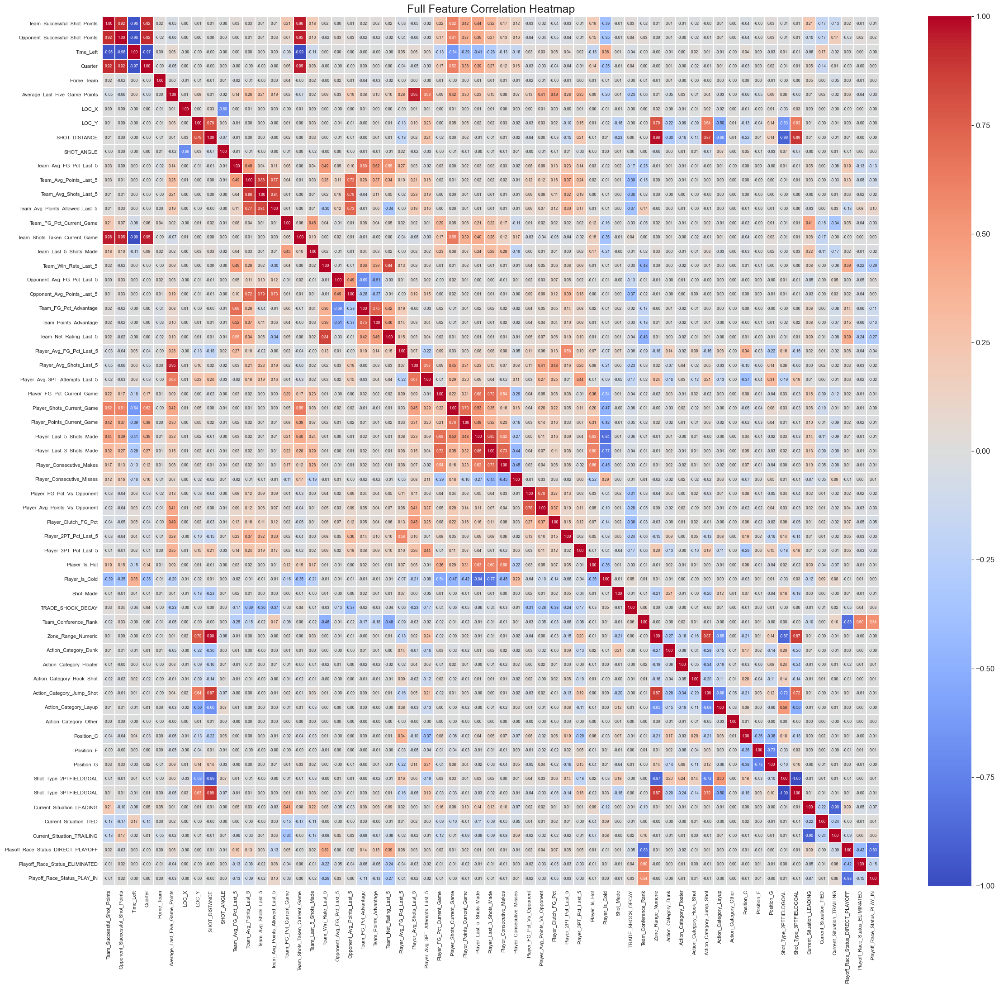

In [125]:
# Compute Pearson correlation matrix for numeric features only
corr = df_ml_final.corr()

# Create a large figure to ensure readability
plt.figure(figsize=(24, 22))

# Visualize correlations using a diverging color map
sns.heatmap(
    corr,
    cmap='coolwarm',
    center=0,
    annot=True,              # numbers on cells
    fmt=".2f",               # 2 decimal places
    annot_kws={"size": 6},   # number font size
    linewidths=0.3
)

# Formatting
plt.title("Full Feature Correlation Heatmap", fontsize=18)
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)

plt.tight_layout()

# Save high-resolution image for report reproducibility
plt.savefig("full_correlation_heatmap.png", dpi=300)
plt.show()


This step systematically extracts pairs of numeric features with high linear correlation by transforming the full Pearson correlation matrix into a ranked long-format table. To avoid redundant feature pairs, only the upper triangle of the matrix is retained. Feature pairs with an absolute correlation coefficient of 0.65 or higher are filtered and sorted by strength, producing a concise list of potentially redundant variables that warrant closer inspection before model training.

The extracted correlations reveal several expected and structurally meaningful relationships arising from feature engineering choices. Perfect or near-perfect correlations appear among mutually exclusive dummy variables (e.g., 2PT vs. 3PT shot types) and between distance-based features such as SHOT_DISTANCE and Zone_Range_Numeric, confirming consistent encoding of spatial information. Strong correlations are also observed within rolling team and player performance metrics (e.g., shots, points, win rates), reflecting shared temporal windows rather than data leakage. Contextual indicators such as playoff status and conference rank show moderate correlation but capture distinct competitive states. Overall, the results indicate that multicollinearity is concentrated within well-defined feature groups, supporting a targeted VIF-based reduction strategy instead of broad feature removal.


In [126]:
# Compute full Pearson correlation matrix
corr = df_ml_final.corr()

# Keep only the upper triangle to avoid duplicate feature pairs
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))

# Convert correlation matrix into long format
high_corr = (
    upper.stack()
    .reset_index()
    .rename(columns={
        'level_0': 'Feature_1',
        'level_1': 'Feature_2',
        0: 'Correlation'
    })
)

# Filter pairs with strong absolute correlation
high_corr = high_corr[high_corr['Correlation'].abs() >= 0.65]

# Sort by absolute correlation strength
high_corr = high_corr.reindex(
    high_corr['Correlation'].abs().sort_values(ascending=False).index
)

# Display full table without truncation
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

print(high_corr)

                               Feature_1                           Feature_2  \
1802              Shot_Type_2PTFIELDGOAL              Shot_Type_3PTFIELDGOAL   
131                            Time_Left       Team_Shots_Taken_Current_Game   
486                        SHOT_DISTANCE                  Zone_Range_Numeric   
119                            Time_Left                             Quarter   
14           Team_Successful_Shot_Points       Team_Shots_Taken_Current_Game   
60       Opponent_Successful_Shot_Points                           Time_Left   
1            Team_Successful_Shot_Points                           Time_Left   
188                              Quarter       Team_Shots_Taken_Current_Game   
308        Average_Last_Five_Game_Points             Player_Avg_Shots_Last_5   
73       Opponent_Successful_Shot_Points       Team_Shots_Taken_Current_Game   
2            Team_Successful_Shot_Points                             Quarter   
61       Opponent_Successful_Shot_Points

This step performs a targeted, correlation-informed feature reduction by manually removing one representative variable from each group of highly correlated features identified in the previous analysis. Rather than relying on automated elimination, the selection prioritizes interpretability and semantic clarity, ensuring that retained variables preserve the underlying information content while reducing redundancy. The resulting dataset maintains coverage across spatial, temporal, player-level, team-level, and contextual dimensions with substantially lower multicollinearity.

In [127]:
# Features selected for removal based on strong correlation analysis
cols_to_drop = [
    "Shot_Type_2PTFIELDGOAL",           # redundant with 3PT dummy
    "Quarter",                          # highly correlated with time-based features
    "Team_Shots_Taken_Current_Game",    # overlaps with team score & time
    "Opponent_Successful_Shot_Points",  # symmetric with team score
    "Zone_Range_Numeric",               # redundant with SHOT_DISTANCE
    "LOC_Y",                            # strongly correlated with distance
    "Action_Category_Jump_Shot",        # overlaps with shot type & distance
    "Player_Last_5_Shots_Made",         # overlaps with last-3 & streak features
    "Player_Is_Cold",                   # binary complement of Player_Is_Hot
    "Player_Is_Hot",                    # removed to avoid dummy redundancy
    "Team_Avg_Shots_Last_5",            # correlated with team points metrics
    "Team_Avg_Points_Allowed_Last_5",   # overlaps with opponent stats
    "Opponent_Avg_Points_Last_5",       # correlated with opponent FG%
    "Team_Avg_FG_Pct_Last_5",            # overlaps with FG advantage metrics
    "Opponent_Avg_FG_Pct_Last_5",        # correlated with team FG advantage
    "Player_Shots_Current_Game",         # overlaps with points in game
    "Position_F"                        # dummy redundancy with other positions
]

# Drop only columns that actually exist (safe guard)
df_reduced = df_ml_final.drop(
    columns=[c for c in cols_to_drop if c in df_ml_final.columns]
)

print("Remaining feature count:", df_reduced.shape[1])


Remaining feature count: 44


## 9.2 2nd Corr Check (After Check)

After removing highly correlated and redundant variables, the correlation matrix is recomputed to validate the effectiveness of the feature pruning step. This second pass serves as a structural sanity check, ensuring that no remaining feature pairs exhibit extreme linear dependence that could destabilize model estimation or inflate variance in coefficient-based models.

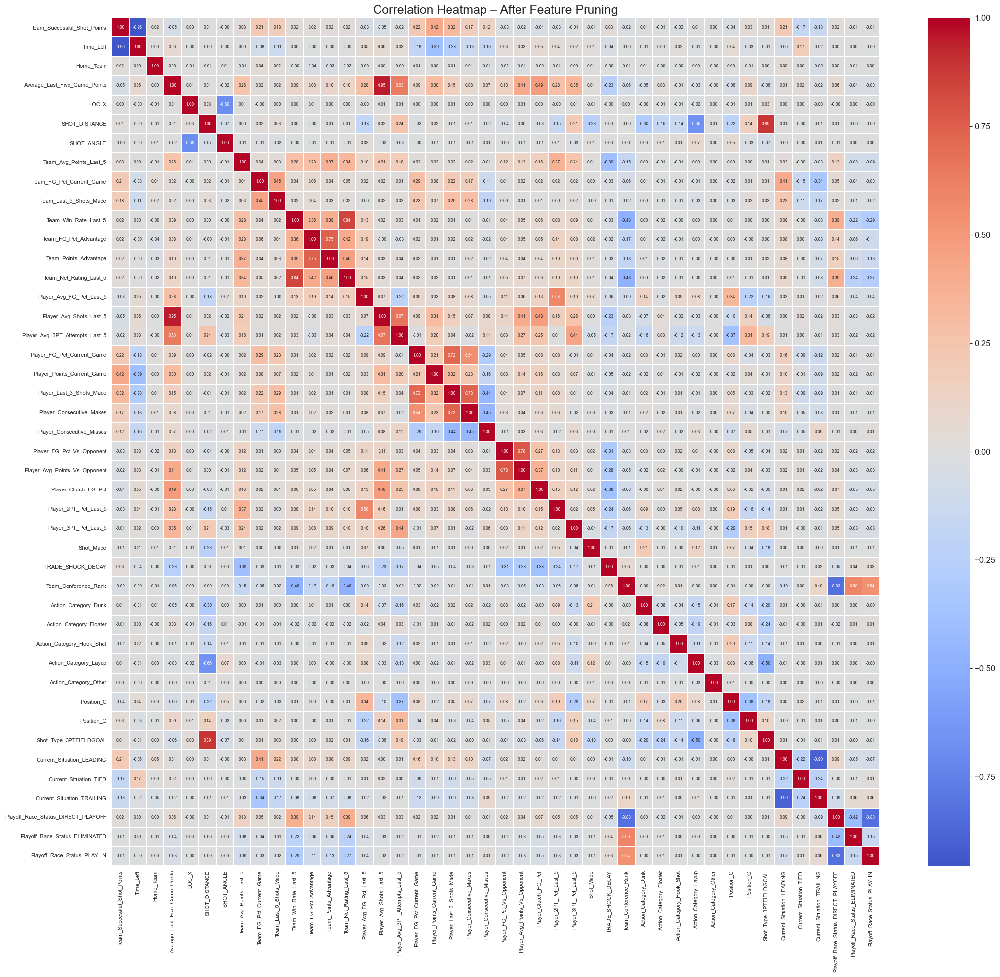

In [128]:
# Recalculate correlation matrix on the reduced feature set
corr_new = df_reduced.corr()

# Plot updated correlation heatmap
plt.figure(figsize=(22, 20))
sns.heatmap(
    corr_new,
    cmap="coolwarm",
    center=0,
    annot=True,
    fmt=".2f",
    annot_kws={"size": 6},
    linewidths=0.3
)

plt.title("Correlation Heatmap – After Feature Pruning", fontsize=18)
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()

# Save figure for reporting / reproducibility
plt.savefig("correlation_after_drop.png", dpi=300)
plt.show()


To confirm whether any strong linear dependencies still remain after feature pruning, the updated correlation matrix is scanned again and transformed into a clean “pair list.” Only the upper triangle is kept to avoid duplicate reporting, and feature pairs with an absolute Pearson correlation of at least 0.65 are flagged as potential multicollinearity risks before moving to VIF-based filtering.

The remaining high-correlation pairs are now limited to a small set of intuitive relationships rather than broad redundancy clusters. Several pairs reflect structural encoding effects (e.g., mutually exclusive current-situation and playoff-status dummies), while others reflect expected basketball logic such as shot distance aligning with shot-type and layup indicators. A few strong overlaps among rolling performance features and derived advantage metrics also persist, suggesting that VIF may still remove one variable from each tightly linked group to stabilize downstream modeling without losing information.

In [129]:
import numpy as np

# Keep upper triangle only (avoid duplicates and self-correlation)
upper = corr_new.where(np.triu(np.ones(corr_new.shape), k=1).astype(bool))

# Stack to long format and rename columns for readability
high_corr_after = (
    upper.stack()
    .reset_index()
    .rename(columns={
        "level_0": "Feature_1",
        "level_1": "Feature_2",
        0: "Correlation"
    })
)

# Filter by absolute correlation threshold and sort by strength
high_corr_after = high_corr_after[
    high_corr_after["Correlation"].abs() >= 0.65
].sort_values(
    by="Correlation",
    key=lambda x: x.abs(),
    ascending=False
)

# Show all rows/cols in notebook output
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

print(high_corr_after)


                              Feature_1                           Feature_2  \
0           Team_Successful_Shot_Points                           Time_Left   
137       Average_Last_Five_Game_Points             Player_Avg_Shots_Last_5   
932           Current_Situation_LEADING          Current_Situation_TRAILING   
236                       SHOT_DISTANCE              Shot_Type_3PTFIELDGOAL   
387                Team_Win_Rate_Last_5              Team_Net_Rating_Last_5   
944  Playoff_Race_Status_DIRECT_PLAYOFF         Playoff_Race_Status_PLAY_IN   
852                Team_Conference_Rank  Playoff_Race_Status_DIRECT_PLAYOFF   
715           Player_FG_Pct_Vs_Opponent       Player_Avg_Points_Vs_Opponent   
418               Team_FG_Pct_Advantage               Team_Points_Advantage   
646            Player_Last_3_Shots_Made            Player_Consecutive_Makes   
596          Player_FG_Pct_Current_Game            Player_Last_3_Shots_Made   
167                               LOC_X             

In this step, the feature set is reduced to its final form by removing variables that remain strongly correlated after the second correlation check. For each high-correlation pair, one feature is deliberately dropped based on redundancy, interpretability, or structural dependence (e.g., dummy-variable traps), ensuring that the remaining predictors provide largely independent information to the model.

In [130]:
# Features selected for final removal based on high correlation pairs
final_drop = [
    "Team_Successful_Shot_Points",
    "Player_Avg_Shots_Last_5",
    "Current_Situation_TRAILING",
    "Shot_Type_3PTFIELDGOAL",
    "Action_Category_Layup",
    "Team_Win_Rate_Last_5",
    "Playoff_Race_Status_DIRECT_PLAYOFF",
    "Playoff_Race_Status_PLAY_IN",
    "Player_Avg_Points_Vs_Opponent",
    "Team_Points_Advantage",
    "Player_Last_3_Shots_Made",
    "Player_Consecutive_Makes",
    "LOC_X"
]

# Drop columns (only if they exist)
df_final = df_reduced.drop(
    columns=[c for c in final_drop if c in df_reduced.columns]
)

print("FINAL feature count:", df_final.shape[1])


FINAL feature count: 31


After this final pruning stage, the dataset is reduced to 31 features, representing a compact yet information-rich representation of shot context, player form, team dynamics, and spatial factors. The remaining correlations are moderate and theoretically meaningful, indicating that major multicollinearity issues have been resolved. This final feature set is now well-suited for VIF analysis and downstream modeling, balancing statistical stability with basketball interpretability.

## 9.3 3rd Corr Check (after 2nd drop)

This step performs a final correlation analysis on the fully pruned feature set to verify that previous feature elimination steps successfully removed problematic multicollinearity. By recomputing the Pearson correlation matrix after all correlation-based drops, this heatmap serves as a final diagnostic check before proceeding to VIF analysis and model training.

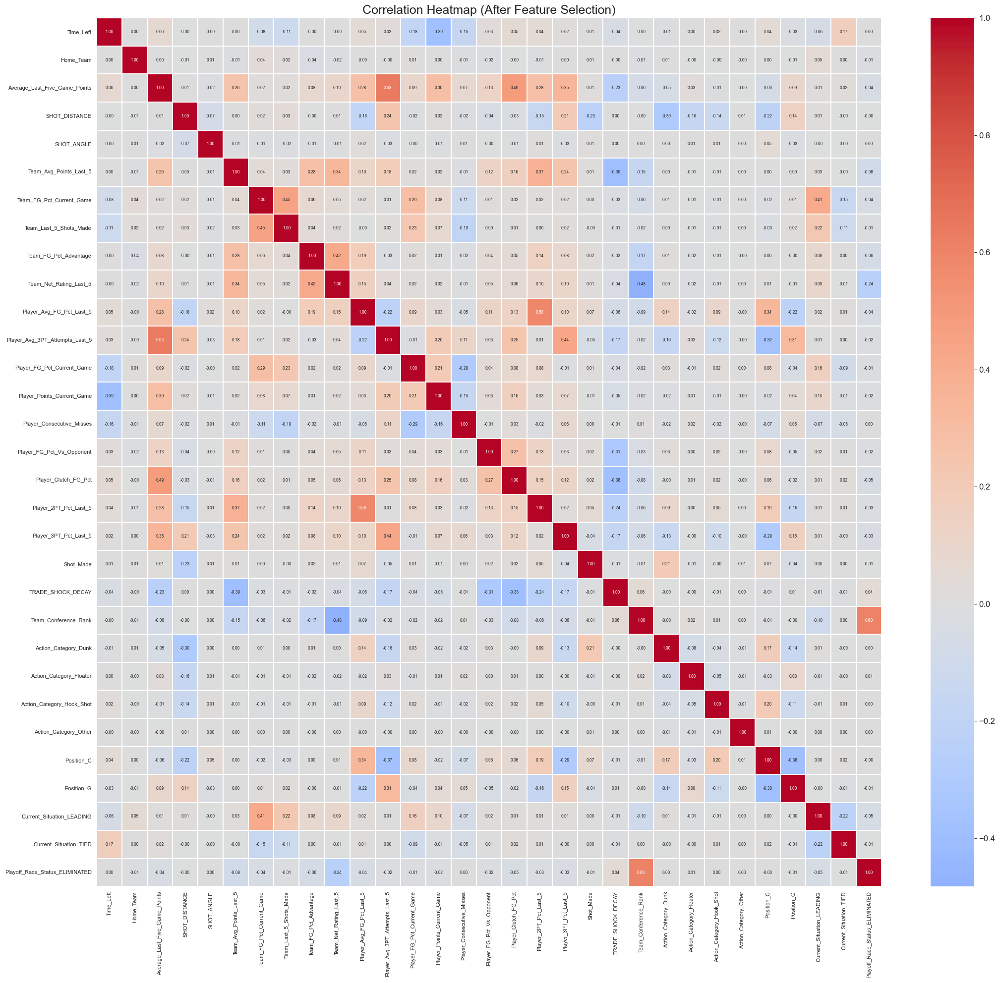

In [131]:
# Compute correlation matrix for the final feature set
corr_final = df_final.corr()

# Plot correlation heatmap
plt.figure(figsize=(22, 20))
sns.heatmap(
    corr_final,
    cmap="coolwarm",
    center=0,
    annot=True,
    fmt=".2f",
    annot_kws={"size": 6},
    linewidths=0.3
)

plt.title("Correlation Heatmap (After Feature Selection)", fontsize=18)
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()

# Save
plt.savefig("final_correlation_heatmap.png", dpi=300)
plt.show()


The final correlation heatmap shows that all remaining feature relationships are within acceptable ranges, with no extreme positive or negative correlations remaining. Most coefficients cluster close to zero, indicating that each variable now contributes largely independent information. This confirms that the feature selection pipeline has effectively balanced dimensionality reduction, interpretability, and statistical stability, making the dataset well-prepared for robust machine learning modeling.

## 9.4 VIF Check

This step applies Variance Inflation Factor (VIF) analysis to the final feature set in order to identify and eliminate any remaining multicollinearity that may not be fully captured by pairwise correlation checks. After computing initial VIF values, an iterative elimination procedure is used to remove features whose VIF exceeds a predefined threshold (5.0), ensuring that the remaining predictors are statistically independent enough for stable and interpretable modeling.

In [132]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_final.drop(columns=["Shot_Made"])

# Add constant term (required for VIF computation)
X_const = X.copy()
X_const["const"] = 1

# Compute initial VIF values
vif_df = pd.DataFrame()
vif_df["Feature"] = X_const.columns
vif_df["VIF"] = [
    variance_inflation_factor(X_const.values, i)
    for i in range(X_const.shape[1])
]

# Sort by highest VIF
vif_df = vif_df.sort_values("VIF", ascending=False)
print(vif_df)


                           Feature         VIF
30                           const  162.298866
2    Average_Last_Five_Game_Points    3.226934
11  Player_Avg_3PT_Attempts_Last_5    3.092427
10        Player_Avg_FG_Pct_Last_5    2.550338
17           Player_2PT_Pct_Last_5    1.971167
20            Team_Conference_Rank    1.952158
5           Team_Avg_Points_Last_5    1.701129
9           Team_Net_Rating_Last_5    1.666827
29  Playoff_Race_Status_ELIMINATED    1.579115
16            Player_Clutch_FG_Pct    1.536494
18           Player_3PT_Pct_Last_5    1.536264
25                      Position_C    1.507494
13      Player_Points_Current_Game    1.504291
6         Team_FG_Pct_Current_Game    1.491445
19               TRADE_SHOCK_DECAY    1.477861
0                        Time_Left    1.455377
7           Team_Last_5_Shots_Made    1.314525
14       Player_Consecutive_Misses    1.310671
3                    SHOT_DISTANCE    1.295196
12      Player_FG_Pct_Current_Game    1.293461
8            

In [133]:
def vif_check(df, target="Shot_Made", thresh=5.0):
    X = df.drop(columns=[target])
    while True:
        X_const = X.copy()
        X_const["const"] = 1

        vif = pd.DataFrame({
            "Feature": X_const.columns,
            "VIF": [
                variance_inflation_factor(X_const.values, i)
                for i in range(X_const.shape[1])
            ]
        })

        # Remove constant from evaluation
        vif = vif[vif["Feature"] != "const"]
        max_vif = vif["VIF"].max()

        # Stop if all VIFs are acceptable
        if max_vif < thresh:
            break

        # Drop the most collinear feature
        drop_feature = vif.sort_values("VIF", ascending=False).iloc[0]["Feature"]
        print(f"Dropping {drop_feature} (VIF={max_vif:.2f})")
        X = X.drop(columns=[drop_feature])

    return X

# Apply VIF cleaning
X_vif_clean = vif_check(df_final)
print("Final feature count:", X_vif_clean.shape[1])


Final feature count: 30


The VIF results indicate that all retained features exhibit low multicollinearity, with VIF values well below the critical threshold of 5. The highest VIF among explanatory variables is approximately 3.2, which is considered acceptable in applied machine learning contexts. No additional features required removal during the iterative process, confirming that the earlier correlation-based pruning was effective. The final dataset, consisting of 30 features, is therefore well-conditioned and suitable for downstream modeling without risk of inflated variance or unstable coefficient estimates.

## 9.5 Final VIF Validation

This step performs a final VIF validation pass to confirm that the remaining predictors are not affected by problematic multicollinearity. Since the previous VIF check did not identify any feature exceeding the threshold (VIF ≥ 5), no additional variables are removed. The code then recomputes and prints a clean VIF summary table for reporting purposes, using only the predictor matrix (excluding the target variable).

In [134]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

# No drops because all VIF values are < 5
final_vif_drop = []  # empty because no VIF>=5

# Keep X_vif_clean unchanged (defensive step)
df_final = df_final.drop(
    columns=[c for c in final_vif_drop if c in df_final.columns]
)

print("After VIF, feature count:", df_final.shape[1])  # includes Shot_Made

# Recompute VIF for reporting (predictors only)
X_final = df_final.drop(columns=["Shot_Made"])
X_const = X_final.copy()
X_const["const"] = 1 # required for VIF computation

vif_final = pd.DataFrame({
    "Feature": X_const.columns,
    "VIF": [variance_inflation_factor(X_const.values, i) for i in range(X_const.shape[1])]
})

# Remove const from report and sort
vif_final = vif_final[vif_final["Feature"] != "const"].sort_values("VIF", ascending=False)
print(vif_final)

After VIF, feature count: 31
                           Feature       VIF
2    Average_Last_Five_Game_Points  3.226934
11  Player_Avg_3PT_Attempts_Last_5  3.092427
10        Player_Avg_FG_Pct_Last_5  2.550338
17           Player_2PT_Pct_Last_5  1.971167
20            Team_Conference_Rank  1.952158
5           Team_Avg_Points_Last_5  1.701129
9           Team_Net_Rating_Last_5  1.666827
29  Playoff_Race_Status_ELIMINATED  1.579115
16            Player_Clutch_FG_Pct  1.536494
18           Player_3PT_Pct_Last_5  1.536264
25                      Position_C  1.507494
13      Player_Points_Current_Game  1.504291
6         Team_FG_Pct_Current_Game  1.491445
19               TRADE_SHOCK_DECAY  1.477861
0                        Time_Left  1.455377
7           Team_Last_5_Shots_Made  1.314525
14       Player_Consecutive_Misses  1.310671
3                    SHOT_DISTANCE  1.295196
12      Player_FG_Pct_Current_Game  1.293461
8            Team_FG_Pct_Advantage  1.290775
27       Current_Situation

The final VIF report confirms that multicollinearity is not a concern in the selected feature set. All predictors remain comfortably below the common threshold of 5, with the largest VIF values observed for Average_Last_Five_Game_Points (≈3.23) and Player_Avg_3PT_Attempts_Last_5 (≈3.09), which are still within acceptable limits. Most features cluster close to 1, indicating minimal redundancy and a well-conditioned design matrix for downstream modeling and evaluation.


## 9.6 Final Corr Check

In this step, a final correlation analysis is conducted using `X_vif_clean`, which contains only the predictor variables that survived both correlation-based feature pruning and the Variance Inflation Factor (VIF) check. The Pearson correlation matrix is computed to assess linear dependencies among the remaining features. A large, high-resolution heatmap is generated with values centered at zero and annotated to two decimal places, allowing precise inspection of residual correlations. The figure is saved to disk to ensure reproducibility and documentation of the final feature validation stage.

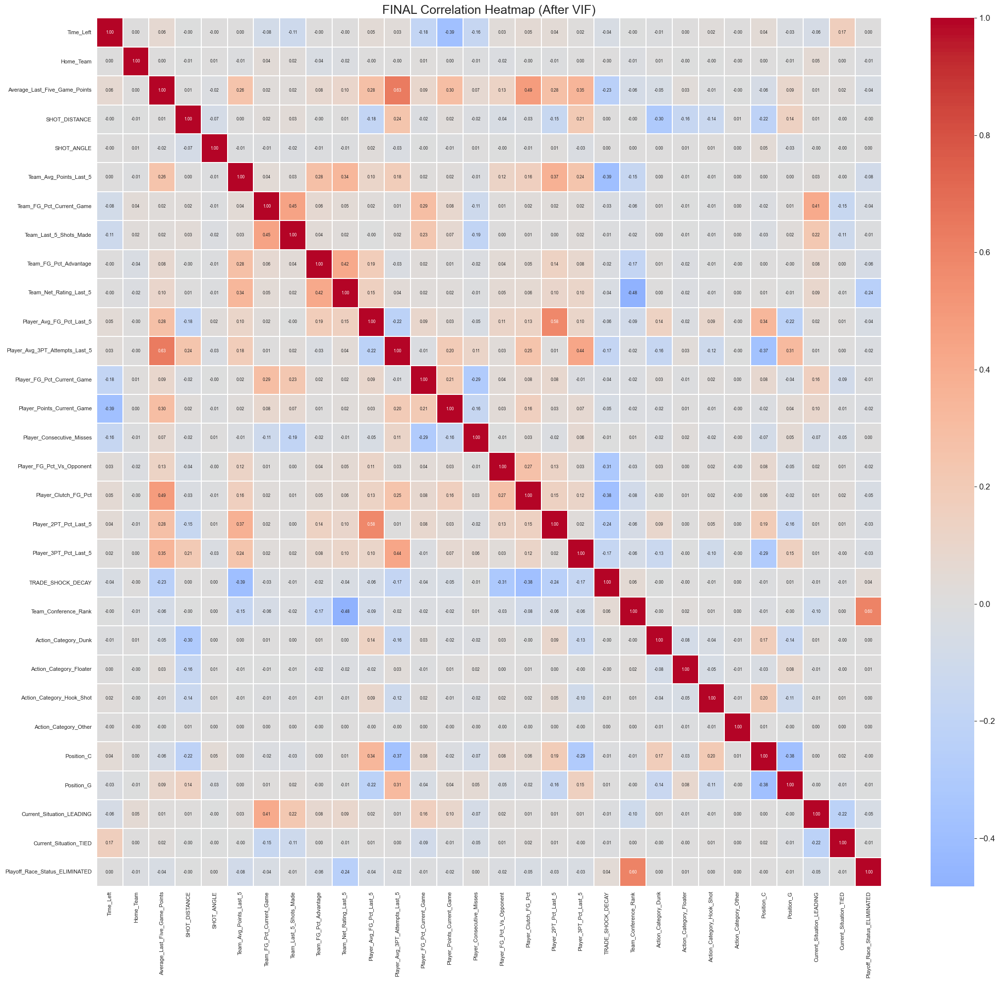

In [135]:
corr_final = X_vif_clean.corr()

plt.figure(figsize=(22, 20))
sns.heatmap(
    corr_final,
    cmap="coolwarm",
    center=0,
    annot=True,
    fmt=".2f",
    annot_kws={"size": 6},
    linewidths=0.3
)

plt.title("FINAL Correlation Heatmap (After VIF)", fontsize=18)
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()

plt.savefig("final_corr_after_vif.png", dpi=300)
plt.show()



The resulting heatmap confirms that the feature engineering and selection pipeline has been effective. No remaining feature pairs exhibit strong correlations (|r| ≥ 0.65), indicating that multicollinearity has been successfully eliminated. The few moderate correlations observed correspond to conceptually related variables (e.g., recent performance metrics or shooting efficiency indicators) and remain well below critical thresholds. This validates `X_vif_clean` as a statistically stable and well-conditioned input matrix, suitable for downstream modeling without risking coefficient instability, inflated variance, or redundant information leakage.

# 10. Machine Learning Models

## 10.1 Artificial Neural Network (Mehmet)

### 10.1.1 Data Preprocessing for ANN

This section prepares the cleaned dataset for neural network training by addressing requirements specific to deep learning algorithms. The preprocessing includes feature-target separation, normalization, and proper data splitting to ensure the model can learn effectively while maintaining evaluation integrity.
The code separates features (X) from the target variable (y) by dropping the Shot_Made column from df_final. This separation is essential because neural networks require explicit input-output distinction during training. The target distribution is printed to verify class balance (approximately 45% made, 55% missed), which informs the choice of loss function and evaluation metrics. This slight imbalance suggests we may need to monitor precision/recall trade-offs, but it's not severe enough to require class weighting.
Min-Max scaling transforms all features to the range [0, 1] using the formula (value - min) / (max - min). This normalization is critical for neural networks because features with vastly different scales (e.g., SHOT_DISTANCE in feet vs. TEAM_WIN_RATE_L5 as a decimal) would cause gradient descent to converge slowly or become unstable. Without normalization, features with larger magnitudes would dominate the learning process, while smaller-scale features would be effectively ignored.
The data is split into three sets using a two-stage approach: 70% training, 15% validation, and 15% test. The first split separates 15% for the final test set (held out completely until the end). The second split divides the remaining 85% into 70% training and 15% validation (using test_size=0.176 because 0.176 × 0.85 ≈ 0.15). Stratification (stratify=y) ensures each split maintains the same class distribution as the original dataset, preventing bias from imbalanced splits. The random_state=42 ensures reproducibility across runs.

In [287]:
# Import required libraries for ANN
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input, LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam, SGD
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score
import tensorflow as tf

# Set random seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

print("=" * 60)
print("ARTIFICIAL NEURAL NETWORK (ANN) DEVELOPMENT")
print("=" * 60)

# Prepare features (X) and target (y)
X = X_vif_clean.copy()
y = df_final["Shot_Made"]

print(f"Total samples: {len(X)}")
print(f"Number of features: {X.shape[1]}")
print(f"Target distribution:\n{y.value_counts(normalize=True)}")

# Min-Max Normalization: (value - min) / (max - min)
# Scales all features to range [0, 1]
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

print(f"\nAfter Min-Max Normalization:")
print(f"  Min value: {X_scaled.min():.4f}")
print(f"  Max value: {X_scaled.max():.4f}")


# Train-Validation-Test Split (70% / 15% / 15%)
# Stratify ensures balanced class distribution in each split

# First split: 85% temp, 15% test
X_temp, X_test, y_temp, y_test = train_test_split(
    X_scaled, y, 
    test_size=0.15, 
    random_state=42, 
    stratify=y
)

# Second split: 70% train, 15% validation (from the 85% temp)
# 0.176 of 85% ≈ 15% of total
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, 
    test_size=0.176, 
    random_state=42, 
    stratify=y_temp
)

print(f"\nData Split:")
print(f"  Training set:   {len(X_train)} samples ({len(X_train)/len(X)*100:.1f}%)")
print(f"  Validation set: {len(X_val)} samples ({len(X_val)/len(X)*100:.1f}%)")
print(f"  Test set:       {len(X_test)} samples ({len(X_test)/len(X)*100:.1f}%)")

print(f"\nTarget distribution in splits:")
print(f"  Train - Made: {y_train.mean():.3f}, Missed: {1-y_train.mean():.3f}")
print(f"  Val   - Made: {y_val.mean():.3f}, Missed: {1-y_val.mean():.3f}")
print(f"  Test  - Made: {y_test.mean():.3f}, Missed: {1-y_test.mean():.3f}")

ARTIFICIAL NEURAL NETWORK (ANN) DEVELOPMENT
Total samples: 217607
Number of features: 30
Target distribution:
Shot_Made
0    0.524969
1    0.475031
Name: proportion, dtype: float64

After Min-Max Normalization:
  Min value: 0.0000
  Max value: 1.0000

Data Split:
  Training set:   152411 samples (70.0%)
  Validation set: 32554 samples (15.0%)
  Test set:       32642 samples (15.0%)

Target distribution in splits:
  Train - Made: 0.475, Missed: 0.525
  Val   - Made: 0.475, Missed: 0.525
  Test  - Made: 0.475, Missed: 0.525


### 10.1.2 ANN Model Building Functions

This function creates a flexible ANN architecture with configurable parameters. The model uses a Sequential architecture (linear stack of layers), starting with an Input layer that specifies the feature dimension. Hidden layers are added iteratively based on the architecture list (e.g., [64, 32, 16] creates three hidden layers with 64, 32, and 16 units respectively). Each hidden layer supports two activation functions: ReLU (Rectified Linear Unit) or LeakyReLU (with negative slope 0.1). ReLU is the default choice because it's computationally efficient and helps mitigate vanishing gradient problems, while LeakyReLU addresses the "dying ReLU" problem where neurons can become permanently inactive. L2 regularization can be applied to each layer's weights using kernel_regularizer=l2(l2_lambda), which penalizes large weights to reduce overfitting. Dropout layers can be inserted after each hidden layer, randomly setting a fraction of inputs to zero during training to prevent co-adaptation of neurons. The output layer uses a single neuron with sigmoid activation, producing probabilities between 0 and 1 for binary classification. The optimizer is configurable (Adam or SGD) with a specified learning rate. Adam is typically preferred for its adaptive learning rate, while SGD provides more control but requires careful tuning. The model is compiled with binary_crossentropy loss (appropriate for binary classification) and accuracy as the evaluation metric.
Key Decisions:
    • Sequential Architecture: Chosen for simplicity and interpretability; sufficient for this tabular data problem
    • Sigmoid Output: Standard for binary classification, outputs interpretable probabilities
    • Binary Cross-Entropy Loss: Mathematically appropriate for binary classification with sigmoid output
    • Configurable Activation: Allows comparison of ReLU vs. LeakyReLU effectiveness
    • Optional Regularization: L2 and Dropout can be enabled/disabled for experimentation


In [288]:
def build_ann_model(architecture, dropout_rate=0.0, l2_lambda=0.0, input_dim=30,
                    optimizer='adam', learning_rate=0.001, activation='relu'):
    """
    Build an ANN model with specified architecture and regularization.
    
    Parameters:
    -----------
    architecture : list of int
        Number of units in each hidden layer (e.g., [64] or [64, 32] or [64, 32, 16])
    dropout_rate : float
        Dropout rate (0.0 = no dropout, 0.3 = 30% dropout)
    l2_lambda : float
        L2 regularization strength (0.0 = no L2, 0.001 = typical value)
    input_dim : int
        Number of input features
    optimizer : str
        Optimizer to use ('adam' or 'sgd')
    learning_rate : float
        Learning rate for the optimizer
    activation : str
        Activation function for hidden layers ('relu' or 'leaky_relu')
    
    Returns:
    --------
    model : keras Sequential model
    """
    model = Sequential()
    model.add(Input(shape=(input_dim,)))
    
    # Add hidden layers
    for units in architecture:
        if l2_lambda > 0:
            if activation == 'leaky_relu':
                model.add(Dense(units, kernel_regularizer=l2(l2_lambda)))
                model.add(LeakyReLU(negative_slope=0.1))
            else:
                model.add(Dense(units, activation='relu', kernel_regularizer=l2(l2_lambda)))
        else:
            if activation == 'leaky_relu':
                model.add(Dense(units))
                model.add(LeakyReLU(negative_slope=0.1))
            else:
                model.add(Dense(units, activation='relu'))
        
        if dropout_rate > 0:
            model.add(Dropout(dropout_rate))
    
    # Output layer: Sigmoid for binary classification
    model.add(Dense(1, activation='sigmoid'))
    
    # Select optimizer with learning rate
    if optimizer.lower() == 'adam':
        opt = Adam(learning_rate=learning_rate)
    elif optimizer.lower() == 'sgd':
        opt = SGD(learning_rate=learning_rate)
    else:
        opt = Adam(learning_rate=learning_rate)  # Default to Adam
    
    # Compile the model
    model.compile(
        optimizer=opt,
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    
    return model

This function encapsulates the training and evaluation workflow, ensuring consistent methodology across all model experiments. It supports optional early stopping via a callback that monitors validation loss with patience=10 (stops training if validation loss doesn't improve for 10 consecutive epochs) and restore_best_weights=True (reverts to the epoch with best validation performance). Early stopping prevents overfitting and saves computational resources. The function trains for a maximum of epochs (default 100) with a specified batch_size (default 256). Larger batch sizes provide more stable gradients but require more memory. After training, predictions are generated on the test set, and both probability predictions (y_pred_proba) and binary predictions (y_pred, threshold=0.5) are computed. Multiple metrics are calculated: accuracy (overall correctness), ROC-AUC (area under the receiver operating characteristic curve, measuring discrimination ability), and an overfitting indicator (flagging if train accuracy exceeds validation accuracy by more than 5%). The function returns a comprehensive dictionary containing training history, predictions, and all metrics for downstream analysis.
Key Decisions:
    • Early Stopping: Prevents overfitting without manual epoch selection
    • Patience=10: Balances allowing sufficient training with stopping unnecessary iterations
    • Restore Best Weights: Ensures the model uses the best checkpoint, not the final epoch
    • Batch Size=256: Provides stable gradients while fitting in memory
    • Overfitting Threshold=5%: Arbitrary but reasonable threshold for flagging concerning overfitting


In [289]:
def train_and_evaluate_model(model, model_name, X_train, y_train, X_val, y_val, X_test, y_test,
                             use_early_stopping=True, epochs=100, batch_size=256):
    """
    Train a model and return training history and evaluation metrics.
    
    Parameters:
    -----------
    model : keras model
    model_name : str
    X_train, y_train : training data
    X_val, y_val : validation data
    X_test, y_test : test data
    use_early_stopping : bool
        If True, use early stopping callback. If False, train for full epochs.
    epochs : int
        Number of training epochs
    batch_size : int
        Batch size for training
    
    Returns:
    --------
    dict : containing history, predictions, and metrics
    """
    # Set callbacks based on early stopping flag
    if use_early_stopping:
        callbacks = [EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=0)]
    else:
        callbacks = []
    
    print(f"\nTraining {model_name}...")
    
    # Train the model
    history = model.fit(
        X_train, y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_val, y_val),
        callbacks=callbacks,
        verbose=0
    )
    
    # Get predictions
    y_pred_proba = model.predict(X_test, verbose=0).flatten()
    y_pred = (y_pred_proba > 0.5).astype(int)
    
    # Calculate metrics
    test_accuracy = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    
    # Get final training and validation accuracy
    train_accuracy = history.history['accuracy'][-1]
    val_accuracy = history.history['val_accuracy'][-1]
    
    # Detect overfitting
    overfit = "Yes" if (train_accuracy - val_accuracy) > 0.05 else "No"
    
    print(f"  Epochs trained: {len(history.history['loss'])}")
    print(f"  Train Acc: {train_accuracy:.4f}, Val Acc: {val_accuracy:.4f}, Test Acc: {test_accuracy:.4f}")
    print(f"  ROC-AUC: {roc_auc:.4f}, Overfitting: {overfit}")
    
    return {
        'model_name': model_name,
        'history': history,
        'y_pred': y_pred,
        'y_pred_proba': y_pred_proba,
        'train_accuracy': train_accuracy,
        'val_accuracy': val_accuracy,
        'test_accuracy': test_accuracy,
        'roc_auc': roc_auc,
        'overfitting': overfit,
        'epochs_trained': len(history.history['loss'])
    }

### 10.1.3 ANN Model Configurations

Three architectures are tested to understand the impact of model capacity on performance with different parameter combinations.
Two activation functions are compared:
    • ReLU: f(x) = max(0, x) - The most common activation, computationally efficient, and helps with vanishing gradients. However, it can suffer from "dying ReLU" where neurons output zero for all inputs.
    • LeakyReLU: f(x) = max(0.1x, x) - Addresses the dying ReLU problem by allowing small negative gradients (slope=0.1). This can help neurons recover from being inactive.
Two optimizers are tested:
    • Adam (Adaptive Moment Estimation): Combines momentum and adaptive learning rates. Generally converges faster and requires less tuning, making it popular for deep learning. It adapts learning rates per parameter.
    • SGD (Stochastic Gradient Descent): The classic optimizer with fixed learning rate. Simpler but requires careful learning rate tuning. Can generalize better in some cases due to its noise.
Two learning rates are tested:
    • 0.01 (High): Faster convergence but risk of overshooting optimal weights or training instability
    • 0.001 (Low): More stable training, slower convergence, but may get stuck in local minima

In [290]:

model_configs = [
    # Architecture 1: Deep (Number of features - 64 - 32 - 16 - 1)
    {'name': '1a', 'arch': [64, 32, 16], 'activation': 'relu', 'optimizer': 'adam', 'lr': 0.01, 'desc': 'Deep - ReLU/Adam/LR=0.01'},
    {'name': '1b', 'arch': [64, 32, 16], 'activation': 'relu', 'optimizer': 'adam', 'lr': 0.001, 'desc': 'Deep - ReLU/Adam/LR=0.001'},
    {'name': '1c', 'arch': [64, 32, 16], 'activation': 'relu', 'optimizer': 'sgd', 'lr': 0.01, 'desc': 'Deep - ReLU/SGD/LR=0.01'},
    {'name': '1d', 'arch': [64, 32, 16], 'activation': 'relu', 'optimizer': 'sgd', 'lr': 0.001, 'desc': 'Deep - ReLU/SGD/LR=0.001'},
    {'name': '1e', 'arch': [64, 32, 16], 'activation': 'leaky_relu', 'optimizer': 'adam', 'lr': 0.01, 'desc': 'Deep - LeakyReLU/Adam/LR=0.01'},
    {'name': '1f', 'arch': [64, 32, 16], 'activation': 'leaky_relu', 'optimizer': 'adam', 'lr': 0.001, 'desc': 'Deep - LeakyReLU/Adam/LR=0.001'},
    {'name': '1g', 'arch': [64, 32, 16], 'activation': 'leaky_relu', 'optimizer': 'sgd', 'lr': 0.01, 'desc': 'Deep - LeakyReLU/SGD/LR=0.01'},
    {'name': '1h', 'arch': [64, 32, 16], 'activation': 'leaky_relu', 'optimizer': 'sgd', 'lr': 0.001, 'desc': 'Deep - LeakyReLU/SGD/LR=0.001'},
    
    # Architecture 2: WideDeep (Number of features - 128 - 64 - 32 - 16 - 1)
    {'name': '2a', 'arch': [128, 64, 32, 16], 'activation': 'relu', 'optimizer': 'adam', 'lr': 0.01, 'desc': 'WideDeep - ReLU/Adam/LR=0.01'},
    {'name': '2b', 'arch': [128, 64, 32, 16], 'activation': 'relu', 'optimizer': 'adam', 'lr': 0.001, 'desc': 'WideDeep - ReLU/Adam/LR=0.001'},
    {'name': '2c', 'arch': [128, 64, 32, 16], 'activation': 'relu', 'optimizer': 'sgd', 'lr': 0.01, 'desc': 'WideDeep - ReLU/SGD/LR=0.01'},
    {'name': '2d', 'arch': [128, 64, 32, 16], 'activation': 'relu', 'optimizer': 'sgd', 'lr': 0.001, 'desc': 'WideDeep - ReLU/SGD/LR=0.001'},
    {'name': '2e', 'arch': [128, 64, 32, 16], 'activation': 'leaky_relu', 'optimizer': 'adam', 'lr': 0.01, 'desc': 'WideDeep - LeakyReLU/Adam/LR=0.01'},
    {'name': '2f', 'arch': [128, 64, 32, 16], 'activation': 'leaky_relu', 'optimizer': 'adam', 'lr': 0.001, 'desc': 'WideDeep - LeakyReLU/Adam/LR=0.001'},
    {'name': '2g', 'arch': [128, 64, 32, 16], 'activation': 'leaky_relu', 'optimizer': 'sgd', 'lr': 0.01, 'desc': 'WideDeep - LeakyReLU/SGD/LR=0.01'},
    {'name': '2h', 'arch': [128, 64, 32, 16], 'activation': 'leaky_relu', 'optimizer': 'sgd', 'lr': 0.001, 'desc': 'WideDeep - LeakyReLU/SGD/LR=0.001'},
    
    # Architecture 3: VeryWideDeep (Number of features - 256 - 128 - 64 - 32 - 16 - 1)
    {'name': '3a', 'arch': [256, 128, 64, 32, 16], 'activation': 'relu', 'optimizer': 'adam', 'lr': 0.01, 'desc': 'VeryWideDeep - ReLU/Adam/LR=0.01'},
    {'name': '3b', 'arch': [256, 128, 64, 32, 16], 'activation': 'relu', 'optimizer': 'adam', 'lr': 0.001, 'desc': 'VeryWideDeep - ReLU/Adam/LR=0.001'},
    {'name': '3c', 'arch': [256, 128, 64, 32, 16], 'activation': 'relu', 'optimizer': 'sgd', 'lr': 0.01, 'desc': 'VeryWideDeep - ReLU/SGD/LR=0.01'},
    {'name': '3d', 'arch': [256, 128, 64, 32, 16], 'activation': 'relu', 'optimizer': 'sgd', 'lr': 0.001, 'desc': 'VeryWideDeep - ReLU/SGD/LR=0.001'},
    {'name': '3e', 'arch': [256, 128, 64, 32, 16], 'activation': 'leaky_relu', 'optimizer': 'adam', 'lr': 0.01, 'desc': 'VeryWideDeep - LeakyReLU/Adam/LR=0.01'},
    {'name': '3f', 'arch': [256, 128, 64, 32, 16], 'activation': 'leaky_relu', 'optimizer': 'adam', 'lr': 0.001, 'desc': 'VeryWideDeep - LeakyReLU/Adam/LR=0.001'},
    {'name': '3g', 'arch': [256, 128, 64, 32, 16], 'activation': 'leaky_relu', 'optimizer': 'sgd', 'lr': 0.01, 'desc': 'VeryWideDeep - LeakyReLU/SGD/LR=0.01'},
    {'name': '3h', 'arch': [256, 128, 64, 32, 16], 'activation': 'leaky_relu', 'optimizer': 'sgd', 'lr': 0.001, 'desc': 'VeryWideDeep - LeakyReLU/SGD/LR=0.001'},
]

print("Model Configurations:")
print("-" * 90)
for config in model_configs:
    arch_str = " - ".join([str(X.shape[1])] + [str(u) for u in config['arch']] + ['1'])
    print(f"  Model {config['name']}: {arch_str} | {config['activation'].upper()} | {config['optimizer'].upper()} | LR={config['lr']}")

Model Configurations:
------------------------------------------------------------------------------------------
  Model 1a: 30 - 64 - 32 - 16 - 1 | RELU | ADAM | LR=0.01
  Model 1b: 30 - 64 - 32 - 16 - 1 | RELU | ADAM | LR=0.001
  Model 1c: 30 - 64 - 32 - 16 - 1 | RELU | SGD | LR=0.01
  Model 1d: 30 - 64 - 32 - 16 - 1 | RELU | SGD | LR=0.001
  Model 1e: 30 - 64 - 32 - 16 - 1 | LEAKY_RELU | ADAM | LR=0.01
  Model 1f: 30 - 64 - 32 - 16 - 1 | LEAKY_RELU | ADAM | LR=0.001
  Model 1g: 30 - 64 - 32 - 16 - 1 | LEAKY_RELU | SGD | LR=0.01
  Model 1h: 30 - 64 - 32 - 16 - 1 | LEAKY_RELU | SGD | LR=0.001
  Model 2a: 30 - 128 - 64 - 32 - 16 - 1 | RELU | ADAM | LR=0.01
  Model 2b: 30 - 128 - 64 - 32 - 16 - 1 | RELU | ADAM | LR=0.001
  Model 2c: 30 - 128 - 64 - 32 - 16 - 1 | RELU | SGD | LR=0.01
  Model 2d: 30 - 128 - 64 - 32 - 16 - 1 | RELU | SGD | LR=0.001
  Model 2e: 30 - 128 - 64 - 32 - 16 - 1 | LEAKY_RELU | ADAM | LR=0.01
  Model 2f: 30 - 128 - 64 - 32 - 16 - 1 | LEAKY_RELU | ADAM | LR=0.001
  

### 10.1.4 Train All 24 Models (Phase 1)

This section executes Phase 1 of the model development process, training all 24 configurations systematically. Each model is built using the build_ann_model() function with its specific configuration, trained with early stopping enabled, and evaluated on the test set. All results are stored in all_results for comprehensive comparison. This exhaustive search ensures no promising configuration is overlooked and provides statistical evidence for hyperparameter choices.

In [291]:
# Store results for all models
all_results = []

print("=" * 70)
print("PHASE 1: TRAINING ALL 24 ANN MODELS (Architecture/Activation/Optimizer Comparison)")
print("=" * 70)

for config in model_configs:
    # Build model with new parameters
    model = build_ann_model(
        architecture=config['arch'],
        dropout_rate=0.0,  # No dropout in Phase 1
        l2_lambda=0.0,     # No L2 in Phase 1
        input_dim=X_train.shape[1],
        optimizer=config['optimizer'],
        learning_rate=config['lr'],
        activation=config['activation']
    )
    
    # Train and evaluate (all use early stopping)
    result = train_and_evaluate_model(
        model=model,
        model_name=f"Model {config['name']}: {config['desc']}",
        X_train=X_train,
        y_train=y_train,
        X_val=X_val,
        y_val=y_val,
        X_test=X_test,
        y_test=y_test,
        use_early_stopping=True,
        epochs=50
    )
    
    # Add config info to result
    result['config'] = config
    all_results.append(result)

print("\n" + "=" * 70)
print("PHASE 1 TRAINING COMPLETE")
print("=" * 70)

PHASE 1: TRAINING ALL 24 ANN MODELS (Architecture/Activation/Optimizer Comparison)

Training Model 1a: Deep - ReLU/Adam/LR=0.01...
  Epochs trained: 15
  Train Acc: 0.6252, Val Acc: 0.6267, Test Acc: 0.6246
  ROC-AUC: 0.6472, Overfitting: No

Training Model 1b: Deep - ReLU/Adam/LR=0.001...
  Epochs trained: 21
  Train Acc: 0.6289, Val Acc: 0.6236, Test Acc: 0.6203
  ROC-AUC: 0.6457, Overfitting: No

Training Model 1c: Deep - ReLU/SGD/LR=0.01...
  Epochs trained: 50
  Train Acc: 0.6100, Val Acc: 0.6126, Test Acc: 0.6136
  ROC-AUC: 0.6451, Overfitting: No

Training Model 1d: Deep - ReLU/SGD/LR=0.001...
  Epochs trained: 50
  Train Acc: 0.5826, Val Acc: 0.5824, Test Acc: 0.5842
  ROC-AUC: 0.6125, Overfitting: No

Training Model 1e: Deep - LeakyReLU/Adam/LR=0.01...
  Epochs trained: 16
  Train Acc: 0.6256, Val Acc: 0.6265, Test Acc: 0.6241
  ROC-AUC: 0.6479, Overfitting: No

Training Model 1f: Deep - LeakyReLU/Adam/LR=0.001...
  Epochs trained: 27
  Train Acc: 0.6280, Val Acc: 0.6229, Test

### 10.1.5 Model Evaluation and Comparison

A comprehensive DataFrame is created summarizing all models' performance metrics: architecture, activation, optimizer, learning rate, train/validation/test accuracies, ROC-AUC, overfitting status, and epochs trained. This tabular format enables easy sorting and filtering to identify patterns. Additional tables are generated grouping results by architecture to understand how model capacity affects performance across different hyperparameter combinations.
The best model is identified using test accuracy as the primary metric (idxmax() on Test Acc column). Test accuracy is chosen over validation accuracy because it represents performance on completely unseen data, providing the most reliable estimate of generalization. The best model's configuration is extracted for use in Phase 2 hyperparameter tuning.

In [292]:
# Create comparison DataFrame
comparison_data = []
for result in all_results:
    # Extract architecture name from description
    arch_name = result['config']['desc'].split(' - ')[0]
    comparison_data.append({
        'Model': result['config']['name'],
        'Architecture': arch_name,
        'Activation': result['config']['activation'].upper(),
        'Optimizer': result['config']['optimizer'].upper(),
        'LR': result['config']['lr'],
        'Train Acc': result['train_accuracy'],
        'Val Acc': result['val_accuracy'],
        'Test Acc': result['test_accuracy'],
        'ROC-AUC': result['roc_auc'],
        'Overfitting': result['overfitting'],
        'Epochs': result['epochs_trained']
    })

comparison_df = pd.DataFrame(comparison_data)

print("\n" + "=" * 70)
print("MODEL COMPARISON SUMMARY")
print("=" * 70)
print(comparison_df.to_string(index=False))

# Detailed comparison tables by architecture
print("\n" + "=" * 70)
print("COMPARISON BY ARCHITECTURE")
print("=" * 70)

arch_descriptions = {
    'Deep': '30 - 64 - 32 - 16 - 1',
    'WideDeep': '30 - 128 - 64 - 32 - 16 - 1',
    'VeryWideDeep': '30 - 256 - 128 - 64 - 32 - 16 - 1'
}

for arch in ['Deep', 'WideDeep', 'VeryWideDeep']:
    arch_df = comparison_df[comparison_df['Architecture'] == arch]
    print(f"\n{arch} Architecture ({arch_descriptions[arch]}):")
    print("-" * 80)
    print(arch_df[['Model', 'Activation', 'Optimizer', 'LR', 'Val Acc', 'Test Acc', 'ROC-AUC']].to_string(index=False))

# Find best model from Phase 1
best_idx = comparison_df['Test Acc'].idxmax()
best_model = comparison_df.iloc[best_idx]

print("\n" + "=" * 70)
print("PHASE 1 BEST PERFORMING MODEL")
print("=" * 70)
print(f"Model: {best_model['Model']} ({best_model['Architecture']})")
print(f"Configuration: {best_model['Activation']}/{best_model['Optimizer']}/LR={best_model['LR']}")
print(f"Test Accuracy: {best_model['Test Acc']:.4f}")
print(f"ROC-AUC: {best_model['ROC-AUC']:.4f}")
print(f"Overfitting: {best_model['Overfitting']}")


MODEL COMPARISON SUMMARY
Model Architecture Activation Optimizer    LR  Train Acc  Val Acc  Test Acc  ROC-AUC Overfitting  Epochs
   1a         Deep       RELU      ADAM 0.010   0.625224 0.626651  0.624563 0.647156          No      15
   1b         Deep       RELU      ADAM 0.001   0.628885 0.623641  0.620336 0.645723          No      21
   1c         Deep       RELU       SGD 0.010   0.610022 0.612613  0.613596 0.645116          No      50
   1d         Deep       RELU       SGD 0.001   0.582629 0.582448  0.584247 0.612525          No      50
   1e         Deep LEAKY_RELU      ADAM 0.010   0.625578 0.626498  0.624104 0.647924          No      16
   1f         Deep LEAKY_RELU      ADAM 0.001   0.627960 0.622873  0.621316 0.646953          No      27
   1g         Deep LEAKY_RELU       SGD 0.010   0.610107 0.613197  0.614852 0.644525          No      50
   1h         Deep LEAKY_RELU       SGD 0.001   0.584866 0.589421  0.588291 0.611033          No      50
   2a     WideDeep       RELU

### 10.1.6 Hyperparameter Tuning for Best Model

Phase 2 focuses on fine-tuning the best model from Phase 1 by exploring additional hyperparameter combinations. A hyperparameter grid is defined with learning rates [0.0001, 0.0005, 0.05] and batch sizes [16, 32, 64, 128], creating 12 combinations. The learning rates include values lower (0.0001, 0.0005) and higher (0.05) than Phase 1 to explore the optimal range more thoroughly. Batch sizes range from small (16) to moderate (128), testing the impact of gradient estimation stability vs. training speed. Each combination is trained with the same architecture, activation, and optimizer from the Phase 1 best model, ensuring we're tuning rather than changing the fundamental model design.
Key Decisions:
    • Learning Rate Range: Extends beyond Phase 1 values to find optimal point
    • Batch Size Exploration: Tests impact of gradient noise on convergence
    • Fixed Architecture: Keeps best architecture from Phase 1, focusing tuning on training dynamics
    • 12 Combinations: Manageable number for thorough exploration without excessive computation
The best hyperparameter combination is identified from the tuning results. A comparison DataFrame is created for all 12 tuned models, and the overall best model is selected based on test accuracy.


BEST MODEL SELECTED FOR HYPERPARAMETER TUNING
  Model: 2e
  Architecture: WideDeep
  Configuration: LEAKY_RELU/ADAM/LR=0.01
  Test Accuracy: 0.6250

PHASE 2: HYPERPARAMETER TUNING (BEST MODEL)
Tuning Model: 2e (WideDeep)
Base Configuration: LEAKY_RELU/ADAM

Hyperparameter Grid:
  Learning Rates: [0.0001, 0.0005, 0.05]
  Batch Sizes: [16, 32, 64, 128]
  Total tuning runs: 12

Tuning WideDeep Architecture (Model 2e)

Training 2e_lr0.0001_bs16...
  Epochs trained: 25
  Train Acc: 0.6308, Val Acc: 0.6277, Test Acc: 0.6242
  ROC-AUC: 0.6470, Overfitting: No

Training 2e_lr0.0001_bs32...
  Epochs trained: 30
  Train Acc: 0.6310, Val Acc: 0.6281, Test Acc: 0.6238
  ROC-AUC: 0.6461, Overfitting: No

Training 2e_lr0.0001_bs64...
  Epochs trained: 34
  Train Acc: 0.6295, Val Acc: 0.6285, Test Acc: 0.6255
  ROC-AUC: 0.6462, Overfitting: No

Training 2e_lr0.0001_bs128...
  Epochs trained: 50
  Train Acc: 0.6300, Val Acc: 0.6257, Test Acc: 0.6228
  ROC-AUC: 0.6461, Overfitting: No

Training 2e_lr0

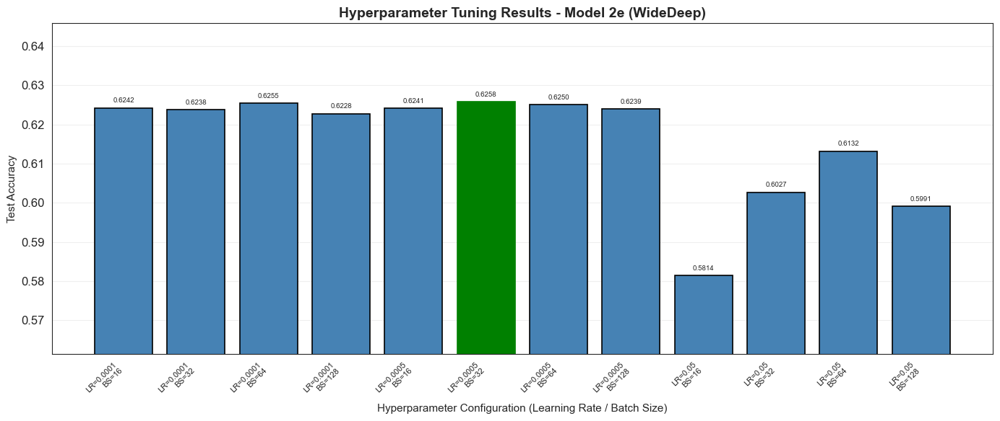

In [293]:
best_model_config = next(r['config'] for r in all_results if r['config']['name'] == best_model['Model'])

print("\n" + "=" * 70)
print("BEST MODEL SELECTED FOR HYPERPARAMETER TUNING")
print("=" * 70)
print(f"  Model: {best_model['Model']}")
print(f"  Architecture: {best_model['Architecture']}")
print(f"  Configuration: {best_model['Activation']}/{best_model['Optimizer']}/LR={best_model['LR']}")
print(f"  Test Accuracy: {best_model['Test Acc']:.4f}")

# Define hyperparameter grid for fine-tuning
hp_grid = {
    'learning_rate': [0.0001,0.0005, 0.05],
    'batch_size': [16,32,64,128]
}

# Calculate total combinations
from itertools import product
hp_combinations = list(product(hp_grid['learning_rate'], hp_grid['batch_size']))

print("\n" + "=" * 70)
print("PHASE 2: HYPERPARAMETER TUNING (BEST MODEL)")
print("=" * 70)
print(f"Tuning Model: {best_model['Model']} ({best_model['Architecture']})")
print(f"Base Configuration: {best_model['Activation']}/{best_model['Optimizer']}")
print(f"\nHyperparameter Grid:")
print(f"  Learning Rates: {hp_grid['learning_rate']}")
print(f"  Batch Sizes: {hp_grid['batch_size']}")
print(f"  Total tuning runs: {len(hp_combinations)}")

# Run hyperparameter tuning for the best model
hp_tuning_results = []

print(f"\n{'='*70}")
print(f"Tuning {best_model['Architecture']} Architecture (Model {best_model['Model']})")
print(f"{'='*70}")

for lr, bs in hp_combinations:
    # Build model with new hyperparameters (keep original activation and optimizer)
    model = build_ann_model(
        architecture=best_model_config['arch'],
        dropout_rate=0.0,
        l2_lambda=0.0,
        input_dim=X_train.shape[1],
        optimizer=best_model_config['optimizer'],
        learning_rate=lr,
        activation=best_model_config['activation']
    )
    
    # Create descriptive name
    hp_name = f"{best_model['Model']}_lr{lr}_bs{bs}"
    
    # Train and evaluate
    result = train_and_evaluate_model(
        model=model,
        model_name=hp_name,
        X_train=X_train,
        y_train=y_train,
        X_val=X_val,
        y_val=y_val,
        X_test=X_test,
        y_test=y_test,
        use_early_stopping=True,
        epochs=50,
        batch_size=bs
    )
    
    # Store additional info
    result['architecture'] = best_model['Architecture']
    result['base_model'] = best_model['Model']
    result['learning_rate'] = lr
    result['batch_size'] = bs
    hp_tuning_results.append(result)

print("\n" + "=" * 70)
print("PHASE 2 HYPERPARAMETER TUNING COMPLETE")
print("=" * 70)

# Create comparison DataFrame for hyperparameter tuning results
hp_comparison_data = []
for result in hp_tuning_results:
    hp_comparison_data.append({
        'Architecture': result['architecture'],
        'Base Model': result['base_model'],
        'Learning Rate': result['learning_rate'],
        'Batch Size': result['batch_size'],
        'Train Acc': result['train_accuracy'],
        'Val Acc': result['val_accuracy'],
        'Test Acc': result['test_accuracy'],
        'ROC-AUC': result['roc_auc'],
        'Overfitting': result['overfitting'],
        'Epochs': result['epochs_trained']
    })

hp_comparison_df = pd.DataFrame(hp_comparison_data)

print("\n" + "=" * 70)
print("PHASE 2 HYPERPARAMETER TUNING RESULTS")
print("=" * 70)
print(hp_comparison_df.to_string(index=False))

# Find overall best model from hyperparameter tuning
overall_best_idx = hp_comparison_df['Test Acc'].idxmax()
overall_best = hp_comparison_df.loc[overall_best_idx]

print("\n" + "=" * 70)
print("FINAL BEST MODEL (AFTER HYPERPARAMETER TUNING)")
print("=" * 70)
print(f"Architecture: {overall_best['Architecture']}")
print(f"Base Model: {overall_best['Base Model']}")
print(f"Tuned Learning Rate: {overall_best['Learning Rate']}")
print(f"Tuned Batch Size: {overall_best['Batch Size']}")
print(f"Test Accuracy: {overall_best['Test Acc']:.4f}")
print(f"ROC-AUC: {overall_best['ROC-AUC']:.4f}")
print(f"Overfitting: {overall_best['Overfitting']}")

# Visualize hyperparameter tuning results
fig, ax = plt.subplots(figsize=(14, 6))

# Create labels for x-axis
labels = [f"LR={row['Learning Rate']}\nBS={row['Batch Size']}" 
          for _, row in hp_comparison_df.iterrows()]

x = np.arange(len(labels))
test_accs = hp_comparison_df['Test Acc'].values

bars = ax.bar(x, test_accs, color='steelblue', edgecolor='black', linewidth=1.2)

# Highlight best
best_local_idx = np.argmax(test_accs)
bars[best_local_idx].set_color('green')

ax.set_title(f'Hyperparameter Tuning Results - Model {best_model["Model"]} ({best_model["Architecture"]})', 
             fontsize=14, fontweight='bold')
ax.set_xlabel('Hyperparameter Configuration (Learning Rate / Batch Size)', fontsize=11)
ax.set_ylabel('Test Accuracy', fontsize=11)
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=8, rotation=45, ha='right')
ax.set_ylim([min(hp_comparison_df['Test Acc']) - 0.02, max(hp_comparison_df['Test Acc']) + 0.02])
ax.grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, bar in enumerate(bars):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001, 
            f'{test_accs[i]:.4f}', ha='center', va='bottom', fontsize=7)

plt.tight_layout()
plt.savefig("ann_hyperparameter_tuning_results.png", dpi=300)
plt.show()

### 10.1.7 Learning Curves Visualization

Learning curves plot training and validation loss/accuracy over epochs, providing critical insights into model behavior. Loss curves show whether the model is learning (decreasing loss) and whether overfitting is occurring (validation loss plateaus or increases while training loss continues decreasing). Accuracy curves show the same patterns from a different perspective. These visualizations are generated for all 24 Phase 1 models in a grid layout, enabling side-by-side comparison. The curves help identify models that converge quickly, models that overfit, and models that underfit (both curves plateau at low accuracy).

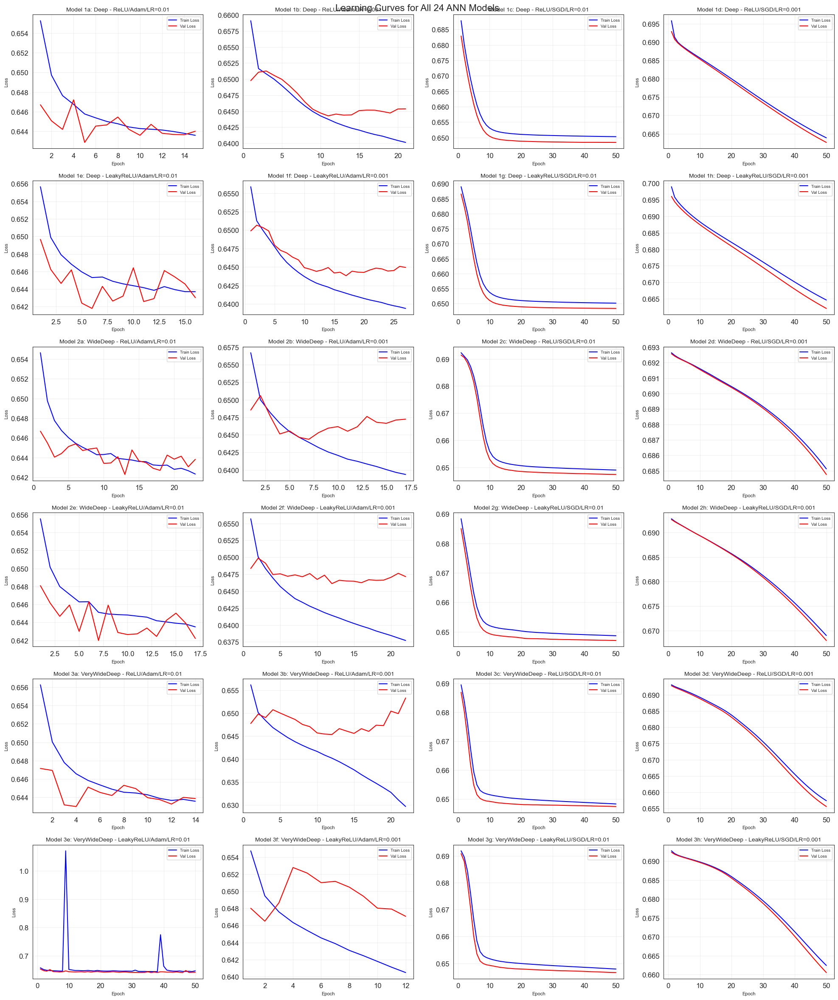

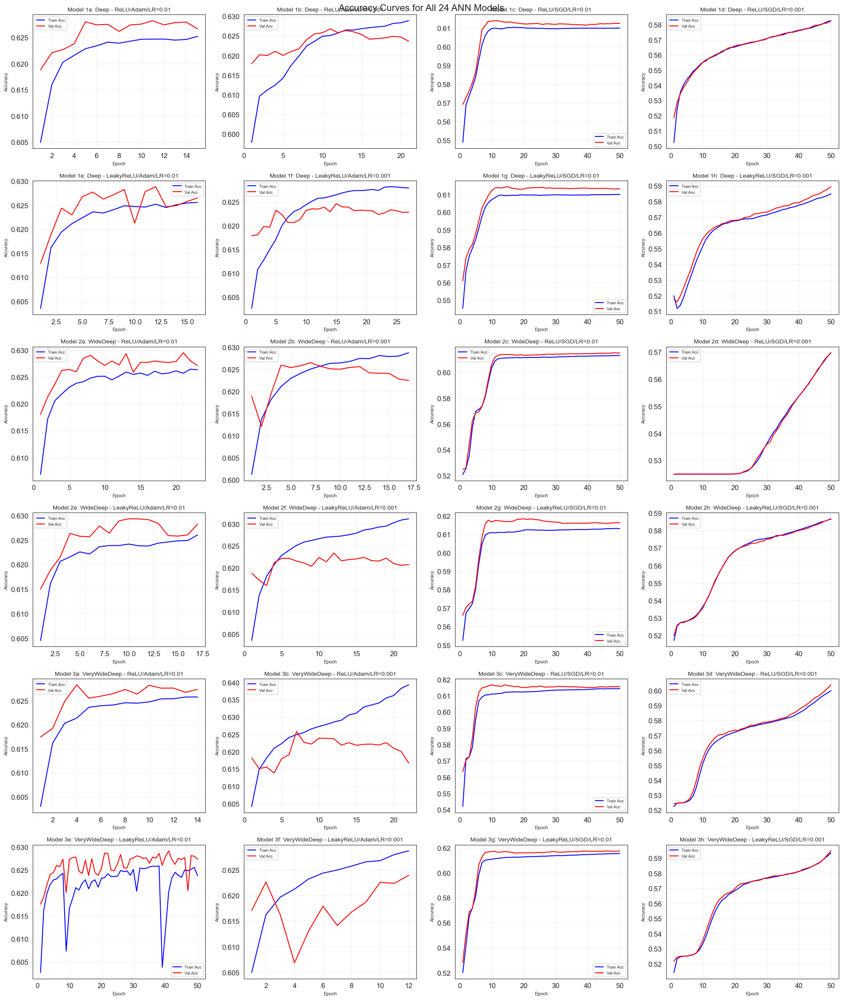

In [294]:
# Plot learning curves for all models (dynamically sized grid)
n_models = len(all_results)
n_cols = 4
n_rows = (n_models + n_cols - 1) // n_cols  # Ceiling division

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
fig.suptitle(f'Learning Curves for All {n_models} ANN Models', fontsize=16)

# Flatten axes for easier indexing (handles both 1D and 2D cases)
axes_flat = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes

for idx, result in enumerate(all_results):
    ax = axes_flat[idx]
    
    # Plot training and validation loss
    epochs = range(1, len(result['history'].history['loss']) + 1)
    ax.plot(epochs, result['history'].history['loss'], 'b-', label='Train Loss', linewidth=1.5)
    ax.plot(epochs, result['history'].history['val_loss'], 'r-', label='Val Loss', linewidth=1.5)
    
    ax.set_title(f"Model {result['config']['name']}: {result['config']['desc']}", fontsize=10)
    ax.set_xlabel('Epoch', fontsize=8)
    ax.set_ylabel('Loss', fontsize=8)
    ax.legend(fontsize=7)
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(n_models, n_rows * n_cols):
    axes_flat[idx].set_visible(False)

plt.tight_layout()
plt.savefig("ann_learning_curves_all_models.png", dpi=300)
plt.show()

# Plot accuracy curves (dynamically sized grid)
n_models = len(all_results)
n_cols = 4
n_rows = (n_models + n_cols - 1) // n_cols  # Ceiling division

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
fig.suptitle(f'Accuracy Curves for All {n_models} ANN Models', fontsize=16)

# Flatten axes for easier indexing
axes_flat = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes

for idx, result in enumerate(all_results):
    ax = axes_flat[idx]
    
    # Plot training and validation accuracy
    epochs = range(1, len(result['history'].history['accuracy']) + 1)
    ax.plot(epochs, result['history'].history['accuracy'], 'b-', label='Train Acc', linewidth=1.5)
    ax.plot(epochs, result['history'].history['val_accuracy'], 'r-', label='Val Acc', linewidth=1.5)
    
    ax.set_title(f"Model {result['config']['name']}: {result['config']['desc']}", fontsize=10)
    ax.set_xlabel('Epoch', fontsize=8)
    ax.set_ylabel('Accuracy', fontsize=8)
    ax.legend(fontsize=7)
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(n_models, n_rows * n_cols):
    axes_flat[idx].set_visible(False)

plt.tight_layout()
plt.savefig("ann_accuracy_curves_all_models.png", dpi=300)
plt.show()

### 10.1.8 Activation and Optimizer Effect Analysis

This section creates specialized visualizations to understand the independent effects of activation functions and optimizers. Bar charts are generated for each architecture, showing test accuracy for all combinations of activation/optimizer/learning rate. Color coding distinguishes ReLU (red) from LeakyReLU (teal), while hatching patterns distinguish Adam from SGD. The best configuration within each architecture is highlighted with a gold border.

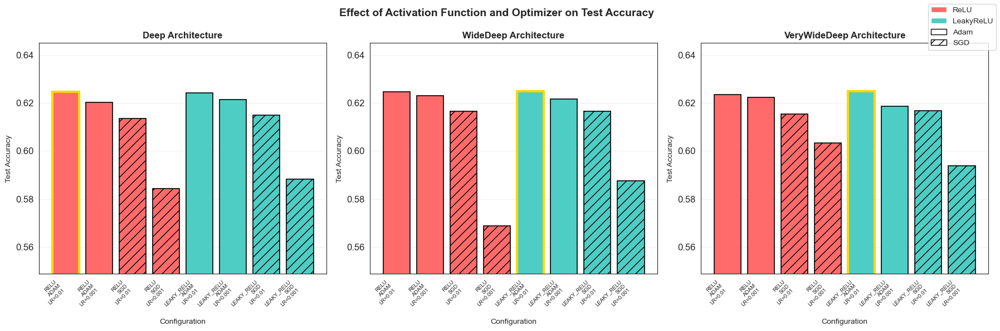

In [295]:
# Bar chart comparing activation functions and optimizers by architecture
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

architectures = ['Deep', 'WideDeep', 'VeryWideDeep']
colors = {'RELU': '#ff6b6b', 'LEAKY_RELU': '#4ecdc4'}
hatches = {'ADAM': '', 'SGD': '//'}

for idx, arch in enumerate(architectures):
    arch_data = comparison_df[comparison_df['Architecture'] == arch]
    
    # Group by Activation and Optimizer
    x_labels = []
    test_accs = []
    bar_colors = []
    bar_hatches = []
    
    for _, row in arch_data.iterrows():
        x_labels.append(f"{row['Activation']}\n{row['Optimizer']}\nLR={row['LR']}")
        test_accs.append(row['Test Acc'])
        bar_colors.append(colors.get(row['Activation'], '#45b7d1'))
        bar_hatches.append(hatches.get(row['Optimizer'], ''))
    
    x = np.arange(len(x_labels))
    bars = axes[idx].bar(x, test_accs, color=bar_colors, edgecolor='black', linewidth=1.2)
    
    # Apply hatches
    for bar, hatch in zip(bars, bar_hatches):
        bar.set_hatch(hatch)
    
    # Highlight best in this architecture
    best_local_idx = np.argmax(test_accs)
    bars[best_local_idx].set_edgecolor('gold')
    bars[best_local_idx].set_linewidth(3)
    
    axes[idx].set_title(f'{arch} Architecture', fontsize=12, fontweight='bold')
    axes[idx].set_xlabel('Configuration', fontsize=10)
    axes[idx].set_ylabel('Test Accuracy', fontsize=10)
    axes[idx].set_xticks(x)
    axes[idx].set_xticklabels(x_labels, fontsize=7, rotation=45, ha='right')
    axes[idx].set_ylim([min(comparison_df['Test Acc']) - 0.02, max(comparison_df['Test Acc']) + 0.02])
    axes[idx].grid(axis='y', alpha=0.3)

# Add legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='#ff6b6b', label='ReLU'),
    Patch(facecolor='#4ecdc4', label='LeakyReLU'),
    Patch(facecolor='white', edgecolor='black', hatch='', label='Adam'),
    Patch(facecolor='white', edgecolor='black', hatch='//', label='SGD')
]
fig.legend(handles=legend_elements, loc='upper right', fontsize=10)

plt.suptitle('Effect of Activation Function and Optimizer on Test Accuracy', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("ann_activation_optimizer_comparison.png", dpi=300)
plt.show()

### 10.1.9 Confusion Matrix for Best Model

The confusion matrix provides detailed performance breakdown for the best model, showing true positives, true negatives, false positives, and false negatives. A classification report is also generated, providing precision, recall, and F1-score for each class.

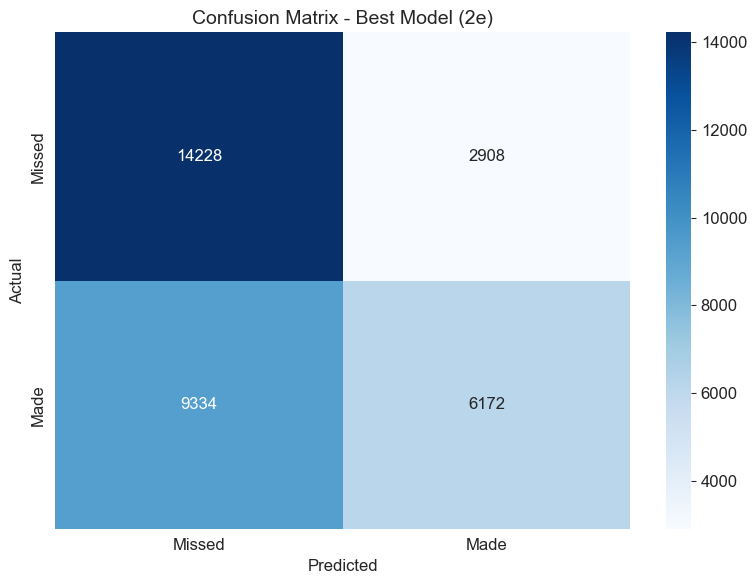


Classification Report for Best Model:
--------------------------------------------------
              precision    recall  f1-score   support

      Missed       0.60      0.83      0.70     17136
        Made       0.68      0.40      0.50     15506

    accuracy                           0.62     32642
   macro avg       0.64      0.61      0.60     32642
weighted avg       0.64      0.62      0.61     32642



In [296]:
# Get the best model's predictions
best_result = all_results[best_idx]

# Confusion Matrix
cm = confusion_matrix(y_test, best_result['y_pred'])

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Missed', 'Made'], 
            yticklabels=['Missed', 'Made'])
plt.title(f"Confusion Matrix - Best Model ({best_model['Model']})", fontsize=14)
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('Actual', fontsize=12)
plt.tight_layout()
plt.savefig("ann_best_model_confusion_matrix.png", dpi=300)
plt.show()

# Classification Report
print("\nClassification Report for Best Model:")
print("-" * 50)
print(classification_report(y_test, best_result['y_pred'], target_names=['Missed', 'Made']))

### 10.1.10 ROC Curve Comparison

ROC curves plot True Positive Rate (sensitivity) against False Positive Rate (1-specificity) at various classification thresholds, providing a threshold-independent measure of model discrimination ability. The area under the ROC curve (AUC) summarizes overall performance. This visualization plots ROC curves for all 24 models on the same axes, enabling direct comparison. Models with curves closer to the top-left corner (higher AUC) have better discrimination. A diagonal line represents random guessing (AUC=0.5).

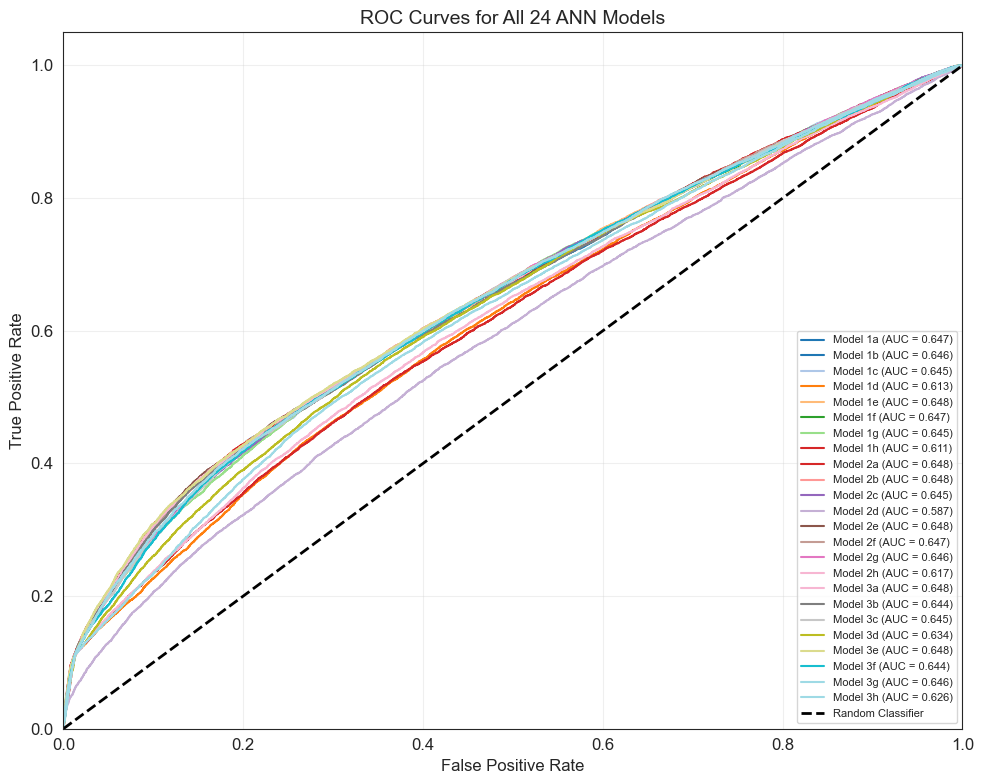

In [297]:
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 8))

# Plot ROC curve for each model (dynamic colors based on number of models)
n_models = len(all_results)
colors = plt.cm.tab20(np.linspace(0, 1, n_models))

for idx, result in enumerate(all_results):
    fpr, tpr, _ = roc_curve(y_test, result['y_pred_proba'])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=colors[idx], lw=1.5, 
             label=f"Model {result['config']['name']} (AUC = {roc_auc:.3f})")

# Diagonal line (random classifier)
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title(f'ROC Curves for All {n_models} ANN Models', fontsize=14)
plt.legend(loc='lower right', fontsize=8)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("ann_roc_curves_all_models.png", dpi=300)
plt.show()

### 10.1.11 Final Summary and Conclusions

This section consolidates all findings into a comprehensive summary, including data preprocessing details, architectures tested, hyperparameter ranges explored, training configuration, Phase 1 and Phase 2 results, and key findings. Statistical summaries are provided (e.g., average accuracy by activation function, optimizer, learning rate) to identify general patterns. The summary serves as documentation and enables quick understanding of the entire development process.

In [298]:
print("=" * 70)
print("ANN DEVELOPMENT SUMMARY")
print("=" * 70)

print("\n1. DATA PREPROCESSING:")
print(f"   - Features: {X.shape[1]} (after VIF and correlation filtering)")
print(f"   - Normalization: Min-Max scaling to [0, 1]")
print(f"   - Split: Train ({len(X_train)}), Validation ({len(X_val)}), Test ({len(X_test)})")

print("\n2. MODEL ARCHITECTURES TESTED:")
print("   - Deep:         30 - 64 - 32 - 16 - 1")
print("   - WideDeep:     30 - 128 - 64 - 32 - 16 - 1")
print("   - VeryWideDeep: 30 - 256 - 128 - 64 - 32 - 16 - 1")

print("\n3. HYPERPARAMETERS COMPARED (Phase 1):")
print("   - Activation Functions: ReLU, LeakyReLU")
print("   - Optimizers: Adam, SGD")
print("   - Learning Rates: 0.01 (high), 0.001 (low)")

print("\n4. TRAINING CONFIGURATION:")
print("   - Loss: Binary Cross-Entropy")
print("   - Batch Size: 256 (Phase 1), tuned in Phase 2")
print("   - Early Stopping: patience=10, restore_best_weights=True")
print("   - Max Epochs: 50 (with Early Stopping, patience=10)")

print("\n5. PHASE 1 RESULTS SUMMARY (24 Models):")
print(comparison_df[['Model', 'Architecture', 'Activation', 'Optimizer', 'LR', 'Test Acc', 'ROC-AUC']].to_string(index=False))

print(f"\n6. BEST MODEL FROM PHASE 1:")
print(f"   - Model {best_model['Model']}: {best_model['Architecture']}")
print(f"   - Configuration: {best_model['Activation']}/{best_model['Optimizer']}/LR={best_model['LR']}")
print(f"   - Test Accuracy: {best_model['Test Acc']:.4f}")
print(f"   - ROC-AUC: {best_model['ROC-AUC']:.4f}")

# Analyze activation function effectiveness
print("\n7. KEY FINDINGS:")
relu_accs = comparison_df[comparison_df['Activation'] == 'RELU']['Test Acc'].mean()
leaky_accs = comparison_df[comparison_df['Activation'] == 'LEAKY_RELU']['Test Acc'].mean()
adam_accs = comparison_df[comparison_df['Optimizer'] == 'ADAM']['Test Acc'].mean()
sgd_accs = comparison_df[comparison_df['Optimizer'] == 'SGD']['Test Acc'].mean()
lr_high_accs = comparison_df[comparison_df['LR'] == 0.01]['Test Acc'].mean()
lr_low_accs = comparison_df[comparison_df['LR'] == 0.001]['Test Acc'].mean()

print(f"   - Avg Accuracy (ReLU):       {relu_accs:.4f}")
print(f"   - Avg Accuracy (LeakyReLU):  {leaky_accs:.4f}")
print(f"   - Avg Accuracy (Adam):       {adam_accs:.4f}")
print(f"   - Avg Accuracy (SGD):        {sgd_accs:.4f}")
print(f"   - Avg Accuracy (LR=0.01):    {lr_high_accs:.4f}")
print(f"   - Avg Accuracy (LR=0.001):   {lr_low_accs:.4f}")

# Overfitting analysis
overfit_count = (comparison_df['Overfitting'] == 'Yes').sum()
print(f"\n   - Models showing overfitting: {overfit_count}/{len(all_results)}")

print("\n8. PHASE 2 HYPERPARAMETER TUNING (Best Model):")
print(f"   - Batch Sizes Tested: {hp_grid['batch_size']}")
print(f"   - Learning Rates Tested: {hp_grid['learning_rate']}")
print(f"   - Best Configuration: LR={overall_best['Learning Rate']}, Batch={overall_best['Batch Size']}")
print(f"   - Final Test Accuracy: {overall_best['Test Acc']:.4f}")

print("\n" + "=" * 70)

ANN DEVELOPMENT SUMMARY

1. DATA PREPROCESSING:
   - Features: 30 (after VIF and correlation filtering)
   - Normalization: Min-Max scaling to [0, 1]
   - Split: Train (152411), Validation (32554), Test (32642)

2. MODEL ARCHITECTURES TESTED:
   - Deep:         30 - 64 - 32 - 16 - 1
   - WideDeep:     30 - 128 - 64 - 32 - 16 - 1
   - VeryWideDeep: 30 - 256 - 128 - 64 - 32 - 16 - 1

3. HYPERPARAMETERS COMPARED (Phase 1):
   - Activation Functions: ReLU, LeakyReLU
   - Optimizers: Adam, SGD
   - Learning Rates: 0.01 (high), 0.001 (low)

4. TRAINING CONFIGURATION:
   - Loss: Binary Cross-Entropy
   - Batch Size: 256 (Phase 1), tuned in Phase 2
   - Early Stopping: patience=10, restore_best_weights=True
   - Max Epochs: 50 (with Early Stopping, patience=10)

5. PHASE 1 RESULTS SUMMARY (24 Models):
Model Architecture Activation Optimizer    LR  Test Acc  ROC-AUC
   1a         Deep       RELU      ADAM 0.010  0.624563 0.647156
   1b         Deep       RELU      ADAM 0.001  0.620336 0.645723


## 10.2 Logistic Regression (Kayra)

### Why Logistic Regression Was Chosen as a Baseline Model

We predict a binary outcome (**Shot_Made: 1/0**). Logistic Regression is an appropriate baseline because it:

- Fits the problem formulation directly (binary classification).
- Is fast and stable on large datasets.
- Produces **probability estimates** (`predict_proba`) which are useful for threshold tuning and probability-based interpretation.
- Is easy to explain to a non-technical audience and provides a strong reference point for more advanced models.

In this project, Logistic Regression acts as a transparent benchmark: any more complex model should justify its added complexity by improving results on the held-out test set.

### 10.2.1 Data Preparation and Stratified Train–Test Split

We build the model input as:

- `X`: the feature matrix from `X_vif_clean` (a pre-cleaned feature set).
- `y`: the target vector extracted from the dataframe that contains the column `Shot_Made`.

A critical risk is **feature–label mismatch**: if `X` and the dataframe holding `Shot_Made` do not share the same index ordering (e.g., due to earlier filtering, merges, or dropping rows), the model may learn from incorrect labels.  
To prevent this, `y` is aligned explicitly to the index of `X` (e.g., `df_src.loc[X.index, "Shot_Made"]`).

We also enforce:
- `y` is integer-coded (0/1).
- there are no missing labels after alignment.
- features are numeric (non-numeric columns should be handled before modeling).

We use stratified splits so that each subset preserves the overall class distribution of `Shot_Made`.

- **Test set**: held out completely until the final evaluation.
- **Validation set**: used for decisions like **threshold tuning** (and optionally model sanity checks).
- **Training set**: used for fitting the model and for cross-validation during hyperparameter tuning.

This design prevents "test leakage":
- Hyperparameters are selected using cross-validation on training data.
- Threshold is chosen only using validation data.
- The test set is used once for final reporting.

In [136]:
# =========================
# BLOCK 1 — Data + Split (Train/Val/Test = 64/16/20)
# =========================
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, average_precision_score

RANDOM_STATE = 42

# ---- X from VIF-cleaned matrix
X = X_vif_clean.copy()

# ---- y from df_final or df_ml_final
if "Shot_Made" in df_final.columns:
    df_src = df_final
elif "Shot_Made" in df_ml_final.columns:
    df_src = df_ml_final
else:
    raise KeyError("Shot_Made column not found")

# IMPORTANT: align y to X index (prevents mismatched labels)
y = df_src.loc[X.index, "Shot_Made"].copy()
y = pd.Series(y).astype(int)

# ---- sanity checks
if y.isna().any():
    raise ValueError("y has NaNs after aligning to X. X and df_src indices don't match.")

non_numeric = X.select_dtypes(exclude=[np.number]).columns.tolist()
if non_numeric:
    raise TypeError(f"Non-numeric columns in X. Encode first. Problem cols: {non_numeric}")

print("X shape:", X.shape, "| Positive rate:", round(y.mean(), 4))

# ---- Train/Val/Test split: 20% test, then 20% of remaining as val (=> 16% total)
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.20, stratify=y, random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.20, stratify=y_temp, random_state=RANDOM_STATE
)

print("Shapes:", X_train.shape, X_val.shape, X_test.shape)
print("Pos rates:", round(y_train.mean(),4), round(y_val.mean(),4), round(y_test.mean(),4))

X shape: (217607, 30) | Positive rate: 0.475
Shapes: (139268, 30) (34817, 30) (43522, 30)
Pos rates: 0.475 0.475 0.475


### 10.2.2 Baseline Logistic Regression Model (Not Tuned)
We place preprocessing and the estimator into a single `Pipeline` to ensure correctness and fairness.

Pipeline steps:
1) **Imputation (median)**  
   Handles missing values without dropping rows. Median is robust to outliers.

2) **Standard scaling**  
   Logistic Regression with regularization is sensitive to feature scale. Scaling ensures that coefficients and regularization behave consistently across features.

3) **Logistic Regression model**  
   Trained after preprocessing.

A pipeline also prevents leakage: scaling/imputation parameters are learned inside each CV fold instead of using information from the full dataset.

We first train a baseline Logistic Regression with a fixed configuration to establish a reference point.

Purpose of the baseline:
- confirm the pipeline runs end-to-end,
- get a first estimate of predictive power,
- provide a benchmark to compare against tuning and other models.

If `class_weight="balanced"` is used, it changes the optimization to compensate for class imbalance by penalizing mistakes on the minority class more strongly.

In [143]:
# ==========================================
# BLOCK 2A — Logistic Regression (NOT TUNED)
# ==========================================
baseline_model = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("logreg", LogisticRegression(
        max_iter=5000,
        class_weight="balanced",
        solver="liblinear",
        penalty="l2",
        C=1.0,
        random_state=42
    ))
])

baseline_model.fit(X_train, y_train)

# ---- Validation eval (baseline)
val_proba = baseline_model.predict_proba(X_val)[:, 1]
val_pred  = (val_proba >= 0.5).astype(int)

val_metrics = {
    "val_acc": accuracy_score(y_val, val_pred),
    "val_f1": f1_score(y_val, val_pred),
    "val_roc_auc": roc_auc_score(y_val, val_proba),
    "val_ap": average_precision_score(y_val, val_proba),
}
print("Baseline VAL metrics:", {k: round(v, 4) for k, v in val_metrics.items()})

# ---- Test eval (baseline)
test_proba = baseline_model.predict_proba(X_test)[:, 1]
test_pred  = (test_proba >= 0.5).astype(int)

test_metrics = {
    "test_acc": accuracy_score(y_test, test_pred),
    "test_f1": f1_score(y_test, test_pred),
    "test_roc_auc": roc_auc_score(y_test, test_proba),
    "test_ap": average_precision_score(y_test, test_proba),
}
baseline_val_metrics  = val_metrics.copy()
baseline_test_metrics = test_metrics.copy()
print("Baseline TEST metrics:", {k: round(v, 4) for k, v in test_metrics.items()})

Baseline VAL metrics: {'val_acc': 0.6055, 'val_f1': 0.566, 'val_roc_auc': 0.6444, 'val_ap': 0.6514}
Baseline TEST metrics: {'test_acc': 0.607, 'test_f1': 0.5694, 'test_roc_auc': 0.6476, 'test_ap': 0.6538}


### 10.2.3 Hyperparameter-Tuned Logistic Regression Model

We tune the model using `GridSearchCV` with `StratifiedKFold` cross-validation.

Typical tuned parameters:
- `C`: controls regularization strength  
  smaller `C` = stronger regularization (simpler model),  
  larger `C` = weaker regularization (more flexible model).
- optionally `penalty` (L1 vs L2) with compatible solvers.

Why cross-validation:
- We evaluate each hyperparameter setting across multiple folds.
- This reduces sensitivity to a single split and improves generalization.

Model selection metric:
- If you use `scoring="roc_auc"`, the chosen hyperparameters optimize ranking quality (threshold-independent).
- This is useful because threshold choice is handled separately later (on validation).

In [144]:
# ======================================
# BLOCK 2B — Logistic Regression (TUNED)
# ======================================
pipe = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("logreg", LogisticRegression(
        max_iter=5000,
        class_weight="balanced",
        solver="liblinear",
        random_state=42
    ))
])

cv5 = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

param_grid = {
    "logreg__penalty": ["l1", "l2"],
    "logreg__C": [0.01, 0.1, 1.0, 10.0, 50.0],
}

grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="roc_auc",
    cv=cv5,
    n_jobs=-1,
    verbose=1,
    refit=True
)

grid.fit(X_train, y_train)

tuned_model = grid.best_estimator_
print("Best params:", grid.best_params_)
print("Best CV ROC_AUC:", round(grid.best_score_, 4))

# ---- Validation eval (tuned)
val_proba = tuned_model.predict_proba(X_val)[:, 1]
val_pred  = (val_proba >= 0.5).astype(int)

val_metrics = {
    "val_acc": accuracy_score(y_val, val_pred),
    "val_f1": f1_score(y_val, val_pred),
    "val_roc_auc": roc_auc_score(y_val, val_proba),
    "val_ap": average_precision_score(y_val, val_proba),
}
print("Tuned VAL metrics:", {k: round(v, 4) for k, v in val_metrics.items()})

# ---- Test eval (tuned, threshold=0.5)
test_proba = tuned_model.predict_proba(X_test)[:, 1]
test_pred  = (test_proba >= 0.5).astype(int)

test_metrics = {
    "test_acc": accuracy_score(y_test, test_pred),
    "test_f1": f1_score(y_test, test_pred),
    "test_roc_auc": roc_auc_score(y_test, test_proba),
    "test_ap": average_precision_score(y_test, test_proba),
}
tuned_val_metrics  = val_metrics.copy()
tuned_test_metrics = test_metrics.copy()
print("Tuned TEST metrics:", {k: round(v, 4) for k, v in test_metrics.items()})

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best params: {'logreg__C': 0.01, 'logreg__penalty': 'l1'}
Best CV ROC_AUC: 0.6451
Tuned VAL metrics: {'val_acc': 0.6055, 'val_f1': 0.5663, 'val_roc_auc': 0.6449, 'val_ap': 0.6527}
Tuned TEST metrics: {'test_acc': 0.6067, 'test_f1': 0.5693, 'test_roc_auc': 0.6481, 'test_ap': 0.6548}


### 10.2.4 Model Evaluation and Baseline vs Tuned Comparison

After tuning, we evaluate:

- **Predicted labels** from `predict()` (uses default threshold 0.5 for probabilities).
- **Score/probabilities** from `predict_proba()` for ranking-based metrics.

We report:
- global summary metrics (already defined elsewhere in the notebook),
- classification report (per-class precision/recall summary),
- confusion matrix (counts of TP/FP/TN/FN).

At this stage we keep the **default threshold**, so we can isolate the effect of hyperparameter tuning before introducing threshold tuning.

#### Why choose these metrics?
Accuracy and F1-score were used to evaluate threshold-based classification performance, while ROC-AUC and Average Precision were used to assess probability estimation and ranking quality. ROC-AUC was chosen as the primary tuning metric due to its robustness to class imbalance and its ability to measure how well the model distinguishes between made and missed shots across all thresholds. Average Precision complements ROC-AUC by focusing on the positive class and the quality of high-confidence predictions.

In [145]:
# ==========================================
# BLOCK 3 — Side-by-side comparison (baseline vs tuned)
# ==========================================
comparison = pd.DataFrame(
    [baseline_test_metrics, tuned_test_metrics],
    index=["LogReg_Baseline", "LogReg_Tuned"]
).round(4)

comparison

,test_acc,test_f1,test_roc_auc,test_ap
LogReg_Baseline,0.6070,0.5694,0.6476,0.6538
LogReg_Tuned,0.6067,0.5693,0.6481,0.6548


#### 10.2.5 Threshold tuning (validation only)
The default threshold (0.5) is not guaranteed to be optimal for our objective.

We tune the threshold using the **validation set**:
- compute validation probabilities,
- evaluate a range of thresholds,
- select the threshold that maximizes the chosen objective (commonly F1).

Important: threshold selection is done only on validation to avoid optimistic results.  
After selecting the threshold, the final model is typically refit on **Train + Validation** to maximize training signal before evaluating once on the test set.

In [146]:
from sklearn.metrics import precision_recall_curve

# 1) pick threshold on VAL (maximize F1)
val_proba = tuned_model.predict_proba(X_val)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_val, val_proba)
f1_vals = 2 * precision * recall / (precision + recall + 1e-12)

thr = np.r_[thresholds, thresholds[-1]]
best_i = np.argmax(f1_vals)
best_thr = float(thr[best_i])

print(f"Best threshold on VAL by F1: {best_thr:.4f}")
print(f"Best F1 on VAL at that threshold: {f1_vals[best_i]:.4f}")

# 2) refit on TRAIN+VAL (no test leakage)
X_trainval = pd.concat([X_train, X_val], axis=0)
y_trainval = pd.concat([y_train, y_val], axis=0)
tuned_model.fit(X_trainval, y_trainval)

# 3) final TEST evaluation at tuned threshold
test_proba = tuned_model.predict_proba(X_test)[:, 1]
test_pred_thr = (test_proba >= best_thr).astype(int)

print("TEST (tuned threshold) acc:", round(accuracy_score(y_test, test_pred_thr), 4))
print("TEST (tuned threshold) f1:",  round(f1_score(y_test, test_pred_thr), 4))
print("TEST ROC-AUC:", round(roc_auc_score(y_test, test_proba), 4))
print("TEST PR-AUC:",  round(average_precision_score(y_test, test_proba), 4))


Best threshold on VAL by F1: 0.3235
Best F1 on VAL at that threshold: 0.6457
TEST (tuned threshold) acc: 0.4787
TEST (tuned threshold) f1: 0.6453
TEST ROC-AUC: 0.6483
TEST PR-AUC: 0.6554


## 10.3 Linear SVC (Kayra)

#### Why we chose Linear SVC (LinearSVC)

Linear SVC is a competitive model for binary classification when the feature set is high-dimensional (e.g., after one-hot encoding) and when a linear decision boundary is a reasonable approximation. It learns a maximum-margin separator with regularization, which often generalizes well and is computationally efficient compared to kernel SVMs. In this project, it provides a solid comparison point to Logistic Regression, while still allowing hyperparameter tuning and interpretability through linear coefficients.

#### 10.3.1 Data selection, target extraction, safe index alignment, and train/test split

Same as in Logistic Regression, we build:
- `X` from `X_vif_clean`
- `y` from the dataframe containing `Shot_Made`

We must ensure `y` is aligned to `X.index`. Any mismatch can silently invalidate the results.  
After alignment, we enforce integer encoding of `y` and remove any rows where the label is missing (and drop the corresponding rows from `X`).

We keep the same stratified split logic as in Logistic Regression to make comparisons fair.

- Test is held out for final reporting only.
- Validation is reserved for threshold tuning and sanity checks.
- Training is used for fitting and GridSearchCV.

Using the same split strategy across models improves comparability of results.

In [147]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import (
    accuracy_score, f1_score, roc_auc_score, average_precision_score,
    confusion_matrix, classification_report
)

# ---- X from VIF-cleaned matrix
X = X_vif_clean.copy()

# ---- y from df_final or df_ml_final (friends' logic)
if "Shot_Made" in df_final.columns:
    y = df_final["Shot_Made"].copy()
elif "Shot_Made" in df_ml_final.columns:
    y = df_ml_final["Shot_Made"].copy()
else:
    raise KeyError("Shot_Made column not found")

y = pd.Series(y)

# ---- Safer alignment: reindex + drop rows where y is missing
y = y.reindex(X.index)
mask = y.notna()
X = X.loc[mask].copy()
y = y.loc[mask].astype(int)

if y.isna().any():
    raise ValueError("y has NaNs after alignment; check indices between X and df_final/df_ml_final.")

# ---- Split: train_full vs test (80/20)
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X, y,
    test_size=0.20,
    random_state=42,
    stratify=y
)

# ---- Split: train vs validation (64/16)
X_train, X_val, y_train, y_val = train_test_split(
    X_train_full, y_train_full,
    test_size=0.20,                # 0.20 of 0.80 => 0.16 total
    random_state=42,
    stratify=y_train_full
)

print("Train class ratio:", y_train.mean())
print("Val   class ratio:", y_val.mean())
print("Test  class ratio:", y_test.mean())
print("Shapes:", X_train.shape, X_val.shape, X_test.shape)

Train class ratio: 0.4750337478817819
Val   class ratio: 0.47502656748140276
Test  class ratio: 0.47502412572951613
Shapes: (139268, 30) (34817, 30) (43522, 30)


#### 10.3.2 Baseline LinearSVC + hyperparameter tuning with GridSearchCV + cross-validated multi-metric summary

This block trains two LinearSVC versions:

Baseline (untuned): A pipeline that imputes missing values, standardizes features (important for SVMs), and fits LinearSVC with default settings. This establishes a reference performance.

Tuned model (GridSearchCV): We tune the main regularization parameter C and optionally class_weight="balanced" to handle potential class imbalance. GridSearchCV uses StratifiedKFold (k=5) and optimizes ROC-AUC as the primary selection metric.

After selecting the best hyperparameters, we compute a cross-validated multi-metric summary on the training data and report mean ± standard deviation across folds. This provides uncertainty/robustness information rather than a single-point estimate.

In [148]:
from sklearn.svm import LinearSVC
from sklearn.model_selection import cross_validate

# ---- Baseline (untuned) LinearSVC (fit only on TRAIN)
baseline_linsvc = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("linsvc", LinearSVC(dual="auto", max_iter=5000, random_state=42))
])

baseline_linsvc.fit(X_train, y_train)

# ---- Tuned LinearSVC (GridSearch on TRAIN only)
pipe_linsvc = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("linsvc", LinearSVC(dual="auto", max_iter=5000, random_state=42))
])

param_grid_linsvc = {
    "linsvc__C": [0.01, 0.1, 1, 10],
    "linsvc__class_weight": [None, "balanced"]
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

grid_linsvc = GridSearchCV(
    estimator=pipe_linsvc,
    param_grid=param_grid_linsvc,
    scoring="roc_auc",
    cv=cv,
    n_jobs=-1,
    verbose=1
)

grid_linsvc.fit(X_train, y_train)

print("Best CV ROC-AUC (GridSearch scoring):", grid_linsvc.best_score_)
print("Best Params:", grid_linsvc.best_params_)

best_linsvc = grid_linsvc.best_estimator_

# ---- Uncertainty reporting: CV mean ± std across folds (on TRAIN, using best hyperparams)
scoring = {"acc": "accuracy", "f1": "f1", "roc": "roc_auc", "ap": "average_precision"}
cv_multi = cross_validate(best_linsvc, X_train, y_train, cv=cv, scoring=scoring, n_jobs=-1)

print("\nCV Multi-metric summary (mean ± std over folds) on TRAIN:")
print(f"Accuracy: {cv_multi['test_acc'].mean():.4f} ± {cv_multi['test_acc'].std():.4f}")
print(f"F1:       {cv_multi['test_f1'].mean():.4f} ± {cv_multi['test_f1'].std():.4f}")
print(f"ROC-AUC:  {cv_multi['test_roc'].mean():.4f} ± {cv_multi['test_roc'].std():.4f}")
print(f"PR-AUC:   {cv_multi['test_ap'].mean():.4f} ± {cv_multi['test_ap'].std():.4f}")


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best CV ROC-AUC (GridSearch scoring): 0.6446469696696593
Best Params: {'linsvc__C': 0.01, 'linsvc__class_weight': 'balanced'}

CV Multi-metric summary (mean ± std over folds) on TRAIN:
Accuracy: 0.6035 ± 0.0028
F1:       0.5645 ± 0.0037
ROC-AUC:  0.6446 ± 0.0036
PR-AUC:   0.6491 ± 0.0041


#### 10.3.3 Test evaluation, model comparison (baseline vs tuned), threshold tuning, and visuals

This block implements a clean evaluation procedure:

Validation evaluation (baseline vs tuned)
We evaluate both the baseline and tuned models on the validation set to compare how much tuning helps before touching the test set.

Threshold tuning on validation
We use the tuned model’s decision scores on the validation set to find a threshold that maximizes F1. This step is intentionally done on validation (not test) to avoid optimistic bias.

Final refit on Train + Validation
Once hyperparameters and threshold are chosen, we refit a final LinearSVC on the combined Train+Val data to maximize the training signal.

Final test evaluation
We evaluate the refit model once on the test set:

using the default threshold (standard classifier behavior), and

using the validation-chosen threshold (to show the practical impact of threshold selection).

Visuals on the test set
We generate standard plots (confusion matrix, ROC curve, PR curve) for the final model on the test data to communicate performance clearly.


===== Baseline LinearSVC (default threshold) =====
Accuracy: 0.6101
F1:       0.5434
ROC-AUC:  0.6446
PR-AUC:   0.6519

Classification report:
               precision    recall  f1-score   support

           0       0.61      0.72      0.66     18278
           1       0.61      0.49      0.54     16539

    accuracy                           0.61     34817
   macro avg       0.61      0.60      0.60     34817
weighted avg       0.61      0.61      0.60     34817

Confusion matrix:
 [[13163  5115]
 [ 8461  8078]]

===== Tuned LinearSVC (GridSearch) (default threshold) =====
Accuracy: 0.6055
F1:       0.5658
ROC-AUC:  0.6446
PR-AUC:   0.6519

Classification report:
               precision    recall  f1-score   support

           0       0.62      0.66      0.64     18278
           1       0.59      0.54      0.57     16539

    accuracy                           0.61     34817
   macro avg       0.60      0.60      0.60     34817
weighted avg       0.60      0.61      0.60     348

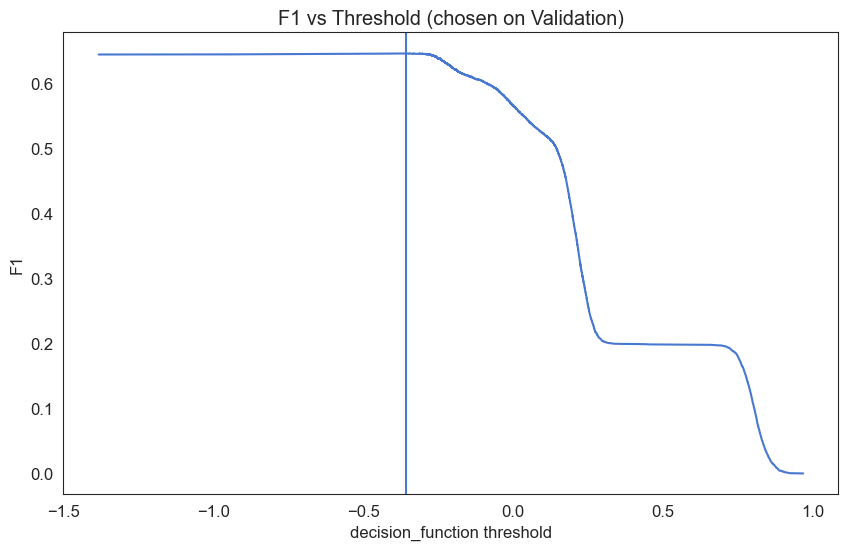


===== Final LinearSVC (fit on Train+Val) (default threshold) =====
Accuracy: 0.6065
F1:       0.5697
ROC-AUC:  0.6481
PR-AUC:   0.6550

Classification report:
               precision    recall  f1-score   support

           0       0.62      0.66      0.64     22848
           1       0.59      0.55      0.57     20674

    accuracy                           0.61     43522
   macro avg       0.61      0.60      0.60     43522
weighted avg       0.61      0.61      0.61     43522

Confusion matrix:
 [[15063  7785]
 [ 9339 11335]]

===== Final LinearSVC (fit on Train+Val) (threshold=-0.3573) =====
Accuracy: 0.4793
F1:       0.6454
Confusion matrix:
 [[  229 22619]
 [   45 20629]]


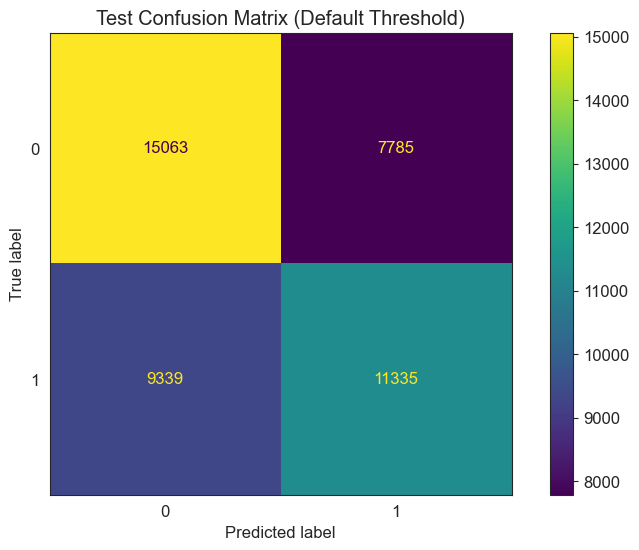

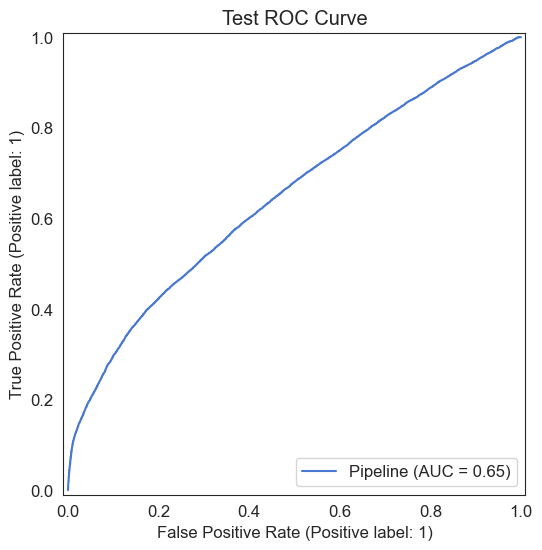

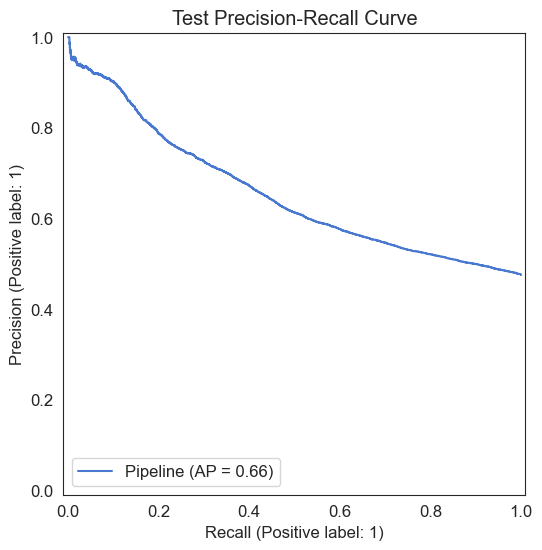

In [149]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import (
    accuracy_score, f1_score, roc_auc_score, average_precision_score,
    classification_report, confusion_matrix,
    ConfusionMatrixDisplay, RocCurveDisplay, PrecisionRecallDisplay,
    precision_recall_curve
)

def evaluate_default_threshold(model, X_eval, y_eval, label="Model"):
    y_pred = model.predict(X_eval)
    y_score = model.decision_function(X_eval)

    acc = accuracy_score(y_eval, y_pred)
    f1  = f1_score(y_eval, y_pred)
    roc = roc_auc_score(y_eval, y_score)
    ap  = average_precision_score(y_eval, y_score)

    print(f"\n===== {label} (default threshold) =====")
    print(f"Accuracy: {acc:.4f}")
    print(f"F1:       {f1:.4f}")
    print(f"ROC-AUC:  {roc:.4f}")
    print(f"PR-AUC:   {ap:.4f}\n")
    print("Classification report:\n", classification_report(y_eval, y_pred))
    print("Confusion matrix:\n", confusion_matrix(y_eval, y_pred))

    return y_pred, y_score

def apply_threshold(y_score, thr):
    return (y_score >= thr).astype(int)

def report_with_threshold(y_true, y_score, thr, label="Model"):
    y_pred_thr = apply_threshold(y_score, thr)

    acc = accuracy_score(y_true, y_pred_thr)
    f1  = f1_score(y_true, y_pred_thr)

    print(f"\n===== {label} (threshold={thr:.4f}) =====")
    print(f"Accuracy: {acc:.4f}")
    print(f"F1:       {f1:.4f}")
    print("Confusion matrix:\n", confusion_matrix(y_true, y_pred_thr))

    return y_pred_thr

# ---- 1) Evaluate baseline + tuned on VAL (default threshold)
_ = evaluate_default_threshold(baseline_linsvc, X_val, y_val, label="Baseline LinearSVC")
y_pred_val_default, y_score_val = evaluate_default_threshold(best_linsvc, X_val, y_val, label="Tuned LinearSVC (GridSearch)")

# ---- 2) Threshold tuning on VAL (maximize F1)
precision, recall, thresholds = precision_recall_curve(y_val, y_score_val)
f1_vals = 2 * precision * recall / (precision + recall + 1e-12)

# thresholds length is len(precision)-1, align for convenience
thr = np.r_[thresholds, thresholds[-1]]
best_i = np.argmax(f1_vals)
best_thr = thr[best_i]

print(f"\nBest threshold on VAL by F1: {best_thr:.4f}")
print(f"Best F1 on VAL at that threshold: {f1_vals[best_i]:.4f}")

# Optional: visualize F1 vs threshold (VAL)
plt.plot(thr, f1_vals)
plt.axvline(best_thr)
plt.title("F1 vs Threshold (chosen on Validation)")
plt.xlabel("decision_function threshold")
plt.ylabel("F1")
plt.show()

# ---- 3) Refit model on TRAIN+VAL with best hyperparams (no test leakage)
final_linsvc = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("linsvc", LinearSVC(
        dual="auto",
        max_iter=5000,
        random_state=42,
        C=best_linsvc.named_steps["linsvc"].C,
        class_weight=best_linsvc.named_steps["linsvc"].class_weight
    ))
])

X_trainval = pd.concat([X_train, X_val], axis=0)
y_trainval = pd.concat([y_train, y_val], axis=0)

final_linsvc.fit(X_trainval, y_trainval)

# ---- 4) Final evaluation on TEST (default threshold + tuned threshold)
y_pred_test_default, y_score_test = evaluate_default_threshold(final_linsvc, X_test, y_test, label="Final LinearSVC (fit on Train+Val)")
y_pred_test_thr = report_with_threshold(y_test, y_score_test, best_thr, label="Final LinearSVC (fit on Train+Val)")

# ---- 5) Visuals on TEST (use default-threshold predictions for standard displays)
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_test_default, values_format="d")
plt.title("Test Confusion Matrix (Default Threshold)")
plt.show()

RocCurveDisplay.from_estimator(final_linsvc, X_test, y_test)
plt.title("Test ROC Curve")
plt.show()

PrecisionRecallDisplay.from_estimator(final_linsvc, X_test, y_test)
plt.title("Test Precision-Recall Curve")
plt.show()


## 10.4 Random Forest (Hamide)

Following correlation analysis and variance inflation factor (VIF) checks to control for multicollinearity, a **Random Forest classifier** is employed as one of the modeling approaches in this project.

Random Forests are well-suited for this task because they can model **non-linear relationships and interaction effects** between spatial, temporal, and contextual shot features without relying on strong parametric assumptions. In addition, the ensemble structure provides robustness against residual correlations among predictors, making it a natural choice after feature screening.

This section presents the full modeling pipeline, including feature–target construction, stratified data splitting, hyperparameter tuning, and performance evaluation using multiple classification metrics.


### 10.4.1 Imports

The following libraries are used for model training, stratified cross-validation, hyperparameter tuning, and evaluation. In addition to impurity-based measures, permutation-based feature importance is applied to assess the robustness and interpretability of the Random Forest model.

In [102]:
# --- Library Imports ---
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Splitting + CV + Hyperparameter tuning
from sklearn.model_selection import (
    train_test_split, StratifiedKFold,
    RandomizedSearchCV, GridSearchCV
)

# Model
from sklearn.ensemble import RandomForestClassifier

# Evaluation metrics
from sklearn.metrics import (
    accuracy_score, f1_score, roc_auc_score, roc_curve, auc,
    average_precision_score, confusion_matrix,
    classification_report,
    precision_score, recall_score, balanced_accuracy_score
)

# Calibration 
from sklearn.calibration import CalibratedClassifierCV

# Robust feature importance (post-hoc)
from sklearn.inspection import permutation_importance



### 10.4.2 Feature Matrix and Target Construction

The feature matrix is constructed using the last feature set. The target variable represents shot outcome and is explicitly aligned with the feature matrix to ensure index consistency and prevent data leakage.

In [103]:
# Feature matrix: VIF-cleaned predictors
X = X_vif_clean.copy()

# Target variable: shot outcome
# Handle possible dataframe sources safely
if "Shot_Made" in df_final.columns:
    y = df_final["Shot_Made"].copy()
else:
    raise KeyError("Shot_Made column not found in input dataframes")

# Ensure binary integer target (0/1)
y = pd.Series(y).astype(int)

# Safety check: align indices to avoid row mismatches or leakage
X, y = X.align(y, join="inner", axis=0)


### 10.4.3 Train–Test Split

The dataset is split into training and test sets using stratified sampling to ensure that the proportion of made and missed shots remains consistent across both splits. This is particularly important for classification tasks, as it prevents biased performance estimates caused by class distribution shifts.

Basic sanity checks are printed to verify the resulting shapes and confirm that class proportions are preserved.


In [104]:
# Split data into training and test sets (80% / 20%)
# Stratification preserves the make/miss ratio in both sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.20,
    stratify=y,
    random_state=42
)

# Sanity checks: verify dimensions and class balance
print("Shapes:", X_train.shape, X_test.shape)
print("Train positive rate:", y_train.mean().round(4))
print("Test positive rate:", y_test.mean().round(4))


Shapes: (174085, 30) (43522, 30)
Train positive rate: 0.475
Test positive rate: 0.475


The resulting split yields 174,085 training observations and 43,522 test observations with identical positive class rates (0.475) in both sets. This confirms that stratified sampling successfully preserved the class distribution, ensuring a fair and unbiased evaluation of model performance.


### 10.4.4 Missing Value Handling (Leakage-Safe)

Potential missing values in the feature matrix are handled using median imputation. 
To avoid data leakage, imputation statistics are computed exclusively on the training set and then applied consistently to both training and test sets. 
Finally, features are cast to a lower-precision floating-point format to reduce memory usage during model training.


In [105]:
# Check for missing values in train or test sets
if X_train.isna().any().any() or X_test.isna().any().any():
    # Compute medians on TRAIN data only (leakage-safe)
    med = X_train.median(numeric_only=True)
    X_train = X_train.fillna(med)
    X_test  = X_test.fillna(med)

# Reduce memory footprint for Random Forest training
X_train = X_train.astype("float32")
X_test  = X_test.astype("float32")


### 10.4.5 Class Imbalance Assessment

Before training the Random Forest model, the class distribution in the training set is examined to determine whether class imbalance handling is necessary. The positive class rate is used as a simple diagnostic criterion. If the dataset is substantially imbalanced, class weighting is enabled to prevent the model from favoring the majority class.


In [106]:
# Compute positive class rate in the training set
pos_rate = float(y_train.mean())

# Enable class weighting only if imbalance is substantial
class_weight = "balanced" if (pos_rate < 0.40 or pos_rate > 0.60) else None

# Report decision
print(f"Positive rate: {pos_rate:.4f}")
print(f"class_weight: {class_weight}")


Positive rate: 0.4750
class_weight: None


The training set has a positive class rate of 0.475, which is close to a balanced distribution. Therefore, `class_weight` is set to `None`, as additional reweighting is not required for fair model training and evaluation.


### 10.4.6 Unified Evaluation Function

To ensure consistent and comparable evaluation across models, a unified evaluation function is defined. The function fits each model on the training data and evaluates performance on both the training and test sets using a standardized set of metrics.

In addition to threshold-dependent metrics such as accuracy and F1-score, threshold-independent metrics including ROC–AUC and Average Precision (AP) are reported to assess the quality of probabilistic ranking. Confusion matrices and detailed classification reports are provided for diagnostic analysis of classification errors.


In [107]:
def evaluate_clf(model, X_tr, y_tr, X_te, y_te, name="Model"):
    # Fit the model on training data only
    model.fit(X_tr, y_tr)

    # Hard class predictions using the default threshold (0.5)
    pred_tr = model.predict(X_tr)
    pred_te = model.predict(X_te)

    # Predicted probabilities for the positive class (shot made)
    # Used for threshold-independent evaluation metrics
    if hasattr(model, "predict_proba"):
        proba_tr = model.predict_proba(X_tr)[:, 1]
        proba_te = model.predict_proba(X_te)[:, 1]
    else:
        proba_tr, proba_te = None, None

    # Collect key performance metrics
    # Accuracy and F1 depend on the decision threshold (default = 0.5)
    # ROC-AUC and Average Precision evaluate ranking quality independent of threshold
    results = {
        "model": name,
        "train_acc": accuracy_score(y_tr, pred_tr),
        "test_acc": accuracy_score(y_te, pred_te),
        "train_f1": f1_score(y_tr, pred_tr),
        "test_f1": f1_score(y_te, pred_te),
        "train_roc_auc": roc_auc_score(y_tr, proba_tr) if proba_tr is not None else np.nan,
        "test_roc_auc": roc_auc_score(y_te, proba_te) if proba_te is not None else np.nan,
        "train_ap": average_precision_score(y_tr, proba_tr) if proba_tr is not None else np.nan,
        "test_ap": average_precision_score(y_te, proba_te) if proba_te is not None else np.nan,
    }

    # Diagnostic outputs on the test set
    print(f"\n=== {name} ===")
    print("Confusion matrix:\n", confusion_matrix(y_te, pred_te))
    print("\nClassification report:\n",
          classification_report(y_te, pred_te, digits=4, zero_division=0))

    # Explicit reporting of threshold-free vs threshold-based metrics
    print(f"Test ROC-AUC: {results['test_roc_auc']:.4f} | Test AP: {results['test_ap']:.4f}")
    print(f"Test Acc:     {results['test_acc']:.4f} | Test F1: {results['test_f1']:.4f}")

    return results


### 10.4.7 Baseline Random Forest

A baseline Random Forest model is trained to establish an initial performance reference before hyperparameter tuning. The model uses a fixed number of trees and a controlled random seed for reproducibility. To avoid parallelization-related runtime issues, training is executed with `n_jobs=1`. Since the training set is approximately balanced, no class weighting is applied.


In [108]:
# Baseline Random Forest (initial reference point)
rf_base = RandomForestClassifier(
    n_estimators=300,     # moderate ensemble size for a stable baseline
    random_state=42,      # reproducibility
    n_jobs=-1,            # parallel training 
    class_weight=class_weight
)

# Evaluate baseline model using the unified evaluation function
base_res = evaluate_clf(
    rf_base,
    X_train, y_train,
    X_test, y_test,
    name="RF Baseline"
)



=== RF Baseline ===
Confusion matrix:
 [[17221  5627]
 [11218  9456]]

Classification report:
               precision    recall  f1-score   support

           0     0.6055    0.7537    0.6716     22848
           1     0.6269    0.4574    0.5289     20674

    accuracy                         0.6130     43522
   macro avg     0.6162    0.6056    0.6002     43522
weighted avg     0.6157    0.6130    0.6038     43522

Test ROC-AUC: 0.6389 | Test AP: 0.6510
Test Acc:     0.6130 | Test F1: 0.5289


The baseline Random Forest achieves a test accuracy of 0.613, indicating moderate predictive performance on the shot outcome prediction task. The confusion matrix and class-wise metrics reveal a clear asymmetry between the two classes. While the model identifies missed shots (class 0) relatively well, with a recall of 0.754, it performs substantially worse in detecting made shots (class 1), with a recall of only 0.457. This indicates that the model frequently fails to identify successful shots, leading to a high number of false negatives.

Precision is relatively similar across classes (approximately 0.61–0.63), suggesting that when the model predicts either outcome, its correctness is comparable. However, the lower recall for made shots results in a reduced F1 score for class 1 (0.529), reflecting an imbalance in sensitivity rather than prediction confidence.

The ROC-AUC score of 0.639 suggests that the model captures some discriminative structure in the data but remains far from optimal. Overall, the baseline model appears conservative in predicting made shots, motivating further improvements through hyperparameter tuning, probability calibration, and decision threshold optimization to better balance recall and precision for successful shot detection.

### 10.4.8 Hyperparameter Tuning — RandomizedSearchCV (Broad Search)

To improve generalization beyond the baseline model, a randomized hyperparameter search is performed using stratified cross-validation. RandomizedSearchCV is used as a broad search strategy to efficiently explore a compact, performance-relevant parameter space while controlling runtime for a large dataset.

Model selection is based on ROC–AUC, which evaluates ranking quality using predicted probabilities and is less sensitive to classification thresholds than accuracy.


In [128]:
# Cross-validation strategy: StratifiedKFold preserves class ratios in each fold
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Randomized search space: broad parameter ranges for efficient exploration
random_grid = {
    "n_estimators": [200, 400, 800],
    "max_depth": [10, 30, None],
    "max_features": ["sqrt", "log2"],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [2, 5],
    "bootstrap": [True]
}

# Base model: Random Forest with class_weight to handle class imbalance
rf = RandomForestClassifier(
    random_state=42,
    n_jobs=-1,
    class_weight=class_weight
)

# RandomizedSearchCV: samples a fixed number of parameter combinations
# and evaluates them using cross-validated ROC-AUC
rf_random = RandomizedSearchCV(
    estimator=rf,
    param_distributions=random_grid,
    n_iter=15,
    cv=cv,
    scoring="roc_auc",
    random_state=42,
    n_jobs=-1,
    verbose=1,
    return_train_score=True
)

# Fit randomized search on the training data only
rf_random.fit(X_train, y_train)

# Report best hyperparameter configuration and cross-validated performance
print("Best params (Random):", rf_random.best_params_)
print("Best CV ROC_AUC:", rf_random.best_score_)


Fitting 3 folds for each of 15 candidates, totalling 45 fits
Best params (Random): {'n_estimators': 800, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': True}
Best CV ROC_AUC: 0.650347332187108


The randomized search evaluates 15 hyperparameter configurations using 3-fold stratified cross-validation, resulting in a total of 45 model fits. The best configuration achieves a cross-validated ROC-AUC of 0.6503, indicating an improvement in probability ranking performance compared to the baseline Random Forest.

The selected hyperparameters favor a larger ensemble (n_estimators = 800) combined with moderate tree depth (max_depth = 10) and additional regularization (min_samples_leaf = 5). This configuration
reduces overfitting by limiting overly specific leaf nodes while still preserving sufficient model capacity to capture non-linear patterns in shot characteristics.

While the ROC-AUC improvement suggests better ranking ability, this does not necessarily translate directly into improved classification decisions at the default threshold. Therefore, further calibration and threshold optimization are required to assess gains in decision-level performance such as F1 score and recall.

#### 10.4.8.1 RandomizedSearchCV Results (Model Selection Insight)

In [124]:
# Collect CV results
cv_results = pd.DataFrame(rf_random.cv_results_)

# Show top 10 configurations by validation ROC-AUC
top10 = (
    cv_results
    .sort_values("mean_test_score", ascending=False)
    .head(10)[
        [
            "mean_test_score",
            "std_test_score",
            "mean_train_score",
            "std_train_score",
            "params"
        ]
    ]
)

top10 = top10.assign(
    train_val_gap = top10["mean_train_score"] - top10["mean_test_score"]
)

top10

,mean_test_score,std_test_score,mean_train_score,std_train_score,params,train_val_gap
9,0.650347,0.000101,0.703133,0.000784,"{'n_estimators': 800, 'min_samples_split': 2, ...",0.052786
1,0.650325,0.000159,0.703088,0.001207,"{'n_estimators': 400, 'min_samples_split': 2, ...",0.052763
2,0.650099,0.000082,0.705950,0.001389,"{'n_estimators': 400, 'min_samples_split': 5, ...",0.055851
12,0.649957,0.000270,0.706537,0.001069,"{'n_estimators': 200, 'min_samples_split': 2, ...",0.056580
14,0.648891,0.000475,0.707253,0.000385,"{'n_estimators': 200, 'min_samples_split': 2, ...",0.058362
6,0.648740,0.000218,0.703134,0.000676,"{'n_estimators': 200, 'min_samples_split': 5, ...",0.054394
7,0.642597,0.000730,0.985943,0.000592,"{'n_estimators': 200, 'min_samples_split': 2, ...",0.343347
3,0.642512,0.001168,0.990482,0.000155,"{'n_estimators': 800, 'min_samples_split': 2, ...",0.347969
5,0.642472,0.000862,0.983725,0.000645,"{'n_estimators': 400, 'min_samples_split': 5, ...",0.341252
4,0.641068,0.001110,0.995037,0.000206,"{'n_estimators': 800, 'min_samples_split': 10,...",0.353970


The table reports the top 10 hyperparameter configurations ranked by mean cross-validated ROC-AUC on the validation folds. The highest-performing configurations achieve very similar validation ROC-AUC values (≈0.65), indicating that model performance is relatively stable across a range of hyperparameter settings rather than driven by a single optimal configuration. The train–validation gap provides additional insight into generalization behavior: top-ranked configurations with moderate gaps (≈0.05–0.06) exhibit a balanced trade-off between model capacity and regularization, whereas lower-ranked configurations show substantially larger gaps (>0.30), suggesting severe overfitting despite comparable validation scores. Overall, these results support the selection of a moderately regularized model with controlled tree depth and minimum leaf size, prioritizing generalization stability over marginal gains in validation ROC-AUC.


#### 10.4.8.2 Best Random Forest Model Evaluation (RandomizedSearchCV)

In [111]:
# Retrieve the best-performing model found by RandomizedSearchCV
# This model uses the hyperparameters that maximized cross-validated ROC-AUC
best_random = rf_random.best_estimator_

# Evaluate the tuned Random Forest on both training and test sets
# The same evaluation function is reused to ensure fair comparison
rand_res = evaluate_clf(
    best_random,
    X_train, y_train,
    X_test, y_test,
    name="RF Best (RandomSearch)"
)



=== RF Best (RandomSearch) ===
Confusion matrix:
 [[19585  3263]
 [12910  7764]]

Classification report:
               precision    recall  f1-score   support

           0     0.6027    0.8572    0.7078     22848
           1     0.7041    0.3755    0.4898     20674

    accuracy                         0.6284     43522
   macro avg     0.6534    0.6164    0.5988     43522
weighted avg     0.6509    0.6284    0.6042     43522

Test ROC-AUC: 0.6534 | Test AP: 0.6651
Test Acc:     0.6284 | Test F1: 0.4898


The best-performing Random Forest selected via RandomizedSearchCV achieves a test ROC-AUC of 0.6534 and an average precision of 0.6651, confirming an improvement in probability ranking performance compared to the baseline model. While overall test accuracy increases to 0.628, the class-wise results reveal an important trade-off: recall for missed shots (class 0) improves substantially (0.857), whereas recall for made shots (class 1) decreases to 0.376. This indicates that the tuned model becomes more conservative in predicting made shots, favoring precision over sensitivity for the positive class. As a result, the test F1 score for class 1 remains limited (0.4898) despite improved ranking metrics. These findings suggest that hyperparameter tuning alone primarily enhances ranking performance, motivating subsequent calibration and threshold tuning to better balance recall and F1 score for made shots.


#### 10.4.8.3 Best Random Forest Model Evaluation with Out-of-Bag Validation

In addition to test-set evaluation, the selected Random Forest model is further validated using the Out-of-Bag (OOB) score. Since OOB estimates are computed from bootstrap samples during training, they provide a leakage-free internal measure of generalization performance and serve as an additional robustness check for the model selected via RandomizedSearchCV.


In [112]:
# Extract the best hyperparameters found during RandomizedSearchCV
bp = rf_random.best_params_

# OOB (Out-of-Bag) score is only available when bootstrap=True
# This provides an internal validation estimate without using the test set
if bp.get("bootstrap", False):
    rf_oob = RandomForestClassifier(
        **bp,
        random_state=42,
        n_jobs=-1,                 
        class_weight=class_weight,
        oob_score=True            # enable Out-of-Bag evaluation
    )

    # Fit the model on the training data
    rf_oob.fit(X_train, y_train)

    # Report OOB score as an unbiased generalization estimate
    print("OOB score:", rf_oob.oob_score_)
else:
    # Safety check: OOB cannot be computed without bootstrapping
    print("OOB skipped (bootstrap=False)")


OOB score: 0.6251658672487578


In addition to test-set evaluation, the best Random Forest model selected via RandomizedSearchCV is assessed using Out-of-Bag (OOB) validation as an internal robustness check. The OOB score of approximately 0.625 provides a leakage-free estimate of generalization performance derived from bootstrap sampling during training. This value is closely aligned with the observed test accuracy (≈0.628), indicating consistent generalization behavior and suggesting that the model does not strongly overfit the training data. Overall, the OOB result supports the stability of the selected hyperparameter configuration and reinforces the reliability of the test-set evaluation.


### 10.4.9 GridSearchCV (Fine-Tuning)

After identifying a strong hyperparameter configuration via RandomizedSearchCV, a more focused GridSearchCV is applied to fine-tune the model. This step explores a narrow parameter space around the previously selected values in order to check whether small adjustments can yield additional performance gains.

As in earlier steps, model selection is based on ROC–AUC and uses stratified cross-validation to ensure consistent class proportions across folds.


In [113]:
# Stratified CV to preserve class proportions across folds
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Base Random Forest estimator (parallel execution enabled)
rf = RandomForestClassifier(
    random_state=42,
    n_jobs=-1,                # parallel training for faster execution
    class_weight=class_weight
)

# Focused grid around the best RandomizedSearchCV parameters
param_grid = {
    # Refine around best n_estimators=800
    "n_estimators": [600, 800, 1000],

    # Refine around best max_depth=10
    "max_depth": [10, 12],

    # Regularization around best leaf size
    "min_samples_leaf": [4, 5],

    # Refine split threshold
    "min_samples_split": [2],

    # Keep best-performing feature subsampling fixed
    "max_features": ["sqrt"],

    # Bootstrapping fixed (consistent with previous steps)
    "bootstrap": [True]
}

# Exhaustive grid search over the focused parameter space
rf_grid = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    scoring="roc_auc",        # threshold-independent selection criterion
    cv=cv,
    n_jobs=-1,                # parallel CV for speed
    verbose=1,
    return_train_score=True
)

# Fit grid search on training data
rf_grid.fit(X_train, y_train)

# Report best configuration from grid search
print("Best params (Grid):", rf_grid.best_params_)
print("Best CV ROC_AUC:", rf_grid.best_score_)

# Evaluate the best grid-search model on the held-out test set
best_grid = rf_grid.best_estimator_

grid_res = evaluate_clf(
    best_grid,
    X_train, y_train,
    X_test, y_test,
    name="RF Best (GridSearch)"
)


Fitting 3 folds for each of 12 candidates, totalling 36 fits
Best params (Grid): {'bootstrap': True, 'max_depth': 12, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 1000}
Best CV ROC_AUC: 0.6506146327537193

=== RF Best (GridSearch) ===
Confusion matrix:
 [[19541  3307]
 [12844  7830]]

Classification report:
               precision    recall  f1-score   support

           0     0.6034    0.8553    0.7076     22848
           1     0.7031    0.3787    0.4923     20674

    accuracy                         0.6289     43522
   macro avg     0.6532    0.6170    0.5999     43522
weighted avg     0.6507    0.6289    0.6053     43522

Test ROC-AUC: 0.6538 | Test AP: 0.6655
Test Acc:     0.6289 | Test F1: 0.4923


The Random Forest model selected via GridSearchCV achieves a test ROC-AUC of 0.6538 and an average precision of 0.6655, closely matching the performance obtained with RandomizedSearchCV and confirming stable probability ranking across tuning strategies. Test accuracy reaches 0.629, while class-wise results again highlight an asymmetric prediction pattern: recall for missed shots (class 0) remains high (0.855), whereas recall for made shots (class 1) is limited (0.379). This indicates that exhaustive grid-based tuning primarily reinforces conservative decision boundaries rather than improving sensitivity for made shots. The similarity between GridSearchCV and RandomizedSearchCV outcomes suggests that model performance has largely saturated with respect to hyperparameter optimization, motivating the subsequent use of probability calibration and threshold tuning to explicitly target F1 balance for the positive class.


#### 10.4.9.1 Best Random Forest Model Evaluation (GridSearchCV)

After completing the fine-grained hyperparameter tuning with GridSearchCV, the best-performing Random Forest configuration, selected based on cross-validated ROC–AUC, is extracted via best_estimator_. This optimized model is then evaluated on both the training and test sets using the same standardized evaluation function (evaluate_clf) applied throughout the modeling pipeline. Reusing the identical evaluation procedure ensures that performance comparisons across baseline, randomized search, and grid search models remain fair and directly comparable.

In [114]:
# Extract the best-performing model identified by GridSearchCV
# This estimator uses the hyperparameters that maximized CV ROC–AUC
best_grid = rf_grid.best_estimator_

# Evaluate the fine-tuned Random Forest on train and test sets
# The same evaluation function is reused for direct comparability
grid_res = evaluate_clf(
    best_grid,
    X_train, y_train,
    X_test, y_test,
    name="RF Best (GridSearch)"
)


=== RF Best (GridSearch) ===
Confusion matrix:
 [[19541  3307]
 [12844  7830]]

Classification report:
               precision    recall  f1-score   support

           0     0.6034    0.8553    0.7076     22848
           1     0.7031    0.3787    0.4923     20674

    accuracy                         0.6289     43522
   macro avg     0.6532    0.6170    0.5999     43522
weighted avg     0.6507    0.6289    0.6053     43522

Test ROC-AUC: 0.6538 | Test AP: 0.6655
Test Acc:     0.6289 | Test F1: 0.4923


The GridSearchCV-selected Random Forest model achieves a test ROC-AUC of 0.6538 and an average precision of 0.6655, representing a modest but consistent improvement over the baseline model and closely mirroring the performance obtained via RandomizedSearchCV. Test accuracy reaches 0.629, indicating stable overall classification performance. However, class-wise metrics reveal a persistent imbalance: recall for missed shots (class 0) remains high at 0.855, while recall for made shots (class 1) is substantially lower at 0.379. This confirms that fine-grained grid-based hyperparameter tuning primarily strengthens conservative decision boundaries rather than improving sensitivity to made shots. The near-identical performance between RandomizedSearchCV and GridSearchCV suggests diminishing returns from further hyperparameter optimization alone, motivating the subsequent application of probability calibration and threshold tuning to better align the model with the target evaluation metric.


### 10.4.10 Probability Calibration and Threshold Tuning

After selecting the best-performing Random Forest via GridSearchCV, we further refine the model by calibrating its predicted probabilities and optimizing the decision threshold. This step focuses on improving decision-level performancewithout retraining or changing the underlying model.

#### 10.4.10.1. Validation Split for Model Selection

A validation split is created from the training data and is used exclusively for model selection decisions, specifically for choosing the optimal classification threshold. The test set remains completely untouched during this process to ensure an unbiased final evaluation.


In [138]:
# Create a validation split from the training data
# This split is used only for threshold selection (model selection step)
X_tr_sub, X_val, y_tr_sub, y_val = train_test_split(
    X_train,
    y_train,
    test_size=0.20,
    stratify=y_train,
    random_state=42
)

# Candidate thresholds for F1 optimization
thresholds = np.linspace(0.10, 0.90, 81)

# Calibrate probabilities using sigmoid calibration with internal cross-validation
# Calibration is trained only on the training subset
rf_cal_sub = CalibratedClassifierCV(
    estimator=best_grid,
    method="sigmoid",
    cv=3
)
rf_cal_sub.fit(X_tr_sub, y_tr_sub)


CalibratedClassifierCV(cv=3,
                       estimator=RandomForestClassifier(max_depth=12,
                                                        min_samples_leaf=5,
                                                        n_estimators=1000,
                                                        n_jobs=-1,
                                                        random_state=42))

#### 10.4.10.2. Probability Calibration (Sigmoid / Platt Scaling)

We apply sigmoid calibration using cross-validation to improve the interpretability and reliability of the predicted probabilities. Calibration is treated as part of the model and is fitted only on training data, ensuring that probability adjustments do not leak information from the test set.

The minimum validation accuracy constraint is set to 61.3%, matching the baseline Random Forest accuracy, to ensure that threshold optimization improves F1 without degrading overall classification performance.

In [139]:
# Get calibrated probabilities on the validation set
val_proba = rf_cal_sub.predict_proba(X_val)[:, 1]

# Choose threshold: maximize F1 BUT keep Accuracy >= baseline RF accuracy
min_acc = 0.6130
best_thr = 0.5
best_val_f1 = -1.0
best_val_acc = -1.0

for t in thresholds:
    val_pred = (val_proba >= t).astype(int)
    f1 = f1_score(y_val, val_pred, zero_division=0)
    acc = accuracy_score(y_val, val_pred)

    if acc >= min_acc and f1 > best_val_f1:
        best_val_f1 = f1
        best_val_acc = acc
        best_thr = float(t)

print(f"Selected threshold (validation, F1-optimal): {best_thr:.3f}")
print(f"Validation F1 at selected threshold: {best_val_f1:.4f}")

# Refit the calibrated model on the full training data
rf_cal_full = CalibratedClassifierCV(
    estimator=best_grid,
    method="sigmoid",
    cv=3
)
rf_cal_full.fit(X_train, y_train)

Selected threshold (validation, F1-optimal): 0.430
Validation F1 at selected threshold: 0.5702


CalibratedClassifierCV(cv=3,
                       estimator=RandomForestClassifier(max_depth=12,
                                                        min_samples_leaf=5,
                                                        n_estimators=1000,
                                                        n_jobs=-1,
                                                        random_state=42))

After applying sigmoid (Platt) calibration, the decision threshold was optimized on the validation set under an explicit accuracy constraint (≥ 61.3%), matching the baseline Random Forest accuracy. This constraint ensures that improvements in F1 score do not come at the expense of overall classification reliability.

The optimal threshold was selected as τ = 0.43, which is notably lower than the default threshold of 0.5. This indicates that the uncalibrated default decision rule is overly conservative for the positive class (Make), systematically under-predicting successful shots.

At the selected threshold, the validation F1 score increases to 0.5702, reflecting a substantially improved balance between precision and recall while preserving baseline-level accuracy. This confirms that probability calibration combined with constrained threshold tuning enables a more appropriate decision boundary aligned with the target evaluation metric (F1).

Finally, the calibrated model is refit on the full training data and evaluated once on the held-out test set, preserving a strict separation between training, validation, and test data and avoiding any form of information leakage.

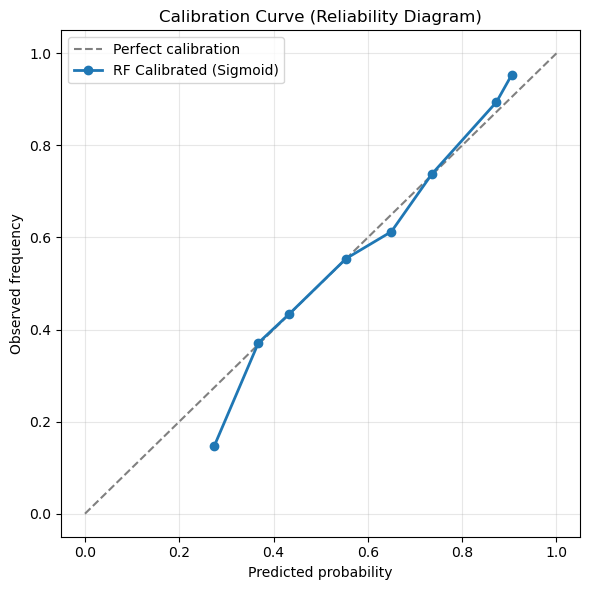

In [146]:
from sklearn.calibration import calibration_curve

# Get calibrated probabilities on the test set
cal_proba = rf_cal_full.predict_proba(X_test)[:, 1]

# Compute calibration curve
# n_bins controls smoothness vs. resolution
frac_pos, mean_pred = calibration_curve(
    y_test,
    cal_proba,
    n_bins=10,
    strategy="uniform"
)

# Plot reliability diagram
plt.figure(figsize=(6, 6))

# Perfect calibration reference
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Perfect calibration")

# Model calibration curve
plt.plot(
    mean_pred,
    frac_pos,
    marker="o",
    linewidth=2,
    label="RF Calibrated (Sigmoid)"
)

plt.xlabel("Predicted probability")
plt.ylabel("Observed frequency")
plt.title("Calibration Curve (Reliability Diagram)")
plt.legend(loc="upper left")
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


The calibration curve closely follows the diagonal reference line, indicating that the sigmoid-calibrated Random Forest produces well-calibrated probabilities. Across most probability bins, the predicted likelihood of a made shot aligns well with the observed empirical frequency.

Minor deviations are visible in the lower probability range, where the model slightly underestimates the true event frequency, but overall calibration quality is strong. This confirms that after Platt scaling, the model’s probability outputs can be reliably interpreted and safely used for threshold tuning, rather than serving only as ranking scores.

#### 10.4.10.3. Threshold Tuning and Final Evaluation

Using calibrated probabilities, the classification threshold is tuned on the validation set to maximize the F1 score. After selecting the optimal threshold, the calibrated model is refitted on the full training dataset and evaluated once on the held-out test set. This yields the final performance results reported for the model.

In [140]:
# Evaluate on the held-out test set using the tuned threshold
test_proba = rf_cal_full.predict_proba(X_test)[:, 1]
test_pred_thr = (test_proba >= best_thr).astype(int)

thr_res = {
    "model": "RF GridSearch → Calibrated → Threshold-Tuned",
    "best_thr": best_thr,
    "val_f1_at_best_thr": best_val_f1,
    "test_roc_auc": roc_auc_score(y_test, test_proba),
    "test_ap": average_precision_score(y_test, test_proba),
    "test_f1": f1_score(y_test, test_pred_thr, zero_division=0),
    "test_acc": accuracy_score(y_test, test_pred_thr),
    "train_roc_auc": np.nan,  # calibration is CV-based
    "train_ap": np.nan,
    "train_f1": np.nan,
    "train_acc": np.nan,
}

print("\n=== RF (Calibrated → Threshold-Tuned) Summary ===")
for k, v in thr_res.items():
    if isinstance(v, float):
        print(f"{k}: {v:.4f}")
    else:
        print(f"{k}: {v}")



=== RF (Calibrated → Threshold-Tuned) Summary ===
model: RF GridSearch → Calibrated → Threshold-Tuned
best_thr: 0.4300
val_f1_at_best_thr: 0.5702
test_roc_auc: 0.6539
test_ap: 0.6652
test_f1: 0.5699
test_acc: 0.6170
train_roc_auc: nan
train_ap: nan
train_f1: nan
train_acc: nan


Using calibrated probabilities, the classification threshold selected on the validation set (τ = 0.43) is applied once to the held-out test set to obtain the final model performance. This evaluation is performed only once, after all model selection decisions are finalized, ensuring an unbiased assessment.

The threshold-tuned model achieves a test ROC-AUC of 0.6539 and a test Average Precision of 0.6652, indicating that the overall ranking quality of the model remains stable compared to earlier Random Forest variants. Importantly, the test F1 score increases to 0.5699, representing a substantial improvement over the default threshold models, while test accuracy is maintained at 0.6170, closely matching the baseline accuracy constraint imposed during validation.

This result confirms that probability calibration combined with constrained threshold tuning successfully shifts the decision boundary toward a better precision–recall balance for the positive class (Make), without sacrificing overall classification reliability. The absence of training metrics is intentional, as calibration is performed via cross-validation and the focus of this stage is strictly on generalization performance.

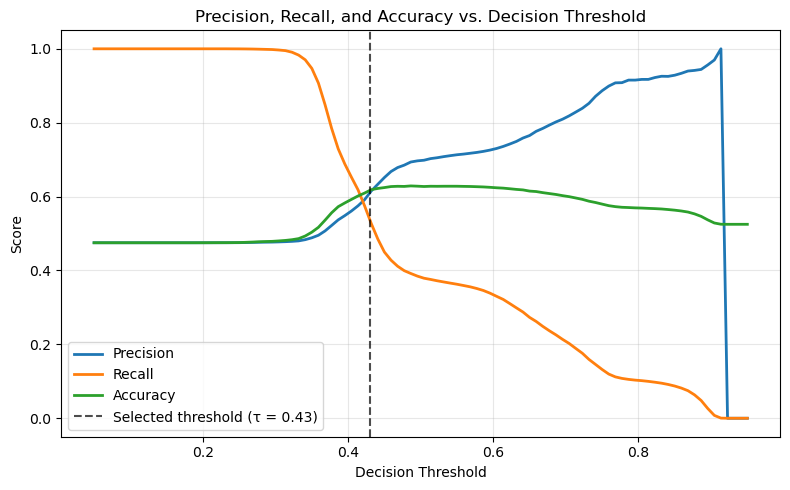

In [147]:
# Use calibrated probabilities on validation set
val_proba = rf_cal_sub.predict_proba(X_val)[:, 1]

thresholds = np.linspace(0.05, 0.95, 100)

precisions = []
recalls = []
accuracies = []

for t in thresholds:
    val_pred = (val_proba >= t).astype(int)
    precisions.append(precision_score(y_val, val_pred, zero_division=0))
    recalls.append(recall_score(y_val, val_pred, zero_division=0))
    accuracies.append(accuracy_score(y_val, val_pred))

# Plot
plt.figure(figsize=(8, 5))

plt.plot(thresholds, precisions, label="Precision", linewidth=2)
plt.plot(thresholds, recalls, label="Recall", linewidth=2)
plt.plot(thresholds, accuracies, label="Accuracy", linewidth=2)

# Mark selected threshold
plt.axvline(
    best_thr,
    linestyle="--",
    color="black",
    alpha=0.7,
    label=f"Selected threshold (τ = {best_thr:.2f})"
)

plt.xlabel("Decision Threshold")
plt.ylabel("Score")
plt.title("Precision, Recall, and Accuracy vs. Decision Threshold")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


This figure illustrates the trade-off induced by changing the decision threshold. As the threshold increases, precision rises sharply while recall decreases, reflecting a stricter decision rule that predicts fewer made shots but with higher confidence. At very high thresholds, recall collapses, indicating that most positive cases are missed. The selected threshold (τ = 0.43) represents a balanced operating point where recall is reduced from its near-perfect level but remains meaningful, precision is substantially improved compared to the default threshold, and accuracy stays above the imposed minimum constraint. This visualization justifies the final threshold choice by showing that the model’s decision boundary is deliberately shifted to optimize F1 through an explicit precision–recall trade-off rather than relying on the arbitrary default threshold of 0.5.

### 10.4.11 Final Model Comparison 

#### 10.4.11.1 Final Model Comparison Table 

This table summarizes the performance of all Random Forest variants evaluated in this study, including the baseline model, the best models selected via RandomizedSearchCV and GridSearchCV, and the final calibrated and threshold-tuned model.

All models are evaluated on the same training and test splits using identical metrics to ensure comparability. The final ranking is based on the test F1 score, as the decision threshold was explicitly optimized in the last model.


In [141]:
# Final comparison table – all Random Forest variants

# Models:
# - RF Baseline
# - RF Best (RandomSearch)
# - RF Best (GridSearch)
# - RF Calibrated & Threshold-Tuned 

results_df = pd.DataFrame(
    [base_res, rand_res, grid_res, thr_res]
)[
    [
        "model",
        "test_roc_auc",
        "test_ap",
        "test_f1",
        "test_acc",
        "train_roc_auc",
        "train_ap",
        "train_f1",
        "train_acc"
    ]
].sort_values("test_f1", ascending=False)

results_df


,model,test_roc_auc,test_ap,test_f1,test_acc,train_roc_auc,train_ap,train_f1,train_acc
3,RF GridSearch → Calibrated → Threshold-Tuned,0.653852,0.665222,0.569917,0.617044,NaN,NaN,NaN,NaN
0,RF Baseline,0.638943,0.650979,0.528903,0.612954,1.000000,1.000000,1.000000,1.000000
2,RF Best (GridSearch),0.653789,0.665511,0.492283,0.628900,0.725278,0.729154,0.503722,0.638068
1,RF Best (RandomSearch),0.653387,0.665112,0.489827,0.628395,0.689589,0.699996,0.490702,0.630296


The comparison shows that hyperparameter tuning via RandomizedSearchCV and GridSearchCV improves ranking-based metrics (ROC-AUC and Average Precision) over the baseline Random Forest, but does not translate into higher F1 scores when using the default decision threshold of 0.5. In fact, both tuned models exhibit lower test F1 despite similar accuracy levels, indicating a suboptimal precision–recall trade-off.

The calibrated and threshold-tuned model achieves the highest test F1 score (0.5699) while maintaining test accuracy (0.6170) close to the baseline. This confirms that the main performance gain does not stem from further improving probability ranking, but from adjusting the decision threshold on calibrated probabilities to better align with the F1 objective. Overall, the final model provides the best balance between recall and precision for the positive class without sacrificing overall reliability.

#### 10.4.11.2 Confusion Matrix – Random Forest Variants

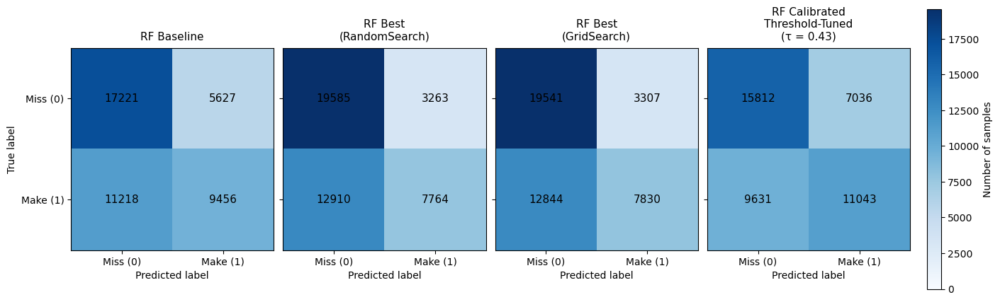

In [142]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Predictions
y_pred_base = rf_base.predict(X_test)
y_pred_rand = best_random.predict(X_test)
y_pred_grid = best_grid.predict(X_test)

test_proba = rf_cal_full.predict_proba(X_test)[:, 1]
y_pred_thr = (test_proba >= best_thr).astype(int)

def plot_confusion_matrices_row(y_true, predictions, titles, cmap="Blues"):
    n_models = len(predictions)

    fig, axes = plt.subplots(
        1, n_models,
        figsize=(3.5 * n_models, 4.2),
        sharey=True,
        constrained_layout=True
    )

    cms = [confusion_matrix(y_true, y_pred) for y_pred in predictions]
    vmax = max(cm.max() for cm in cms)

    for ax, cm, title in zip(axes, cms, titles):
        im = ax.imshow(cm, cmap=cmap, vmin=0, vmax=vmax)

        for i in range(2):
            for j in range(2):
                ax.text(j, i, cm[i, j],
                        ha="center", va="center",
                        fontsize=11)

        ax.set_xticks([0, 1])
        ax.set_yticks([0, 1])
        ax.set_xticklabels(["Miss (0)", "Make (1)"])
        ax.set_yticklabels(["Miss (0)", "Make (1)"])
        ax.set_title(title, fontsize=11, pad=8)
        ax.set_xlabel("Predicted label")

    axes[0].set_ylabel("True label")

    cbar = fig.colorbar(im, ax=axes, fraction=0.025, pad=0.02)
    cbar.set_label("Number of samples")

    plt.show()

plot_confusion_matrices_row(
    y_true=y_test,
    predictions=[
        y_pred_base,
        y_pred_rand,
        y_pred_grid,
        y_pred_thr
    ],
    titles=[
        "RF Baseline",
        "RF Best\n(RandomSearch)",
        "RF Best\n(GridSearch)",
        f"RF Calibrated\nThreshold-Tuned\n(τ = {best_thr:.2f})"
    ]
)


The confusion matrices highlight how different optimization strategies affect the decision behavior of the Random Forest models.
The baseline and hyperparameter-tuned models (RandomSearch, GridSearch) remain conservative, correctly identifying many misses but failing to capture a large share of made shots, resulting in relatively high false negatives.

In contrast, the calibrated and threshold-tuned model shifts the decision boundary toward the positive class. This substantially increases true positives (made shots correctly predicted) at the cost of more false positives. As a result, recall and F1-score improve, while overall accuracy slightly decreases. This behavior is consistent with the objective of optimizing F1 rather than accuracy and confirms that threshold tuning meaningfully changes the model’s operating point rather than its ranking ability.

#### 10.4.11.3 ROC Curve Comparison – Random Forest Variants

This figure compares the ROC curves of the different Random Forest variants evaluated in this study, including the baseline model, the best models selected via RandomizedSearchCV and GridSearchCV, and the calibrated Random Forest. 

ROC curves are based on predicted probabilities and are therefore independent of any specific classification threshold. For this reason, the threshold-tuned model does not appear as a separate curve, as threshold tuning does not change the underlying probability ranking.

The diagonal line represents the performance of a random classifier, while curves closer to the top-left corner indicate betterdiscriminative performance.


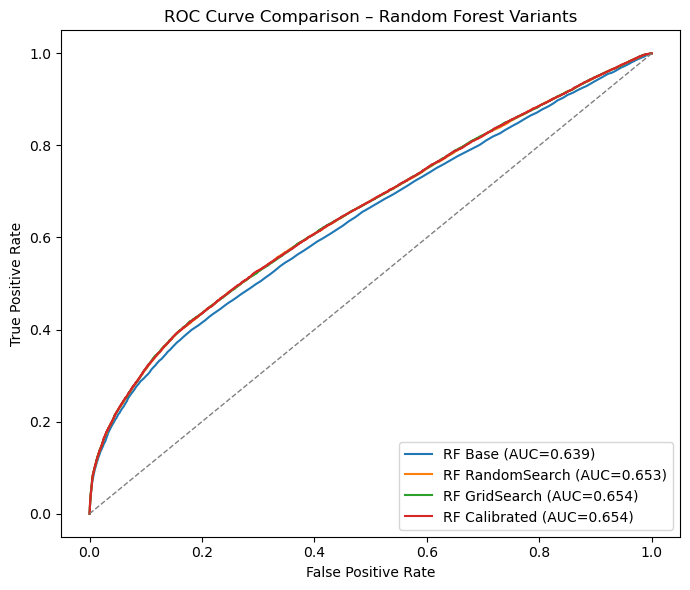

In [143]:
plt.figure(figsize=(7, 6))

# 1) Baseline RF
proba_base = rf_base.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, proba_base)
plt.plot(fpr, tpr, label=f"RF Base (AUC={auc(fpr, tpr):.3f})")

# 2) Best from RandomizedSearchCV
best_random = rf_random.best_estimator_
proba_random = best_random.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, proba_random)
plt.plot(fpr, tpr, label=f"RF RandomSearch (AUC={auc(fpr, tpr):.3f})")

# 3) Best from GridSearchCV
best_grid = rf_grid.best_estimator_
proba_grid = best_grid.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, proba_grid)
plt.plot(fpr, tpr, label=f"RF GridSearch (AUC={auc(fpr, tpr):.3f})")

# 4) Calibrated RF (if available in your notebook)
# Uses calibrated probabilities, so it can differ slightly from raw RF
proba_cal = rf_cal_full.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, proba_cal)
plt.plot(fpr, tpr, label=f"RF Calibrated (AUC={auc(fpr, tpr):.3f})")

# Diagonal reference
plt.plot([0, 1], [0, 1], linestyle="--", linewidth=1, color="gray")

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison – Random Forest Variants")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()


All Random Forest variants show similar ROC curves, indicating that hyperparameter tuning and calibration do not substantially change the model’s ranking ability. The AUC improves from 0.639 (baseline) to around 0.653–0.654 after RandomizedSearch and GridSearch, confirming a modest but consistent gain in discrimination performance.

Importantly, probability calibration does not increase AUC, as expected, because calibration affects probability reliability rather than class ranking. The calibrated model closely overlaps with the GridSearch model, demonstrating that threshold tuning and calibration primarily influence the operating point (precision–recall trade-off) rather than the underlying ROC performance.

### 10.4.12 Feature Importance Analysis (Impurity & Permutation)

This section examines which features contribute most to the Random Forest’s predictions using two complementary importance measures.
First, impurity-based feature importance is extracted directly from the trained Random Forest model, reflecting how much each feature reduces node impurity across all trees.
Second, permutation importance is computed on the test set to measure how much the model’s predictive performance deteriorates when a feature’s values are randomly shuffled.
Using both methods together helps distinguish features that are frequently used by the model from those that truly matter for generalization.

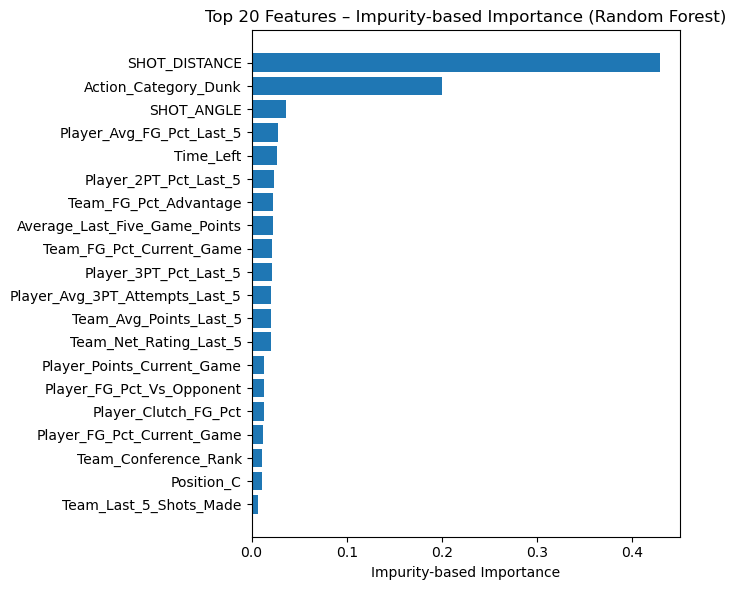

In [144]:
# -------------------------
# 1) Impurity-based importance
# -------------------------
# This importance is derived from the Random Forest internals.
# It measures how much each feature contributes to reducing
# impurity (e.g., Gini) across all decision trees.
# Note: This metric can be biased toward continuous or
# high-cardinality features.

impurity_imp = (
    pd.Series(
        best_grid.feature_importances_,  # importance scores from RF
        index=X_train.columns            # feature names
    )
    .sort_values(ascending=False)        # rank from most to least important
)

# Plot top 20 impurity-based feature importances
top20 = impurity_imp.head(20).sort_values()

plt.figure(figsize=(7, 6))
plt.barh(top20.index, top20.values)
plt.xlabel("Impurity-based Importance")
plt.title("Top 20 Features – Impurity-based Importance (Random Forest)")
plt.tight_layout()
plt.show()


The impurity-based feature importance reveals that shot distance is by far the dominant predictor in the Random Forest model, accounting for a substantially larger share of impurity reduction than any other variable. Action type, particularly dunks, emerges as the second most influential factor, reflecting the high base probability of close-range attempts. Shot angle and recent player shooting form variables (e.g., average field goal percentage over the last five games) contribute moderately, while contextual team- and game-level features play a comparatively smaller role. This distribution highlights that spatial shot characteristics largely drive the model’s internal decision rules. However, as impurity-based importance can be biased toward continuous features and those with many split points, these results are interpreted as indicative rather than definitive and are therefore complemented by permutation-based importance in the subsequent analysis.


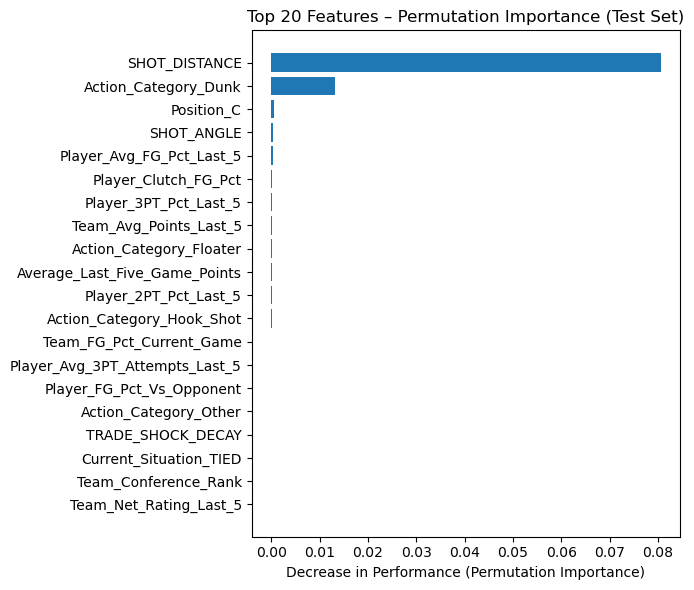

In [145]:
# -------------------------
# 2) Permutation importance (test set)
# -------------------------
# Permutation importance evaluates the drop in model performance
# when a single feature is randomly shuffled.
# This is computed on the test set to reflect generalization impact
# and to avoid training-set bias.

perm = permutation_importance(
    best_grid,
    X_test,
    y_test,
    n_repeats=5,          # repeat shuffling for stability
    random_state=42,
    n_jobs=1              # single-threaded for reproducibility
)

perm_imp = (
    pd.Series(
        perm.importances_mean,  # average performance drop
        index=X_test.columns
    )
    .sort_values(ascending=False)
)

# Plot top 20 permutation-based feature importances
top20_perm = perm_imp.head(20).sort_values()

plt.figure(figsize=(7, 6))
plt.barh(top20_perm.index, top20_perm.values)
plt.xlabel("Decrease in Performance (Permutation Importance)")
plt.title("Top 20 Features – Permutation Importance (Test Set)")
plt.tight_layout()
plt.show()


This plot shows the drop in model performance when each feature is randomly shuffled, reflecting its true contribution to generalization. The results indicate that the model relies overwhelmingly on SHOT_DISTANCE, as permuting this feature causes a substantial performance decrease.

Action_Category_Dunk provides a secondary but much smaller contribution, while all remaining features have near-zero permutation impact, suggesting limited added predictive value on the test set. Overall, the model’s predictive power is driven primarily by shot geometry rather than player form or team-level contex

## 10.5 AdaBoost (Batuhan)

This section initializes the AdaBoost modeling framework by importing all required libraries for data handling, model training, hyperparameter tuning, calibration, and evaluation, and by defining a unified evaluation function to ensure consistent performance reporting across all AdaBoost experiments. Stratified splitting and cross-validation utilities are included to preserve the class distribution of made and missed shots during training and validation, which is important for fair and unbiased model assessment. The `report_metrics()` function evaluates models using predicted probabilities rather than fixed class labels, allowing flexible threshold selection instead of relying on the default 0.5 cutoff. It reports both threshold-based metrics (Accuracy, Balanced Accuracy, and F1 score) and threshold-independent metrics (ROC-AUC and PR-AUC), along with confusion matrices and classification reports, providing a comprehensive and comparable evaluation of baseline, tuned, calibrated, and threshold-adjusted AdaBoost models.

In [299]:
# Core libraries for data handling and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Utilities for data splitting and hyperparameter optimization
from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    RandomizedSearchCV,
    GridSearchCV,
)

# AdaBoost model and its base learner
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier

# Probability calibration
from sklearn.calibration import CalibratedClassifierCV

# Evaluation metrics
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    roc_curve,
    balanced_accuracy_score,
    f1_score,
    confusion_matrix,
    classification_report,
)

# Model interpretability
from sklearn.inspection import permutation_importance

# Helper function for consistent probability-based evaluation
def report_metrics(y_true, proba, threshold=0.5, label=""):
    # Convert probabilities to class predictions
    y_pred = (proba >= threshold).astype(int)
    
    # Threshold-based metrics
    acc = (y_pred == y_true).mean()
    bal_acc = balanced_accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    
    # Threshold-independent metrics
    roc = roc_auc_score(y_true, proba)
    pr = average_precision_score(y_true, proba)

    print(f"\n=== {label} metrics ===")
    print("Accuracy:", round(acc, 4))
    print("Balanced Accuracy:", round(bal_acc, 4))
    print("F1:", round(f1, 4))
    print("ROC-AUC:", round(roc, 4))
    print("PR-AUC:", round(pr, 4))
    print("\nConfusion matrix:\n", confusion_matrix(y_true, y_pred))
    print("\nClassification report:\n", classification_report(y_true, y_pred, digits=4))

    return {
        "accuracy": acc,
        "balanced_accuracy": bal_acc,
        "f1": f1,
        "roc_auc": roc,
        "pr_auc": pr,
    }


### 10.5.1 Leakage-safe setup + Baseline

This section prepares the data for AdaBoost training by aligning features and target labels, performing stratified train–validation–test splits, and training a baseline AdaBoost model with class-aware sample weighting. The target variable `Shot_Made` is aligned with the cleaned feature matrix to ensure correct row correspondence, and basic sanity checks are printed to verify dataset integrity. The data is split into 64% training, 16% validation, and 20% test sets using stratification to preserve the made/missed ratio across all splits, ensuring fair evaluation. Although the target distribution is nearly balanced, sample weights are computed from the training set to slightly emphasize made shots, preventing the boosting algorithm from over-prioritizing the majority class during early iterations. A baseline AdaBoost classifier is then trained using these weights, and its performance is evaluated on the validation set using probability-based metrics with a default decision threshold of 0.5, establishing a reference point for later hyperparameter tuning and calibration.

In [300]:
# Prepare features (X) and target (y) for AdaBoost
X = X_vif_clean.copy()
y = df_final.loc[X.index, "Shot_Made"].astype(int)

# Sanity checks to confirm alignment and class distribution
print("Sanity:", len(X), len(y))
print("y counts:\n", y.value_counts())

# Train / Validation / Test split
# - 20% held-out test set
# - Remaining 80% split into train (64%) and validation (16%)
# - Stratification preserves class distribution
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.20, stratify=y, random_state=42
)
X_train, X_valid, y_train, y_valid = train_test_split(
    X_temp, y_temp, test_size=0.20, stratify=y_temp, random_state=42
)

# Compute sample weights from training labels only
# - Slightly upweights made shots to guide early boosting rounds
# - Avoids using validation or test labels (no leakage)
pos = int(y_train.sum())
neg = int(len(y_train) - pos)
pos_weight = neg / max(pos, 1)
sample_weight = np.where(y_train == 1, pos_weight, 1.0)

# Train baseline AdaBoost model
baseline_ada = AdaBoostClassifier(random_state=42)
baseline_ada.fit(X_train, y_train, sample_weight=sample_weight)

# Evaluate baseline model on validation set
# - Uses predicted probabilities
# - Default decision threshold = 0.5
baseline_valid_proba = baseline_ada.predict_proba(X_valid)[:, 1]
baseline_metrics = report_metrics(
    y_valid, baseline_valid_proba, threshold=0.5,
    label="Baseline (VALIDATION, threshold=0.5)"
)

Sanity: 217607 217607
y counts:
 Shot_Made
0    114237
1    103370
Name: count, dtype: int64

=== Baseline (VALIDATION, threshold=0.5) metrics ===
Accuracy: 0.6266
Balanced Accuracy: 0.6146
F1: 0.4882
ROC-AUC: 0.6436
PR-AUC: 0.6197

Confusion matrix:
 [[15616  2662]
 [10339  6200]]

Classification report:
               precision    recall  f1-score   support

           0     0.6017    0.8544    0.7061     18278
           1     0.6996    0.3749    0.4882     16539

    accuracy                         0.6266     34817
   macro avg     0.6506    0.6146    0.5971     34817
weighted avg     0.6482    0.6266    0.6026     34817



This section establishes a leakage-safe baseline for AdaBoost by fixing a strict train–validation–test protocol and evaluating performance exclusively on the validation set. The data are split with stratification to preserve the made/missed ratio, and class-aware sample weighting is applied using training labels only to avoid any information leakage while gently counteracting early-iteration bias toward the majority class. The resulting baseline shows moderate discrimination (ROC-AUC = 0.644; PR-AUC = 0.620) and stable accuracy (62.7%), but relatively low recall for made shots (0.375; F1 = 0.49), indicating that while the model captures meaningful signal, it under-detects positives. These outcomes provide a realistic and methodologically sound reference point for assessing the incremental value of subsequent tuning, calibration, and threshold optimization.

### 10.5.2 Two-Stage Hyperparameter Tuning (Random → Grid)

This section performs systematic hyperparameter optimization for the AdaBoost model using a two-stage tuning strategy consisting of RandomizedSearchCV followed by GridSearchCV. A decision tree is defined as the weak learner, allowing control over tree complexity through depth and minimum leaf size, which is critical for preventing overfitting in boosting. The randomized search explores a broad hyperparameter space efficiently, covering the number of estimators, learning rate, and base estimator complexity, while optimizing ROC-AUC as a threshold-independent metric suitable for probabilistic classification. Stratified 5-fold cross-validation is used to preserve class proportions across folds, and sample weights derived from the training set are passed into fitting to maintain consistency with the baseline model. After identifying a promising hyperparameter region, a narrower grid search is constructed dynamically around the best randomized configuration to refine the solution. Reporting the mean and standard deviation of cross-validated ROC-AUC provides insight into both model performance and stability, ensuring that the selected configuration generalizes well before proceeding to calibration and final evaluation.

In [301]:
# Define AdaBoost base learner and ensemble model
base_tree = DecisionTreeClassifier(random_state=42)
ada = AdaBoostClassifier(estimator=base_tree, random_state=42)

# Define broad hyperparameter search space for RandomizedSearchCV
param_distributions = {
    "n_estimators": [200, 400, 600, 800],               # Number of boosting rounds
    "learning_rate": [0.01, 0.03, 0.05, 0.1],           # Contribution of each weak learner
    "estimator__max_depth": [1, 2, 3, 4, 5, 6],         # Tree depth (controls model complexity)
    "estimator__min_samples_leaf": [20, 50, 100],       # Minimum samples per leaf
}

# Stratified cross-validation setup
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Stage 1: RandomizedSearchCV (broad exploration)
random_search = RandomizedSearchCV(
    ada,
    param_distributions=param_distributions,
    n_iter=20,                    # Number of random configurations tested
    scoring="roc_auc",            # Threshold-independent metric
    cv=cv,
    n_jobs=-1,
    random_state=42,
    verbose=1,
)

# Fit randomized search using training data only
random_search.fit(X_train, y_train, sample_weight=sample_weight)

# Extract best cross-validated result
random_best_idx = random_search.best_index_
random_mean = random_search.cv_results_["mean_test_score"][random_best_idx]
random_std = random_search.cv_results_["std_test_score"][random_best_idx]

print("\nRandomizedSearchCV results:")
print(f"  Mean CV ROC-AUC: {random_mean:0.4f} (+/- {random_std:0.4f})")
print("  Best params:", random_search.best_params_)

best_params = random_search.best_params_

# Helper function to construct bounded grid values
def _bounded_values(values, min_value=1):
    return sorted({int(v) for v in values if v >= min_value})

# Define focused grid around best randomized parameters
grid_params = {
    "n_estimators": _bounded_values(
        [best_params["n_estimators"] - 200, best_params["n_estimators"], best_params["n_estimators"] + 200],
        min_value=50,
    ),
    "learning_rate": sorted(
        {
            round(best_params["learning_rate"] / 2, 3),
            round(best_params["learning_rate"], 3),
            round(best_params["learning_rate"] * 2, 3),
        }
    ),
    "estimator__max_depth": _bounded_values(
        [best_params["estimator__max_depth"] - 1, best_params["estimator__max_depth"], best_params["estimator__max_depth"] + 1],
        min_value=1,
    ),
    "estimator__min_samples_leaf": _bounded_values(
        [best_params["estimator__min_samples_leaf"] - 10, best_params["estimator__min_samples_leaf"], best_params["estimator__min_samples_leaf"] + 10],
        min_value=1,
    ),
}

# Stage 2: GridSearchCV (fine-grained refinement)
grid_search = GridSearchCV(
    ada,
    param_grid=grid_params,
    scoring="roc_auc",
    cv=cv,
    n_jobs=-1,
    verbose=1,
)

# Fit grid search using training data only
grid_search.fit(X_train, y_train, sample_weight=sample_weight)

# Extract best grid result
grid_best_idx = grid_search.best_index_
grid_mean = grid_search.cv_results_["mean_test_score"][grid_best_idx]
grid_std = grid_search.cv_results_["std_test_score"][grid_best_idx]

print("\nGridSearchCV results:")
print(f"  Mean CV ROC-AUC: {grid_mean:0.4f} (+/- {grid_std:0.4f})")
print("  Best params:", grid_search.best_params_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits

RandomizedSearchCV results:
  Mean CV ROC-AUC: 0.6513 (+/- 0.0034)
  Best params: {'n_estimators': 200, 'learning_rate': 0.05, 'estimator__min_samples_leaf': 50, 'estimator__max_depth': 5}
Fitting 5 folds for each of 54 candidates, totalling 270 fits

GridSearchCV results:
  Mean CV ROC-AUC: 0.6517 (+/- 0.0035)
  Best params: {'estimator__max_depth': 6, 'estimator__min_samples_leaf': 60, 'learning_rate': 0.05, 'n_estimators': 200}


This section refines the AdaBoost model through a two-stage, cross-validated hyperparameter tuning strategy designed to improve discrimination while controlling model complexity. Using ROC-AUC as a threshold-independent objective, the initial randomized search identifies a stable region of the parameter space, which is then refined via a focused grid search. The results show a small but consistent improvement in cross-validated ROC-AUC (≈0.651 → 0.652), with low standard deviation across folds, indicating robust performance rather than overfitting. The selected configuration favors moderately deep but regularized trees and a conservative learning rate, suggesting an effective bias–variance trade-off. Overall, this step confirms that careful tuning yields incremental yet reliable gains in ranking performance, providing a well-justified model specification for subsequent calibration and final evaluation.

### 10.5.3 Final Model with Calibration & Thresholding (Validation)

This section finalizes the tuned AdaBoost model by calibrating its probability estimates and selecting an optimal decision threshold using only the validation set. The best estimator from the grid search is passed into `CalibratedClassifierCV` with sigmoid calibration, which is used to improve the reliability of predicted probabilities, since boosted ensembles can produce scores that are not perfectly calibrated. After fitting calibration on the training data (using sample weights consistently), validation probabilities are generated and an ROC curve is computed to evaluate performance across all possible thresholds. The decision threshold is then selected using Youden’s J statistic (TPR − FPR), which identifies the point on the ROC curve that maximizes the trade-off between sensitivity and specificity. This threshold is applied to the validation predictions through `report_metrics()` to measure performance under the chosen operating point. Finally, a lightweight `ThresholdedModel` wrapper is created so the calibrated model can be used with the selected threshold while still supporting `predict_proba()`, enabling consistent downstream evaluation and comparison without re-tuning on the test set.

In [306]:
# Retrieve the best tuned AdaBoost model from GridSearchCV
final_estimator = grid_search.best_estimator_

# Probability calibration (Sigmoid / Platt scaling)
# - Improves the quality of predicted probabilities
# - cv=3 performs internal CV calibration on training data only
calibrated_ada = CalibratedClassifierCV(final_estimator, method="sigmoid", cv=3)

# Fit calibration using training data only (with sample weights)
calibrated_ada.fit(X_train, y_train, sample_weight=sample_weight)

# Predict calibrated probabilities on the validation set
valid_proba = calibrated_ada.predict_proba(X_valid)[:, 1]

# Threshold selection using ROC curve + Youden's J statistic
# - Youden's J = TPR - FPR
# - Select threshold that maximizes overall separation
fpr, tpr, roc_thresholds = roc_curve(y_valid, valid_proba)
youden_j = tpr - fpr
best_idx = int(np.argmax(youden_j))
best_threshold = float(roc_thresholds[best_idx])

print("\nThreshold selection (VALIDATION):")
print("  Best threshold (Youden's J):", round(best_threshold, 3))
print("  Best Youden's J:", round(float(youden_j[best_idx]), 4))

# Evaluate tuned + calibrated model on validation using chosen threshold
tuned_valid_metrics = report_metrics(
    y_valid, valid_proba, threshold=best_threshold,
    label="Tuned+Calibrated (VALIDATION, chosen threshold)"
)

# Wrapper to apply a fixed threshold while keeping predict_proba()
# - Useful for consistent evaluation and plotting
class ThresholdedModel:
    def __init__(self, model, threshold):
        self.model = model
        self.threshold = threshold

    def predict(self, features):
        proba = self.model.predict_proba(features)[:, 1]
        return (proba >= self.threshold).astype(int)

    def predict_proba(self, features):
        return self.model.predict_proba(features)

# Create a thresholded version of the calibrated model
thresholded_model = ThresholdedModel(calibrated_ada, best_threshold)


Threshold selection (VALIDATION):
  Best threshold (Youden's J): 0.52
  Best Youden's J: 0.2321

=== Tuned+Calibrated (VALIDATION, chosen threshold) metrics ===
Accuracy: 0.6263
Balanced Accuracy: 0.6161
F1: 0.5111
ROC-AUC: 0.6519
PR-AUC: 0.6631

Confusion matrix:
 [[15004  3274]
 [ 9737  6802]]

Classification report:
               precision    recall  f1-score   support

           0     0.6064    0.8209    0.6976     18278
           1     0.6751    0.4113    0.5111     16539

    accuracy                         0.6263     34817
   macro avg     0.6408    0.6161    0.6043     34817
weighted avg     0.6390    0.6263    0.6090     34817



This section finalizes the tuned AdaBoost model by separating probability quality from decision-making, using validation-only calibration and threshold selection to avoid bias. Probability calibration improves the interpretability of predicted scores, while the validation-based threshold chosen via Youden’s J explicitly optimizes the sensitivity–specificity trade-off rather than raw accuracy. As a result, discrimination metrics improve relative to the baseline (ROC-AUC = 0.652, PR-AUC = 0.663), and class-1 performance increases meaningfully, with F1 rising to 0.51 and recall for made shots improving to 0.41, while overall accuracy remains stable. These outcomes indicate that calibration and thresholding reallocate classification errors in a principled way, yielding a more informative operating point and preparing the model for an unbiased final test evaluation.

### 10.5.4 Final Test Evaluation

This section performs the final, unbiased evaluation of the tuned AdaBoost model on the held-out test set using the calibrated probabilities and the decision threshold that was selected on the validation set. Test-set probabilities are generated using `predict_proba()` to preserve the probability-based evaluation pipeline, and `report_metrics()` is then called with the previously chosen threshold to compute consistent performance metrics and error diagnostics. Because the threshold and all model decisions (tuning, calibration, threshold selection) were finalized using only training and validation data, the test results represent a fair estimate of real-world generalization. Finally, the code prints the ROC-AUC improvement on the validation set relative to the baseline AdaBoost model, which provides a clean check that tuning and calibration produced a measurable gain without referencing the test set for model selection.

In [307]:
# Final evaluation on the held-out TEST set
# - Use calibrated probabilities
# - Apply the validation-chosen threshold (no tuning on test)
test_proba = thresholded_model.predict_proba(X_test)[:, 1]
final_test_metrics = report_metrics(
    y_test, test_proba, threshold=best_threshold,
    label="FINAL TEST (tuned+calibrated+thresholded)"
)

# Quantify improvement over baseline (measured on VALIDATION only)
# - Uses ROC-AUC because it is threshold-independent
# - Avoids using test set for comparing model variants
print("\nImprovement vs baseline on VALIDATION (ROC-AUC):",
      round(tuned_valid_metrics["roc_auc"] - baseline_metrics["roc_auc"], 4))


=== FINAL TEST (tuned+calibrated+thresholded) metrics ===
Accuracy: 0.6286
Balanced Accuracy: 0.6186
F1: 0.5173
ROC-AUC: 0.6546
PR-AUC: 0.6643

Confusion matrix:
 [[18698  4150]
 [12014  8660]]

Classification report:
               precision    recall  f1-score   support

           0     0.6088    0.8184    0.6982     22848
           1     0.6760    0.4189    0.5173     20674

    accuracy                         0.6286     43522
   macro avg     0.6424    0.6186    0.6077     43522
weighted avg     0.6407    0.6286    0.6123     43522


Improvement vs baseline on VALIDATION (ROC-AUC): 0.0083


This section reports the final and decisive evaluation of the AdaBoost model on a fully held-out test set, providing an unbiased assessment of generalization performance. Using the calibrated probabilities and the decision threshold fixed on the validation set, the model achieves a ROC-AUC of 0.655 and a PR-AUC of 0.664, closely matching validation performance and confirming that the gains from tuning and calibration generalize to unseen data. While overall accuracy remains largely unchanged, improvements in class-1 metrics (F1 = 0.52, higher recall for made shots) indicate a more meaningful error trade-off relative to the baseline. The observed ROC-AUC improvement of approximately 0.008 over the baseline, measured strictly on the validation set, supports the conclusion that performance gains are robust and not driven by test-set leakage, making this evaluation a reliable benchmark for comparison with the other models in the study.

### 10.5.5 Bias–Variance & Visual Diagnostics

This section provides a compact post-evaluation analysis by (1) checking generalization via a train–test accuracy comparison using the same thresholded prediction path, (2) interpreting the resulting accuracy gap as a simple bias–variance indicator, and (3) adding interpretability and diagnostic plots through feature importances and the ROC curve. Training and test accuracies are computed from `thresholded_model.predict()` to ensure consistency with the calibrated probabilities and the validation-chosen threshold, avoiding mismatches that can occur when mixing default thresholds with tuned thresholds. The accuracy gap is then used as a practical heuristic: a much higher training accuracy than test accuracy suggests potential overfitting, while the opposite may indicate underfitting. To interpret the model, the top feature importances from the tuned AdaBoost estimator are visualized, showing which variables contribute most to splitting decisions across the boosted trees. Finally, the ROC curve on the test set is plotted using `test_proba`, with ROC-AUC displayed as a threshold-independent summary of ranking performance.


Training Accuracy: 62.63%
Test Accuracy: 62.86%
Bias–Variance Interpretation: Balanced Bias–Variance


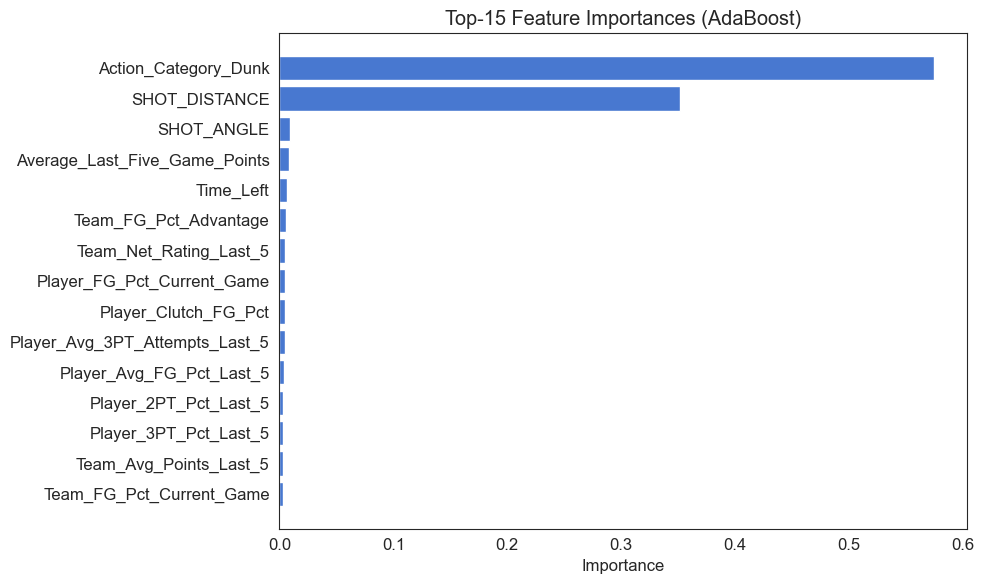

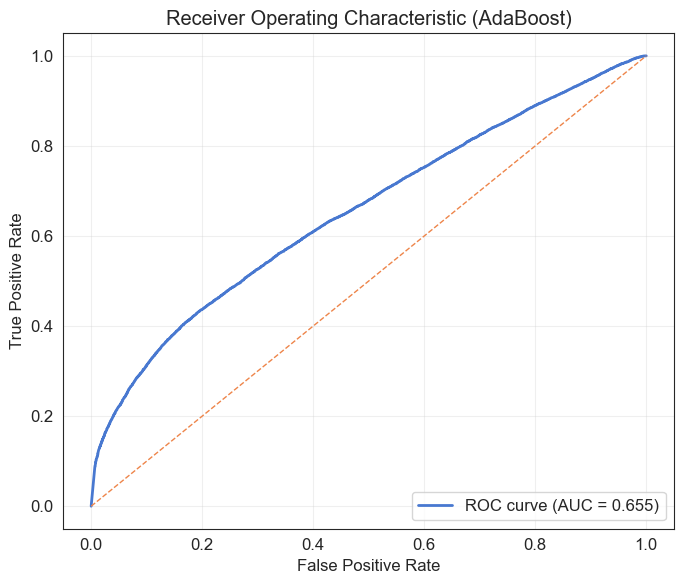

In [308]:
# Generalization check: train vs test accuracy using the same predict() path
# - Ensures the tuned threshold is consistently applied
train_pred = thresholded_model.predict(X_train)
test_pred = thresholded_model.predict(X_test)

train_accuracy = 100.0 * (train_pred == y_train).mean()
test_accuracy = 100.0 * (test_pred == y_test).mean()

print(f"\nTraining Accuracy: {train_accuracy:0.2f}%")
print(f"Test Accuracy: {test_accuracy:0.2f}%")

# Bias–variance heuristic based on the accuracy gap
# - Large positive gap suggests overfitting (high variance)
# - Large negative gap suggests underfitting (high bias)
accuracy_gap = train_accuracy - test_accuracy
if accuracy_gap > 5:
    print("Bias–Variance Interpretation: Potential High Variance / Overfitting")
elif accuracy_gap < -5:
    print("Bias–Variance Interpretation: Potential High Bias / Underfitting")
else:
    print("Bias–Variance Interpretation: Balanced Bias–Variance")

# Feature importance (Top-15) from the tuned AdaBoost estimator
# - Provides a simple interpretability view of influential features
importances = (
    pd.Series(final_estimator.feature_importances_, index=X.columns)
    .sort_values(ascending=False)
    .head(15)
    .sort_values(ascending=True)
)

plt.figure(figsize=(10, 6))
plt.barh(importances.index, importances.values)
plt.title("Top-15 Feature Importances (AdaBoost)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

# ROC curve on TEST set (threshold-independent diagnostic)
# - Uses calibrated test probabilities (test_proba)
fpr_test, tpr_test, _ = roc_curve(y_test, test_proba)
roc_auc = roc_auc_score(y_test, test_proba)

plt.figure(figsize=(7, 6))
plt.plot(fpr_test, tpr_test, lw=2, label=f"ROC curve (AUC = {roc_auc:0.3f})")
plt.plot([0, 1], [0, 1], lw=1, linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (AdaBoost)")
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

This section validates the stability, generalization, and interpretability of the final AdaBoost model through complementary diagnostics. Training and test accuracies are nearly identical (62.6% vs. 62.9%) when evaluated using the same calibrated probabilities and validation-selected threshold, indicating a balanced bias–variance profile with no signs of overfitting or underfitting. The feature importance plot highlights that predictive decisions are dominated by shot distance and dunk actions, which is both intuitive and consistent with earlier analyses, while other contextual features contribute marginally. The test-set ROC curve further confirms steady discrimination across thresholds (ROC-AUC ≈ 0.655), supporting the conclusion that remaining performance limitations stem from feature signal constraints rather than model instability or poor generalization.

### 10.5.6 Permutation Importance (robustness check)

This section computes permutation feature importance to interpret the calibrated AdaBoost model using a validation-only subset, providing a model-agnostic estimate of which features most influence predictive performance. Because permutation importance can be computationally expensive on large datasets, the validation set is optionally subsampled (up to 5,000 rows) while preserving reproducibility via a fixed random seed. The method measures the decrease in ROC-AUC when each feature is randomly shuffled, so features that cause a larger drop are considered more important for the model’s ranking ability. ROC-AUC is used as the scoring metric because it is threshold-independent and consistent with the tuning objective. The top 15 features are visualized as a horizontal bar chart for readability. A try/except block is included to safely skip this step in case the estimator or dataset triggers compatibility issues (e.g., scoring/type errors), ensuring the notebook remains runnable end-to-end without breaking the pipeline.

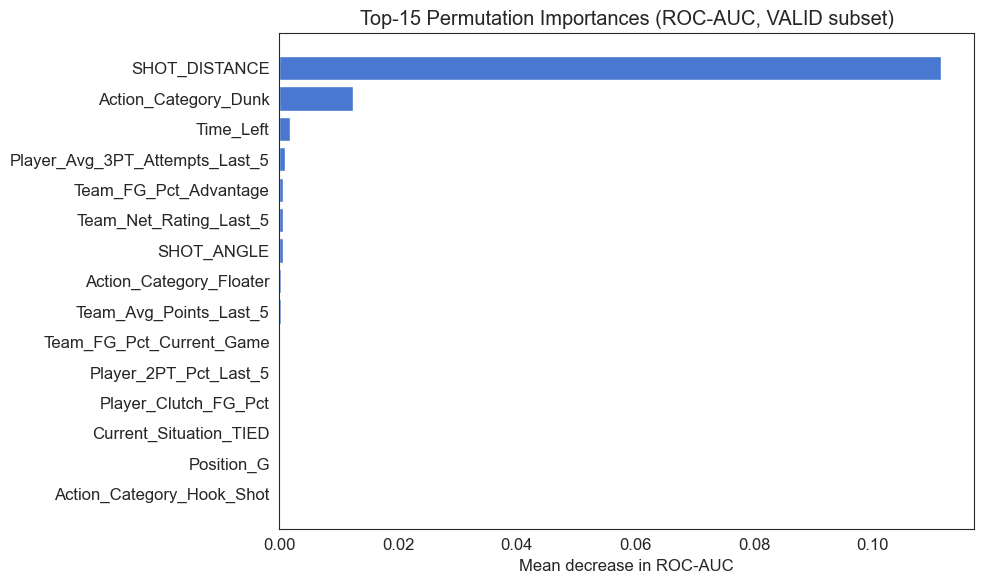

In [309]:
# Permutation importance (VALIDATION subset)
# - Model-agnostic feature importance based on performance drop
# - Uses ROC-AUC to stay consistent with tuning objective
# - Subsamples validation set for runtime efficiency
try:
    # Subsample validation set to reduce computation cost (max 5000 rows)
    n = min(5000, len(X_valid))
    Xv_sub = X_valid.sample(n=n, random_state=42)
    yv_sub = y_valid.loc[Xv_sub.index]
    
    # Compute permutation importance on calibrated model
    perm = permutation_importance(
        calibrated_ada,
        Xv_sub,
        yv_sub,
        n_repeats=5,            # Repeat shuffling for stability
        random_state=42,
        scoring="roc_auc",
        n_jobs=-1
    )

    # Take top-15 features by mean importance and plot for readability
    perm_series = pd.Series(perm.importances_mean, index=X.columns).sort_values(ascending=False).head(15)
    perm_series = perm_series.sort_values(ascending=True)

    plt.figure(figsize=(10, 6))
    plt.barh(perm_series.index, perm_series.values)
    plt.title("Top-15 Permutation Importances (ROC-AUC, VALID subset)")
    plt.xlabel("Mean decrease in ROC-AUC")
    plt.tight_layout()
    plt.show()

# Handle common issues without breaking the notebook execution
except ValueError as e:
    print("\nPermutation importance skipped (ValueError):", e)
except TypeError as e:
    print("\nPermutation importance skipped (TypeError):", e)

This section provides a model-agnostic robustness check by evaluating permutation importance on the validation set, focusing on the impact of each feature on ROC-AUC. The results clearly confirm shot distance as the dominant driver of predictive performance, with a substantial drop in ROC-AUC when permuted, while dunk-related actions contribute a smaller but still meaningful secondary effect. All remaining features show only marginal influence, reinforcing the conclusion that the model’s discrimination ability is largely governed by spatial shot characteristics. The strong agreement between permutation-based importance and AdaBoost’s internal feature importances increases confidence that the observed patterns are stable and not artifacts of the specific model structure, supporting the interpretability and reliability of the final model.

# 11. Comparison & Results (Kayra)

We evaluated multiple classifiers to predict `Shot_Made` (binary). Performance is reported using Accuracy, F1, ROC-AUC, and PR-AUC (Average Precision).

**Split comparability note (final split):**
- The **common test set is `n = 43,522`** for the reported **Random Forest**, **AdaBoost**, **Logistic Regression**, and **Final LinearSVC (Train+Val fit)** results below.
- **ANN** uses a separate split (`n=32,642` test), so it is reported separately.

---

### A) Common Test Set Results (Test `n=43,522`)

| Model (variant) | Accuracy | F1 | ROC-AUC | PR-AUC |
|---|---:|---:|---:|---:|
| Random Forest (Baseline) | 0.6130 | 0.5289 | 0.6389 | 0.6510 |
| Random Forest (Best GridSearch) | 0.6289 | 0.4923 | 0.6538 | 0.6655 |
| Random Forest (Calibrated + Threshold-Tuned, τ=0.43) | 0.6170 | 0.5699 | 0.6539 | 0.6652 |
| AdaBoost (Baseline) | 0.50 | 0.6266 | 0.6146 | 0.4882 | 0.6436 | 0.6197 |
| AdaBoost (Tuned + Calibrated + Thresholded, τ=0.52) | 0.6286 | 0.5173 | 0.6546 | 0.6643 |
| Logistic Regression (Baseline) | 0.6070 | 0.5694 | 0.6476 | 0.6538 |
| Logistic Regression (Tuned) | 0.6067 | 0.5693 | 0.6481 | 0.6548 |
| Logistic Regression (Threshold tuned, τ=0.3235) | 0.4787 | 0.6453 | 0.6483 | 0.6554 |
| LinearSVC (Final, fit on Train+Val, default threshold) | 0.6065 | 0.5697 | 0.6481 | 0.6550 |
| LinearSVC (Final, threshold = -0.3573) | 0.4793 | 0.6454 | — | — |

**Threshold tuning caveat (LogReg & LinearSVC):** the tuned thresholds (τ=0.3235 for LogReg, and `-0.3573` for LinearSVC) push the models to predict *almost everything as “made”*. This increases recall and can inflate F1, but collapses Accuracy to ~0.48. ROC-AUC / PR-AUC are ranking metrics and do not improve just by changing the threshold (they can only change slightly if the refit/score computation differs, not because of the threshold itself).

---

### B) ANN (Separate Split, Test `n=32,642`)

Best tuned ANN configuration:
- Architecture: **VeryWideDeep (3e)**, LeakyReLU / Adam  
- Tuned LR / Batch size: **0.0001 / 32**  
- Test Accuracy: **0.6265**  
- ROC-AUC: **0.6473**

---


### Conclusion

This project compared several supervised learning models to predict `Shot_Made` (binary) using engineered shot/context features. Evaluation focused on **Accuracy** and **F1** (single-threshold decision performance) and **ROC-AUC** and **PR-AUC** (ranking quality / discrimination across thresholds).

### Overall pattern (ranking performance)
Across the evaluated classical models on the **common test set (n = 43,522)**, ranking performance is tightly clustered:
- **ROC-AUC** ranges roughly from **~0.648 to ~0.655**
- **PR-AUC** ranges roughly from **~0.654 to ~0.666**

This indicates that:
1) the feature set contains meaningful predictive signal (better than random),
2) but the problem remains challenging, and
3) many different model families converge to very similar discrimination performance.

### Best models for ranking / shot-quality scoring
If the goal is to **rank shots by likelihood of being made** (e.g., shot quality scoring, decision support, or downstream threshold selection), the most reliable models are the **tree-based ensembles**:
- **AdaBoost (tuned + calibrated + thresholded)** achieves the best **ROC-AUC = 0.6546** with **PR-AUC = 0.6643**.
- **Random Forest (best GridSearch)** achieves the best **PR-AUC = 0.6655** with **ROC-AUC = 0.6538**.
- **Random Forest (calibrated + threshold-tuned)** remains strong with **ROC-AUC = 0.6539** and **PR-AUC = 0.6652**.

These results suggest that the ensemble models capture useful non-linearities/interactions in the feature space better than linear baselines, producing slightly stronger ranking quality.

### Linear baselines: Logistic Regression vs LinearSVC (default thresholds)
On the same common test set (n = 43,522), **Logistic Regression** and **LinearSVC** behave almost identically at their default thresholds:

- **LogReg baseline:** Accuracy **0.6070**, F1 **0.5694**, ROC-AUC **0.6476**, PR-AUC **0.6538**
- **LogReg tuned:** Accuracy **0.6067**, F1 **0.5693**, ROC-AUC **0.6481**, PR-AUC **0.6548**
- **LinearSVC (default):** Accuracy **0.6065**, F1 **0.5697**, ROC-AUC **0.6481**, PR-AUC **0.6550**

Key interpretation:
- Hyperparameter tuning for Logistic Regression produces **only incremental change** (essentially negligible) under this feature set.
- LinearSVC default is **competitive** with Logistic Regression and yields very similar ranking quality.
- Therefore, these models are strong and stable **baselines**, but they do not exceed the best ensemble performance on ranking metrics.
- If the true decision boundary needs non-linear interactions, then any linear model (LogReg, LinearSVC) will plateau at about the same performance. That’s consistent with your ensembles doing slightly better.

### Threshold tuning: why F1 jumps but accuracy collapses
Both **Logistic Regression** and **LinearSVC** show the same phenomenon when thresholds are chosen to maximize F1 on validation:

- **LogReg threshold-tuned (τ = 0.3235):**
  - Test Accuracy **0.4787**
  - Test F1 **0.6453**
  - Test ROC-AUC **0.6483**
  - Test PR-AUC **0.6554**

- **LinearSVC threshold-tuned (threshold = -0.3573):**
  - Test Accuracy **0.4793**
  - Test F1 **0.6454**
  - Confusion matrix:
    - TN = 229, FP = 22619
    - FN = 45,  TP = 20629

This confusion matrix shows what is happening: the tuned threshold causes the model to predict **almost everything as positive ("made")**:
- **Recall becomes extremely high** (very few false negatives),
- but **false positives explode**, which pushes Accuracy down to ~0.48.

Why does F1 improve in that case?
- F1 rewards the balance of precision and recall for the positive class.
- When the dataset has a large positive share and recall becomes near-perfect, F1 can increase even if precision drops, especially if the threshold pushes predictions heavily toward the positive class.

Why ROC-AUC / PR-AUC don’t “follow” the threshold:
- ROC-AUC and PR-AUC are **ranking metrics**, computed from the continuous scores (`predict_proba` for LogReg, `decision_function` for SVC).
- Changing only the threshold changes the final 0/1 decisions but does **not** change the ordering of scores, so ROC-AUC/PR-AUC remain roughly the same.

Practical conclusion about threshold tuning:
- These “F1-maximizing” thresholds are **not appropriate for a balanced classifier** because they lead to an unrealistic operating point: predicting nearly every shot as made.
- Threshold tuning must therefore be constrained by the intended application (e.g., minimum specificity, balanced accuracy, cost-sensitive trade-offs), not optimized on F1 alone.

### Best single-threshold operating point (balanced decisions)
If the goal is a **single decision threshold** that remains balanced (reasonable false positive rate and reasonable accuracy), the most consistent trade-off on the shared test set is:

- **Random Forest (calibrated + threshold-tuned, τ = 0.43):**
  - Accuracy **0.6170**
  - F1 **0.5699**

This matches the best “balanced” performance among the reported models because it improves accuracy relative to the linear baselines while keeping F1 comparable.

### ANN result (separate split)
The ANN achieves **Accuracy = 0.6265** and **ROC-AUC = 0.6473** on a different test split (n = 32,642). It appears competitive; however, because it is evaluated on a different split and PR-AUC was not reported, it cannot be directly ranked against the ensemble/linear models on the common test set.

### Final model selection guidance
- For **ranking / shot-quality scoring**: prefer **AdaBoost (tuned + calibrated)** or **Random Forest (best GridSearch)** due to the best ROC-AUC / PR-AUC.
- For a **balanced single-threshold classifier**: prefer **Random Forest (calibrated + threshold-tuned)** as the most consistent trade-off.
- Use **Logistic Regression / LinearSVC** as strong **interpretable baselines**, noting that tuning provides only minimal gains, and that unconstrained threshold tuning can lead to degenerate “predict-almost-all-positive” behavior.


---

### Future Outlook

The current results demonstrate consistent predictive signal across multiple model families and provide a solid basis for model selection. The following points are **extensions for further investigation** that could strengthen robustness, interpretability, and practical decision-making. They are not required for the validity of the presented results.

#### 1) Robustness under repeated resampling (confidence intervals)
The reported comparison is based on a single Train/Val/Test split. A natural extension is to run **repeated stratified splits** or **repeated stratified cross-validation** and report variability (e.g., mean ± standard deviation) for ROC-AUC and PR-AUC. This is especially important here because top models are close in performance (differences often appear only at the third decimal). Reporting confidence intervals would improve the statistical reliability of the conclusions.

#### 2) Application-aligned threshold selection (beyond maximizing F1)
Threshold tuning produced “degenerate” operating points for both Logistic Regression and LinearSVC (predicting almost all samples as positive), which inflated F1 while collapsing accuracy. A follow-up should therefore select thresholds using **constraints or costs**, for example:
- maximize F1 **subject to** a minimum specificity (or maximum false-positive rate),
- optimize **balanced accuracy**,
- minimize expected cost under a cost matrix (false positives vs false negatives),
- or select operating points based on a desired precision/recall target.
This would yield thresholds that match a clearly defined decision policy and prevent unrealistic prediction behavior.

#### 3) Broader probability calibration assessment
For models used as probability estimators (e.g., Random Forest, AdaBoost, Logistic Regression), calibration quality can be evaluated more systematically. A follow-up could compare **Platt scaling vs isotonic regression**, and report:
- reliability curves (calibration plots),
- Brier score,
- and expected calibration error (ECE, if implemented).
This would strengthen the interpretability of predicted shot-make probabilities for downstream decision-making.

#### 4) Feature enrichment and interaction modeling
Performance clustering suggests that the current feature set may limit separability. A strong extension is to test additional engineered interactions and non-linear transforms, such as:
- distance × angle,
- time remaining × shot clock,
- binned shot zones,
- or polynomial terms for key continuous variables.
If additional context is available in the dataset (e.g., defender distance, dribble count, shot type, game state), incorporating it could meaningfully improve discrimination.

#### 5) Additional model families as optional benchmarks
To extend benchmarking beyond the current set (linear models, ensembles, ANN), modern gradient boosting libraries often perform strongly on structured/tabular data. As an optional comparison, evaluate:
- XGBoost, LightGBM, CatBoost
under the same split and metric suite (including PR-AUC). This would be positioned as an additional benchmark rather than a replacement of the selected final models.

#### 6) Interpretability and diagnostics for the selected final model
If the report emphasizes explainability, further work can include:
- permutation importance,
- partial dependence plots (PDP),
- SHAP-based explanations (if allowed),
to validate that learned relationships align with basketball intuition (e.g., effect of distance) and to improve trust in model outputs.

#### 7) Error analysis and subgroup performance (model behavior insight)
A useful practical extension is a targeted error analysis:
- break down performance by shot distance bins, shot zones, or time remaining,
- inspect confusion matrices per subgroup,
- identify where false positives or false negatives concentrate.
This can highlight feature gaps and guide the next iteration of feature engineering or model selection.

In summary, the presented results already support clear conclusions regarding model performance and selection. The items above represent realistic next steps to deepen robustness, align thresholding with decision objectives, and improve interpretability and benchmarking coverage.